
# Framing the Problem
The two questions addresssed by the analysis presented in the notebook are - 1) "can the production of any of these 51 cytokines be predicted from image embeddings alone?" and 2) "which feature selection methods are most succesful for these predictions?" 

The questions themselves requires more context, so please read this section if you are curious about it. 

First of all, what is a cytokine? A cytokine is a protein molecule produced and excreted by a cell to signal various messages to other cells. To collect and analyze cytokines, supernatant liquid is removed from incubating cells and the individual proteins in the liquid are quantified. Cytokines are important because they tell biologists what activities a group of cells has been performing.

Secondly, imaging is performed with a high-content microscope to capture images of cells and their organelles. The organelles are visualized by staining them with fluorescent dyes of various colors. This particular data concerns a stain called Concanavilin A, which stains the cell membrane. Visualizing the cell membrane allows biologists to observe the overall shape and size of the cell. These microscopic images are then translated into embeddings which can then be correlated to the cytokine output.

This notebook does not cover the process of generating the embeddings. Briefly, the embeddings were obtained with an open source CNN called EfficientNetV2XLImageNet21, normalized per plate and donor, and simply uploaded as a parquet file into this notebook.

Each "well", or row in the data below, can be though of as its own small experiment. Each well consists of human immune cells which have been plated, incubated, had their supernatant collected, and finally microscopically imaged.

The goal is to predict cytokine response based on image embeddings alone so that the laboratory process of collecting and quantifying the cytokines can be skipped. Basically, instead of only observing size and shape from Concanavilin A staining, can we also infer what activities the cells are doing? (A lengthy biology lesson is avoided here - please feel free to google each predictable cytokine at the end of this notebook to learn what specific activity it represents.)

(I will define "predictable cyotkines" as those whose production can be predicted with at least 0.65 precision and 0.65 recall under at least one feature selection strategy. High precision and recall, as well as the ability to predict numerous cytokines will be considered for the "success" of a feature selection strategy.)

# Collecting the Data
384 wells of human pbmcs were plated.
51 cytokines were quantified for each of these wells. 
Each well was imaged with ConA, which stains cell membranes. 
These microscopic images were analyzed with a CNN to generate 1230 black box features for each cell in the image.
These single cell features were then min/max normalized per human donor and plate. (Only one plate is used in this notebook.)

# Cleaning the Data
The embeddings were then aggregated (via the mean) by well, since cytokine mesaurements are necessarily agregated by the well.
A panel of 51 cytokines was tested for each well. Each of these 51 distributions was transformed into two bins, labelled with integer 1 or 0, to indicate each well as either being a producer (1) or a non-producer (0) for each cyotkine.
Cytokines that had no production in any well were removed from the experiment.


# EDA
The distributions of cytokine production were observed, and as mentioned previously entire cytokines were removed where necessary. It was noted that there are many more non-producing wells than producing for essentially all cyotkines, so a downsampling strategy was employed to remove non-producing wells at random.
The overall size, shape, and structure of the input data was observed and understood.

# Feature Engineering/Selection
Multiple feature selection strategies were employed across the 1230 black box embedding features.
PCA was also employed.

# Modeling
These feature sets were tested on one consistent XGBoost decision tree model to predict cytokine producer status.

# Assessment
Model performances were considered via precision and recall scores and feature selection strategies were compared.
Also, the precision and recall scores were plotted against the number of wells and the number of features to check for evidence of trends. If, for example, there is high correlation between higher scores and higher numbers of wells, that is evidence that it is not that some cytokines are unpredictable but rather that there was not enough data. Or one could phrase that as overfitting to the training set for the cytokines with poor performance. Also, there is an investigation of model complexity (tree depth) and model overall model performance per epoch to observe any evidence of overfitting.

# Spoiler Alert - Results 
Multiple cytokines were shown to be "predictable" (having >0.65 precision and >0.65 recall) across multiple feature selection strategies. There was no particular feature that emerged as most important across multiple feature selection strategies. 

Yes, we can use these ConA embeddings to predict cytokine output for at least some cytokines.
The best feature selection method varies depending on whether you prefer better average precision/recall or more cytokine predictions, as well as how much computing power and time you have on your hands. A feature selection strategy that resulted in a large number of predictable cytokines, good precision and recall scores, and reasonable computing power was Recursive Feature Elimination.

It was observed that there is no need for a depth greater than 3 for the RFEF and PCA features. There is evidence of overfitting for many of the cytokines, but there is no single early stopping point that would universally benefit all of them. Each of the cytokine models would need to be optimized one at a time in a follow up project.


# References
Three outside resources were used in this work.
This page by sklearn lists the feature selection strategies used in this notebook, with the addition of PCA. 
https://scikit-learn.org/stable/modules/feature_selection.html
Code from this post was used/adapted to create more visually appealing confusion matrices.
https://www.kaggle.com/code/mattkibassa/xgbclassifier-and-confusion-matrix
Code from this post was used/adapted to show learning curves and look for evidence of overfitting.
https://machinelearningmastery.com/avoid-overfitting-by-early-stopping-with-xgboost-in-python/



# Import Packages

In [121]:
import os
from typing import Dict, List, Literal, Optional, Sequence, Set

import pandas as pd
import numpy as np
from numpy import count_nonzero
from numpy import random

import matplotlib.pyplot as plt

import logging

from typing import List, Optional, Sequence, Tuple
from typing import List, Sequence
from typing import Dict, List, Tuple
from typing import List, Literal, NamedTuple, Optional

from dataclasses import dataclass

from sklearn.preprocessing import KBinsDiscretizer
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn import preprocessing




from xgboost import XGBClassifier



import altair as alt
from scipy.stats import mannwhitneyu
from scipy import stats
from dataclasses import dataclass
import itertools
from spr_platform.data_pipeline_steps.dataset import (
    AggregateNumericDataset,
    CombineDatasetColumns,
    ConvertDatasetToScikitXY,
    FilterDataset,
    MergeDatasets,
    SplitDataset,
    FillColumnValues,
)

alt.data_transformers.disable_max_rows()

from itertools import cycle

In [18]:
#fix up this package if necessary for reading in parquets
# !pip install fastparquet
# !pip3 uninstall pyarrow
# !pip3 install pyarrow==7.0.0

# Read in data

# Data Cleaning 1

In [3]:
#There are so many features - let's start with just one stain
conaembeds = pd.read_parquet('20221122_pbmcs_plate-13_SingleCellEfficientNetV2XLImageNet21kMinMaxEmbeddings - Concanavalin A-AF633-20221204-1670194870-66729496_features.parquet', engine='pyarrow')
conaembeds
#these are already normalized
#lots and lots and lots of features
#they are being indexed by plate, well, and field but we only have one plate
#the cytokines are only well-indexed
#so let's group these up and take the mean for each embedding



Output_0  Output_1  Output_2  Output_3   
plate    well field row  column                                           
plate-13 A01  f00   1916 52     -0.059361  0.491331 -0.027340 -0.213889  \
                    1460 58     -0.014445  1.019286 -0.031515 -0.166004   
                    544  61     -0.080845  0.256504 -0.048731 -0.129524   
                    225  64     -0.045209  0.359745 -0.044401 -0.043139   
                    175  64      0.478619  0.432928 -0.031833 -0.148429   
...                                   ...       ...       ...       ...   
         P24  f03   1217 2042   -0.062614  1.089836 -0.026465 -0.085548   
                    64   2053    0.516341  0.247797 -0.034460 -0.201337   
                    2007 2063    0.227666 -0.022256 -0.190944 -0.214225   
                    1140 2093   -0.027194  0.400349 -0.030040 -0.222789   
                    188  2111   -0.037600  0.297345 -0.019867 -0.206923   

                                 Output_4  Output_5  Output_6  Output_7   
plate    well field row  column                                           
plate-13 A01  f00   1916 52      4.373125 -0.133843 -0.135638 -0.005967  \
                    1460 58      4.969889 -0.067024 -0.112048 -0.022392   
                    544  61      3.980898 -0.104997 -0.148444  0.147525   
                    225  64      3.939051 -0.129746  0.017837  0.119623   
                    175  64      4.104396 -0.079566 -0.164585 -0.040335   
...                                   ...       ...       ...       ...   
         P24  f03   1217 2042    2.877230 -0.113161 -0.079362 -0.041296   
                    64   2053    4.379820 -0.136006  0.013148  0.122940   
                    2007 2063    2.221107 -0.055630 -0.148233  0.170513   
                    1140 2093    4.051991 -0.112054 -0.066530 -0.041435   
                    188  2111    3.119351 -0.032260 -0.130142 -0.016676   

                                 Output_8  Output_9  ...  Output_1270   
plate    well field row  column                      ...                
plate-13 A01  f00   1916 52      0.556239 -0.051998  ...    -0.106363  \
                    1460 58      0.205033 -0.098054  ...     0.005023   
                    544  61      0.807088 -0.162772  ...    -0.193046   
                    225  64      0.895391 -0.103673  ...     0.485225   
                    175  64      0.701440 -0.095219  ...    -0.060335   
...                                   ...       ...  ...          ...   
         P24  f03   1217 2042    0.894407 -0.141363  ...     2.277635   
                    64   2053    0.787381 -0.115078  ...    -0.141674   
                    2007 2063    2.211020 -0.035088  ...    -0.148259   
                    1140 2093    0.143170 -0.085121  ...     0.072098   
                    188  2111    0.776521 -0.129340  ...     0.215729   

                                 Output_1271  Output_1272  Output_1273   
plate    well field row  column                                          
plate-13 A01  f00   1916 52        -0.107267    -0.136706    -0.067570  \
                    1460 58        -0.065542    -0.208429    -0.166011   
                    544  61        -0.110253    -0.126446    -0.189189   
                    225  64        -0.015575    -0.181643    -0.021452   
                    175  64        -0.025494     0.010285    -0.075385   
...                                      ...          ...          ...   
         P24  f03   1217 2042      -0.089138    -0.056948    -0.174840   
                    64   2053      -0.116198    -0.117991    -0.138715   
                    2007 2063      -0.150966    -0.031003    -0.211592   
                    1140 2093       0.039279    -0.098442    -0.098371   
                    188  2111      -0.136234    -0.071065    -0.075342   

                                 Output_1274  Output_1275  Output_1276   
plate    well field row  column                                          
plate-13 A01  f00   

In [10]:
conaembedsgrouped = conaembeds.groupby(by=["well"]).mean()

conaembedsgrouped

,Output_0,Output_1,Output_2,Output_3,Output_4,Output_5,Output_6,Output_7,Output_8,Output_9,...,Output_1270,Output_1271,Output_1272,Output_1273,Output_1274,Output_1275,Output_1276,Output_1277,Output_1278,Output_1279
well,,,,,,,,,,,,,,,,,,,,,
A01,-0.014023,0.415012,-0.016768,-0.104013,3.549480,-0.094241,-0.055584,0.005246,0.544499,0.000923,...,0.223390,-0.043044,-0.038978,-0.010514,0.675088,0.443031,0.690778,-0.084230,0.786897,0.767009
A02,0.019453,0.444380,-0.029527,0.269531,2.221909,-0.112682,-0.024621,-0.018505,0.641719,0.072273,...,0.187920,0.142632,0.035867,0.554693,0.430195,0.263443,0.511171,-0.088937,0.280768,0.594549
A03,-0.024712,0.453696,-0.029638,-0.087462,3.638992,-0.087525,-0.043676,0.026368,0.582807,0.011611,...,0.223035,-0.057943,0.003495,0.005372,0.658752,0.295313,0.881289,-0.090033,0.608988,0.760308
A04,-0.023204,0.481227,-0.028753,-0.078231,3.660372,-0.096248,-0.040833,0.005382,0.538786,0.018362,...,0.260811,-0.042787,0.046423,-0.007430,0.700738,0.325937,0.803479,-0.080207,0.717632,0.722590
A05,-0.036218,0.426916,-0.026591,-0.093860,3.664864,-0.094444,-0.027585,0.010778,0.554009,0.014792,...,0.240105,-0.047876,0.011234,-0.000812,0.657733,0.270577,0.846102,-0.079541,0.630278,0.742615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,-0.032021,0.475880,-0.022764,-0.095370,3.703184,-0.090177,0.018195,0.057526,0.562714,-0.008066,...,0.287720,-0.056529,-0.009163,-0.010600,0.734282,0.286139,0.818435,-0.067835,0.710448,0.803359
P21,-0.029233,0.440091,-0.007722,-0.117669,3.535129,-0.097393,-0.027656,0.059380,0.589516,-0.014677,...,0.276516,-0.037208,-0.029047,-0.000064,0.657467,0.392720,0.658836,-0.069987,0.912165,0.718989
P22,-0.018888,0.425374,-0.029328,-0.069786,3.778533,-0.076956,0.074738,0.108236,0.625393,-0.021928,...,0.318789,-0.048791,-0.030564,-0.023672,0.736881,0.186358,1.139712,-0.046718,0.426272,0.953575


In [4]:
#Now get the cytokine data
cytos = pd.read_parquet('20221122_pbmcs_plate-13_NPlex-20230215-1676500136-845c28be_features.parquet', engine='pyarrow')
cytos

Name           APRIL  Activin A  Amphiregulin      CCL1  CCL19      CCL2   
plate    well                                                              
plate-13 A01     0.0   0.000000           0.0  0.000000    0.0  0.285009  \
         A02     0.0  -0.067838           0.0 -0.023606    0.0  0.567740   
         A03     0.0  -0.067838           0.0 -0.425776    0.0 -0.048456   
         A04     0.0  -0.067838           0.0 -0.383317    0.0 -0.255632   
         A05     0.0  -0.067838           0.0 -0.843527    0.0 -0.278986   
...              ...        ...           ...       ...    ...       ...   
         P20     0.0   0.000000           0.0 -0.871599    0.0 -0.409497   
         P21     0.0   0.000000           0.0 -0.598343    0.0 -0.099939   
         P22     0.0   0.000000           0.0 -0.339549    0.0 -0.359673   
         P23     0.0   0.000000           0.0  0.452103    0.0  0.208030   
         P24     0.0   0.000000           0.0 -0.307138    0.0 -0.305226   

Name              CCL20     CCL22      CCL4      CCL5  ...      IL-6   
plate    well                                          ...             
plate-13 A01   0.000000 -0.153062  0.083232  0.489473  ... -0.017729  \
         A02   0.219657  0.019407  0.206661  0.143474  ...  0.167311   
         A03   0.209128  0.013130  0.207375  0.101785  ... -0.019488   
         A04  -0.035060 -0.221934 -0.039628  0.096787  ...  0.165259   
         A05  -0.035060 -0.053796 -0.072902  0.163701  ... -0.019488   
...                 ...       ...       ...       ...  ...       ...   
         P20   0.083486 -0.235743 -0.192112 -0.121215  ...  0.054511   
         P21   0.000000 -0.046121  0.011949 -0.003756  ... -0.021628   
         P22   0.000000 -0.136543 -0.201684 -0.039288  ...  0.068097   
         P23   0.000000  0.085832  0.724859  0.226745  ...  0.114473   
         P24   0.000000 -0.625128 -0.353661 -0.024394  ...  0.120710   

Name               IL-8     MMP-1     MMP-9  Osteopontin (OPN)  SAA   
plate    well                                                         
plate-13 A01   1.116833  0.040474  0.000000          -0.084642  0.0  \
         A02   0.000000  0.231689 -0.234301          -0.583653  0.0   
         A03   0.000000 -0.050217 -0.287251          -0.371556  0.0   
         A04  -0.231060 -0.138636 -0.287251          -0.583653  0.0   
         A05  -0.320009 -0.197612 -0.287251          -0.583653  0.0   
...                 ...       ...       ...                ...  ...   
         P20  -0.530457 -0.213691 -0.170951          -0.016102  0.0   
         P21  -0.259397 -0.210228 -0.170951          -0.066413  0.0   
         P22  -0.173381 -0.047376 -0.170951          -0.140880  0.0   
         P23   0.592965  0.181616  0.106115           0.022091  0.0   
         P24   0.000000  0.133366 -0.170951          -0.081534  0.0   

Name           TGF-beta 1 (total)   TNF RII  TNF alpha  TRAIL  
plate    well                                                  
plate-13 A01                  0.0  0.054926   0.000000    0.0  
         A02                  0.0  0.023116   0.129036    0.0  
         A03                  0.0 -0.082506   0.235386    0.0  
         A04                  0.0 -0.347032   0.112568    0.0  
         A05                  0.0 -0.283990   0.051664    0.0  
...                           ...       ...        ...    ...  
         P20                  0.0 -0.161013  -0.131680    0.0  
         P21                  0.0 -0.237568  -0.003252    0.0  
         P22                  0.0 -0.187863   0.022256    0.0  
         P23                  0.0  0.030809   0.000000    0.0  
         P24                  0.0 -0.064185  -0.230492    0.0  

[384 rows x 51 columns]

In [5]:
#let's drop the unecessary plate index
cytosgrouped = cytos.droplevel("plate")
cytosgrouped

Name,APRIL,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,...,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TGF-beta 1 (total),TNF RII,TNF alpha,TRAIL
well,,,,,,,,,,,,,,,,,,,,,
A01,0.0,0.000000,0.0,0.000000,0.0,0.285009,0.000000,-0.153062,0.083232,0.489473,...,-0.017729,1.116833,0.040474,0.000000,-0.084642,0.0,0.0,0.054926,0.000000,0.0
A02,0.0,-0.067838,0.0,-0.023606,0.0,0.567740,0.219657,0.019407,0.206661,0.143474,...,0.167311,0.000000,0.231689,-0.234301,-0.583653,0.0,0.0,0.023116,0.129036,0.0
A03,0.0,-0.067838,0.0,-0.425776,0.0,-0.048456,0.209128,0.013130,0.207375,0.101785,...,-0.019488,0.000000,-0.050217,-0.287251,-0.371556,0.0,0.0,-0.082506,0.235386,0.0
A04,0.0,-0.067838,0.0,-0.383317,0.0,-0.255632,-0.035060,-0.221934,-0.039628,0.096787,...,0.165259,-0.231060,-0.138636,-0.287251,-0.583653,0.0,0.0,-0.347032,0.112568,0.0
A05,0.0,-0.067838,0.0,-0.843527,0.0,-0.278986,-0.035060,-0.053796,-0.072902,0.163701,...,-0.019488,-0.320009,-0.197612,-0.287251,-0.583653,0.0,0.0,-0.283990,0.051664,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,0.0,0.000000,0.0,-0.871599,0.0,-0.409497,0.083486,-0.235743,-0.192112,-0.121215,...,0.054511,-0.530457,-0.213691,-0.170951,-0.016102,0.0,0.0,-0.161013,-0.131680,0.0
P21,0.0,0.000000,0.0,-0.598343,0.0,-0.099939,0.000000,-0.046121,0.011949,-0.003756,...,-0.021628,-0.259397,-0.210228,-0.170951,-0.066413,0.0,0.0,-0.237568,-0.003252,0.0
P22,0.0,0.000000,0.0,-0.339549,0.0,-0.359673,0.000000,-0.136543,-0.201684,-0.039288,...,0.068097,-0.173381,-0.047376,-0.170951,-0.140880,0.0,0.0,-0.187863,0.022256,0.0


# EDA 1- Confirm Structure

In [6]:
#confirm the index is the well ID
cytosgrouped.index

Index(['A01', 'A02', 'A03', 'A04', 'A05', 'A06', 'A07', 'A08', 'A09', 'A10',
       ...
       'P15', 'P16', 'P17', 'P18', 'P19', 'P20', 'P21', 'P22', 'P23', 'P24'],
      dtype='object', name='well', length=384)

In [7]:
cytosgrouped.describe()

Name,APRIL,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,...,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TGF-beta 1 (total),TNF RII,TNF alpha,TRAIL
count,384.0,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,...,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,384.0,384.000000,384.000000,384.0
mean,0.0,0.033452,0.000911,-0.118987,0.012525,0.060414,0.017532,-0.046192,0.143612,0.039035,...,0.009081,0.023593,0.051277,-0.146184,-0.134540,0.001587,0.0,-0.030936,0.173879,0.0
std,0.0,0.083943,0.010931,0.486813,0.047068,0.417793,0.066449,0.243283,0.419001,0.153203,...,0.121012,0.391792,0.248157,0.122621,0.256024,0.012427,0.0,0.160134,0.401038,0.0
min,0.0,-0.067838,0.000000,-1.380159,0.000000,-1.569811,-0.035060,-0.798957,-0.826410,-0.476731,...,-0.344895,-0.897345,-1.029494,-0.287251,-0.730162,0.000000,0.0,-0.407201,-1.092517,0.0
25%,0.0,0.000000,0.000000,-0.295766,0.000000,-0.158240,0.000000,-0.153062,-0.060594,-0.049207,...,-0.019488,-0.093463,-0.086193,-0.287251,-0.278929,0.000000,0.0,-0.098730,0.000000,0.0
50%,0.0,0.000000,0.000000,-0.036231,0.000000,0.001277,0.000000,-0.019963,0.052831,0.019486,...,-0.017729,0.000000,0.060257,-0.170951,-0.085635,0.000000,0.0,-0.004700,0.079769,0.0
75%,0.0,0.078900,0.000000,0.000000,0.000000,0.204825,0.000000,0.050145,0.184057,0.103522,...,0.069483,0.000000,0.212305,-0.035004,0.046006,0.000000,0.0,0.051832,0.248070,0.0
max,0.0,0.376160,0.173931,1.651367,0.315642,1.991084,0.302515,0.821234,1.776244,0.600177,...,0.368011,1.462593,0.698405,0.323754,0.369649,0.158860,0.0,0.530102,1.797939,0.0


In [8]:
cytosgrouped.shape

(384, 51)

In [11]:
conaembedsgrouped.shape

(384, 1280)

# EDA 2 - Understand and binarize cytokine response distributions

In [12]:
#get the names of all the cytokines


cytosgrouped.columns

Index(['APRIL', 'Activin A', 'Amphiregulin', 'CCL1', 'CCL19', 'CCL2', 'CCL20',
       'CCL22', 'CCL4', 'CCL5', 'CCL8', 'CD14', 'CRP', 'CX3CL1', 'CXCL1',
       'CXCL10', 'CXCL11', 'CXCL13', 'CXCL16', 'CXCL3', 'CXCL4', 'CXCL5',
       'CXCL9', 'G-CSF', 'GM-CSF', 'IFN alpha 2 (alpha 2b)', 'IFN beta',
       'IFN gamma', 'IL-1 RA/RN', 'IL-1 alpha', 'IL-1 beta', 'IL-10',
       'IL-12 p40', 'IL-12 p70', 'IL-15', 'IL-16', 'IL-17A', 'IL-2', 'IL-21',
       'IL-4', 'IL-6 R alpha', 'IL-6', 'IL-8', 'MMP-1', 'MMP-9',
       'Osteopontin (OPN)', 'SAA', 'TGF-beta 1 (total)', 'TNF RII',
       'TNF alpha', 'TRAIL'],
      dtype='object', name='Name')

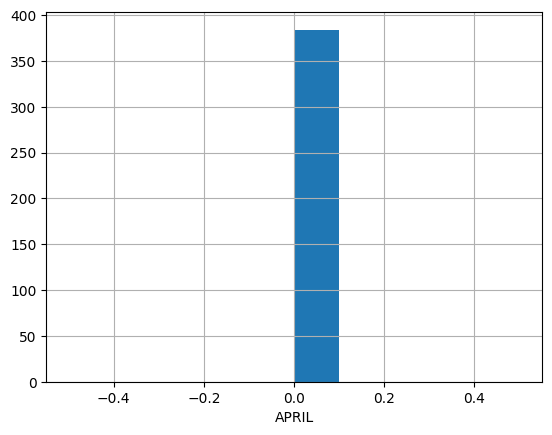

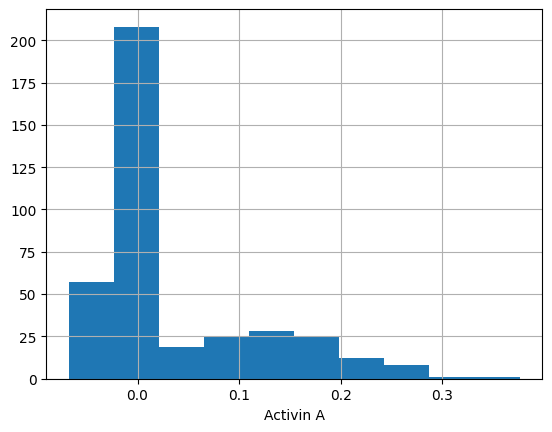

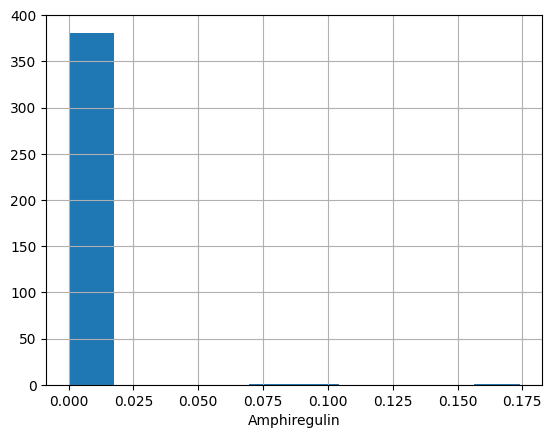

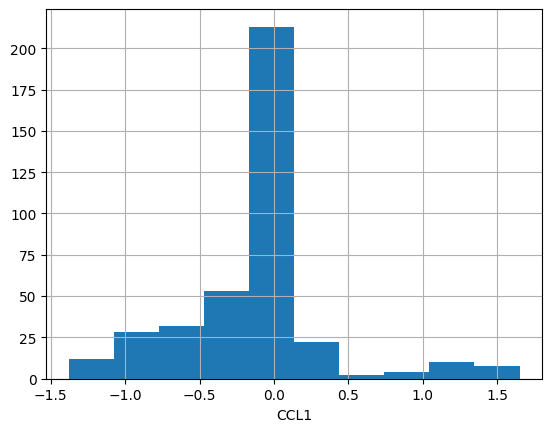

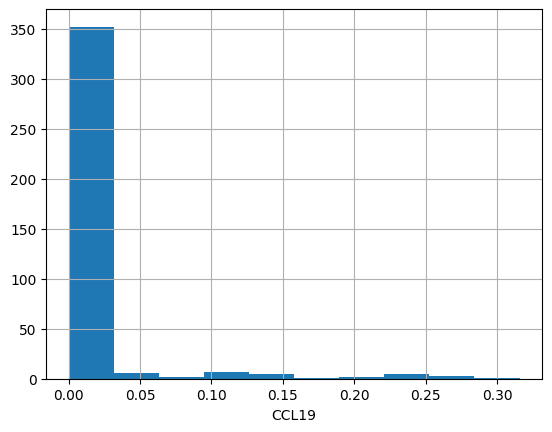

...

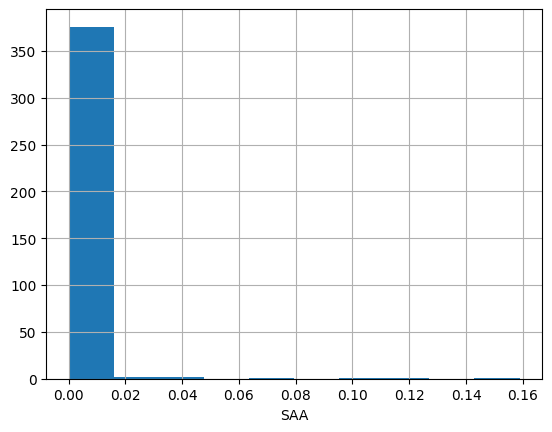

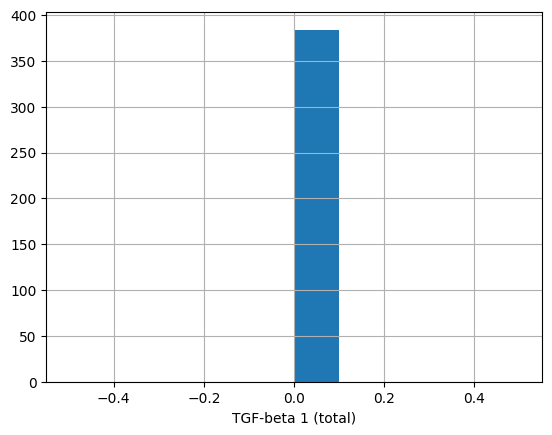

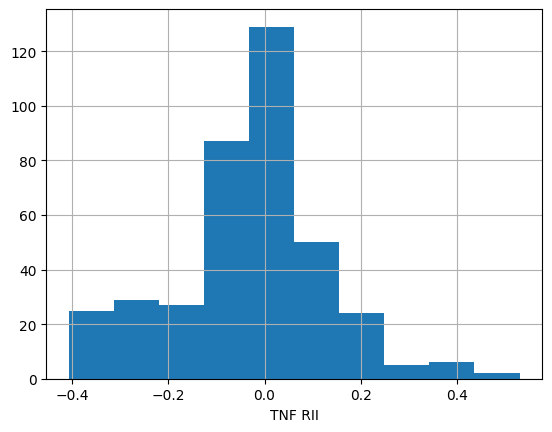

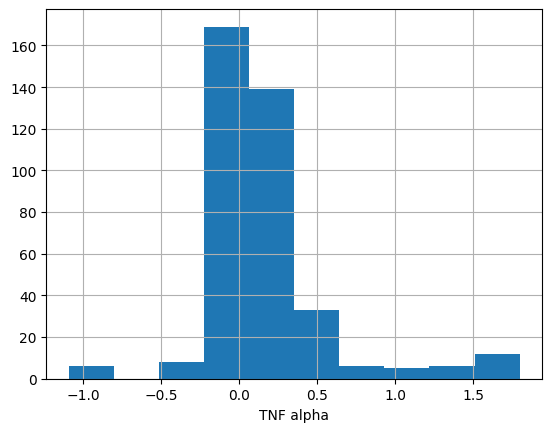

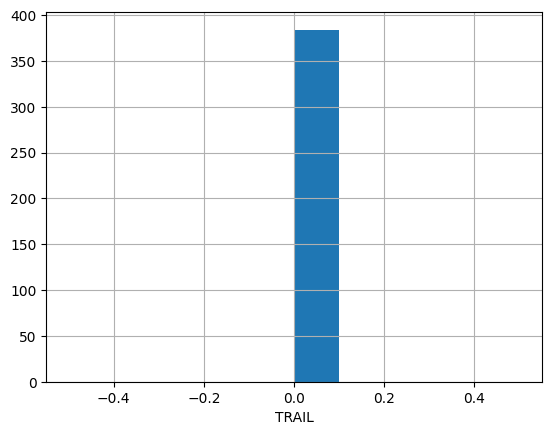

In [13]:
#observe original distribution
cytosgrouped.columns
cytos = ['APRIL', 'Activin A', 'Amphiregulin', 'CCL1', 'CCL19', 'CCL2', 'CCL20',
       'CCL22', 'CCL4', 'CCL5', 'CCL8', 'CD14', 'CRP', 'CX3CL1', 'CXCL1',
       'CXCL10', 'CXCL11', 'CXCL13', 'CXCL16', 'CXCL3', 'CXCL4', 'CXCL5',
       'CXCL9', 'G-CSF', 'GM-CSF', 'IFN alpha 2 (alpha 2b)', 'IFN beta',
       'IFN gamma', 'IL-1 RA/RN', 'IL-1 alpha', 'IL-1 beta', 'IL-10',
       'IL-12 p40', 'IL-12 p70', 'IL-15', 'IL-16', 'IL-17A', 'IL-2', 'IL-21',
       'IL-4', 'IL-6 R alpha', 'IL-6', 'IL-8', 'MMP-1', 'MMP-9',
       'Osteopontin (OPN)', 'SAA', 'TGF-beta 1 (total)', 'TNF RII',
       'TNF alpha', 'TRAIL']

for cyto in cytos:
    cytosgrouped[cyto].hist()
    plt.xlabel(cyto)
    plt.show()

In [14]:
#cytokines to drop because they really have no distribution at all:
dropped = ['APRIL', 'CXCL9', 'IFN alpha 2 (alpha 2b)', 'IFN beta',
           'IFN gamma', 'IL-12 p70', 'IL-17A', 'IL-2', 'IL-21', 'TGF-beta 1 (total)', 'TRAIL']

cytokines = pd.DataFrame(cytosgrouped.drop(columns = dropped))


cytokines

Name,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,CCL8,...,IL-4,IL-6 R alpha,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TNF RII,TNF alpha
well,,,,,,,,,,,,,,,,,,,,,
A01,0.000000,0.0,0.000000,0.0,0.285009,0.000000,-0.153062,0.083232,0.489473,0.0,...,0.0,0.000000,-0.017729,1.116833,0.040474,0.000000,-0.084642,0.0,0.054926,0.000000
A02,-0.067838,0.0,-0.023606,0.0,0.567740,0.219657,0.019407,0.206661,0.143474,0.0,...,0.0,0.143335,0.167311,0.000000,0.231689,-0.234301,-0.583653,0.0,0.023116,0.129036
A03,-0.067838,0.0,-0.425776,0.0,-0.048456,0.209128,0.013130,0.207375,0.101785,0.0,...,0.0,0.045971,-0.019488,0.000000,-0.050217,-0.287251,-0.371556,0.0,-0.082506,0.235386
A04,-0.067838,0.0,-0.383317,0.0,-0.255632,-0.035060,-0.221934,-0.039628,0.096787,0.0,...,0.0,-0.194333,0.165259,-0.231060,-0.138636,-0.287251,-0.583653,0.0,-0.347032,0.112568
A05,-0.067838,0.0,-0.843527,0.0,-0.278986,-0.035060,-0.053796,-0.072902,0.163701,0.0,...,0.0,-0.364235,-0.019488,-0.320009,-0.197612,-0.287251,-0.583653,0.0,-0.283990,0.051664
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,0.000000,0.0,-0.871599,0.0,-0.409497,0.083486,-0.235743,-0.192112,-0.121215,0.0,...,0.0,-0.544379,0.054511,-0.530457,-0.213691,-0.170951,-0.016102,0.0,-0.161013,-0.131680
P21,0.000000,0.0,-0.598343,0.0,-0.099939,0.000000,-0.046121,0.011949,-0.003756,0.0,...,0.0,-0.224143,-0.021628,-0.259397,-0.210228,-0.170951,-0.066413,0.0,-0.237568,-0.003252
P22,0.000000,0.0,-0.339549,0.0,-0.359673,0.000000,-0.136543,-0.201684,-0.039288,0.0,...,0.0,-0.409724,0.068097,-0.173381,-0.047376,-0.170951,-0.140880,0.0,-0.187863,0.022256


/Users/tempestplott/spring-experiments/.venv/lib/python3.8/site-packages/sklearn/preprocessing/_discretization.py:239: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


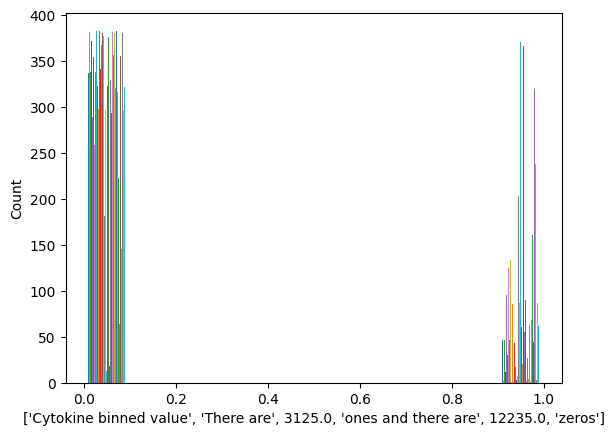

In [15]:
#discretization into two buckets

kbins = KBinsDiscretizer(n_bins=2, encode='ordinal', strategy='uniform')
cytokines_2bin = kbins.fit_transform(cytokines)

#we see with cytokines_2bin.shape that we have 384X40 wells, so that's 15360 total measurements
#which can be 1 or 0

#to list all 1s, we can sum the whole dataframe. We can subtract this value from 15360 to count all the zeros


plt.hist(cytokines_2bin, bins=10)
text = ["Cytokine binned value","There are", cytokines_2bin.sum(), "ones and there are", 15360-cytokines_2bin.sum() ,"zeros"]
plt.xlabel(text)
plt.ylabel("Count")
plt.show()


#There is an overall ~4:1 ratio of 0s to 1s, but it can be much worse within one cytokine

#we should downsample all those negative wells, but first let's get this in a dataframe

In [16]:
#binned things now in their own dataframe
binned = pd.DataFrame(columns = cytokines.columns, data = cytokines_2bin, index = cytokines.index)
binned

Name,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,CCL8,...,IL-4,IL-6 R alpha,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TNF RII,TNF alpha
well,,,,,,,,,,,,,,,,,,,,,
A01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
A02,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
A03,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
A04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
A05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
P21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
P22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [17]:
#make bin categories integers because this helps with some downstream processing

binned = binned.apply(np.int64)

binned

Name,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,CCL8,...,IL-4,IL-6 R alpha,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TNF RII,TNF alpha
well,,,,,,,,,,,,,,,,,,,,,
A01,0,0,0,0,1,0,0,0,1,0,...,0,0,0,1,1,0,1,0,0,0
A02,0,0,0,0,1,1,1,0,1,0,...,0,0,1,0,1,0,0,0,0,0
A03,0,0,0,0,0,1,1,0,1,0,...,0,0,0,0,1,0,0,0,0,0
A04,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
A05,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
P21,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
P22,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,0


In [18]:
binned.to_csv('binned_cytokines.csv', index=True)

# Data Cleaning 2 -  Class balancing
This dataset is so imbalanced that we should make an exception and downsample for the whole dataset rather than within a train/test split.
This is because we can't even use some of the planned dimensionality reduction strategies when the classes are this imbalanced. We must do dimensionality reduction before the train/test split or else the features won't be the same in the train/test split.

In [19]:
#we need so we can loop through all of them
print(binned.columns)

names = ['Activin A', 'Amphiregulin', 'CCL1', 'CCL19', 'CCL2', 'CCL20', 'CCL22',
       'CCL4', 'CCL5', 'CCL8', 'CD14', 'CRP', 'CX3CL1', 'CXCL1', 'CXCL10',
       'CXCL11', 'CXCL13', 'CXCL16', 'CXCL3', 'CXCL4', 'CXCL5', 'G-CSF',
       'GM-CSF', 'IL-1 RA/RN', 'IL-1 alpha', 'IL-1 beta', 'IL-10', 'IL-12 p40',
       'IL-15', 'IL-16', 'IL-4', 'IL-6 R alpha', 'IL-6', 'IL-8', 'MMP-1',
       'MMP-9', 'Osteopontin (OPN)', 'SAA', 'TNF RII', 'TNF alpha']

Index(['Activin A', 'Amphiregulin', 'CCL1', 'CCL19', 'CCL2', 'CCL20', 'CCL22',
       'CCL4', 'CCL5', 'CCL8', 'CD14', 'CRP', 'CX3CL1', 'CXCL1', 'CXCL10',
       'CXCL11', 'CXCL13', 'CXCL16', 'CXCL3', 'CXCL4', 'CXCL5', 'G-CSF',
       'GM-CSF', 'IL-1 RA/RN', 'IL-1 alpha', 'IL-1 beta', 'IL-10', 'IL-12 p40',
       'IL-15', 'IL-16', 'IL-4', 'IL-6 R alpha', 'IL-6', 'IL-8', 'MMP-1',
       'MMP-9', 'Osteopontin (OPN)', 'SAA', 'TNF RII', 'TNF alpha'],
      dtype='object', name='Name')


In [20]:
#the shape of the binned df is also good to know for the following code
binned.shape

(384, 40)

In [137]:
# We can loop through each binned cytokine one at a time, randomly downsampling the nonresponding wells
#and keeping all the responding wells. (discard 0s until they are in a reasonable ratio to the 1s.)
#we can pair those with the embeddings

#set random seed

random.seed(seed = 65)


eachcolumn = range(0, 39, 1)

holdingdfs = []

attachedembeds = []

for item in eachcolumn:
    print(binned.iloc[:,item:item+1])
#get the binned cytokine column and get the name for it from the list above
    one = pd.DataFrame(data = binned.iloc[:,item:item+1], columns = [names[item]])
#keep track of cytokine title
#     cytotitle = one.columns[0]
#grab all the positives from the binning
    two = one[one[one.columns[0]]>0.5]
#grab all the negatives from the beginning
    three = one[one[one.columns[0]]<0.5]
#take random samples of the negatives in a good ratio to the positives
    try:
        three = three.sample(n=len(two)*1.5)
    except:
        try: three = three.sample(n=len(two))
        except:
            try: three = three.sample(n=len(two)*0.75)
            except:
                continue
#put the positives and downsampled negatives back together
    four = pd.concat([two, three])
#add the embeddings using the indices
    attached = four.merge(conaembedsgrouped, left_index=True, right_index=True)
#use this list to keep trach of all the succesfully attached embeddings
    attachedembeds.append(names[item])
#use this list to keep track of all the final dataframes
    holdingdfs.append(attached)

Name  Activin A
well           
A01           0
A02           0
A03           0
A04           0
A05           0
A06           0
A07           0
A08           0
A09           1
A10           0
A11           0
A12           0
A13           0
A14           0
A15           0
A16           0
A17           0
A18           0
A19           0
A20           0
A21           0
A22           0
A23           0
A24           0
B01           0
B02           0
B03           0
B04           0
B05           0
B06           0
B07           0
B08           0
B09           0
B10           0
B11           0
B12           0
B13           0
B14           0
B15           0
B16           0
B17           0
B18           0
B19           0
B20           0
B21           0
B22           0
B23           0
B24           0
C01           0
C02           0
C03           1
C04           0
C05           0
C06           0
C07           0
C08           0
C09           1
C10           0
C11           0
C12           0
C13     

In [138]:
#nice job, this looks like what we wanted to collect for each cytokine!
holdingdfs[1]

,Amphiregulin,Output_0,Output_1,Output_2,Output_3,Output_4,Output_5,Output_6,Output_7,Output_8,...,Output_1270,Output_1271,Output_1272,Output_1273,Output_1274,Output_1275,Output_1276,Output_1277,Output_1278,Output_1279
well,,,,,,,,,,,,,,,,,,,,,
J18,1,0.025678,0.404508,-0.023056,-0.076557,3.104169,-0.089302,-0.022629,0.063530,0.475307,...,0.323384,-0.048399,-0.005379,-0.044947,0.869906,0.377538,0.643363,-0.041520,0.912972,0.873583
J24,1,0.006148,0.405906,-0.016831,-0.101115,3.309290,-0.088620,0.017671,0.077390,0.531338,...,0.344880,-0.055355,-0.025263,-0.061960,0.885983,0.324270,0.710343,-0.020462,0.854891,0.808480
O20,0,-0.000164,0.435534,-0.027792,-0.100359,3.484310,-0.091544,-0.028601,0.078052,0.470021,...,0.304219,-0.056931,-0.001822,-0.028114,0.823550,0.219385,0.835014,-0.055870,0.762185,0.848028
L08,0,-0.009303,0.401087,-0.035426,-0.073780,3.560254,-0.085285,-0.024104,0.048157,0.537394,...,0.310600,-0.037150,0.024730,-0.003728,0.730815,0.295649,0.796542,-0.084157,0.547114,0.886562


In [139]:
#let's note how long each of them are and see if there are any we should drop for tinyness
counting = pd.DataFrame(columns = ["Index", "Length", "Cytokine"])
for i in range(len(holdingdfs)):
    x = [i, len(holdingdfs[i]), holdingdfs[i].columns[0]]
    counting.loc[len(counting.index)] = x
counting


,Index,Length,Cytokine
0,0,94,Activin A
1,1,4,Amphiregulin
2,2,92,CCL1
3,3,24,CCL19
4,4,190,CCL2
5,5,60,CCL20
6,6,250,CCL22
7,7,92,CCL4
8,8,266,CCL5
9,9,2,CCL8


In [140]:
#We should delete those cytokines which ended up with less than 10 rows because we can't realistically use them 
#in modeling

grabber = counting[counting["Length"]<10]

grabber.index
grabber["Cytokine"].unique()

# to_delete = [1, 9, 12, 15, 23, 25, 27, 32]
to_delete = ['Amphiregulin', 'CCL8', 'CX3CL1', 'CXCL11', 'IL-10', 'IL-15',
       'IL-4', 'SAA']


In [141]:
holdingdfs2 = holdingdfs.copy()
for i in range(len(holdingdfs2)):
    try:
        if holdingdfs2[i].columns[0] in to_delete:
            holdingdfs2.pop(i)
    except:
        continue


#this gives an error without the try/except when it is done removing since we used pop, but it does succesfully
#remove the 8 cytokines
#note the new counting output below

In [142]:
#let's note how long each of them are and confirm we dropped the tiny dataframes
counting = pd.DataFrame(columns = ["Index", "Length", "Cytokine"])
for i in range(len(holdingdfs2)):
    x = [i, len(holdingdfs2[i]), holdingdfs2[i].columns[0]]
    counting.loc[len(counting.index)] = x
counting


,Index,Length,Cytokine
0,0,94,Activin A
1,1,92,CCL1
2,2,24,CCL19
3,3,190,CCL2
4,4,60,CCL20
5,5,250,CCL22
6,6,92,CCL4
7,7,266,CCL5
8,8,122,CD14
9,9,172,CRP


# Feature Selection/ Engineering

In [28]:
#first we must include this code so that sklearn does not output zillions of "future version deprecation"
#warnings and crash the notebook
def warn(*args, **kwargs):
    pass
import warnings

warnings.warn = warn

## Variance Thresholding

In [29]:

#Let's start with variance thresholding
#For each cytokine, we will remove features which do not have variance above a specific threshold
# We will see which geatures are left

pd.set_option('display.max_rows', None)

from sklearn.feature_selection import VarianceThreshold

variances = pd.DataFrame(columns = ["Cytokine", "Threshold", "Number of Features", "Features"])

thresholds = [0, 0.1, 0.2, 0.3, 0.4, 0.5]


def variance_threshold_selector(data, threshold):
    selector = VarianceThreshold(threshold)
    selector.fit(data)
    return data[data.columns[selector.get_support(indices=True)]]

for df in holdingdfs2:
    for threshold in thresholds:
        try:
            features = variance_threshold_selector(df.iloc[:,1:], threshold)
            variances.loc[len(variances.index)] = [df.columns[0], threshold, len(features.columns), features.columns.values]
        except:
            continue
variances



,Cytokine,Threshold,Number of Features,Features
0,Activin A,0.0,1280,"[Output_0, Output_1, Output_2, Output_3, Outpu..."
1,Activin A,0.1,17,"[Output_4, Output_49, Output_50, Output_225, O..."
2,Activin A,0.2,4,"[Output_375, Output_521, Output_1230, Output_1..."
3,CCL1,0.0,1280,"[Output_0, Output_1, Output_2, Output_3, Outpu..."
4,CCL1,0.1,47,"[Output_4, Output_42, Output_49, Output_50, Ou..."
5,CCL1,0.2,13,"[Output_49, Output_50, Output_232, Output_375,..."
6,CCL1,0.3,3,"[Output_740, Output_1230, Output_1247]"
7,CCL1,0.4,3,"[Output_740, Output_1230, Output_1247]"
8,CCL19,0.0,1280,"[Output_0, Output_1, Output_2, Output_3, Outpu..."
9,CCL19,0.1,50,"[Output_4, Output_42, Output_49, Output_50, Ou..."


In [30]:
#Looks like a threshold of 0.1 does plenty to minimize the number of features.
#Let's keep those features

variances = pd.DataFrame(columns = ["Cytokine", "Threshold", "Number of Features", "Features"])

threshold =0.1


def variance_threshold_selector(data, threshold):
    selector = VarianceThreshold(threshold)
    selector.fit(data)
    return data[data.columns[selector.get_support(indices=True)]]

for df in holdingdfs2:
    try:
        features = variance_threshold_selector(df.iloc[:,1:], threshold)
        variances.loc[len(variances.index)] = [df.columns[0], threshold, len(features.columns), features.columns.values]
    except:
        continue
variances

,Cytokine,Threshold,Number of Features,Features
0,Activin A,0.1,17,"[Output_4, Output_49, Output_50, Output_225, O..."
1,CCL1,0.1,47,"[Output_4, Output_42, Output_49, Output_50, Ou..."
2,CCL19,0.1,50,"[Output_4, Output_42, Output_49, Output_50, Ou..."
3,CCL2,0.1,81,"[Output_4, Output_31, Output_42, Output_49, Ou..."
4,CCL20,0.1,73,"[Output_4, Output_42, Output_49, Output_50, Ou..."
5,CCL22,0.1,44,"[Output_4, Output_42, Output_49, Output_50, Ou..."
6,CCL4,0.1,12,"[Output_225, Output_232, Output_375, Output_48..."
7,CCL5,0.1,38,"[Output_4, Output_49, Output_50, Output_60, Ou..."
8,CD14,0.1,34,"[Output_4, Output_49, Output_50, Output_120, O..."
9,CRP,0.1,62,"[Output_4, Output_42, Output_49, Output_50, Ou..."


Text(0, 0.5, 'Count')

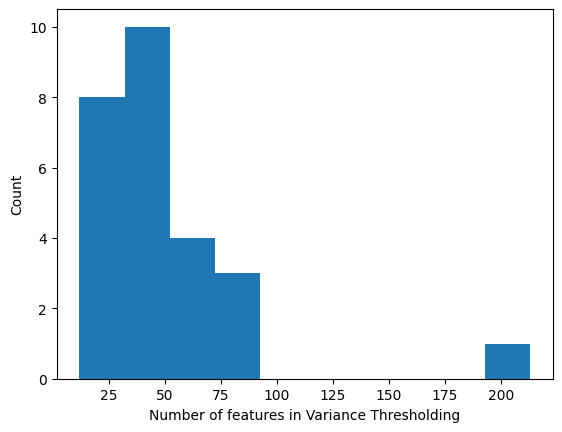

In [31]:
plt.hist(variances["Number of Features"])
plt.xlabel("Number of features in Variance Thresholding")
plt.ylabel("Count")

#Looks like we removed a lot of features this way but still have plenty for
# potential synchronous effects between features

## Univariate Feature Selection

In [32]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
#Let's start with just one feature to quickly see if it matches the single variance thresholded features from above

selector = SelectKBest(f_regression, k=1)

univariates = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

def F_regression_selector(data, target):
    selector.fit(data, target)
    return data[data.columns[selector.get_support(indices=True)]]

for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = F_regression_selector(data = X, target = y)
    univariates.loc[len(univariates.index)] = [df.columns[0], len(output.columns), output.columns.values]

univariates

#For variance thresholding, CCL22 chose only feature 1230 for threshold 0.4.
#This time, it chose feature 161.
#Interesting to note that the feature with highest variation is not the one with the best f_regression score

,Cytokine,Number of Features,Features
0,Activin A,1,[Output_243]
1,CCL1,1,[Output_229]
2,CCL19,1,[Output_678]
3,CCL2,1,[Output_115]
4,CCL20,1,[Output_642]
5,CCL22,1,[Output_161]
6,CCL4,1,[Output_554]
7,CCL5,1,[Output_1090]
8,CD14,1,[Output_505]
9,CRP,1,[Output_86]


In [33]:
#Anyway, let's take the top ten features

selector = SelectKBest(f_regression, k=10)

univariates = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

def F_regression_selector(data, target):
    selector.fit(data, target)
    return data[data.columns[selector.get_support(indices=True)]]

for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = F_regression_selector(data = X, target = y)
    univariates.loc[len(univariates.index)] = [df.columns[0], len(output.columns), output.columns.values]

univariates

,Cytokine,Number of Features,Features
0,Activin A,10,"[Output_200, Output_243, Output_310, Output_33..."
1,CCL1,10,"[Output_86, Output_141, Output_218, Output_229..."
2,CCL19,10,"[Output_78, Output_79, Output_89, Output_125, ..."
3,CCL2,10,"[Output_79, Output_115, Output_162, Output_168..."
4,CCL20,10,"[Output_161, Output_236, Output_376, Output_50..."
5,CCL22,10,"[Output_86, Output_161, Output_180, Output_628..."
6,CCL4,10,"[Output_27, Output_231, Output_386, Output_498..."
7,CCL5,10,"[Output_87, Output_428, Output_529, Output_796..."
8,CD14,10,"[Output_2, Output_44, Output_92, Output_249, O..."
9,CRP,10,"[Output_86, Output_117, Output_136, Output_417..."


## Recursive Feature Elimination - SVR

In [35]:
# This gives different single features again!


from sklearn.svm import SVR
from sklearn.feature_selection import RFE


rfefs = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])


def RFE_ranker(data, target):
# Create the RFE object and rank each feature
# Linear kernel seems to make sense given we have logistic and then binarized 0 and 1
    svr = SVR(kernel="linear", C=1)
    rfe = RFE(estimator=svr, n_features_to_select=1, step=1)
    rfe.fit(data, target)
    return data[data.columns[rfe.get_support(indices=True)]]


for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = RFE_ranker(data = X, target = y)
    rfefs.loc[len(rfefs.index)] = [df.columns[0], len(output.columns), output.columns.values]


rfefs

,Cytokine,Number of Features,Features
0,Activin A,1,[Output_679]
1,CCL1,1,[Output_917]
2,CCL19,1,[Output_201]
3,CCL2,1,[Output_1237]
4,CCL20,1,[Output_539]
5,CCL22,1,[Output_1237]
6,CCL4,1,[Output_545]
7,CCL5,1,[Output_796]
8,CD14,1,[Output_948]
9,CRP,1,[Output_857]


In [153]:
#Now let's take the top ten features for each cytokine

from sklearn.svm import SVR
from sklearn.feature_selection import RFE

rfefs = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])


def RFE_ranker(data, target):
# Create the RFE object and rank each feature
# Linear kernel seems to make sense given we have logistic and then binarized 0 and 1
    svr = SVR(kernel="linear", C=1)
    rfe = RFE(estimator=svr, n_features_to_select=10, step=1)
    rfe.fit(data, target)
    return data[data.columns[rfe.get_support(indices=True)]]


for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = RFE_ranker(data = X, target = y)
    rfefs.loc[len(rfefs.index)] = [df.columns[0], len(output.columns), output.columns.values]


rfefs

,Cytokine,Number of Features,Features
0,Activin A,10,"[Output_12, Output_40, Output_310, Output_384,..."
1,CCL1,10,"[Output_144, Output_276, Output_393, Output_58..."
2,CCL19,10,"[Output_83, Output_91, Output_153, Output_320,..."
3,CCL2,10,"[Output_118, Output_124, Output_192, Output_23..."
4,CCL20,10,"[Output_61, Output_526, Output_582, Output_651..."
5,CCL22,10,"[Output_100, Output_138, Output_169, Output_22..."
6,CCL4,10,"[Output_166, Output_337, Output_363, Output_54..."
7,CCL5,10,"[Output_74, Output_363, Output_473, Output_596..."
8,CD14,10,"[Output_72, Output_92, Output_182, Output_363,..."
9,CRP,10,"[Output_151, Output_262, Output_445, Output_52..."


## L1 Regularization logistic Regression
 L2 cannot be used for feature selection because it does not bring any coefficients to actual 0

In [36]:
#this chooses yet different features again.
#no particular feature is jumping out as important by multiple feature selection methods


from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel



l1s = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

def l1pen(data, target):
    lr =  LogisticRegression(C=0.5, penalty="l1", solver="saga").fit(data,target)
    model = SelectFromModel(lr, prefit=True)
    return data[data.columns[model.get_support(indices=True)]]


for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = l1pen(data = X, target = y)
    l1s.loc[len(l1s.index)] = [df.columns[0], len(output.columns), output.columns.values]



l1s


#This generated a useful number of features, let's keep it as is

,Cytokine,Number of Features,Features
0,Activin A,30,"[Output_24, Output_35, Output_60, Output_118, ..."
1,CCL1,17,"[Output_35, Output_60, Output_232, Output_278,..."
2,CCL19,7,"[Output_343, Output_541, Output_678, Output_74..."
3,CCL2,49,"[Output_4, Output_30, Output_49, Output_100, O..."
4,CCL20,22,"[Output_4, Output_118, Output_340, Output_528,..."
5,CCL22,28,"[Output_118, Output_192, Output_221, Output_25..."
6,CCL4,9,"[Output_75, Output_249, Output_320, Output_457..."
7,CCL5,34,"[Output_4, Output_104, Output_131, Output_221,..."
8,CD14,43,"[Output_30, Output_60, Output_100, Output_158,..."
9,CRP,16,"[Output_118, Output_120, Output_192, Output_22..."


## Use a tree to choose pure features
more pure means more useful for the tree to make decisions

In [37]:
from sklearn.ensemble import ExtraTreesClassifier

def treepick(data, target):
    tp = ExtraTreesClassifier(n_estimators=50)
    tp = tp.fit(X, y)
    model = SelectFromModel(tp, prefit=True)
    return data[data.columns[model.get_support(indices=True)]]

treepicks = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])


for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = treepick(data = X, target = y)
    treepicks.loc[len(treepicks.index)] = [df.columns[0], len(output.columns), output.columns.values]


treepicks

#wow, that is a really large number of features

,Cytokine,Number of Features,Features
0,Activin A,429,"[Output_2, Output_3, Output_8, Output_9, Outpu..."
1,CCL1,467,"[Output_10, Output_16, Output_17, Output_18, O..."
2,CCL19,227,"[Output_3, Output_13, Output_14, Output_22, Ou..."
3,CCL2,490,"[Output_0, Output_1, Output_2, Output_9, Outpu..."
4,CCL20,494,"[Output_2, Output_3, Output_11, Output_12, Out..."
5,CCL22,546,"[Output_0, Output_1, Output_2, Output_4, Outpu..."
6,CCL4,482,"[Output_1, Output_2, Output_4, Output_5, Outpu..."
7,CCL5,565,"[Output_3, Output_5, Output_6, Output_9, Outpu..."
8,CD14,444,"[Output_0, Output_2, Output_6, Output_10, Outp..."
9,CRP,553,"[Output_1, Output_2, Output_5, Output_11, Outp..."


## Sequential to 10 features
## Please read in CSV unless you have a lot of computing power or a lot of time on your hands!
Adds features one at a time.

This block takes a long time to run (~3 hours) because it considers ALL features and then decides which is the best.

In [39]:
from sklearn.feature_selection import SequentialFeatureSelector


def sequential(data, target):
    sfs = SequentialFeatureSelector(LogisticRegression(), n_features_to_select=1, direction='forward', scoring="accuracy")
    sfs.fit_transform(X, y)
    return data[data.columns[sfs.get_support()]]

seqtree = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    try:
        output = sequential(data = X, target = y)
        seqtree.loc[len(seqtree.index)] = [df.columns[0], len(output.columns), output.columns.values]
    except:
        continue



output = sequential(X, y)

output

,Output_1101
well,
A24,0.809037
B01,0.609472
B03,0.593344
B07,0.626231
B11,0.555582
B13,0.563121
C03,0.517261
C07,0.591698
C16,0.549211


In [40]:
seqtree

,Cytokine,Number of Features,Features
0,Activin A,1,[Output_118]
1,CCL1,1,[Output_917]
2,CCL19,1,[Output_1058]
3,CCL2,1,[Output_272]
4,CCL20,1,[Output_1279]
5,CCL22,1,[Output_645]
6,CCL4,1,[Output_1098]
7,CCL5,1,[Output_796]
8,CD14,1,[Output_818]
9,CRP,1,[Output_113]


In [41]:
def sequential(data, target):
    sfs = SequentialFeatureSelector(LogisticRegression(), n_features_to_select=10, direction='forward', scoring="accuracy")
    sfs.fit_transform(X, y)
    return data[data.columns[sfs.get_support()]]

seqtree = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    try:
        output = sequential(data = X, target = y)
        seqtree.loc[len(seqtree.index)] = [df.columns[0], len(output.columns), output.columns.values]
    except:
        continue


seqtree

,Cytokine,Number of Features,Features
0,Activin A,10,"[Output_0, Output_1, Output_2, Output_5, Outpu..."
1,CCL1,10,"[Output_0, Output_2, Output_5, Output_11, Outp..."
2,CCL19,10,"[Output_0, Output_1, Output_2, Output_5, Outpu..."
3,CCL2,10,"[Output_2, Output_5, Output_11, Output_32, Out..."
4,CCL20,10,"[Output_0, Output_2, Output_5, Output_7, Outpu..."
5,CCL22,10,"[Output_21, Output_25, Output_51, Output_81, O..."
6,CCL4,10,"[Output_2, Output_5, Output_11, Output_15, Out..."
7,CCL5,10,"[Output_2, Output_5, Output_21, Output_22, Out..."
8,CD14,10,"[Output_0, Output_2, Output_5, Output_11, Outp..."
9,CRP,10,"[Output_2, Output_8, Output_11, Output_21, Out..."


In [42]:
seqtree.to_csv('seqtree20230817.csv')
#download this because we do not want to have to run this again!

# Read in csv here

In [38]:
#read it back in if necessary
#check that is uploads correctly - you may need to edit the csv to put comments in and stop it from making the ouput
#iDs indiviudal strings
seqtree = pd.read_csv('seqtree20230802.csv')

seqtree

,Unnamed: 0,Cytokine,Number of Features,Features
0,0,Activin A,10,"[Output_2,Output_5,Output_15,Output_21,Output_..."
1,1,CCL1,10,"[Output_2,Output_5,Output_9,Output_21,Output_3..."
2,2,CCL19,10,"[Output_0,Output_1,Output_2,Output_3,Output_5,..."
3,3,CCL2,10,"[Output_2,Output_5,Output_81,Output_272,Output..."
4,4,CCL20,10,"[Output_0,Output_2,Output_3,Output_5,Output_6,..."
5,5,CCL22,10,"[Output_0,Output_5,Output_11,Output_21,Output_..."
6,6,CCL4,10,"[Output_0,Output_2,Output_5,Output_7,Output_9,..."
7,7,CCL5,10,"[Output_2,Output_11,Output_21,Output_25,Output..."
8,8,CD14,10,"[Output_0,Output_1,Output_2,Output_5,Output_6,..."
9,9,CRP,10,"[Output_2,Output_5,Output_11,Output_21,Output_..."


## Use PCA to select ten features

In [143]:
from sklearn.decomposition import PCA

def PCAing(data):
    data2 = data.reset_index()
    x = data2.iloc[:,2:]
    y=data2.iloc[:,1:2]
    principal=PCA(n_components=10)
    principal.fit(x)
    a=principal.transform(x)
    b = pd.DataFrame(a)
    c = pd.concat([y, b], axis=1)
    return c

PCAs = []

for df in holdingdfs:
    try:
        output = PCAing(df)
        PCAs.append(output)
    except:
        continue


PCAs

[    Activin A          0         1         2         3         4         5   
 0           1   0.143779 -1.603492 -1.121083 -1.110724  0.390789  1.071931  \
 1           1  -0.211167 -1.084752  0.070049 -0.621691  0.717072 -0.501088   
 2           1  -0.973819 -0.644990 -0.093657  0.329070 -0.238542 -0.938852   
 3           1  -0.577420  1.663157 -0.281029  0.400447  0.230437 -0.627830   
 4           1  -0.453443 -1.219566  0.401295 -0.303352  0.140452 -1.065230   
 5           1   0.117072 -1.029872  0.214278 -0.684664  0.135405 -0.257074   
 6           1  -0.798564 -1.471825 -1.293494 -0.621206  0.194985 -0.465515   
 7           1   0.385165 -1.684075  1.406600 -0.179227 -0.607258 -0.046234   
 8           1   0.318645 -1.789519  0.156612 -0.763455  0.207564  0.419313   
 9           1  -0.635144 -1.197977  0.003550 -0.281070  0.140589 -0.725039   
 10          1  -0.510809  1.374199  0.293820 -1.393386 -0.048192  0.600802   
 11          1  -0.089887 -1.783118 -0.862265  0.104

In [133]:
PCAs[0]

,Activin A,0,1,2,3,4,5,6,7,8,9
0,1,1.159936,-1.068850,-1.272605,-0.761296,1.331792,-0.716218,0.322559,-0.177428,-0.179363,-0.526110
1,1,0.355470,-0.762323,-0.499016,-0.769982,-0.368270,-0.623542,-0.021567,-0.043472,-0.387652,0.459170
2,1,-0.414147,-0.448810,-0.365645,0.291652,-0.874288,0.016053,0.135817,0.789156,0.477688,0.378473
3,1,-0.610445,1.860367,-0.129718,0.283812,-0.399237,-0.345215,0.464471,-0.174384,0.053530,0.540825
4,1,0.127528,-0.959765,-0.110168,-0.498888,-1.035458,-0.132296,0.249035,0.189682,-0.067223,0.228267
5,1,0.659051,-0.719505,-0.030691,-0.709513,-0.196302,-0.445932,0.348846,-0.002668,0.099088,-0.458685
6,1,0.311705,-0.933089,-1.663670,-0.489913,-0.210388,0.480543,0.176792,0.335391,0.059641,-0.704529
7,1,0.817126,-1.636790,1.266265,-0.197364,-0.209701,-0.670377,-0.142162,0.520460,-0.194209,-0.017650
8,1,1.069012,-1.467014,-0.129637,-0.688078,0.455968,-0.594229,-0.104426,-0.107154,-0.326643,-0.231256
9,1,0.061117,-0.930271,-0.455880,-0.365764,-0.629484,0.094335,0.068636,0.122009,-0.026317,0.005339


# Create Model - 
## Apply all these features sets in an XGBoost classifier and compare performance

In [41]:
#include some code to make a labelled confusion matrix

def confusio_matrix(y_test, preds, target, title):
  cm = confusion_matrix(y_test, preds)
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos
  recall = (cm[1][1])/(cm[1][1] + cm[1][0])  #TruePositives / (TruePositives + FalseNegatives)
  plt.figure(figsize=(15,10))
  plt.clf()
  plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
  classNames = ['Negative','Positive']
  plt.title(title + ' Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  tick_marks = np.arange(len(classNames))
  plt.xticks(tick_marks, classNames, rotation=45)
  plt.yticks(tick_marks, classNames)
  s = [['TN','FP'], ['FN', 'TP']]
  
  for i in range(2):
      for j in range(2):
          plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
  plt.show()
  print(target, "precision", "=", precision,"recall", "=", recall)
  return precision, recall

# Model Assessment

## Performance with variance threshold selected features

In [42]:
## Main result was that cytokine identity is more important for predcitability
## than the number of features chosen with variacne thresholding. 

## Also, not many cytokine predictions perform very well with this feature selection method

# Need to attach the appropriate embeddings columns from the original dataframe for each of these cytokines and methods
#A row should still be a well with the cytokine binary response

#So I will make many dataframes, each cytokine and method will have its own dataframe

#I will run these one feature selection method at a time to avoid making a very long list

#the try except allows us to move past cyotkines that aren't in the variances dataframe

variances_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = variances[variances["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        variances_listing.append(finaldata)
    except:
        continue

variances_listing[0]
    

Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_4,Output_49,Output_50,Output_225,Output_232,Output_375,Output_457,Output_521,Output_541,Output_697,Output_740,Output_889,Output_977,Output_1045,Output_1062,Output_1230,Output_1247
well,,,,,,,,,,,,,,,,,,
A09,1,3.643724,12.856603,1.682781,2.368404,4.213551,1.694614,5.906575,4.193828,1.386319,2.621754,4.610635,5.366742,0.732848,2.196149,5.435206,4.791984,9.698508
C03,1,3.407436,13.097985,1.464344,2.445477,4.311341,1.841523,6.093659,4.077699,1.141615,2.353504,5.015946,5.188824,0.874197,2.147823,5.310091,4.845588,9.747023
C09,1,3.543321,13.322670,1.409809,2.662639,4.312414,1.898477,6.123258,4.123200,1.087492,2.475259,4.953176,4.999307,1.041880,2.528739,5.484000,5.055249,9.995271
C17,1,3.354781,13.332623,1.229148,2.747698,4.007127,2.504305,5.989198,4.247218,1.155411,2.358689,4.754565,4.883633,1.450801,2.667008,5.483769,4.497993,9.738996
F03,1,3.434275,13.176942,1.479425,2.525553,4.429153,1.718199,6.005236,4.163133,1.029267,2.469774,5.074513,5.044232,0.911457,2.236673,5.319995,5.049672,9.907647
F04,1,3.370884,13.116463,1.469406,2.358246,4.162745,1.727650,5.965114,3.996392,1.168321,2.579076,4.756858,5.174560,1.052388,2.149233,5.271667,4.868670,9.908044
F05,1,3.529775,12.923954,1.499304,2.540068,4.496910,1.885762,5.952638,4.430486,1.283484,2.363751,4.684883,5.091262,0.967628,2.470553,5.650256,5.080195,10.008046
F08,1,3.405242,13.245374,1.590458,2.374652,4.300972,1.489847,6.191918,3.675921,0.997425,2.758583,5.154972,5.232982,0.902159,2.115618,5.020236,4.890854,9.939694
F09,1,3.527808,12.985623,1.623173,2.334576,4.269008,1.619484,6.023982,3.963280,1.145990,2.680783,4.889837,5.328274,0.874980,2.169714,5.217725,4.824190,9.768630


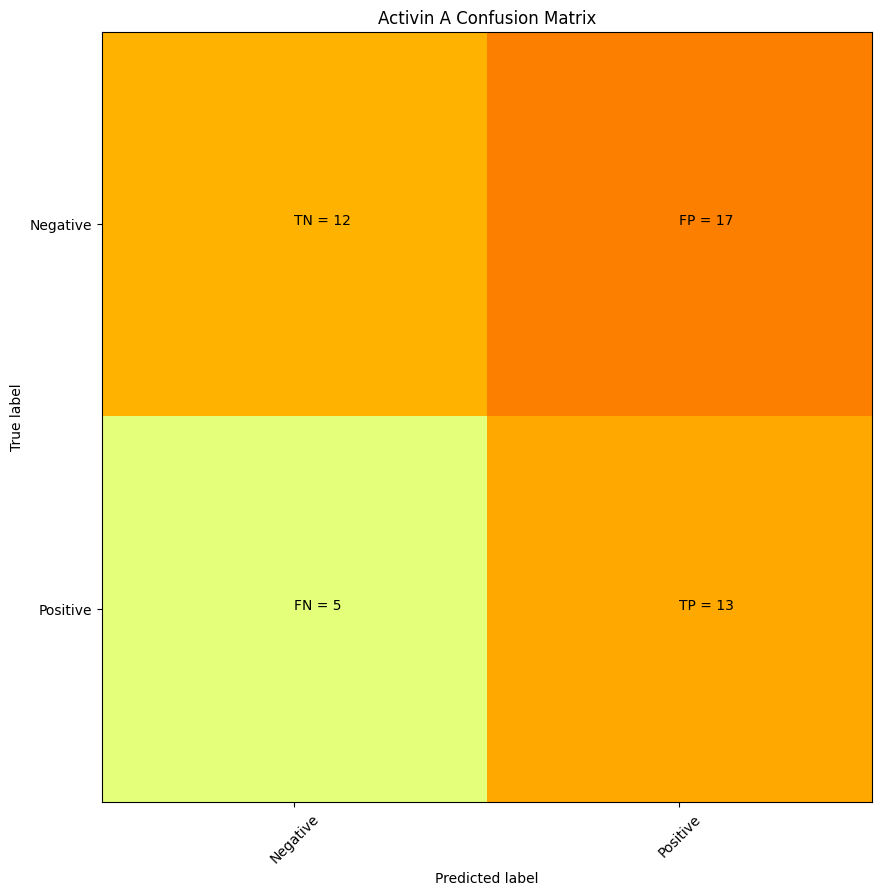

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
M11           0
G23           0
A13           0
D07           0
M10           0
N13           0
N15           0
C01           0
N24           0
I20           0
L19           0
P23           0
L16           0
A16     

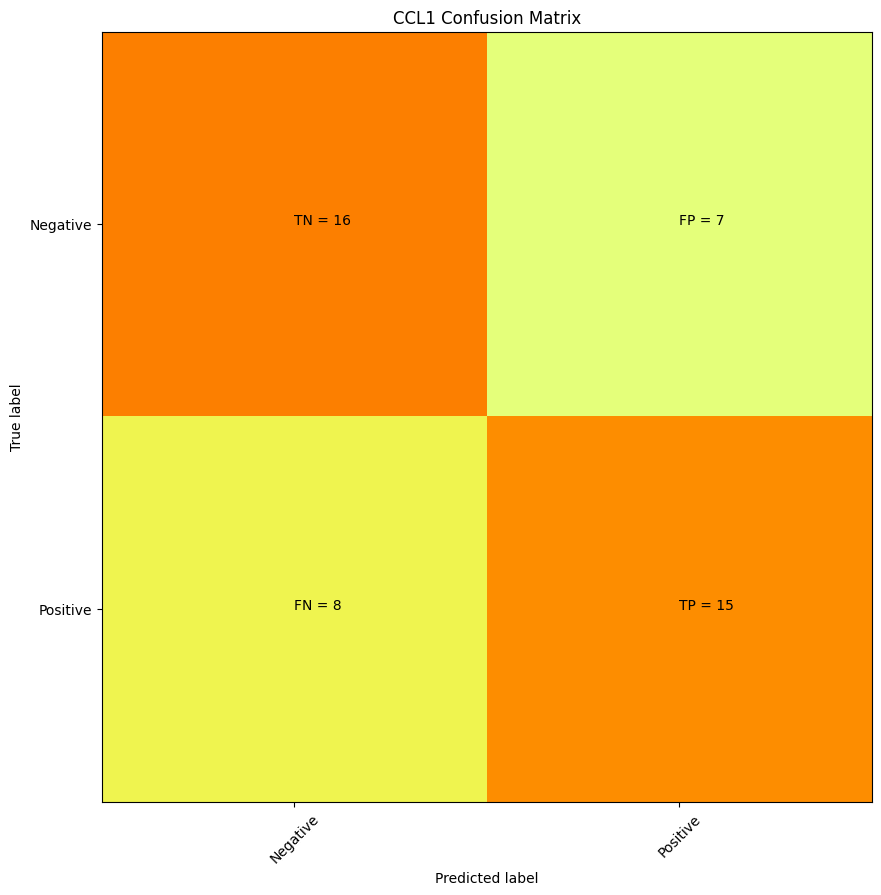

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
L17      0
M21      0
A14      0
G14      0
D11      0
M19      0
E03      0
E17      0
A11      0
G21      0
P16      0
D15      0
M12      0
G06      0
F24      0
N12      0
J15      0
M02      0
K01      0
A22      0
K06      0
G23      0
I13      0
I11      0
N14      0
O16      0
O14      0
B09      0
K11      0
B14      0
K15      0
G08      0
J02      0
O07      0
C23      0
H14      0
C04      0
M04      0
O04      0
K16      0
B05      0
M24      0
I15      0

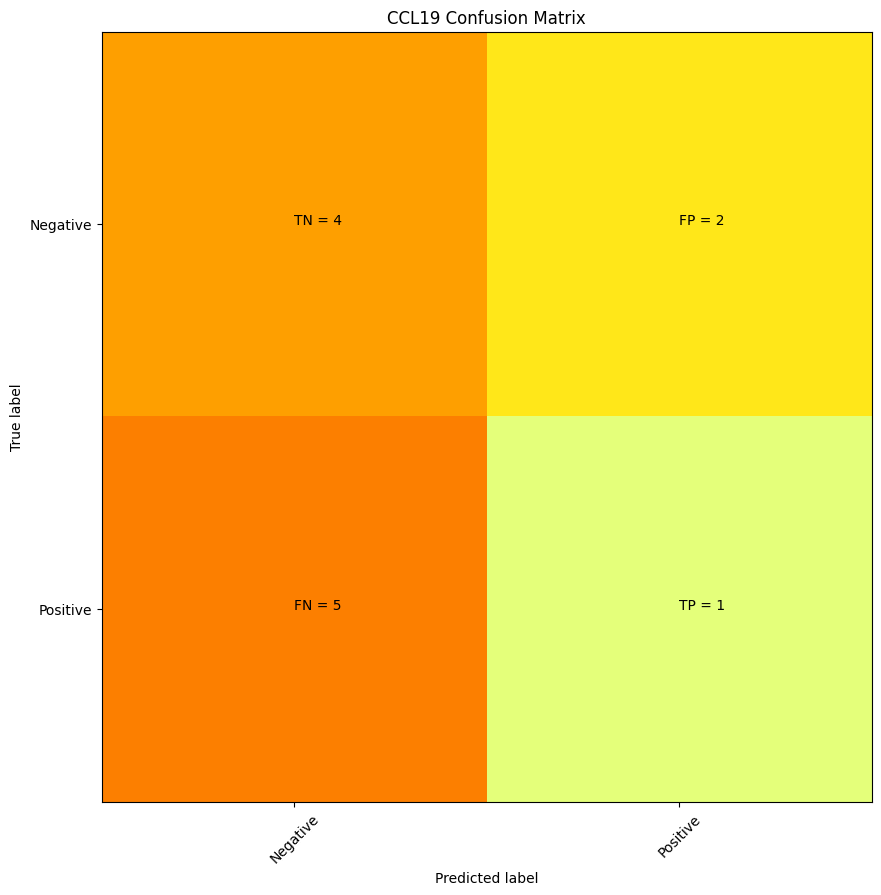

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
F06       0
F23       0
B15       0
B01       0
A09       0
J02       0
P08       0
F19       0
L14       0
F02       0
O19       0
N13       0 precision = 0.3333333333333333 recall = 0.16666666666666666


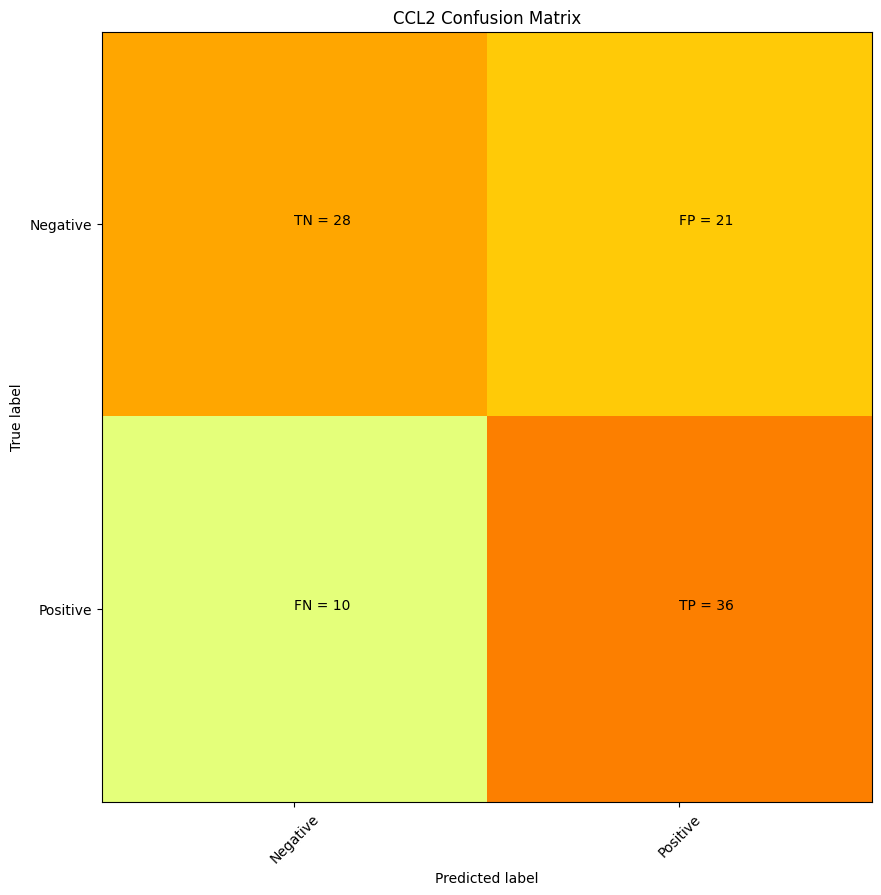

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

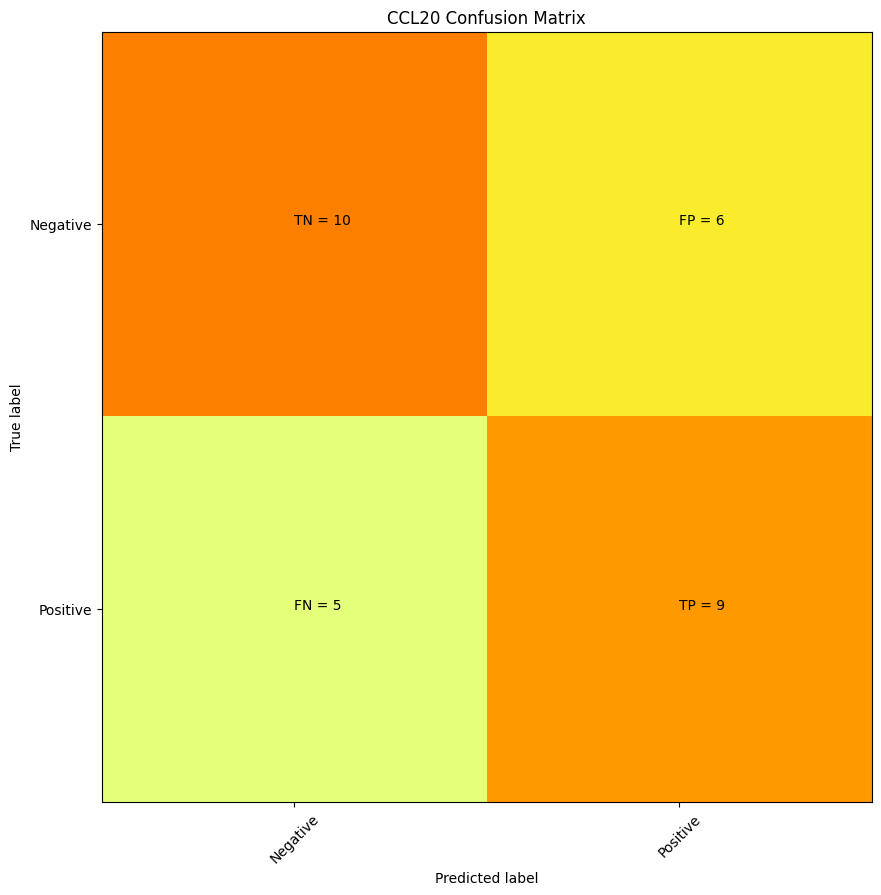

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
I23       0
I17       0
G11       0
J09       0
I19       0
J14       0
E18       0
L05       0
G13       0
L18       0
F22       0
L19       0
J11       0
B12       0
H13       0
J21       0
L17       0
C01       0
N08       0
M04       0
F16       0
I05       0
M07       0
H15       0
P18       0
J06       0
K02       0
H03       0
H01       0
O07       0 precision = 0.6 recall = 0.6428571428571429


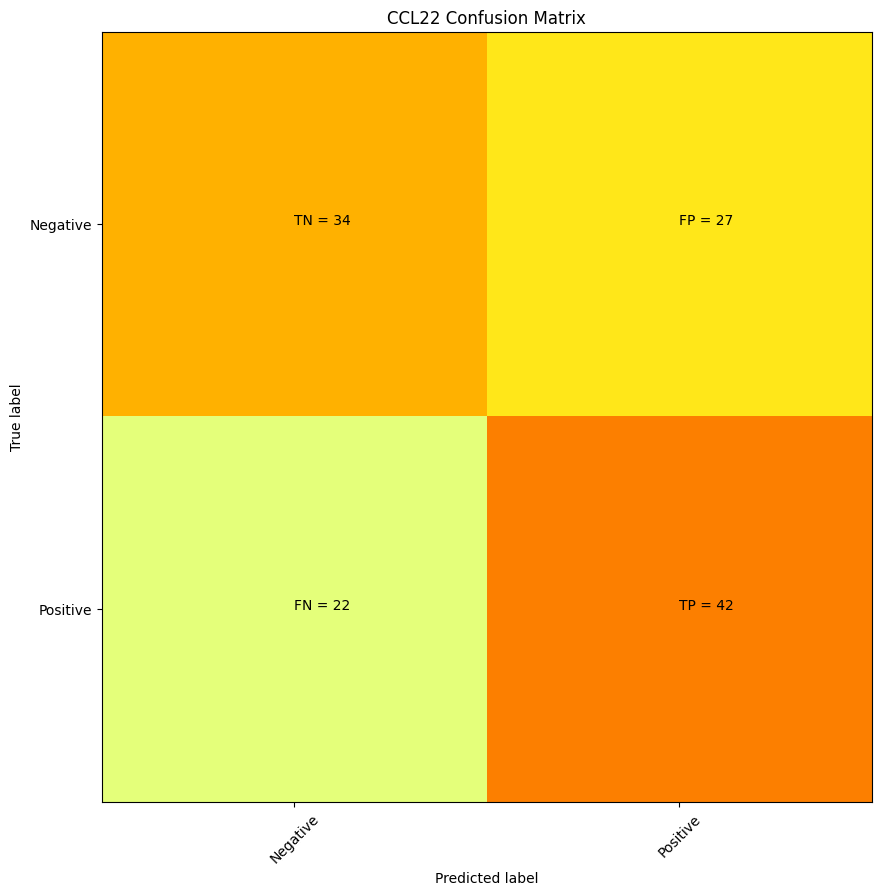

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

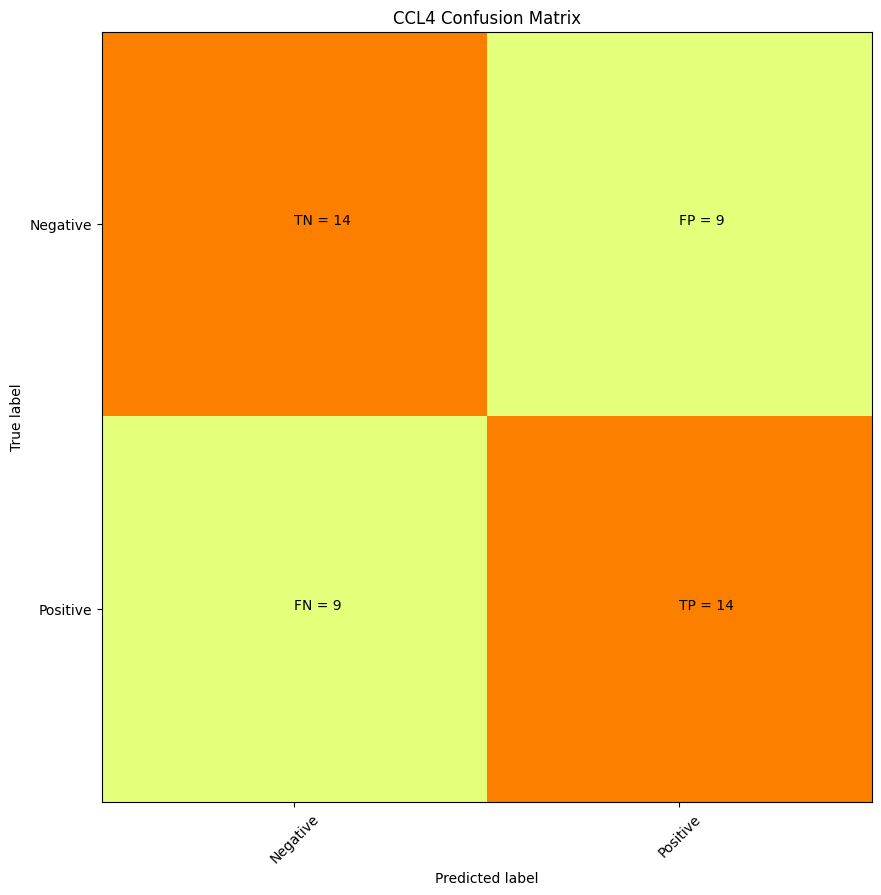

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P12      0
L02      0
K14      0
M20      0
M06      0
P24      0
L03      0
O22      0
F22      0
M08      0
N16      0
H04      0
N15      0
F08      0
M21      0
H10      0
E06      0
D03      0
D09      0
F20      0
C24      0
G01      0
P10      0
H05      0
F03      0
I09      0
N12      0
P16      0
C12      0
M03      0
B15      0
F21      0
B12      0
B14      0
K21      0
G12      0
L15      0
F16      0
C20      0
F17      0
A01      0
D10      0
O23      0

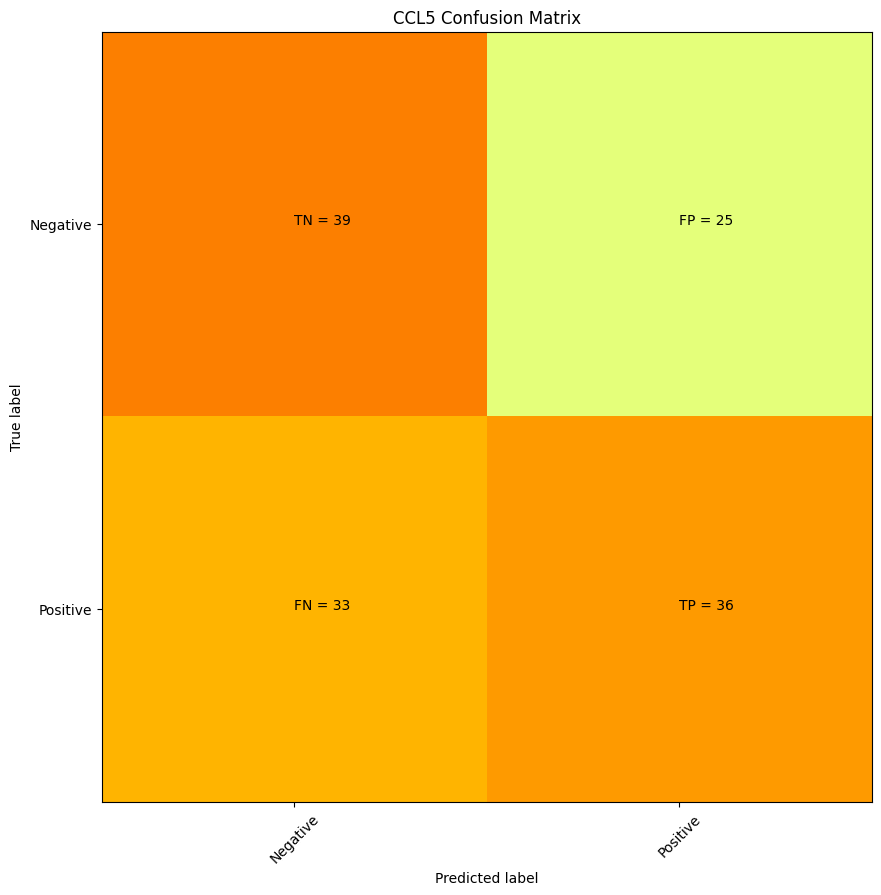

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

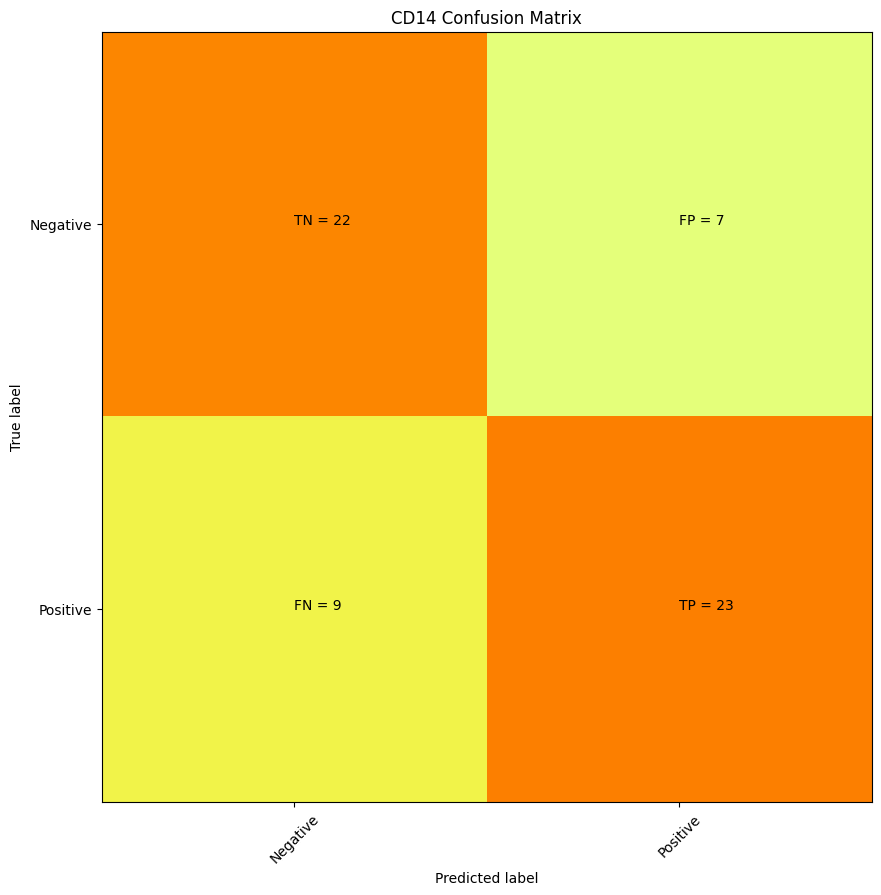

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
D17      0
I18      0
E24      0
N12      0
K03      0
I01      0
J12      0
O02      0
G21      0
H23      0
L17      0
L06      0
N15      0
M12      0
J19      0
J22      0
I15      0
C20      0
P19      0
B17      0
J01      0
C13      0
I02      0
H21      0
I08      0
A18      0
A17      0
H04      0

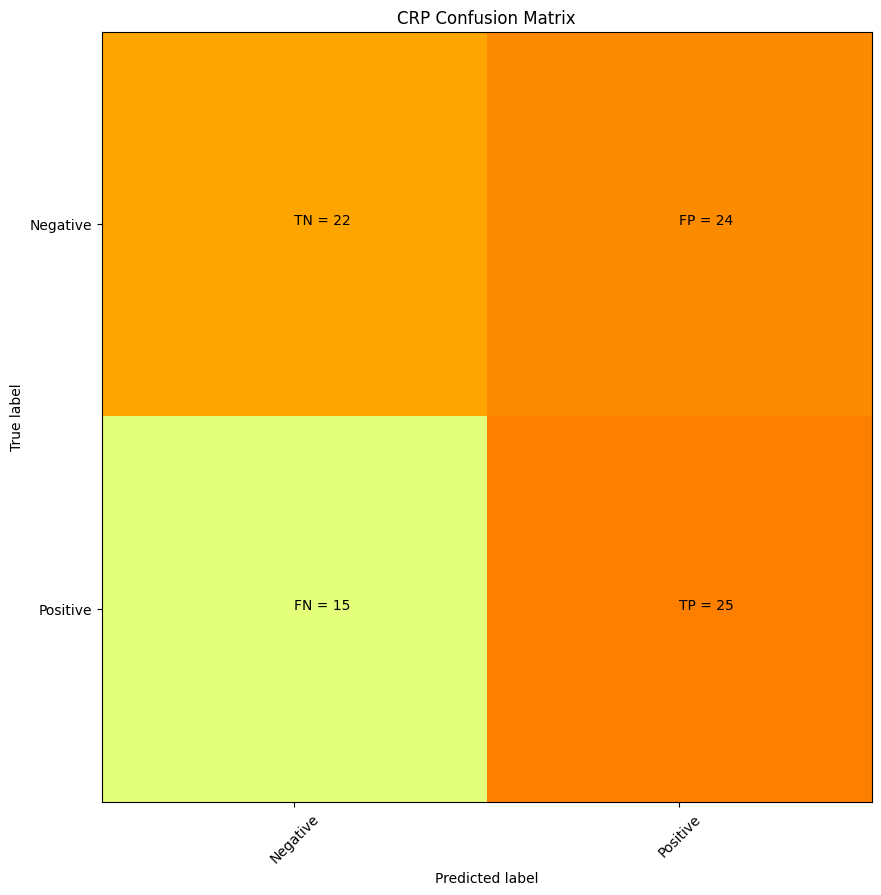

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
H16     0
O20     0
D01     0
N07     0
N21     0
P01     0
A12     0
A06     0
H01     0
M10     0
G22     0
G07     0


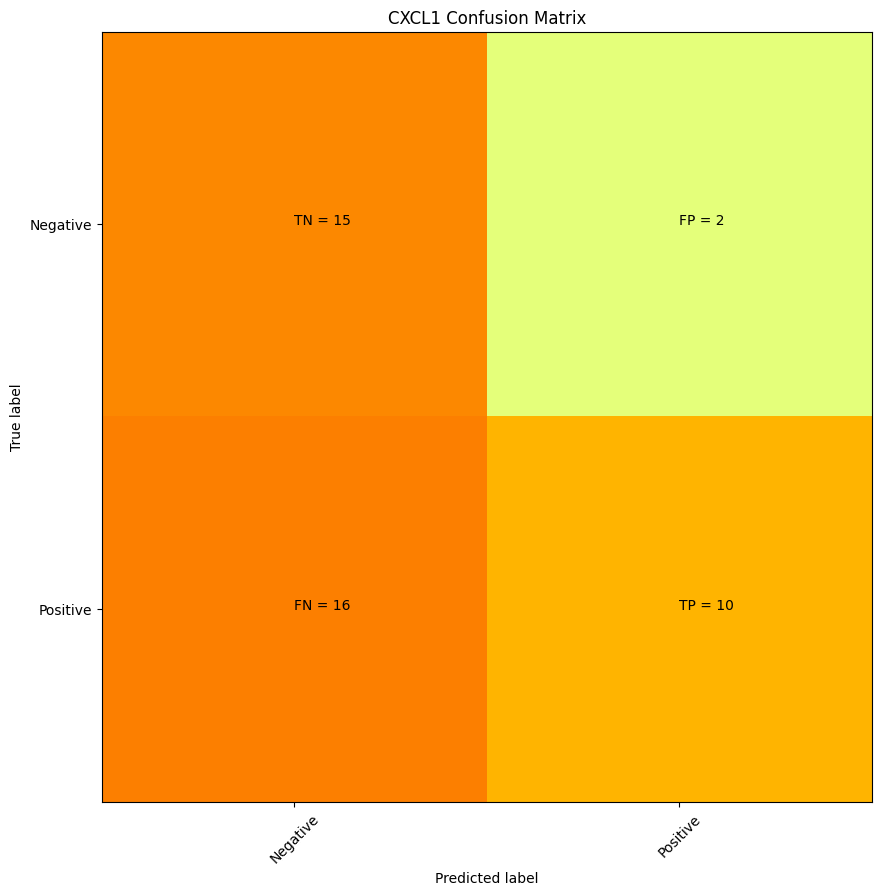

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
L24       0
C24       0
A13       0
D01       0
M16       0
G13       0
L15       0
B08       0
L09       0
A01       0
K23       0
K24       0
A10       0
M21       0
K20       0
K14       0
K21       0
A07       0
D04       0
N06       0
A17       0
M20       0
I22       0
M13       0
O20       0
I12       0
N04       0
G23       0
F21       0
B18       0
D18       0
A08       0
I24       0
C03       0
P14       0
G10       0
E21       0
N24       0
M03 

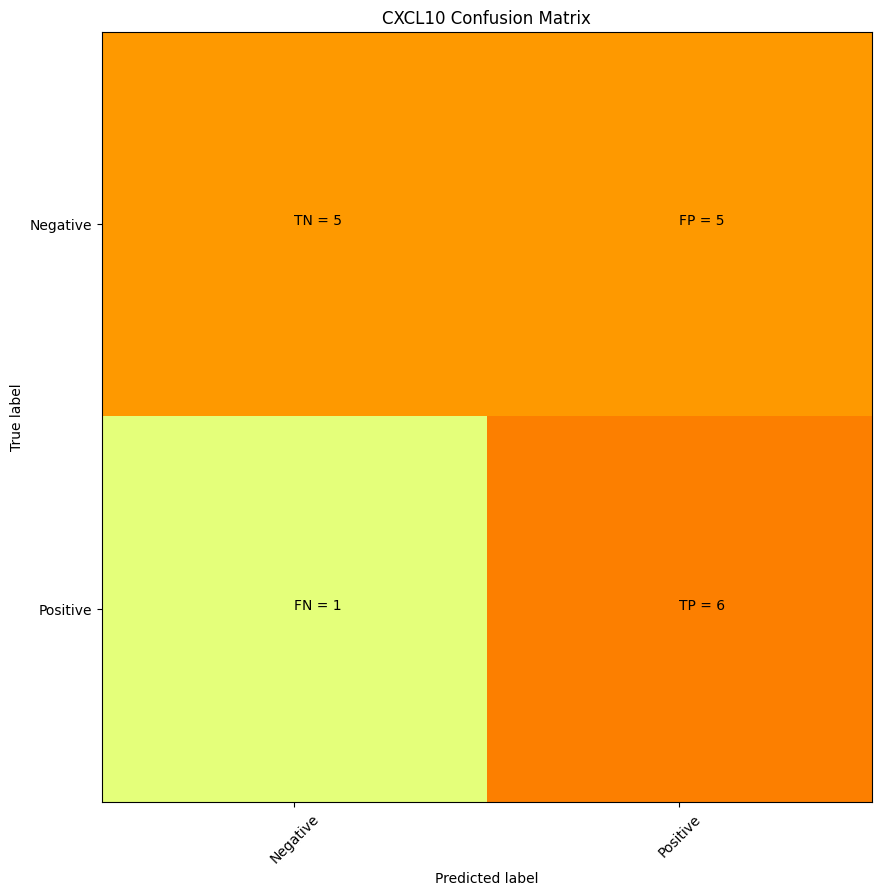

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
N16        0
C22        0
C11        0
J01        0
J07        0
G24        0
P03        0
F03        0
C14        0
E16        0
J04        0
D09        0
F07        0
G10        0
B12        0
A22        0
O20        0 precision = 0.5454545454545454 recall = 0.8571428571428571


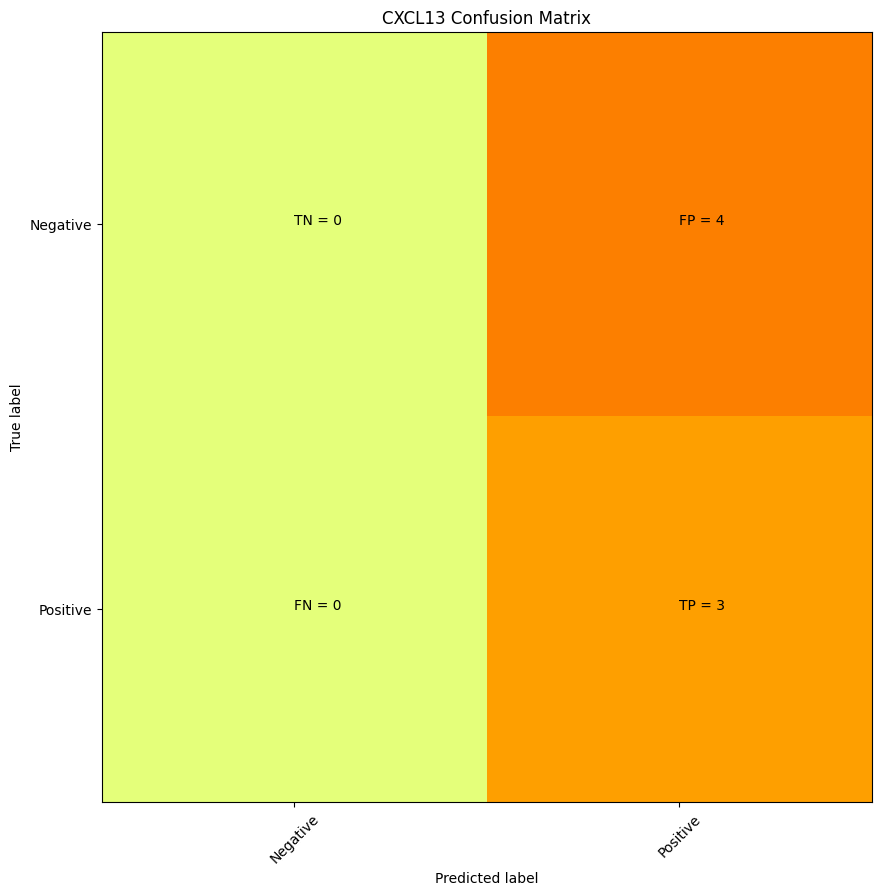

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
H09        0
E20        0
N19        0
N18        0
A01        0
C15        0
J22        0 precision = 0.42857142857142855 recall = 1.0


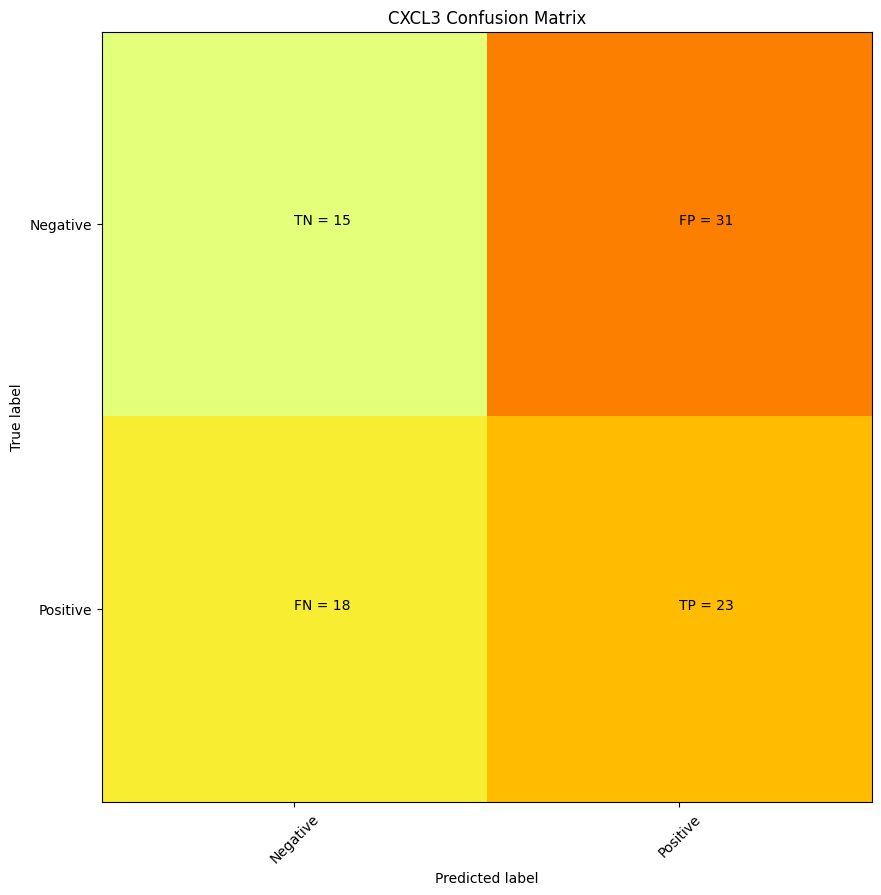

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

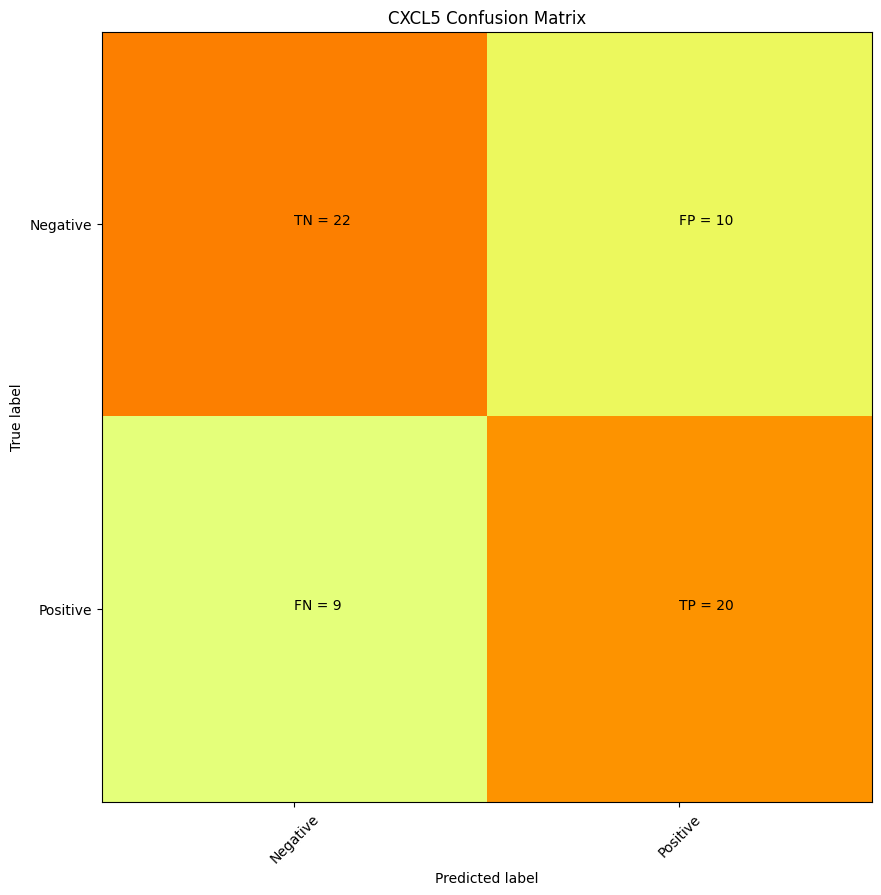

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H17       0
N19       0
D10       0
H10       0
B05       0
J20       0
H09       0
K12       0
N18       0
O06       0
K06       0
K08       0
E14       0
P14       0
K05       0
C21       0
B01       0
J15       0
B06       0
D21       0
C13 

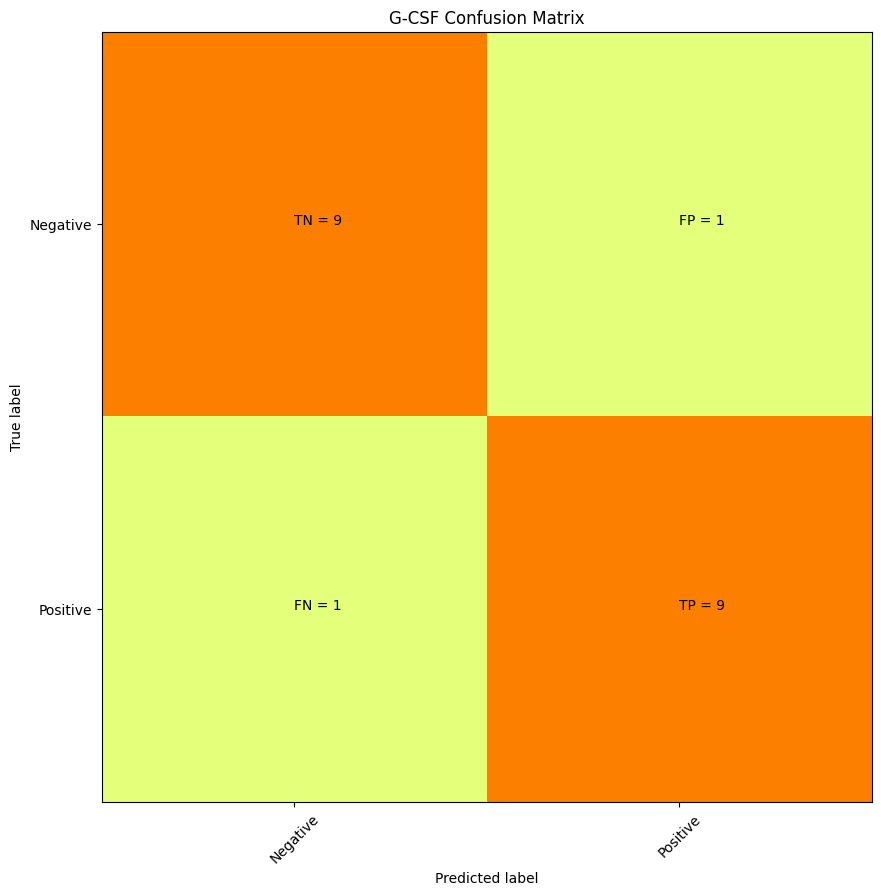

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
N22       0
G23       0
H05       0
L05       0
P14       0
L14       0
J16       0
L22       0
H18       0
N24       0
C03       0
N15       0
A21       0
O06       0
I13       0
P19       0
O21       0
C12       0
G03       0
I15       0 precision = 0.9 recall = 0.9


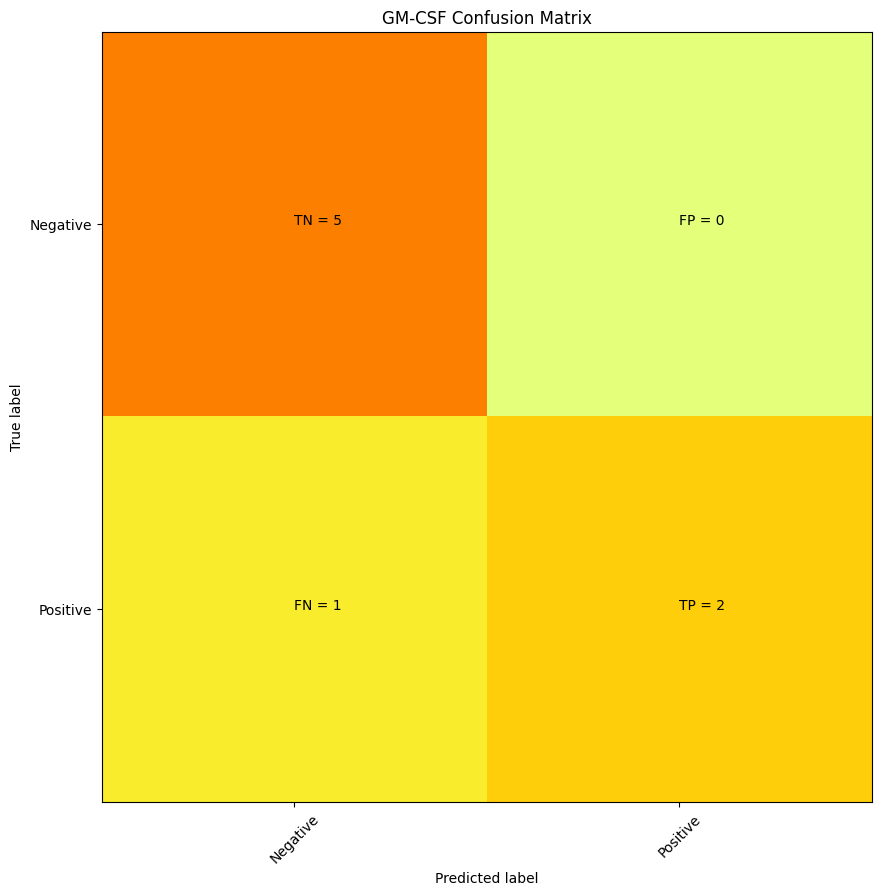

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
F12        0
J03        0
A23        0
O04        0
P17        0
I16        0
B10        0
K16        0 precision = 1.0 recall = 0.6666666666666666


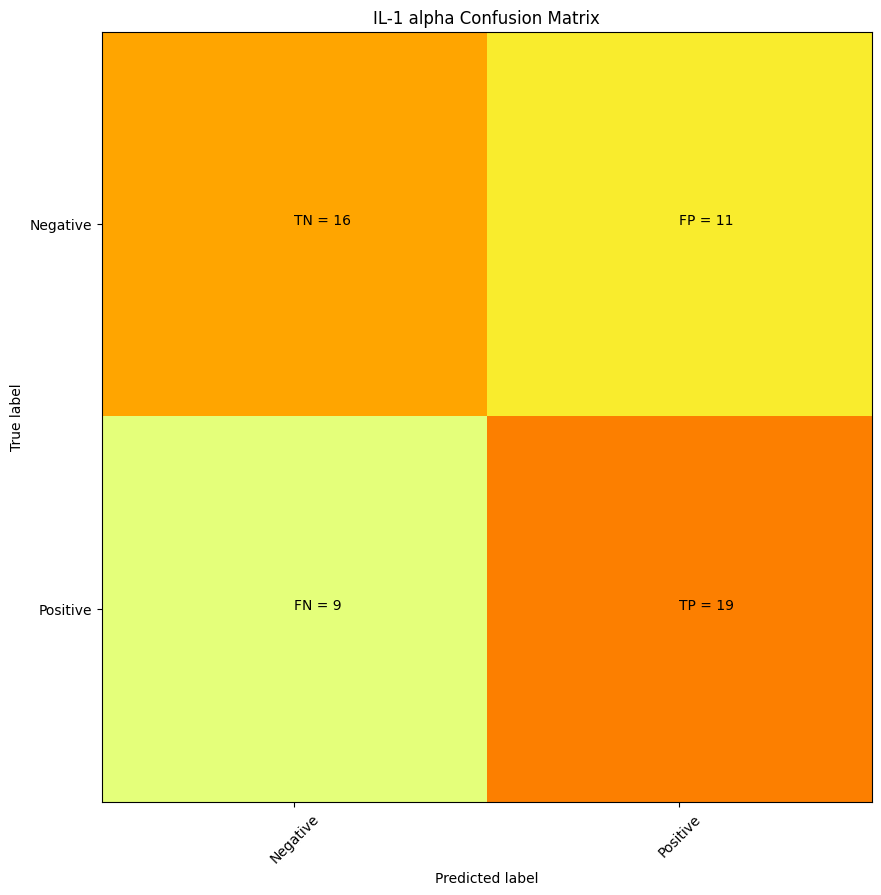

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
I02            0
F09           

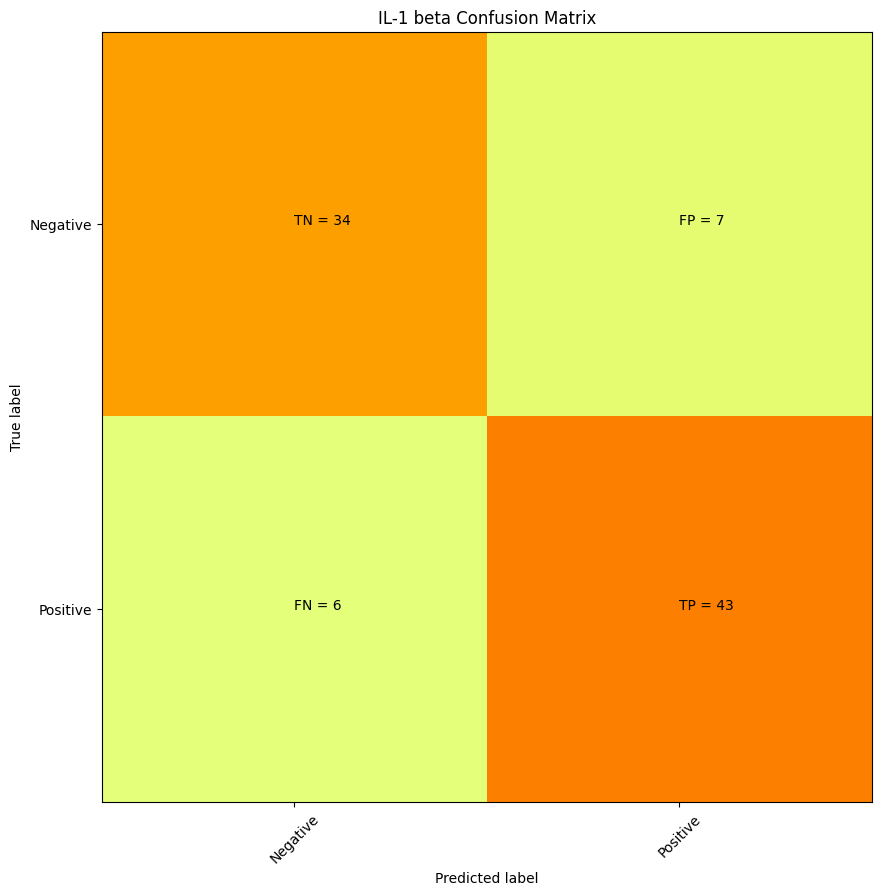

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

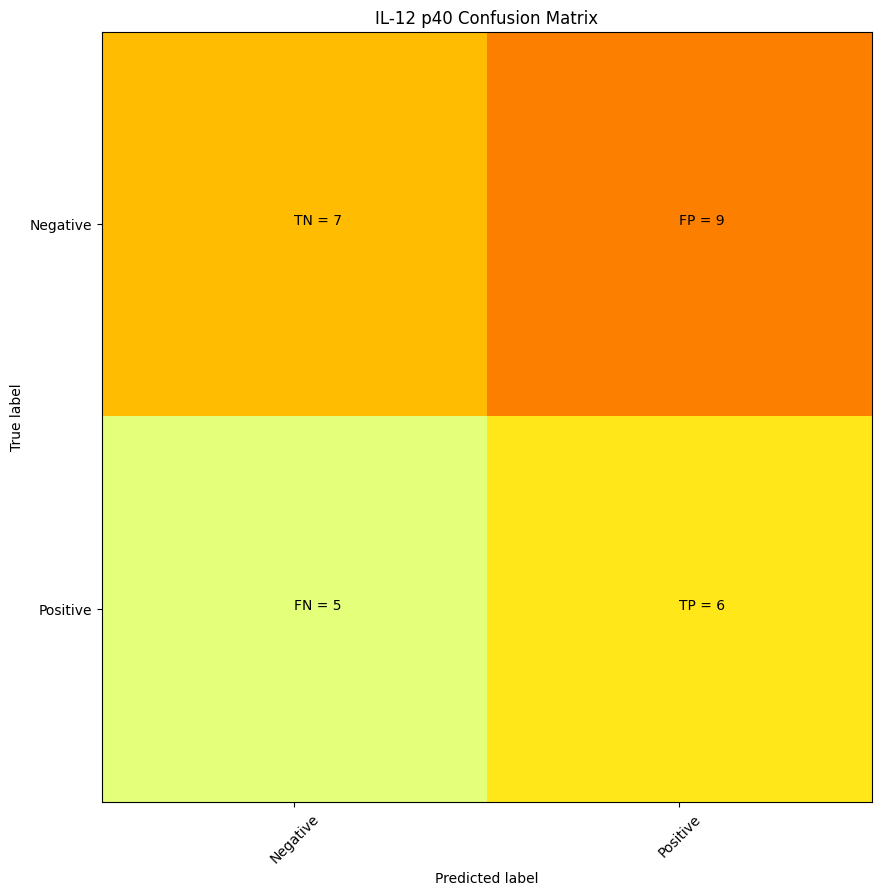

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
D15           0
F05           0
N15           0
D21           0
F03           0
J06           0
K14           0
L04           0
B04           0
J08           0
B09           0
E04           0
A09           0
M11           0
M17           0
H02           0
G24           0
J02           0
B03           0
O01           0
H09           0
J19           0
J16           0
M13           0
H01           0
I21           0
B02           0 precision = 0.4 recall = 0.5454545454545454


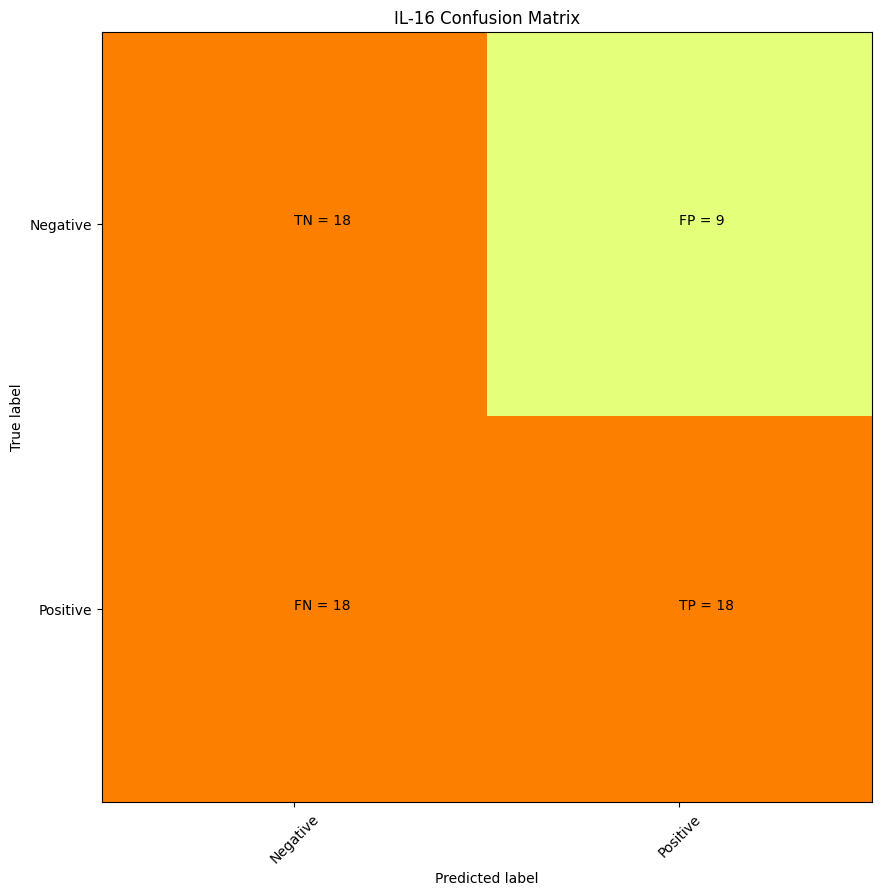

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
P19       0
B15       0
C05       0
B10       0
N01       0
E19       0
E05       0
J17       0
E06       0
K04       0
I03       0
F22       0
P01       0
A07       0
D19       0
N10       0
B05       0
I01       0
H21 

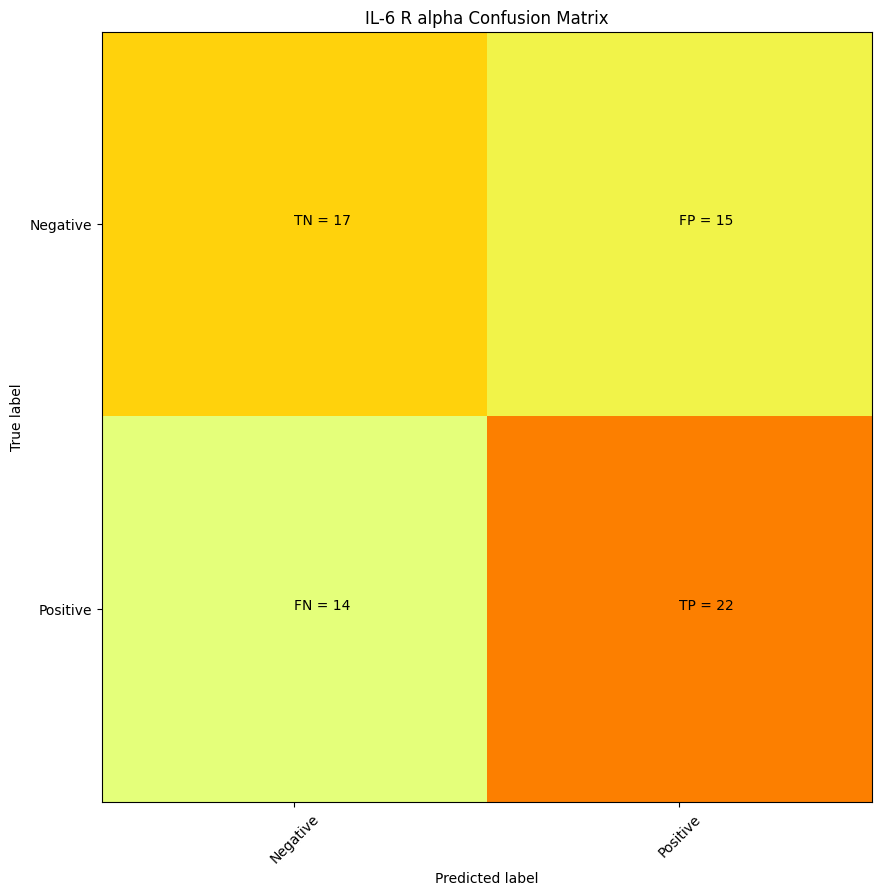

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

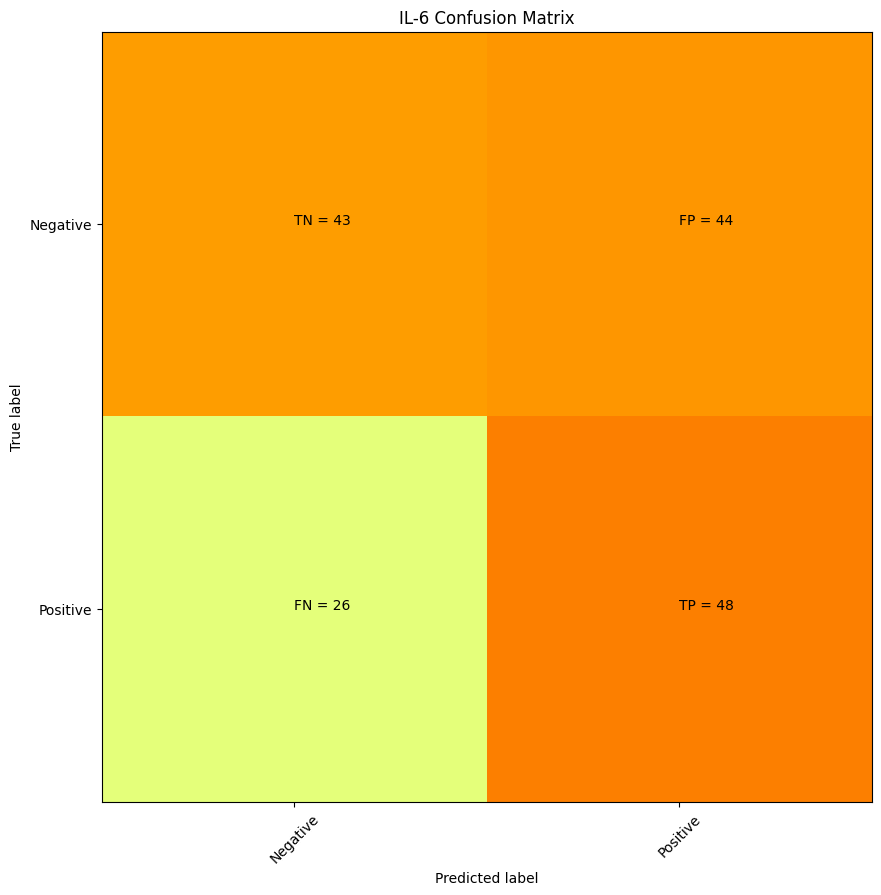

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

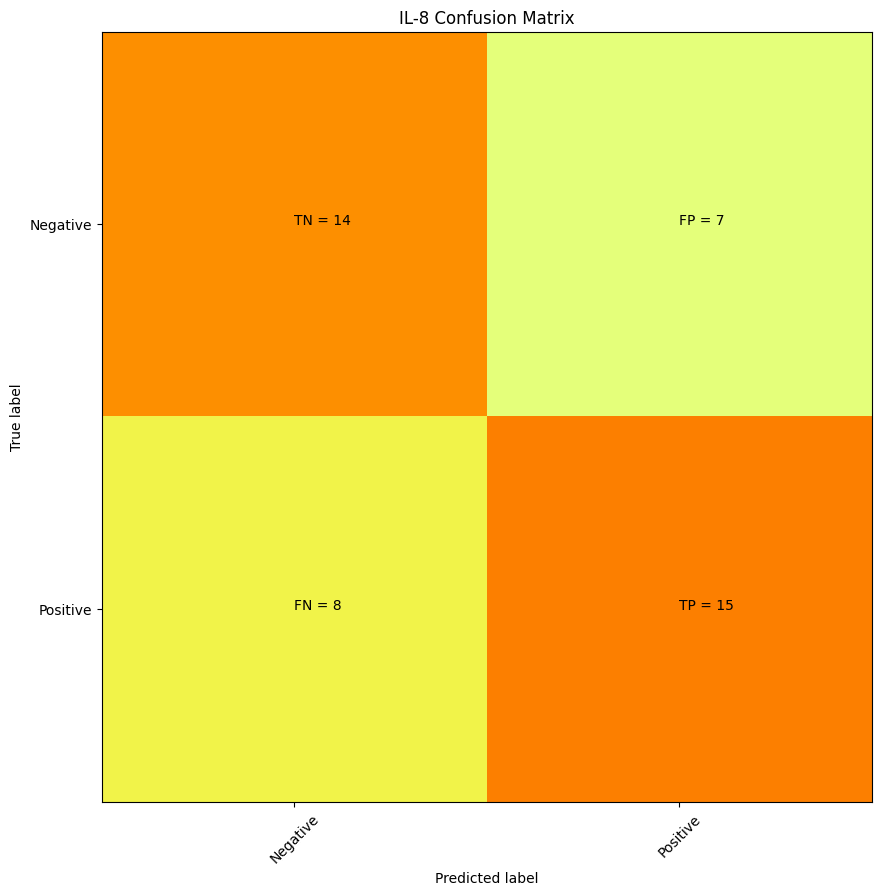

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
N17      0
N16      0
G17      0
A12      0
E09      0
J22      0
N14      0
M14      0
A06      0
D14      0
M07      0
C12      0
O24      0
J20      0
G15      0
L10      0
C02      0
N05      0
C22      0
J15      0
D09      0
I16      0
P10      0
C07      0
F02      0
E08      0
F20      0
D01      0
F09      0
L03      0
F16      0
P09      0
O06      0
B06      0
N09      0
M06      0
P12      0
B04      0
E20      0
J13      0
C20      0
M18      0
I02      0
I12      0 precision 

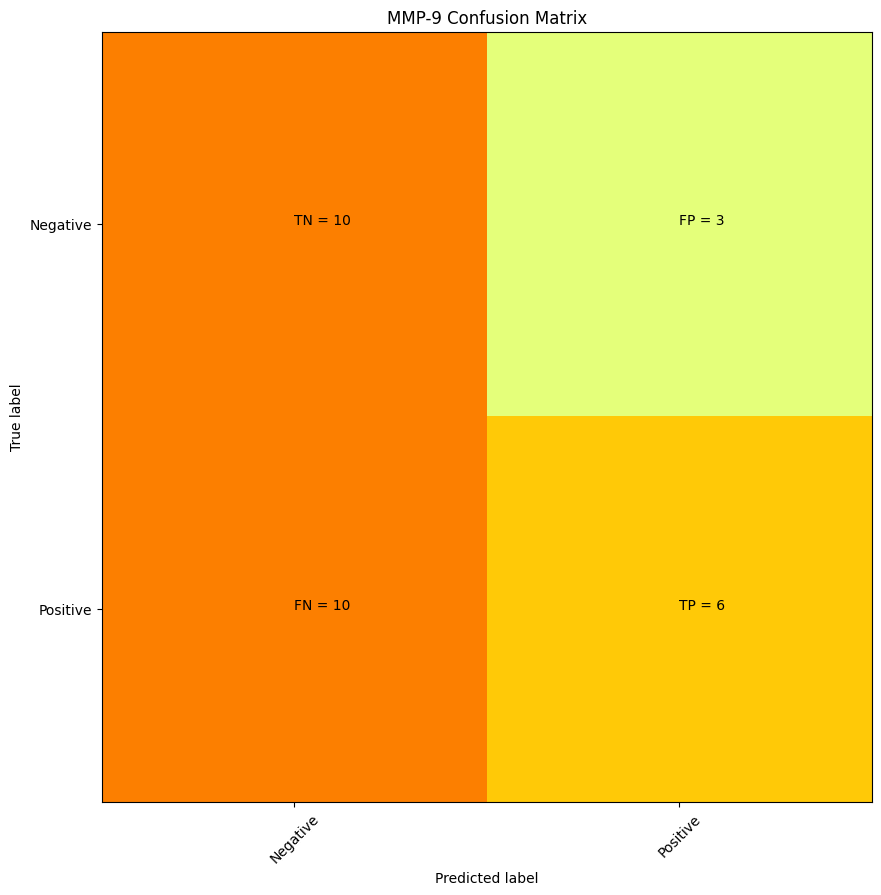

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
C16       0
G21       0
A11       0
G04       0
C15       0
B09       0
J03       0
M22       0
E08       0
O02       0
L05       0
I10       0
B15       0
L16       0
P22       0
H19       0
O03       0
K04       0
C08       0
B13       0
A16       0
C18       0
N23       0
I13       0
P02       0
L15       0
N21       0
K21       0
I17       0 precision = 0.6666666666666666 recall = 0.375


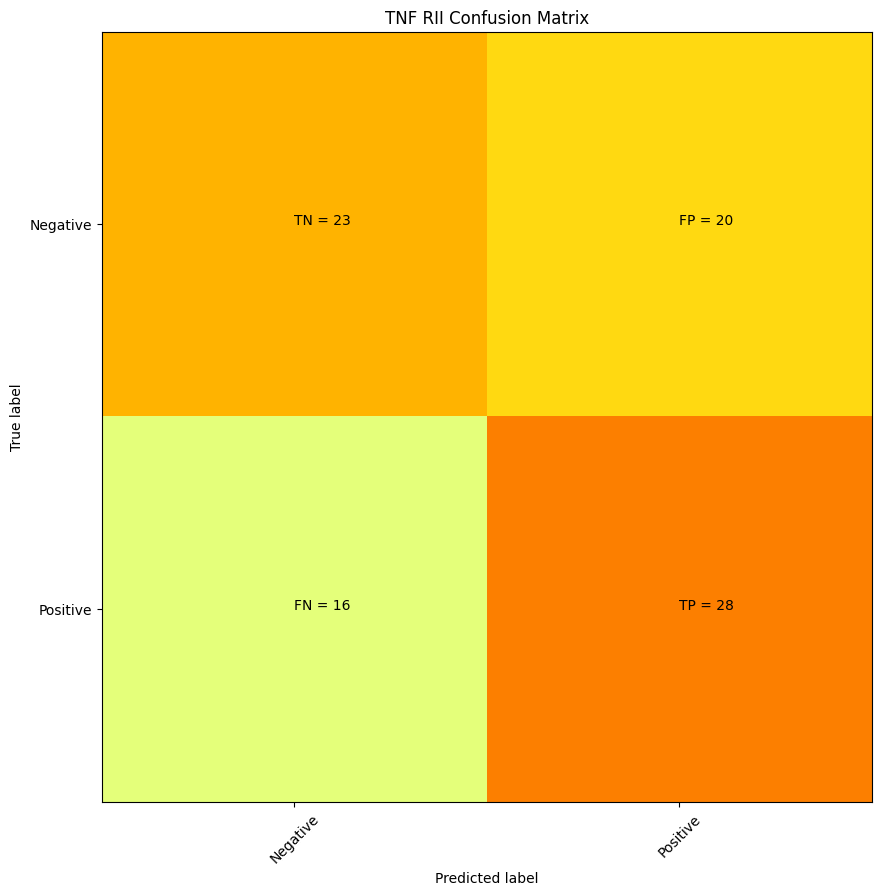

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [45]:
summarizing = []
summarizer_variance = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in variances_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_variance = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_variance['Precision'] = summarizer_variance['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [46]:
summarizer_variance

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.433333,0.722222,17,47
1,CCL1,0.681818,0.652174,47,46
2,CCL19,0.333333,0.166667,50,12
3,CCL2,0.631579,0.782609,81,95
4,CCL20,0.600000,0.642857,73,30
5,CCL22,0.608696,0.656250,44,125
6,CCL4,0.608696,0.608696,12,46
7,CCL5,0.590164,0.521739,38,133
8,CD14,0.766667,0.718750,34,61
9,CRP,0.510204,0.625000,62,86


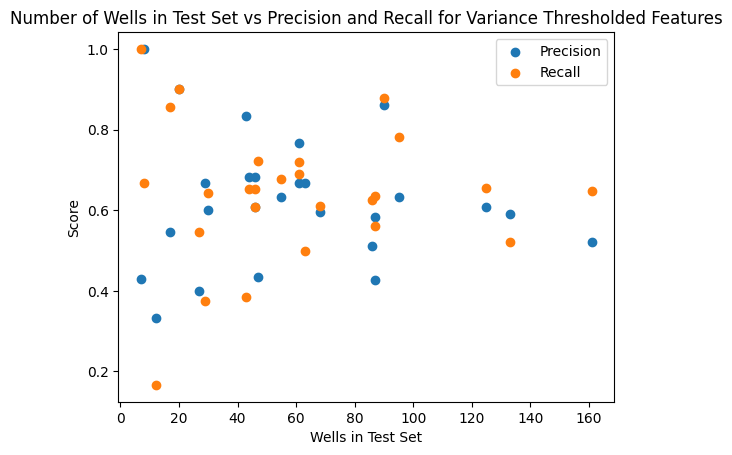

In [47]:
#Observe there is essentially no trend. 
#This supports that we are not simply overfitting for cyotkines with low numbers of responder wells.
plt.scatter(y=summarizer_variance["Precision"], x = summarizer_variance["Wells in Set"])
plt.scatter(y=summarizer_variance["Recall"], x = summarizer_variance["Wells in Set"])
plt.xlabel("Wells in Test Set")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for Variance Thresholded Features")
plt.show()

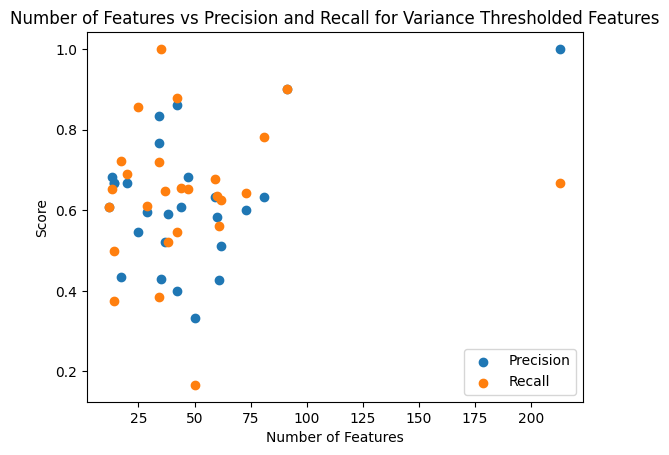

In [48]:

plt.scatter(y=summarizer_variance["Precision"], x = summarizer_variance["Number of Features"])
plt.scatter(y=summarizer_variance["Recall"], x = summarizer_variance["Number of Features"])
plt.xlabel("Number of Features")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Features vs Precision and Recall for Variance Thresholded Features")
plt.show()

## Performance with univariate (F1) selected features

In [49]:
univariates_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = univariates[univariates["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        univariates_listing.append(finaldata)
    except:
        continue

univariates_listing[0]

Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_200,Output_243,Output_310,Output_334,Output_386,Output_518,Output_903,Output_963,Output_1110,Output_1207
well,,,,,,,,,,,
A09,1,0.164043,-0.079152,0.058228,-0.091591,0.089877,0.125831,5.635931,2.049567,0.074953,0.540255
C03,1,0.192522,-0.058331,0.201467,-0.054181,0.109902,0.255930,5.793055,2.015778,0.115405,0.587279
C09,1,0.219439,-0.048041,0.234372,-0.006917,0.096179,0.325699,5.603607,2.112870,0.115591,0.631773
C17,1,0.115401,-0.098040,0.072700,-0.071562,0.086534,0.112891,5.335701,2.316985,0.061529,0.607740
F03,1,0.200544,-0.045291,0.225987,-0.049487,0.076130,0.248357,5.630318,2.010011,0.137784,0.649527
F04,1,0.161132,-0.056896,0.110347,-0.070077,0.084653,0.180814,5.691682,2.029744,0.125470,0.596558
F05,1,0.251358,-0.061298,0.187533,-0.051658,0.093571,0.228504,5.678301,1.989335,0.104176,0.570298
F08,1,0.160898,-0.056449,0.178165,-0.045580,0.106050,0.271474,5.424012,2.001111,0.142028,0.614809
F09,1,0.127589,-0.077588,0.144675,-0.072387,0.075717,0.137474,5.481540,1.979217,0.114983,0.559076


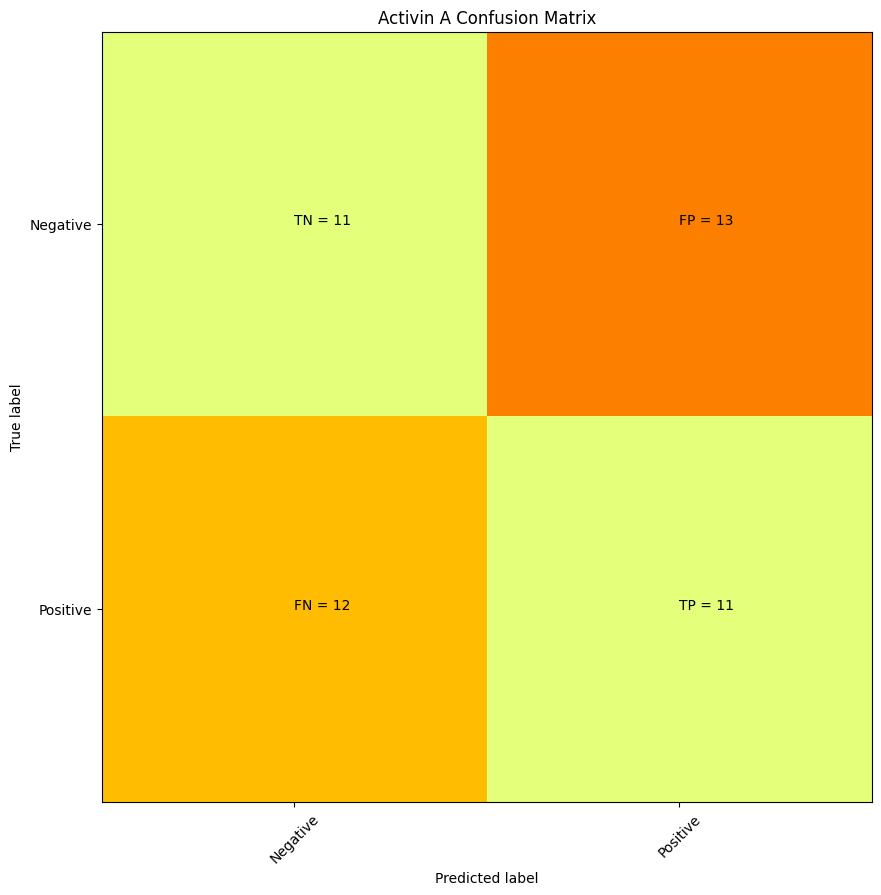

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
M11           0
G23           0
A13           0
D07           0
M10           0
N13           0
N15           0
C01           0
N24           0
I20           0
L19           0
P23           0
L16           0
A16     

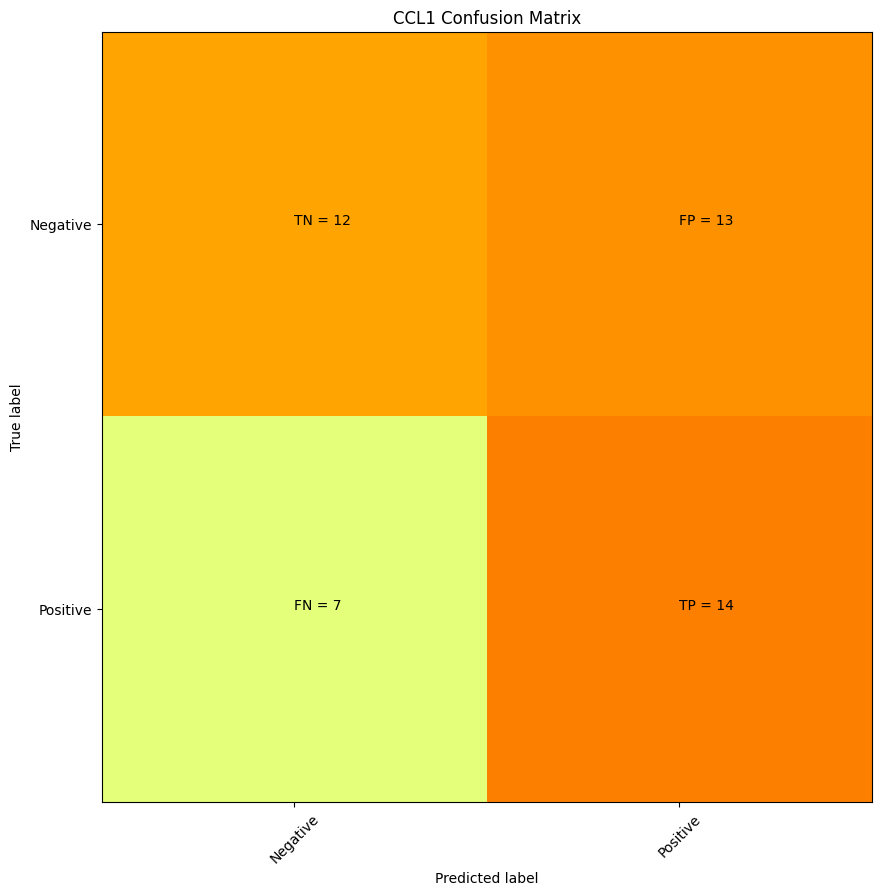

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
L17      0
M21      0
A14      0
G14      0
D11      0
M19      0
E03      0
E17      0
A11      0
G21      0
P16      0
D15      0
M12      0
G06      0
F24      0
N12      0
J15      0
M02      0
K01      0
A22      0
K06      0
G23      0
I13      0
I11      0
N14      0
O16      0
O14      0
B09      0
K11      0
B14      0
K15      0
G08      0
J02      0
O07      0
C23      0
H14      0
C04      0
M04      0
O04      0
K16      0
B05      0
M24      0
I15      0

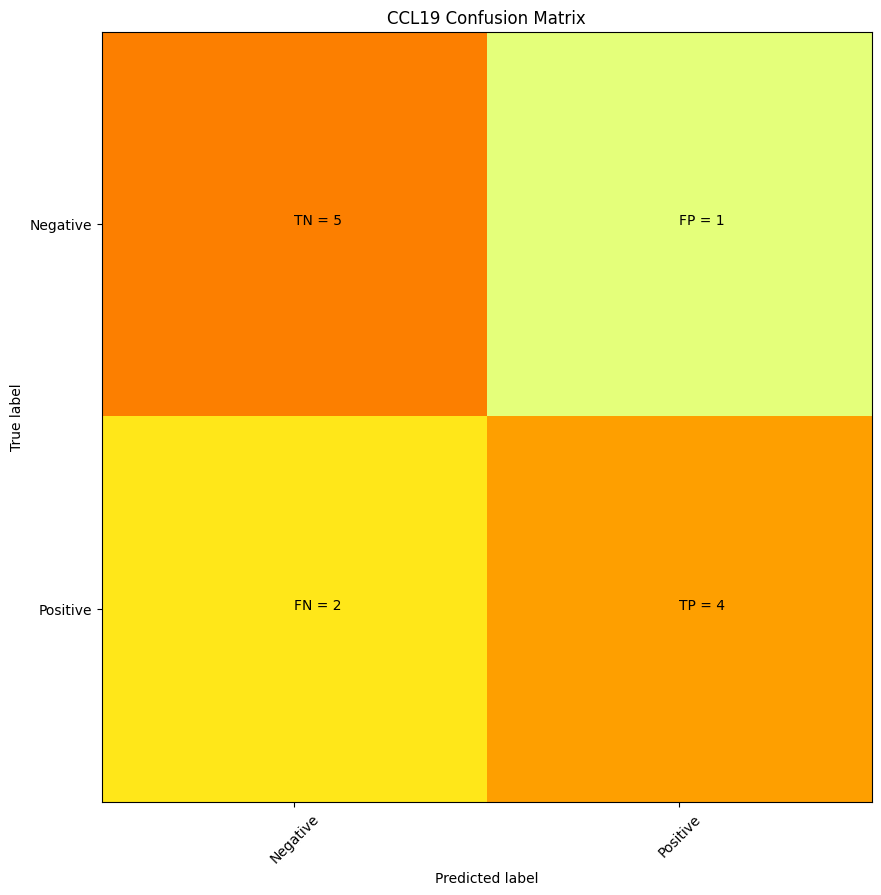

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
F06       0
F23       0
B15       0
B01       0
A09       0
J02       0
P08       0
F19       0
L14       0
F02       0
O19       0
N13       0 precision = 0.8 recall = 0.6666666666666666


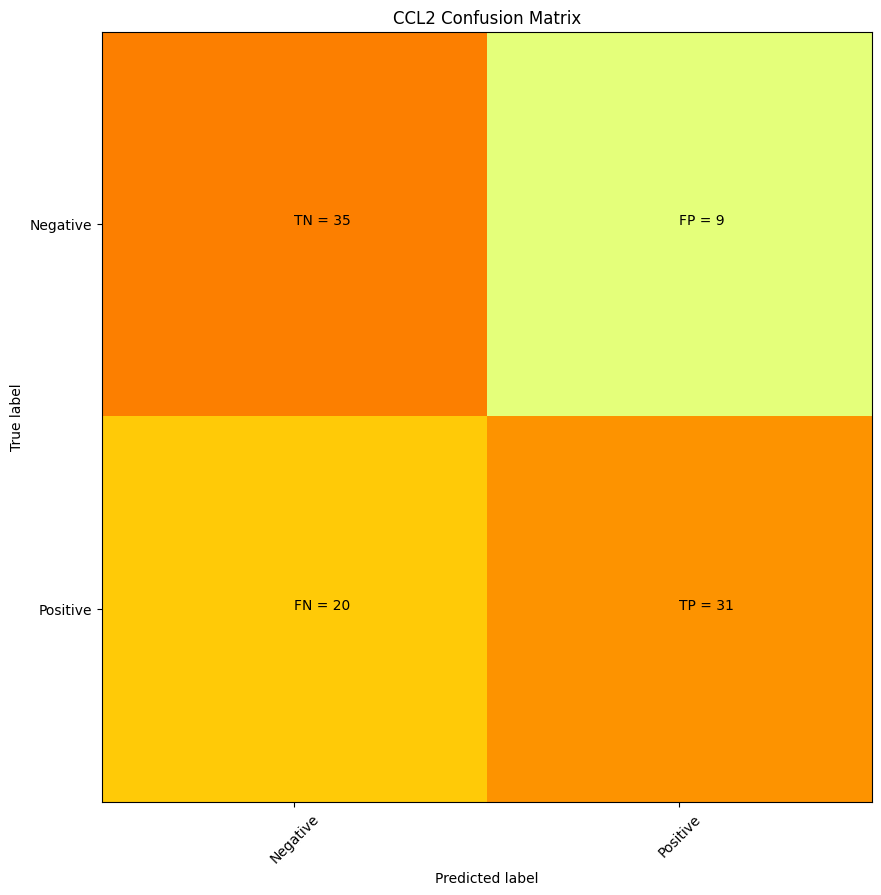

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

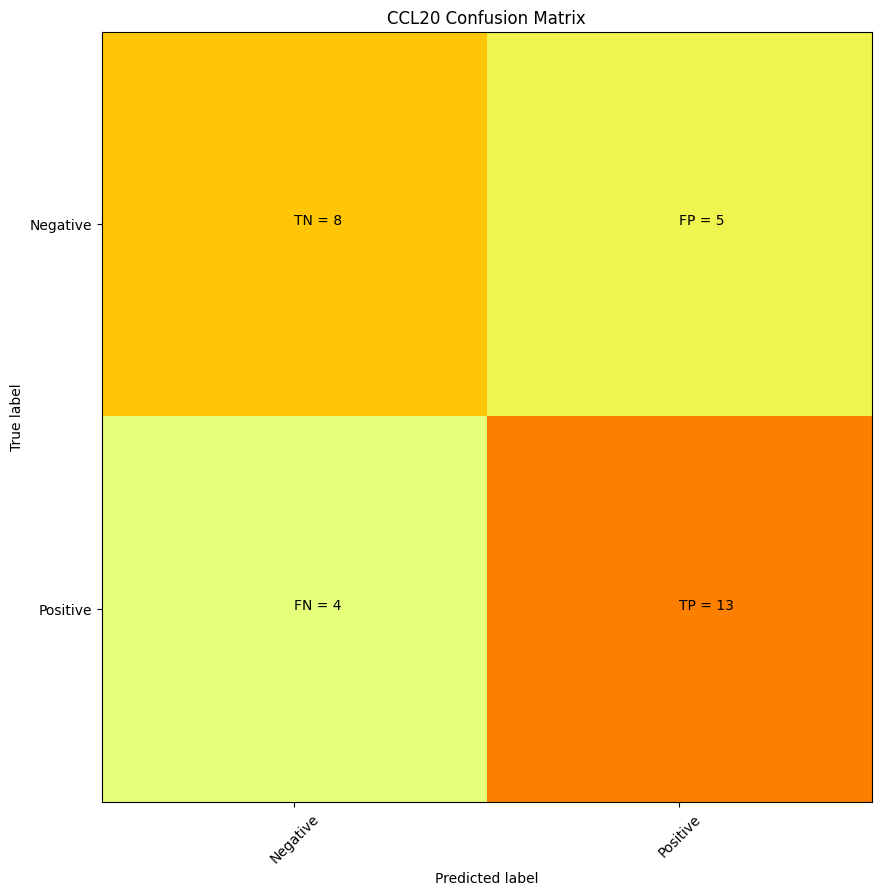

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
I23       0
I17       0
G11       0
J09       0
I19       0
J14       0
E18       0
L05       0
G13       0
L18       0
F22       0
L19       0
J11       0
B12       0
H13       0
J21       0
L17       0
C01       0
N08       0
M04       0
F16       0
I05       0
M07       0
H15       0
P18       0
J06       0
K02       0
H03       0
H01       0
O07       0 precision = 0.7222222222222222 recall = 0.7647058823529411


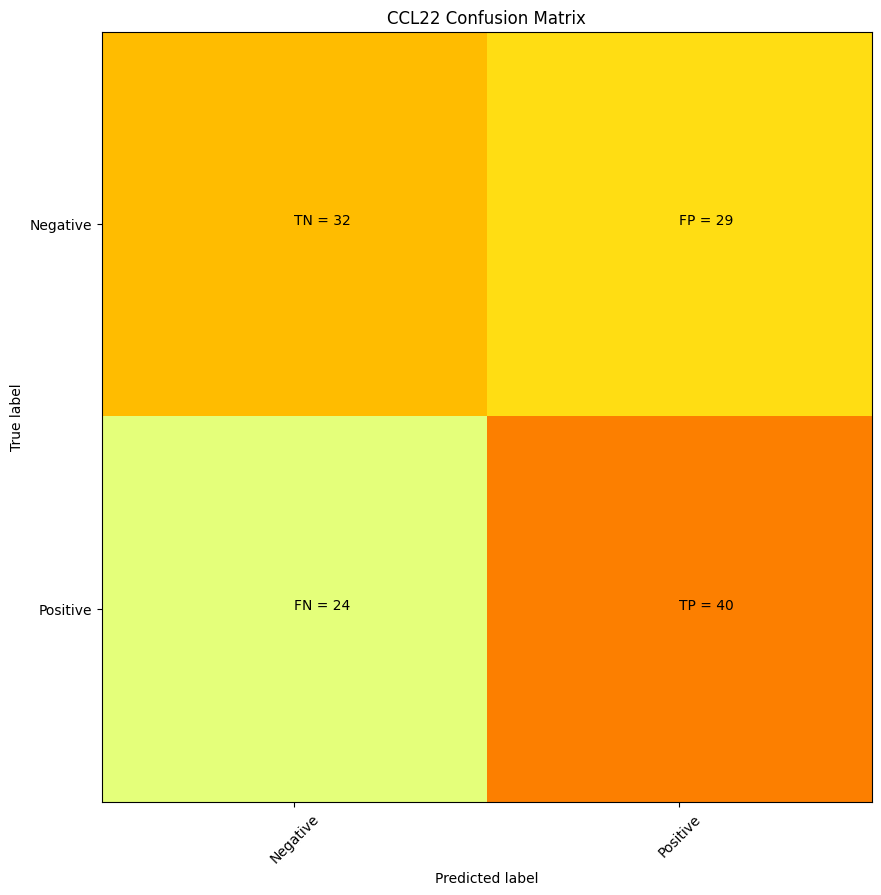

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

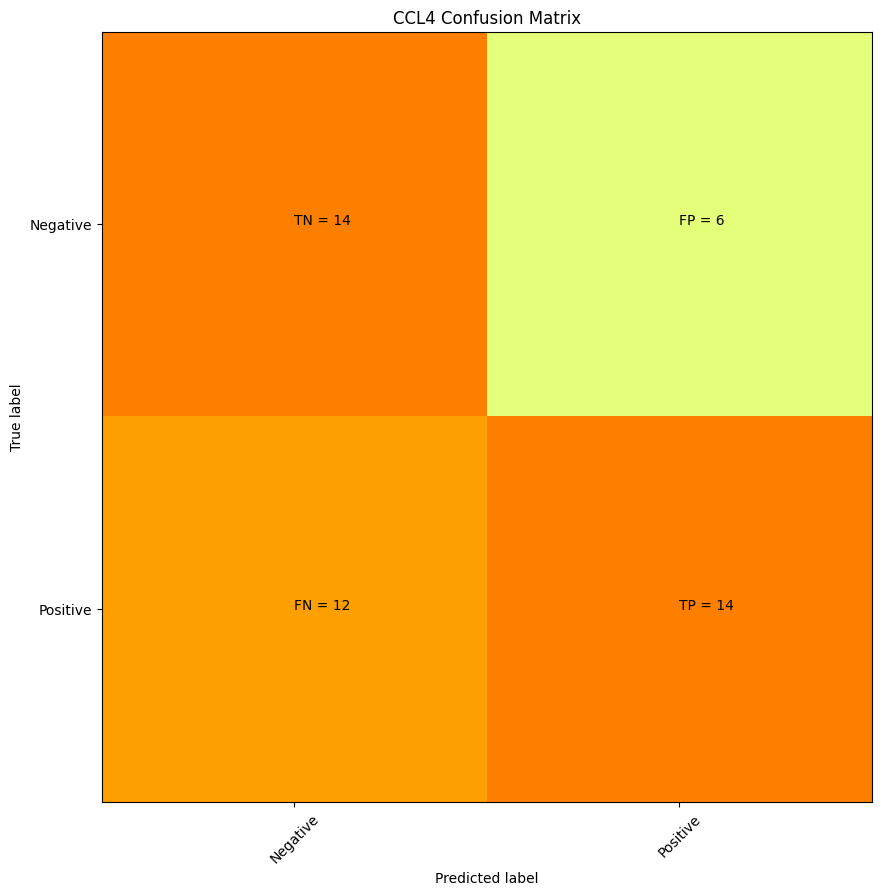

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P12      0
L02      0
K14      0
M20      0
M06      0
P24      0
L03      0
O22      0
F22      0
M08      0
N16      0
H04      0
N15      0
F08      0
M21      0
H10      0
E06      0
D03      0
D09      0
F20      0
C24      0
G01      0
P10      0
H05      0
F03      0
I09      0
N12      0
P16      0
C12      0
M03      0
B15      0
F21      0
B12      0
B14      0
K21      0
G12      0
L15      0
F16      0
C20      0
F17      0
A01      0
D10      0
O23      0

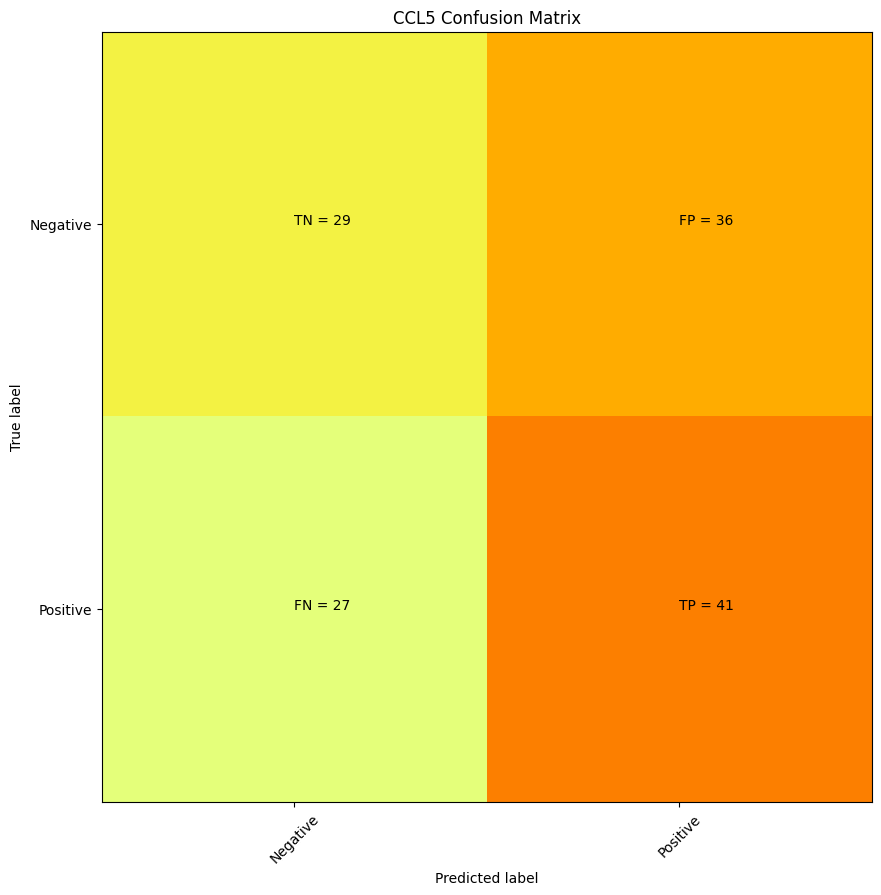

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

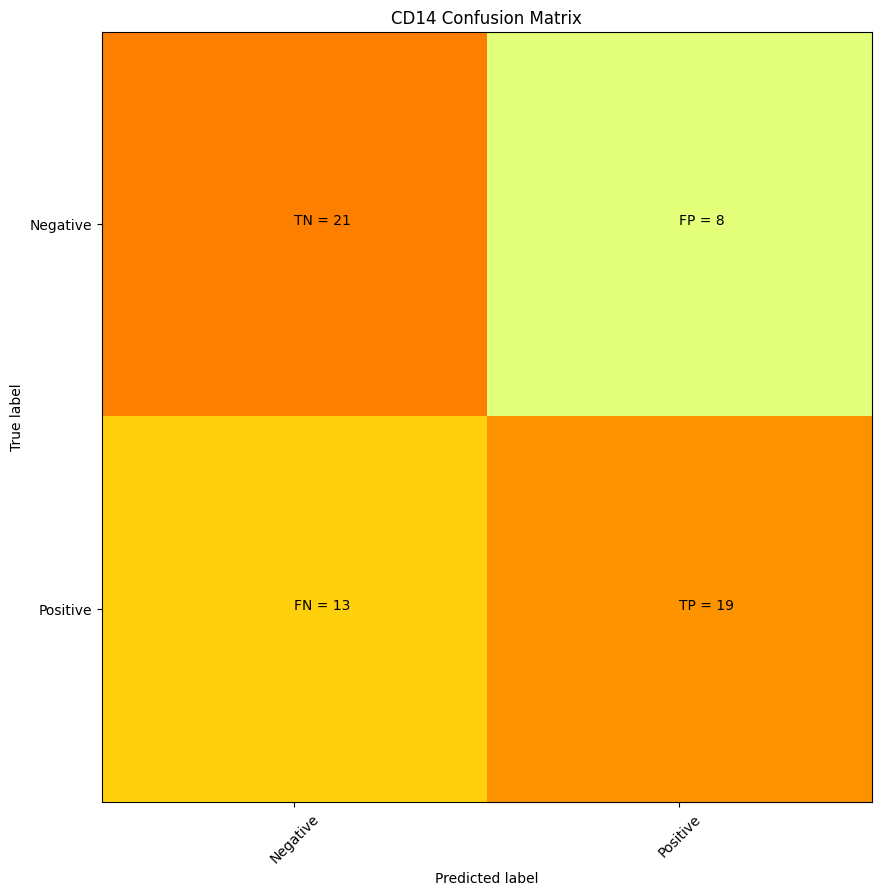

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
D17      0
I18      0
E24      0
N12      0
K03      0
I01      0
J12      0
O02      0
G21      0
H23      0
L17      0
L06      0
N15      0
M12      0
J19      0
J22      0
I15      0
C20      0
P19      0
B17      0
J01      0
C13      0
I02      0
H21      0
I08      0
A18      0
A17      0
H04      0

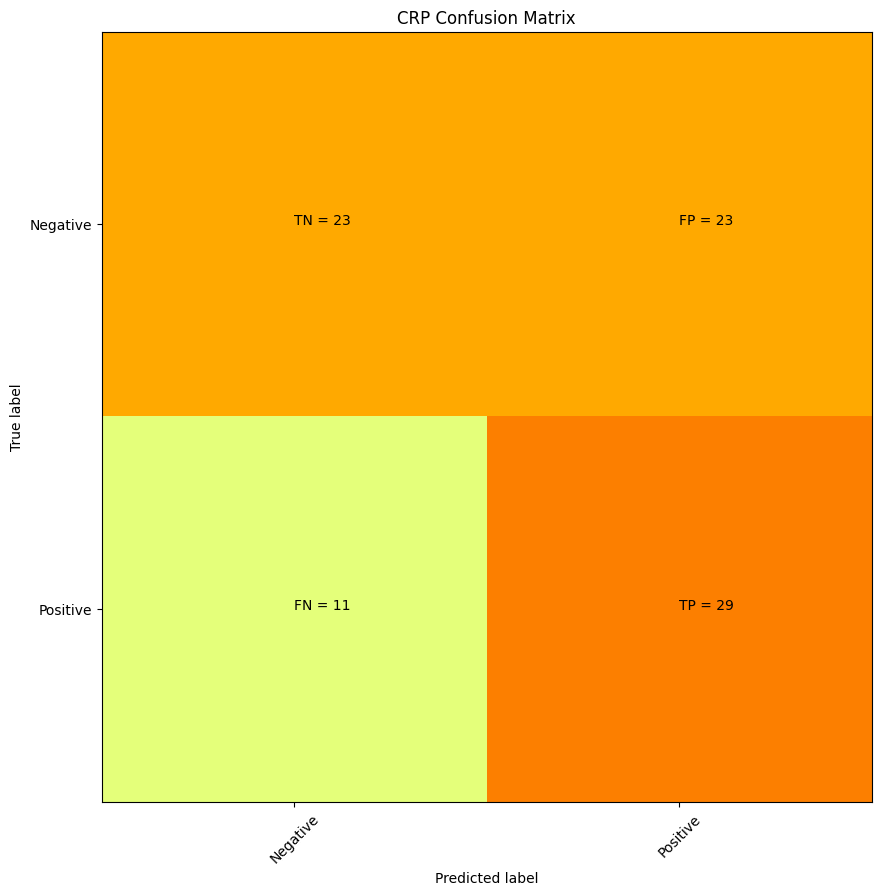

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
H16     0
O20     0
D01     0
N07     0
N21     0
P01     0
A12     0
A06     0
H01     0
M10     0
G22     0
G07     0


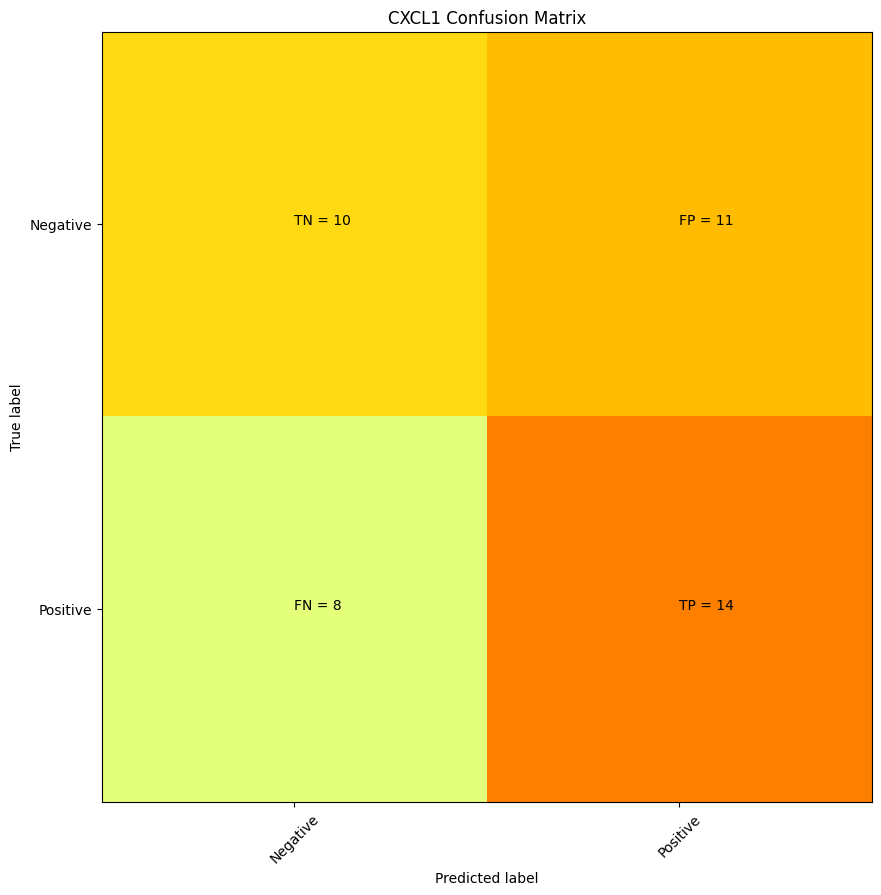

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
L24       0
C24       0
A13       0
D01       0
M16       0
G13       0
L15       0
B08       0
L09       0
A01       0
K23       0
K24       0
A10       0
M21       0
K20       0
K14       0
K21       0
A07       0
D04       0
N06       0
A17       0
M20       0
I22       0
M13       0
O20       0
I12       0
N04       0
G23       0
F21       0
B18       0
D18       0
A08       0
I24       0
C03       0
P14       0
G10       0
E21       0
N24       0
M03 

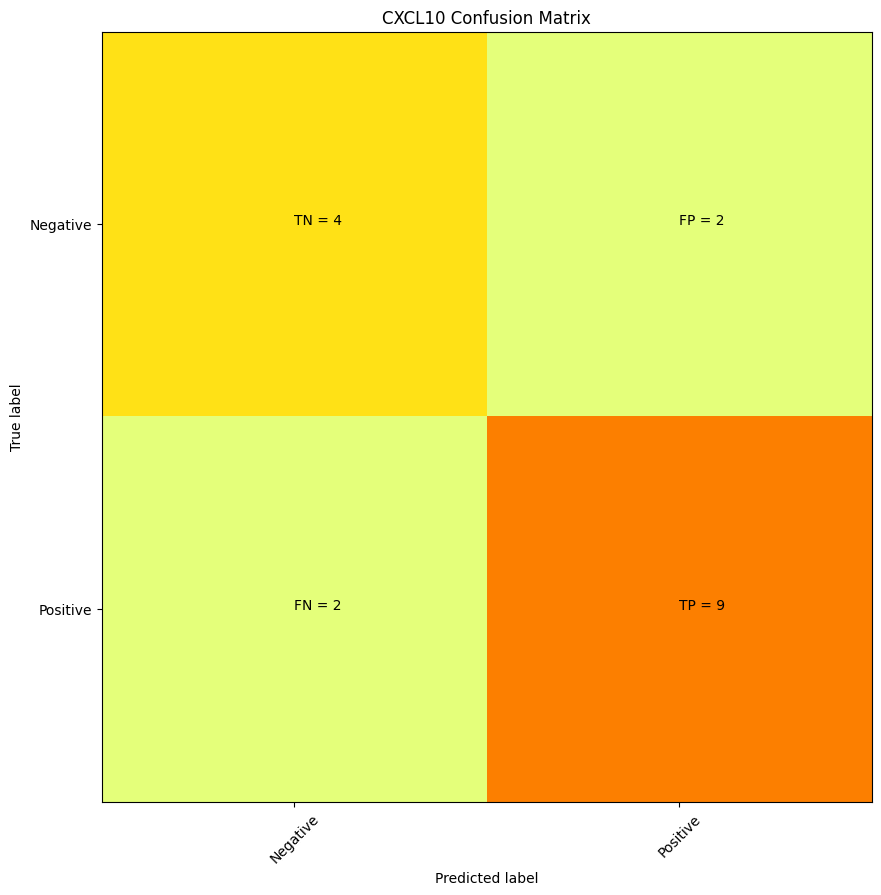

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
N16        0
C22        0
C11        0
J01        0
J07        0
G24        0
P03        0
F03        0
C14        0
E16        0
J04        0
D09        0
F07        0
G10        0
B12        0
A22        0
O20        0 precision = 0.8181818181818182 recall = 0.8181818181818182


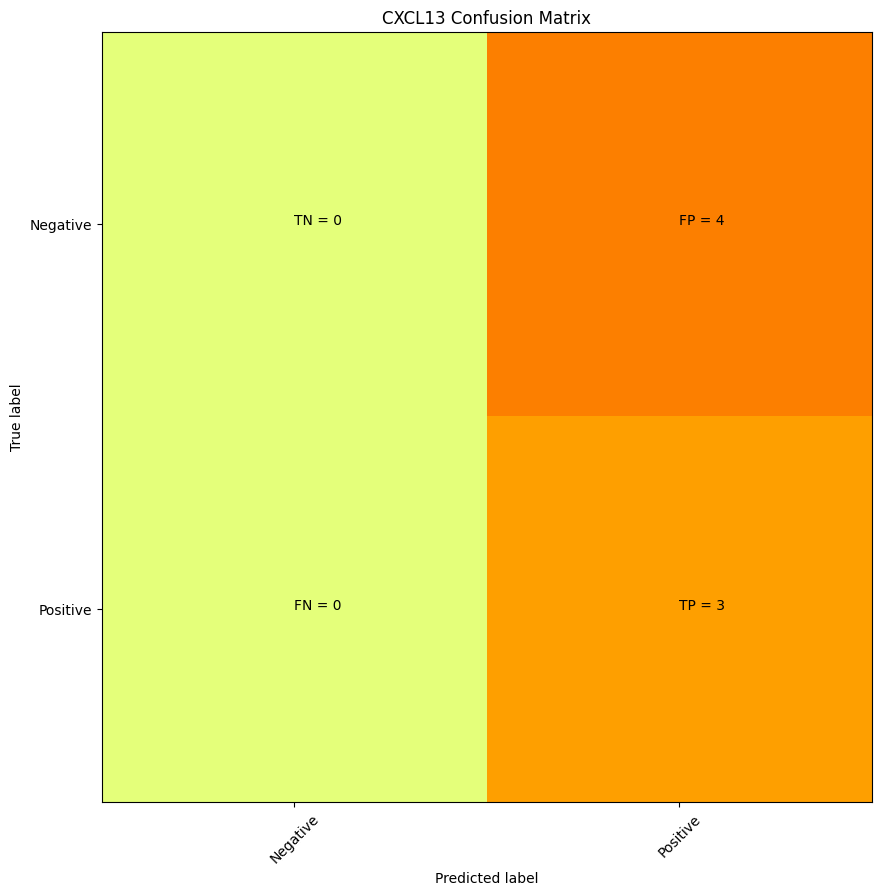

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
H09        0
E20        0
N19        0
N18        0
A01        0
C15        0
J22        0 precision = 0.42857142857142855 recall = 1.0


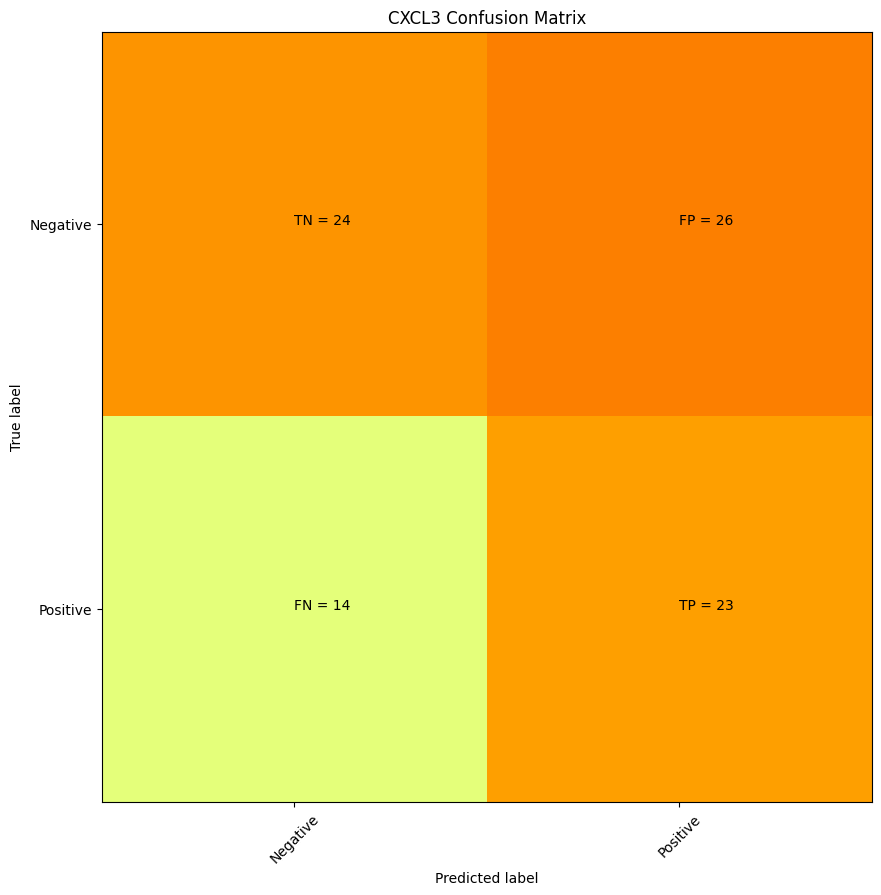

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

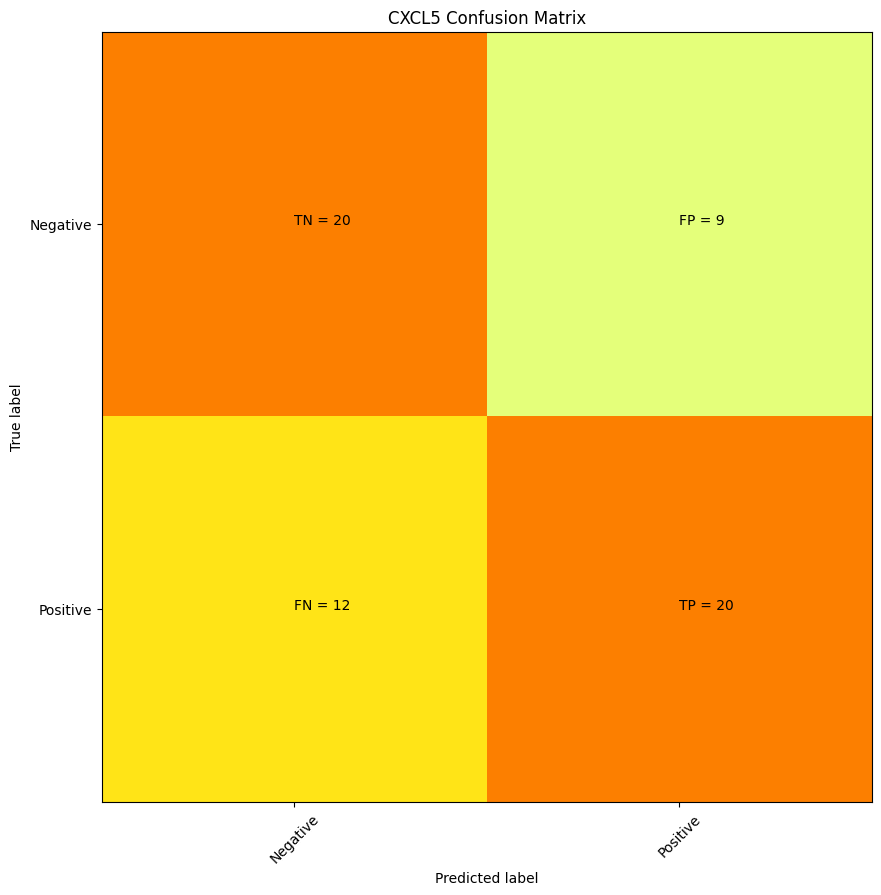

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H17       0
N19       0
D10       0
H10       0
B05       0
J20       0
H09       0
K12       0
N18       0
O06       0
K06       0
K08       0
E14       0
P14       0
K05       0
C21       0
B01       0
J15       0
B06       0
D21       0
C13 

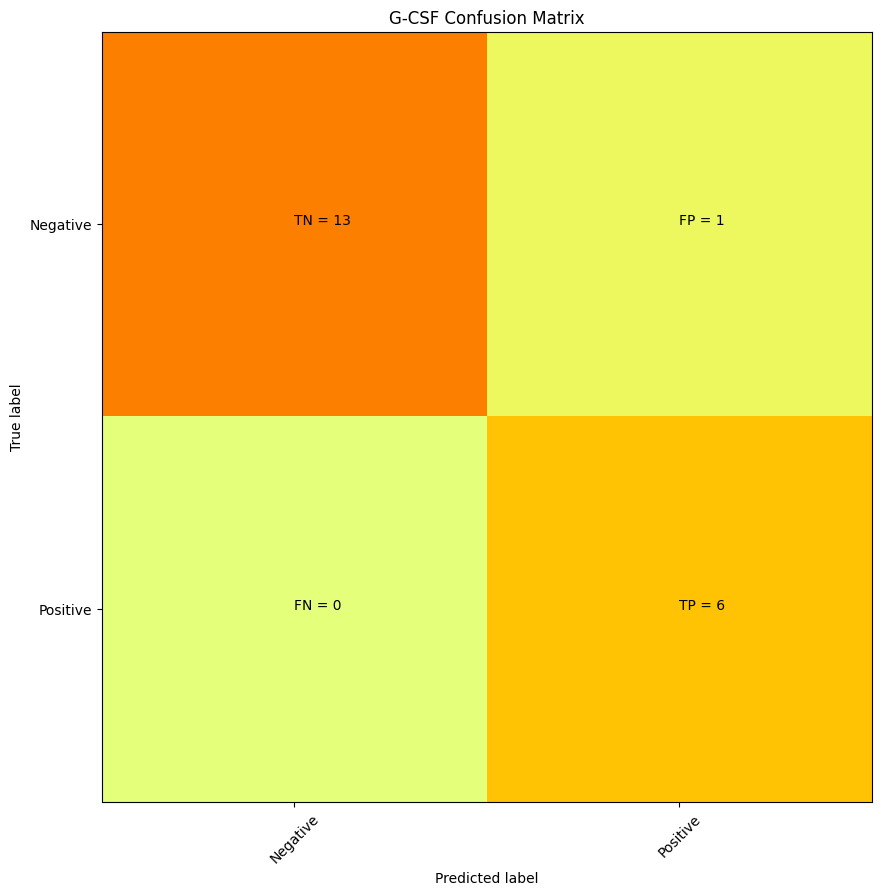

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
N22       0
G23       0
H05       0
L05       0
P14       0
L14       0
J16       0
L22       0
H18       0
N24       0
C03       0
N15       0
A21       0
O06       0
I13       0
P19       0
O21       0
C12       0
G03       0
I15       0 precision = 0.8571428571428571 recall = 1.0


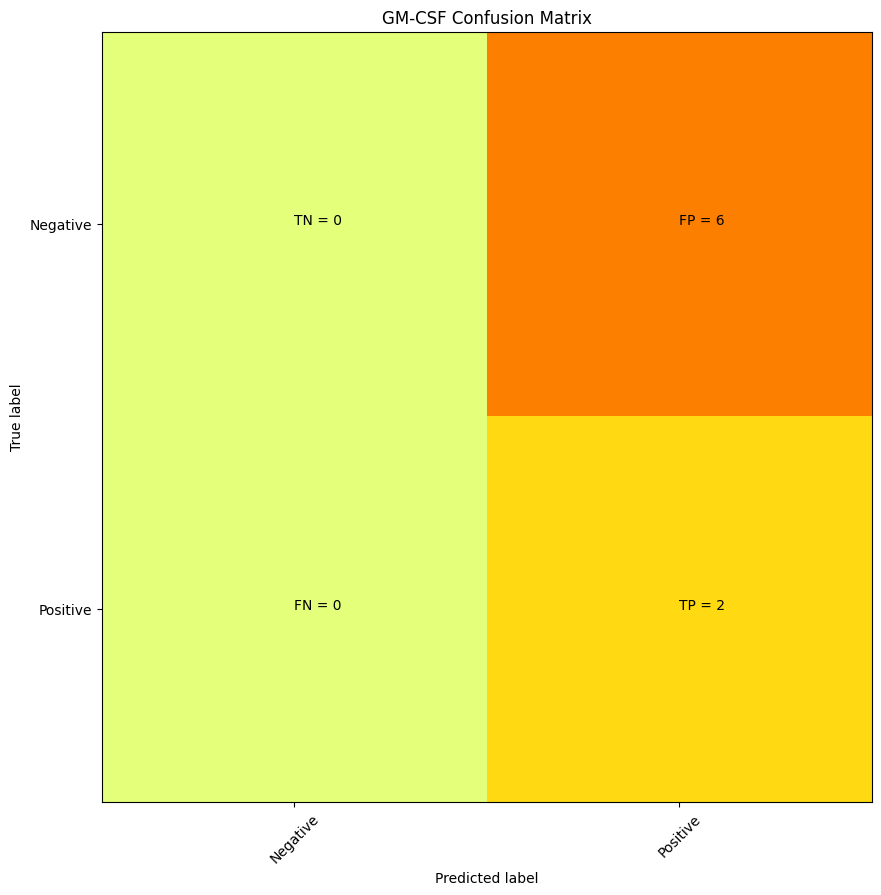

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
F12        0
J03        0
A23        0
O04        0
P17        0
I16        0
B10        0
K16        0 precision = 0.25 recall = 1.0


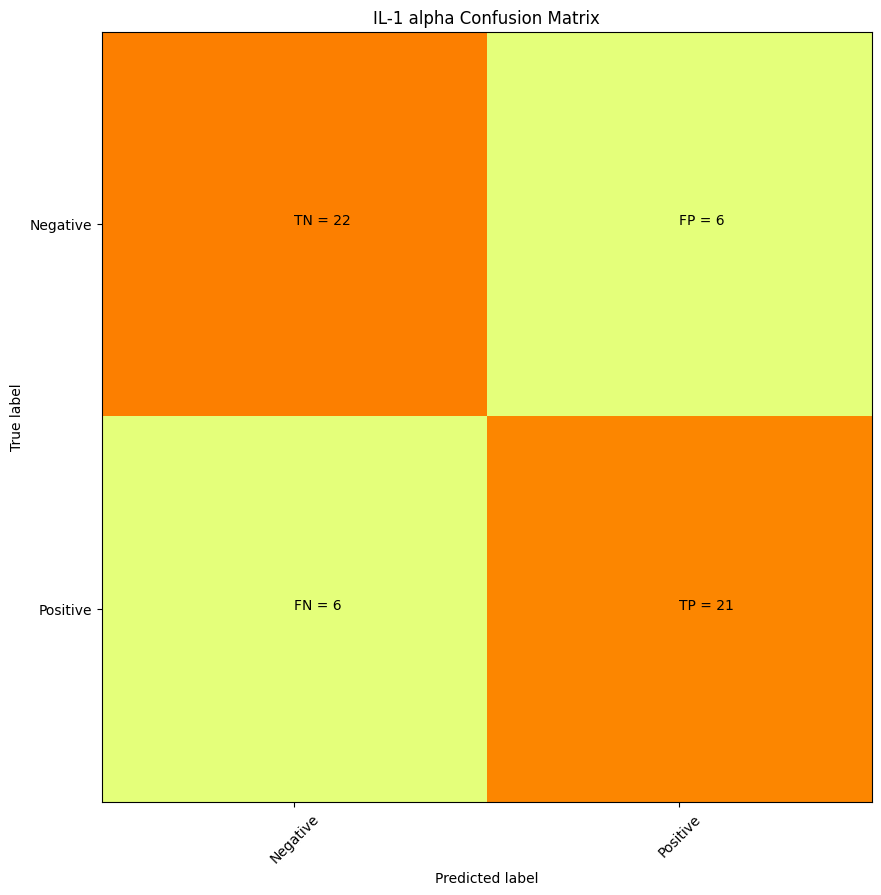

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
I02            0
F09           

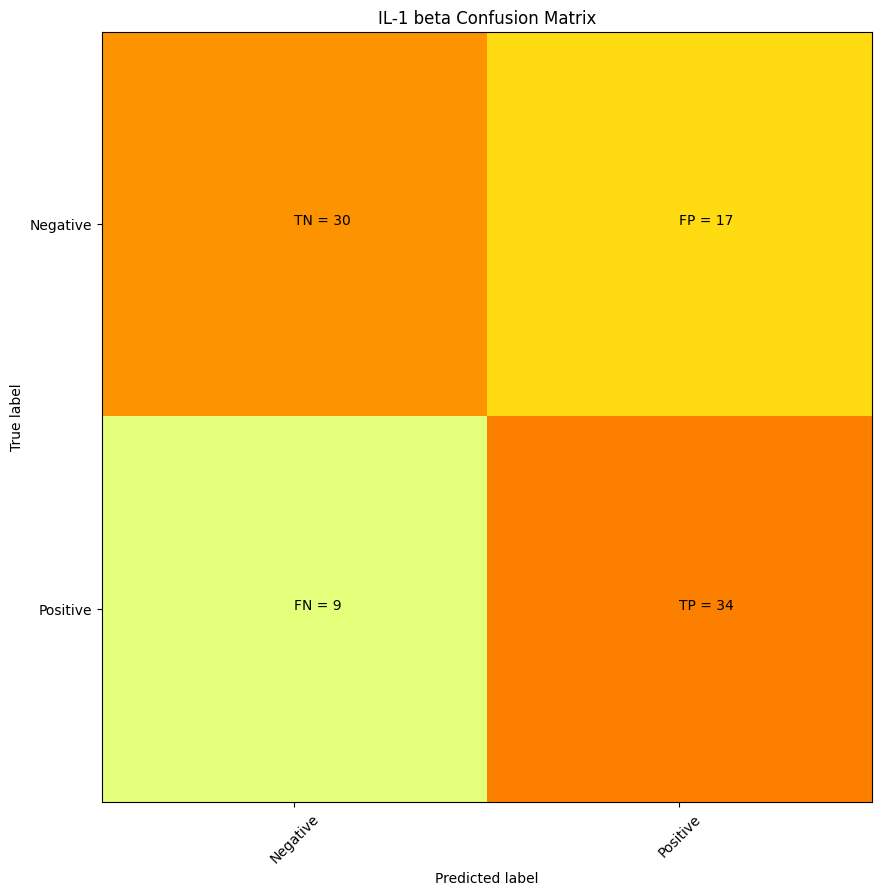

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

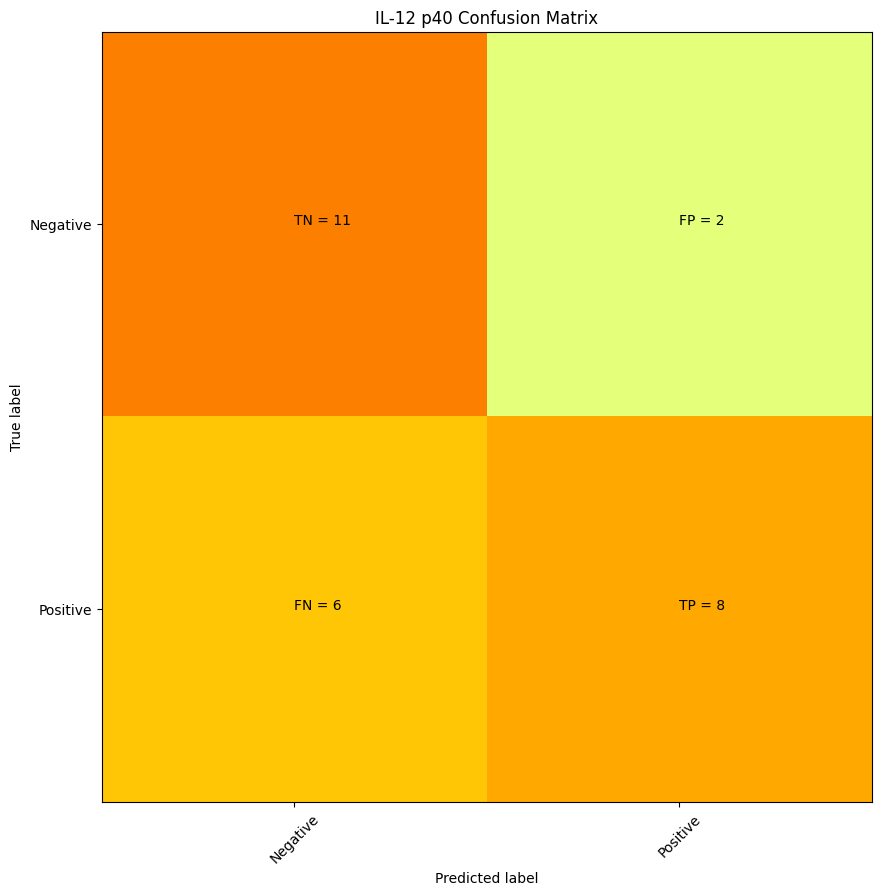

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
D15           0
F05           0
N15           0
D21           0
F03           0
J06           0
K14           0
L04           0
B04           0
J08           0
B09           0
E04           0
A09           0
M11           0
M17           0
H02           0
G24           0
J02           0
B03           0
O01           0
H09           0
J19           0
J16           0
M13           0
H01           0
I21           0
B02           0 precision = 0.8 recall = 0.5714285714285714


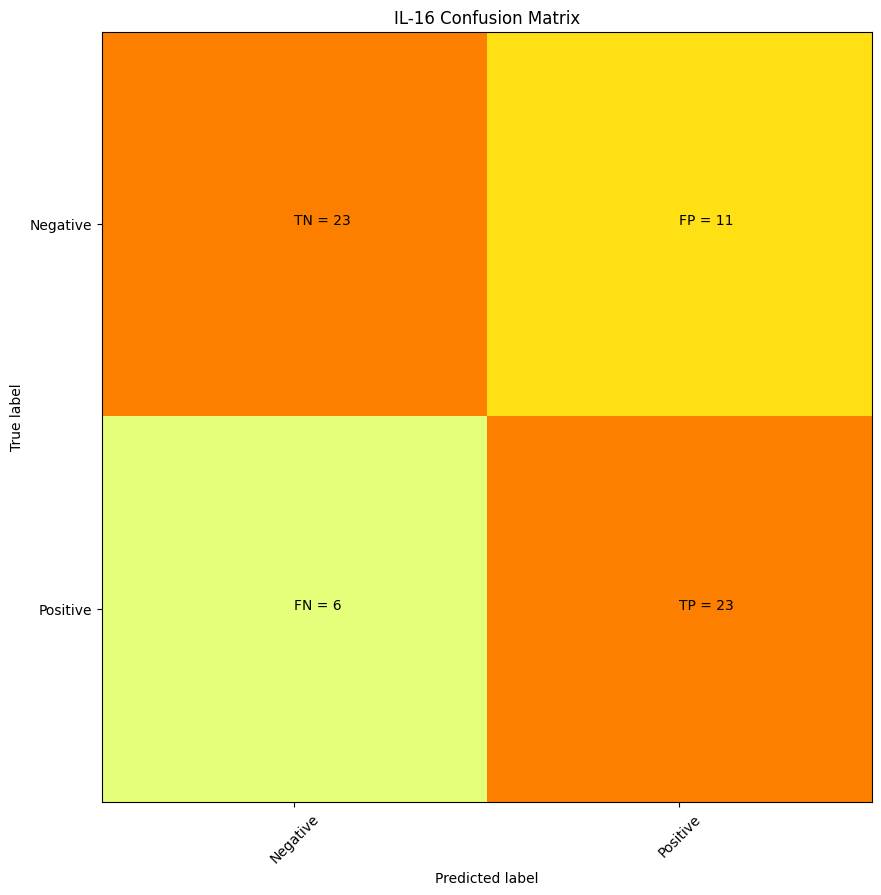

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
P19       0
B15       0
C05       0
B10       0
N01       0
E19       0
E05       0
J17       0
E06       0
K04       0
I03       0
F22       0
P01       0
A07       0
D19       0
N10       0
B05       0
I01       0
H21 

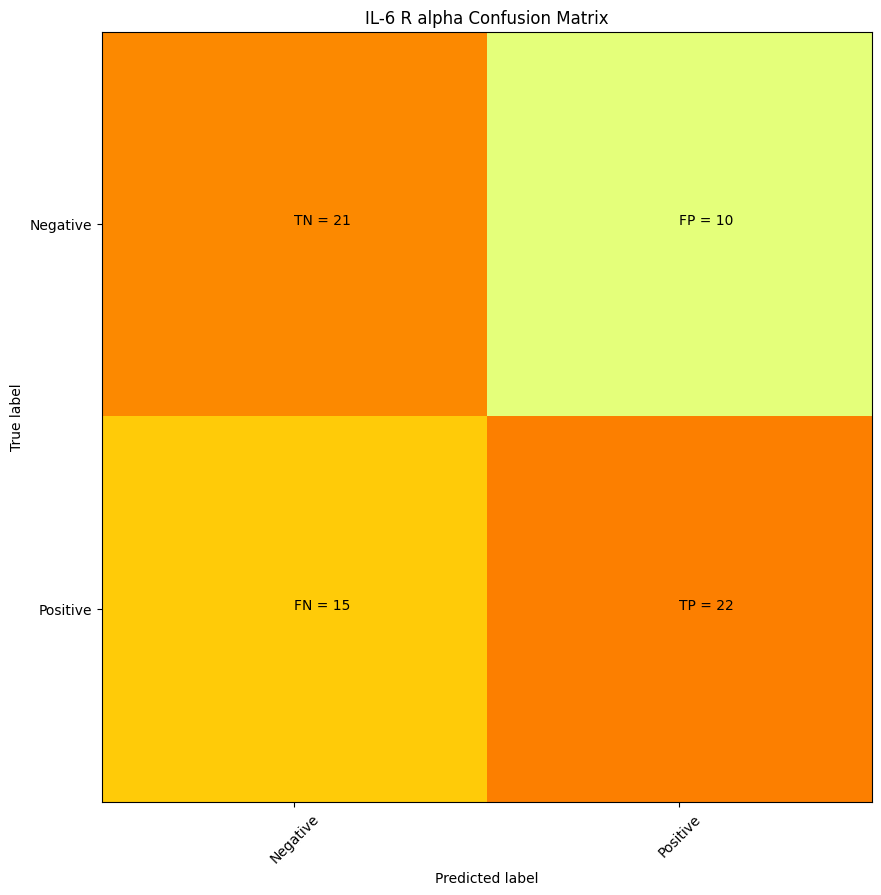

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

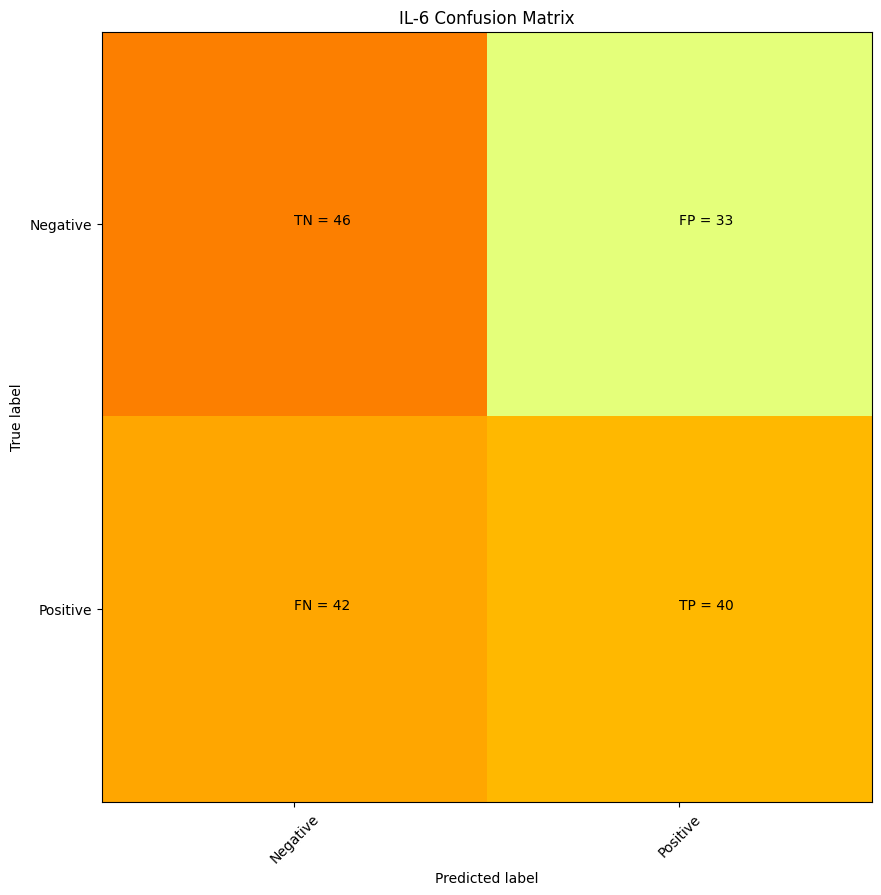

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

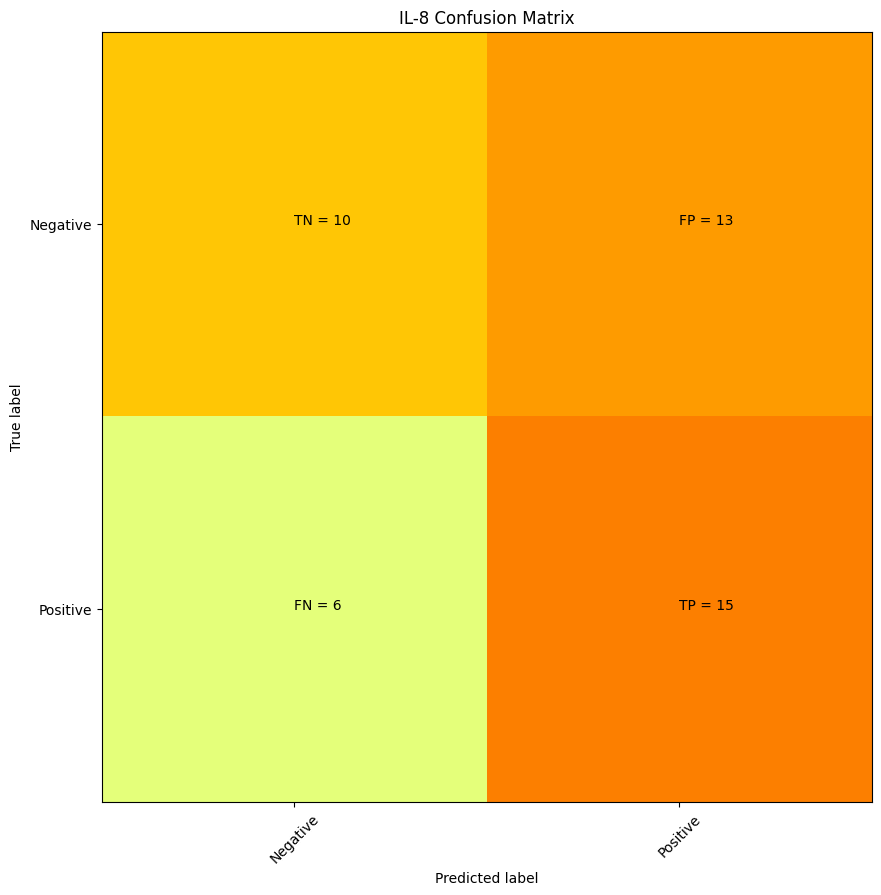

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
N17      0
N16      0
G17      0
A12      0
E09      0
J22      0
N14      0
M14      0
A06      0
D14      0
M07      0
C12      0
O24      0
J20      0
G15      0
L10      0
C02      0
N05      0
C22      0
J15      0
D09      0
I16      0
P10      0
C07      0
F02      0
E08      0
F20      0
D01      0
F09      0
L03      0
F16      0
P09      0
O06      0
B06      0
N09      0
M06      0
P12      0
B04      0
E20      0
J13      0
C20      0
M18      0
I02      0
I12      0 precision 

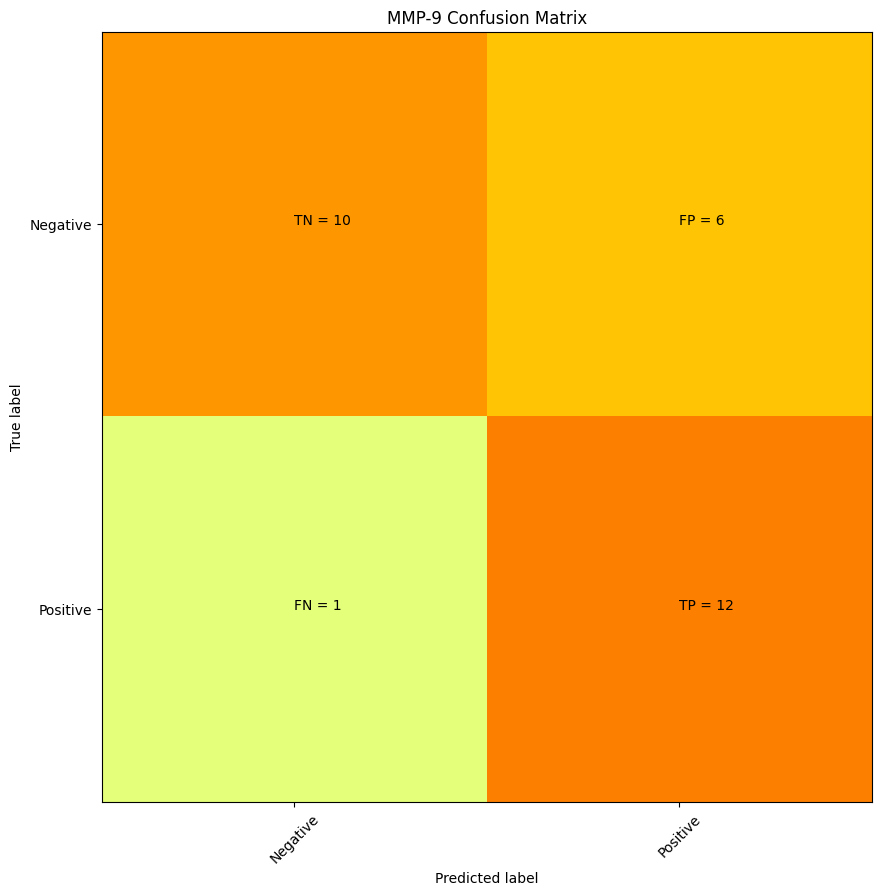

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
C16       0
G21       0
A11       0
G04       0
C15       0
B09       0
J03       0
M22       0
E08       0
O02       0
L05       0
I10       0
B15       0
L16       0
P22       0
H19       0
O03       0
K04       0
C08       0
B13       0
A16       0
C18       0
N23       0
I13       0
P02       0
L15       0
N21       0
K21       0
I17       0 precision = 0.6666666666666666 recall = 0.9230769230769231


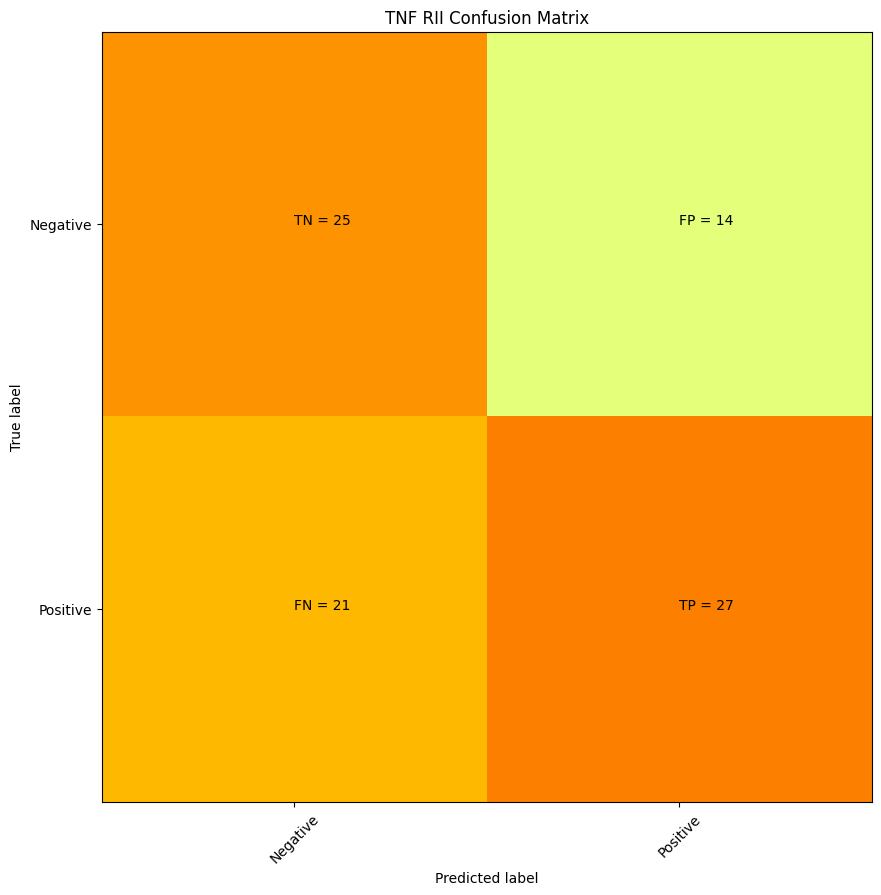

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [50]:
summarizing = []
summarizer_univariates = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in univariates_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_univariates = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_univariates['Precision'] = summarizer_univariates['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [51]:
summarizer_univariates

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.458333,0.478261,10,47
1,CCL1,0.518519,0.666667,10,46
2,CCL19,0.800000,0.666667,10,12
3,CCL2,0.775000,0.607843,10,95
4,CCL20,0.722222,0.764706,10,30
5,CCL22,0.579710,0.625000,10,125
6,CCL4,0.700000,0.538462,10,46
7,CCL5,0.532468,0.602941,10,133
8,CD14,0.703704,0.593750,10,61
9,CRP,0.557692,0.725000,10,86


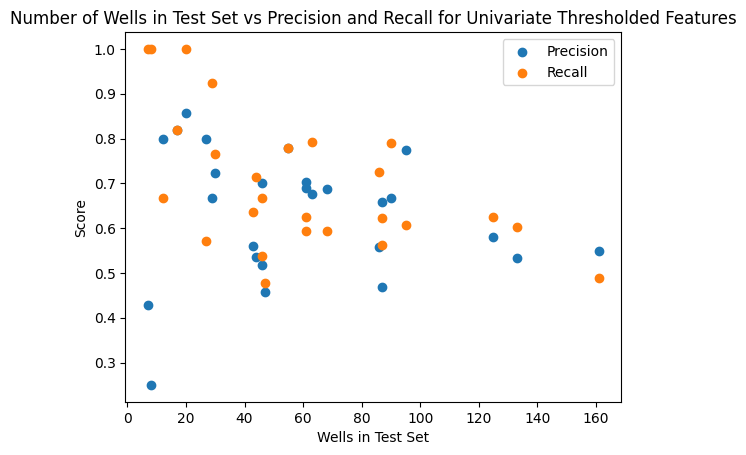

In [52]:
#Observe there is essentially no trend. 
#This supports that we are not simply overfitting for cyotkines with low numbers of responder wells.
plt.scatter(y=summarizer_univariates["Precision"], x = summarizer_univariates["Wells in Set"])
plt.scatter(y=summarizer_univariates["Recall"], x = summarizer_univariates["Wells in Set"])
plt.xlabel("Wells in Test Set")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for Univariate Thresholded Features")
plt.show()

## Performance of Classifier with Recursive Feature Elimination to top 10 important features

In [53]:
rfefs_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = rfefs[rfefs["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        rfefs_listing.append(finaldata)
    except:
        continue

rfefs_listing[0]

Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_12,Output_266,Output_298,Output_310,Output_378,Output_418,Output_698,Output_711,Output_1045,Output_1189
well,,,,,,,,,,,
A09,1,1.263069,2.743326,0.422067,0.058228,2.038401,0.205203,4.060199,0.702426,2.196149,1.309851
C03,1,1.434310,2.739638,0.413697,0.201467,2.129514,0.195436,4.066446,0.866981,2.147823,1.086402
C09,1,1.566862,2.806088,0.376265,0.234372,1.815243,0.286625,4.032588,0.908664,2.528739,1.124413
C17,1,1.608116,2.829772,0.357709,0.072700,2.130821,0.214580,4.024552,0.957807,2.667008,1.095049
F03,1,1.549089,2.827665,0.377883,0.225987,1.812413,0.273635,4.110686,0.875957,2.236673,1.166205
F04,1,1.363993,2.833671,0.409586,0.110347,1.922596,0.238774,4.003168,0.849688,2.149233,1.248748
F05,1,1.448455,2.762239,0.390773,0.187533,1.891648,0.141138,3.994655,0.725806,2.470553,1.293726
F08,1,1.417612,2.806685,0.396638,0.178165,1.717549,0.271332,4.236888,0.887890,2.115618,1.049144
F09,1,1.371652,2.795495,0.383216,0.144675,1.858805,0.158786,4.125930,0.803595,2.169714,1.158309


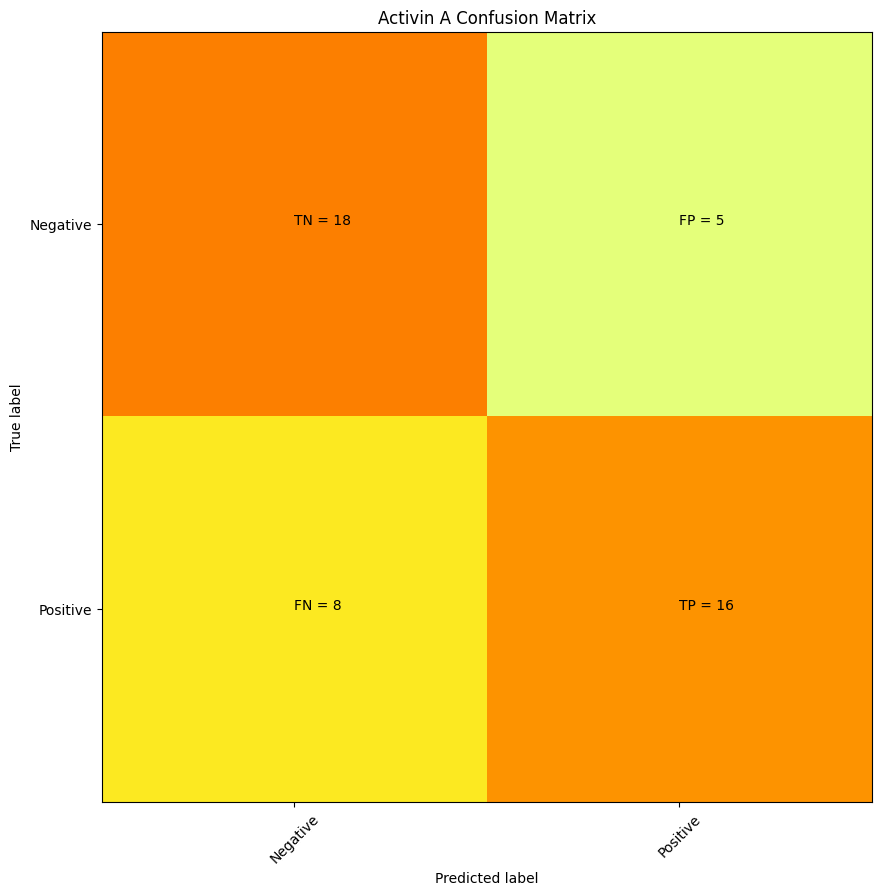

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
M11           0
G23           0
A13           0
D07           0
M10           0
N13           0
N15           0
C01           0
N24           0
I20           0
L19           0
P23           0
L16           0
A16     

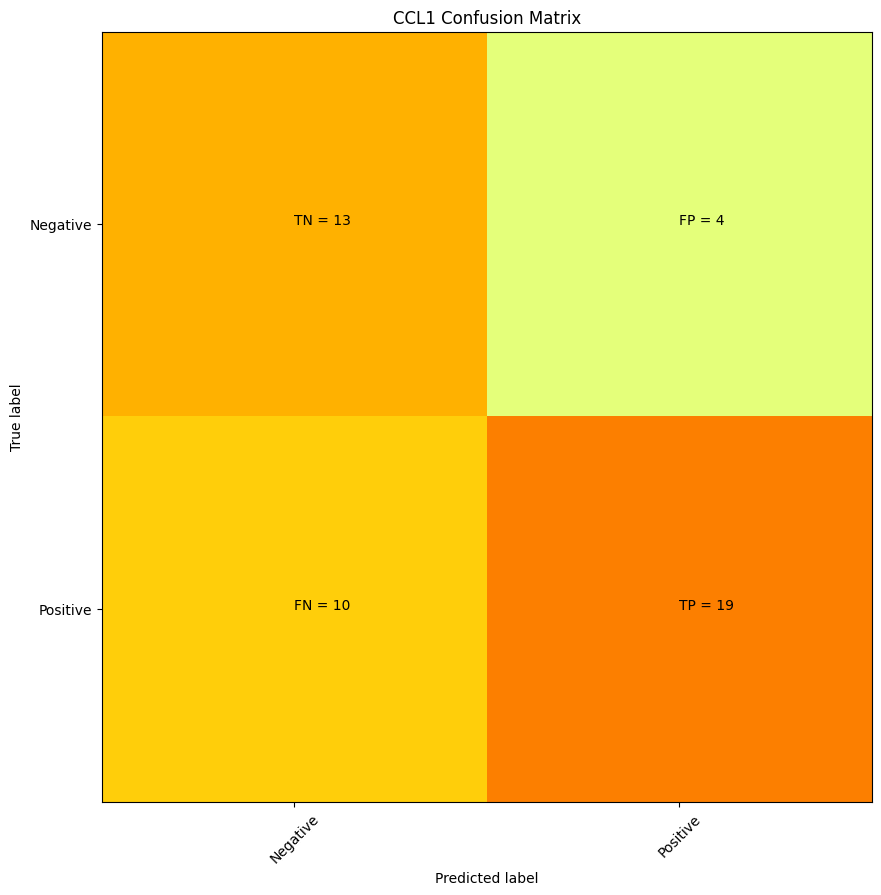

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
L17      0
M21      0
A14      0
G14      0
D11      0
M19      0
E03      0
E17      0
A11      0
G21      0
P16      0
D15      0
M12      0
G06      0
F24      0
N12      0
J15      0
M02      0
K01      0
A22      0
K06      0
G23      0
I13      0
I11      0
N14      0
O16      0
O14      0
B09      0
K11      0
B14      0
K15      0
G08      0
J02      0
O07      0
C23      0
H14      0
C04      0
M04      0
O04      0
K16      0
B05      0
M24      0
I15      0

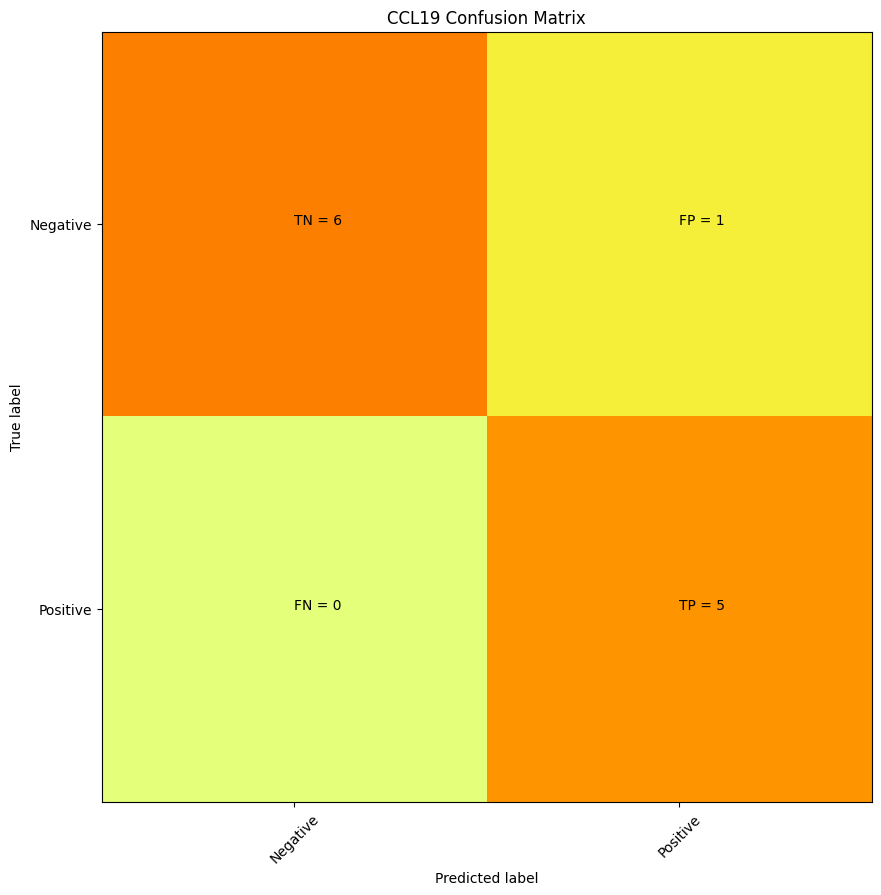

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
F06       0
F23       0
B15       0
B01       0
A09       0
J02       0
P08       0
F19       0
L14       0
F02       0
O19       0
N13       0 precision = 0.8333333333333334 recall = 1.0


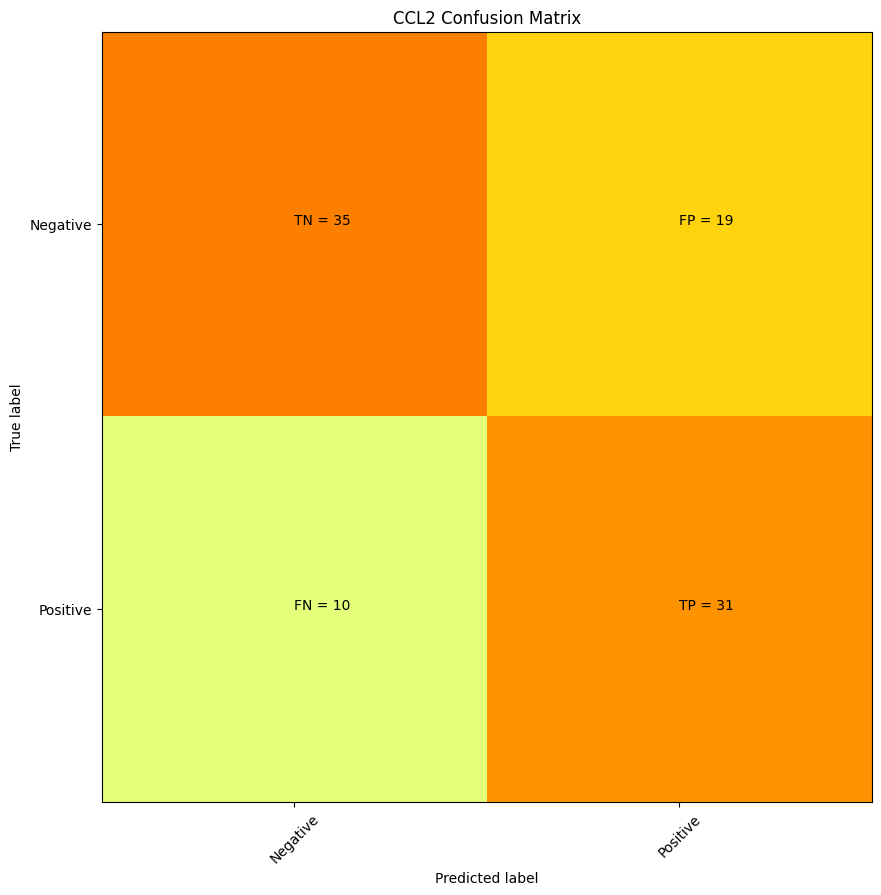

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

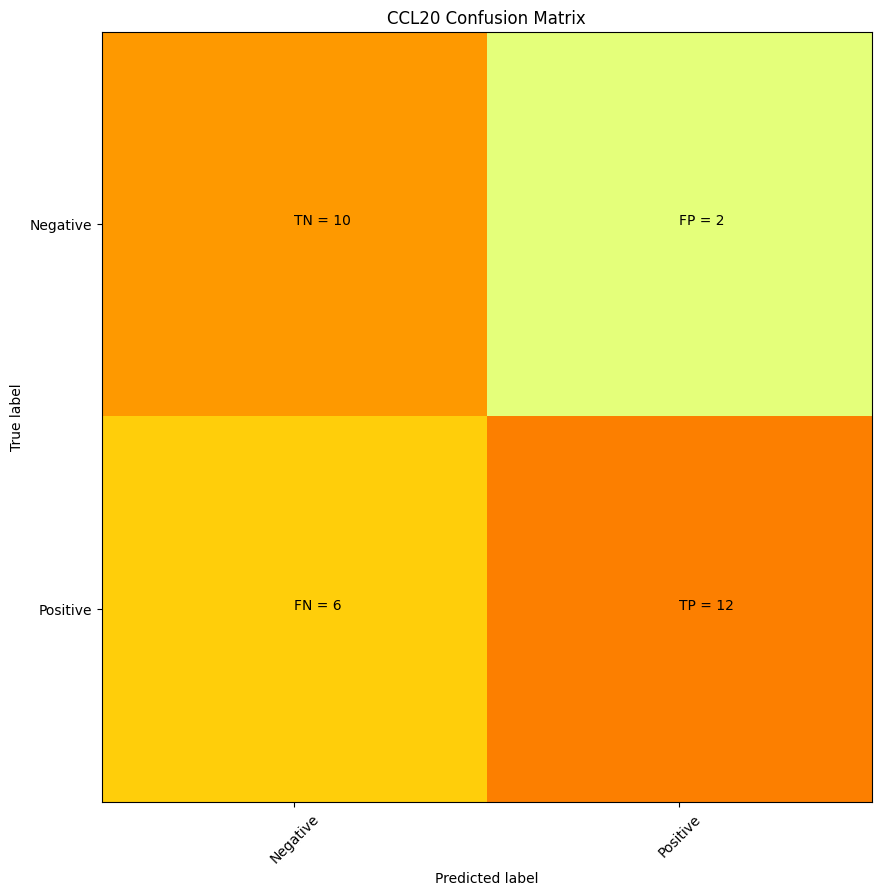

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
I23       0
I17       0
G11       0
J09       0
I19       0
J14       0
E18       0
L05       0
G13       0
L18       0
F22       0
L19       0
J11       0
B12       0
H13       0
J21       0
L17       0
C01       0
N08       0
M04       0
F16       0
I05       0
M07       0
H15       0
P18       0
J06       0
K02       0
H03       0
H01       0
O07       0 precision = 0.8571428571428571 recall = 0.6666666666666666


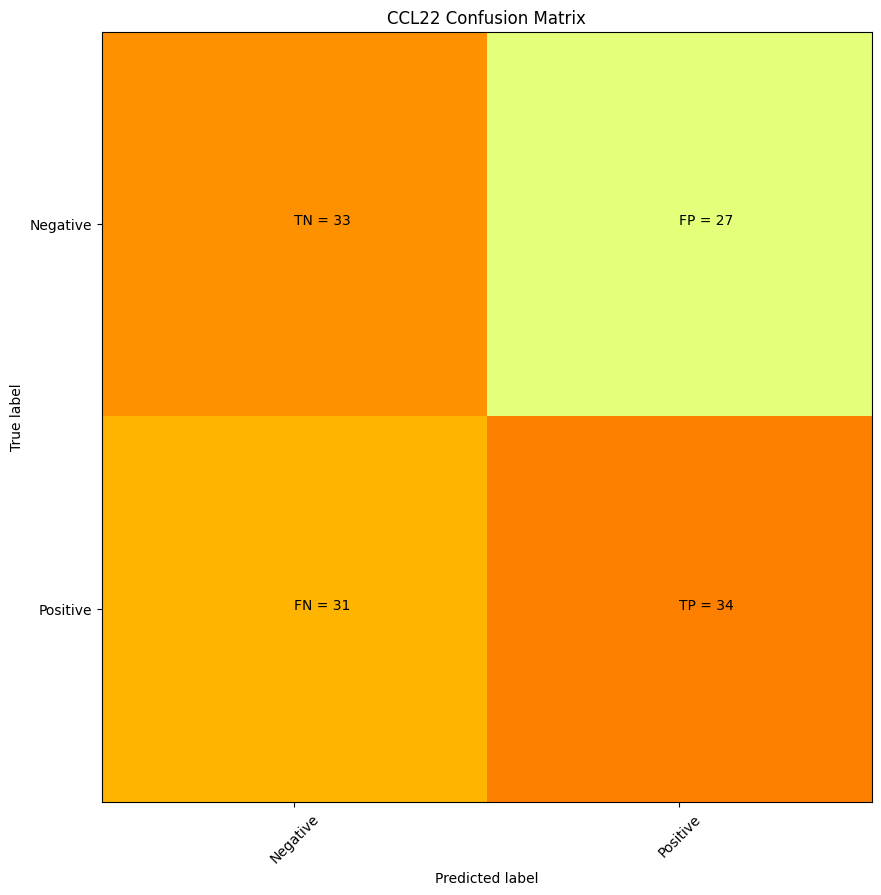

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

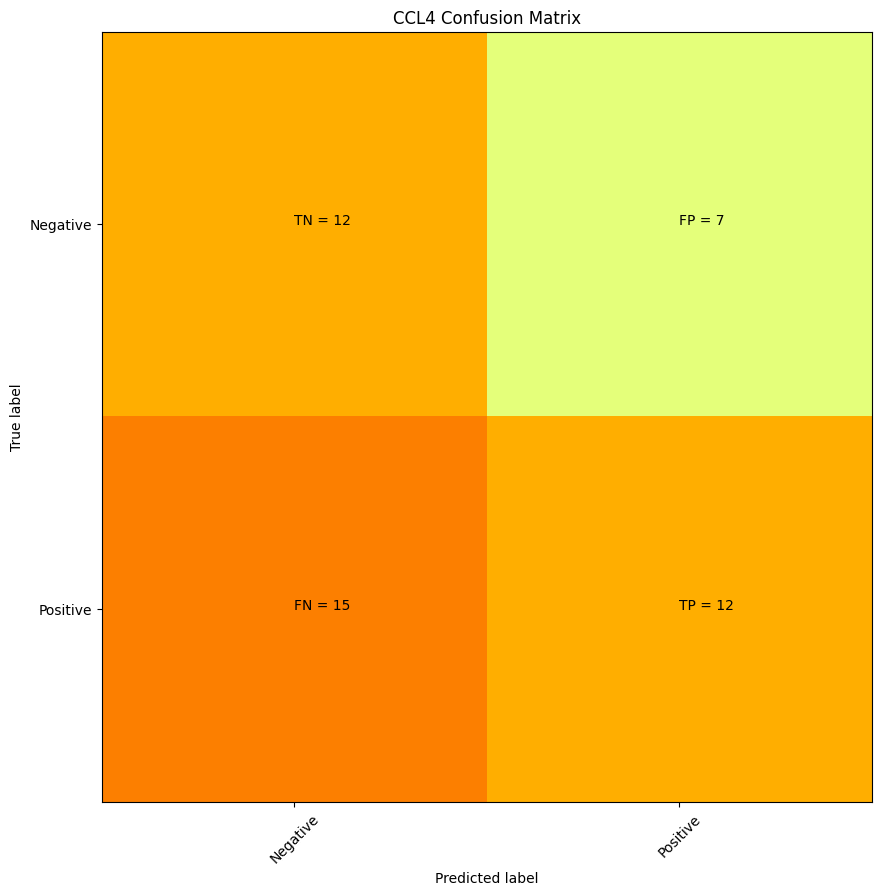

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P12      0
L02      0
K14      0
M20      0
M06      0
P24      0
L03      0
O22      0
F22      0
M08      0
N16      0
H04      0
N15      0
F08      0
M21      0
H10      0
E06      0
D03      0
D09      0
F20      0
C24      0
G01      0
P10      0
H05      0
F03      0
I09      0
N12      0
P16      0
C12      0
M03      0
B15      0
F21      0
B12      0
B14      0
K21      0
G12      0
L15      0
F16      0
C20      0
F17      0
A01      0
D10      0
O23      0

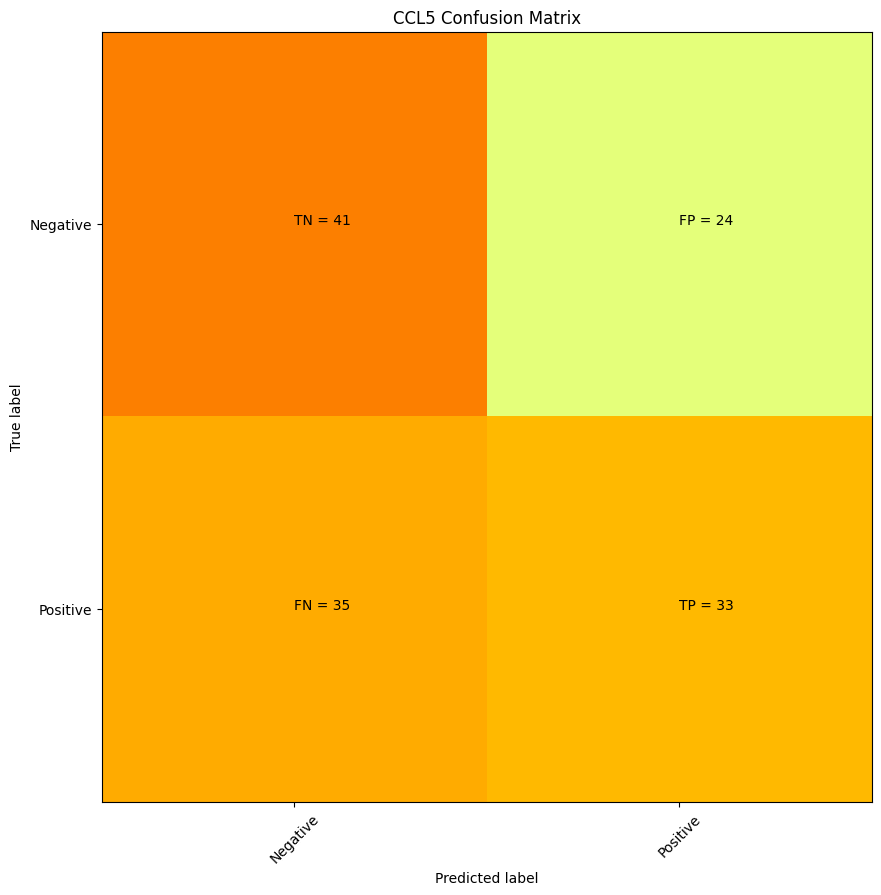

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

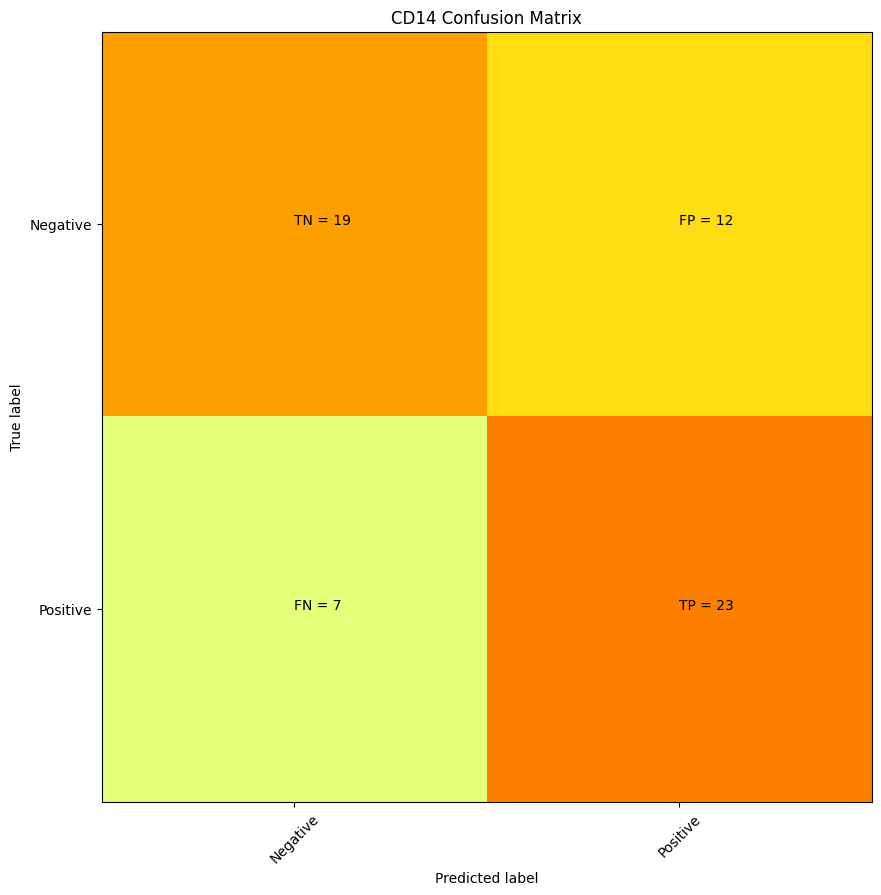

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
D17      0
I18      0
E24      0
N12      0
K03      0
I01      0
J12      0
O02      0
G21      0
H23      0
L17      0
L06      0
N15      0
M12      0
J19      0
J22      0
I15      0
C20      0
P19      0
B17      0
J01      0
C13      0
I02      0
H21      0
I08      0
A18      0
A17      0
H04      0

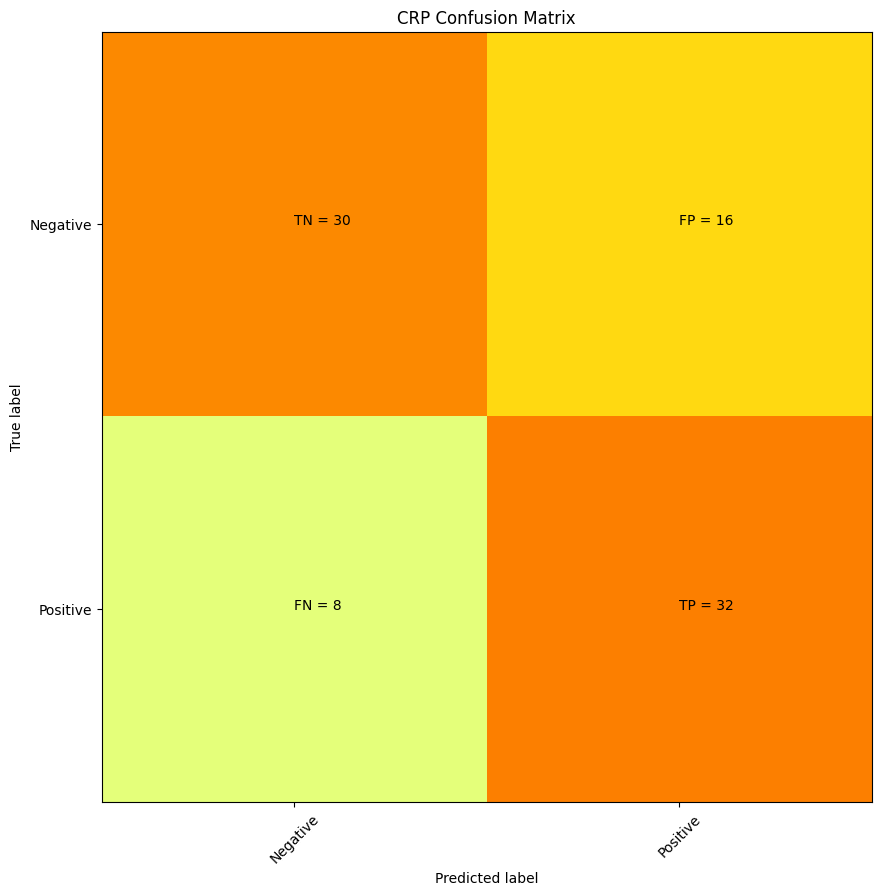

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
H16     0
O20     0
D01     0
N07     0
N21     0
P01     0
A12     0
A06     0
H01     0
M10     0
G22     0
G07     0


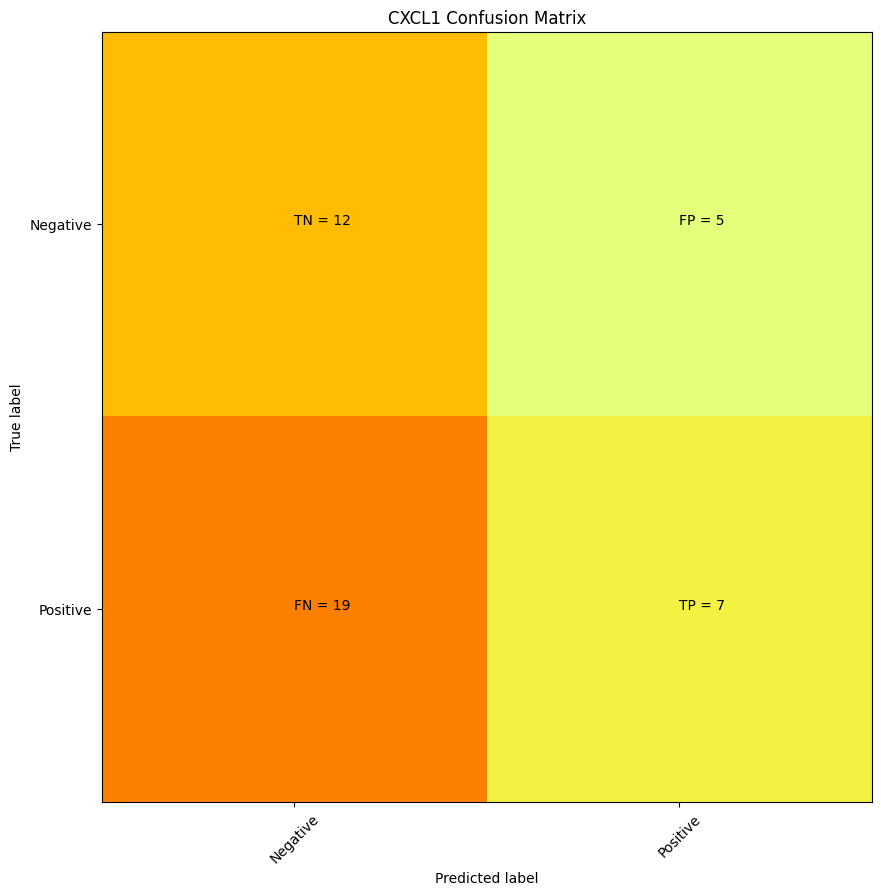

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
L24       0
C24       0
A13       0
D01       0
M16       0
G13       0
L15       0
B08       0
L09       0
A01       0
K23       0
K24       0
A10       0
M21       0
K20       0
K14       0
K21       0
A07       0
D04       0
N06       0
A17       0
M20       0
I22       0
M13       0
O20       0
I12       0
N04       0
G23       0
F21       0
B18       0
D18       0
A08       0
I24       0
C03       0
P14       0
G10       0
E21       0
N24       0
M03 

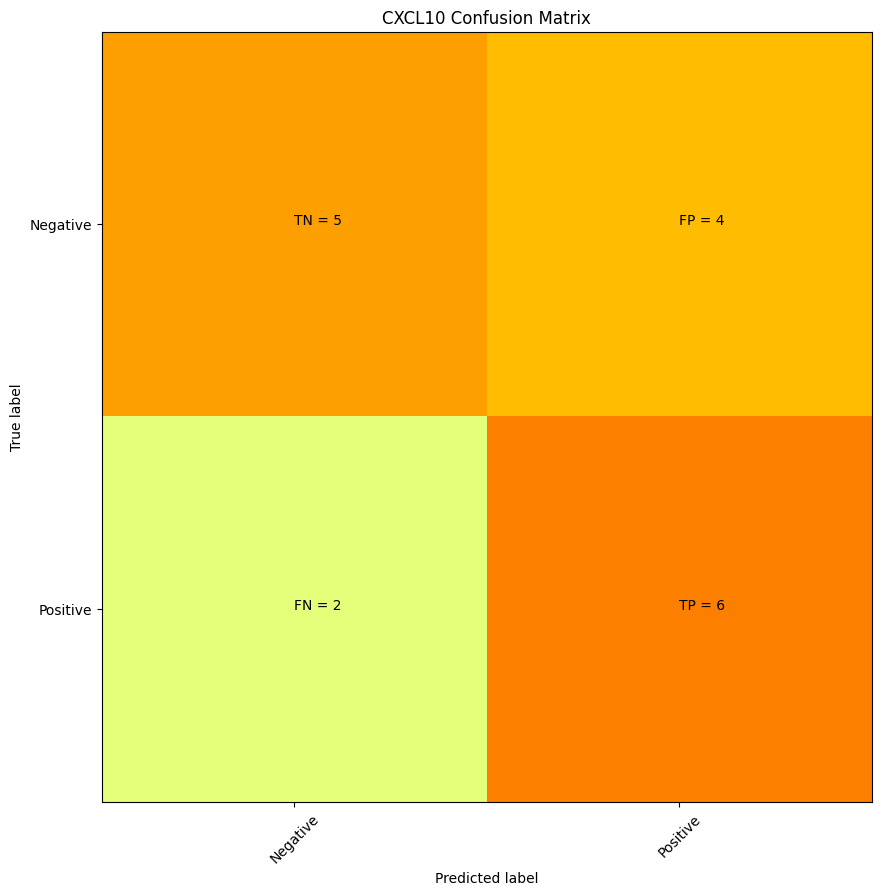

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
N16        0
C22        0
C11        0
J01        0
J07        0
G24        0
P03        0
F03        0
C14        0
E16        0
J04        0
D09        0
F07        0
G10        0
B12        0
A22        0
O20        0 precision = 0.6 recall = 0.75


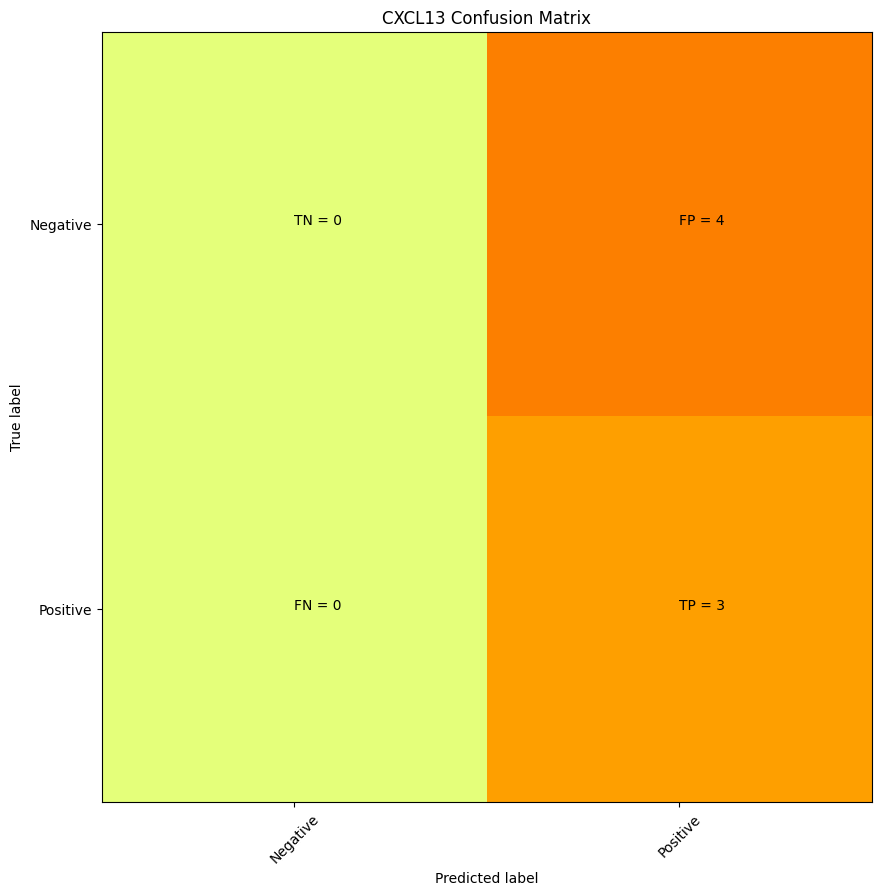

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
H09        0
E20        0
N19        0
N18        0
A01        0
C15        0
J22        0 precision = 0.42857142857142855 recall = 1.0


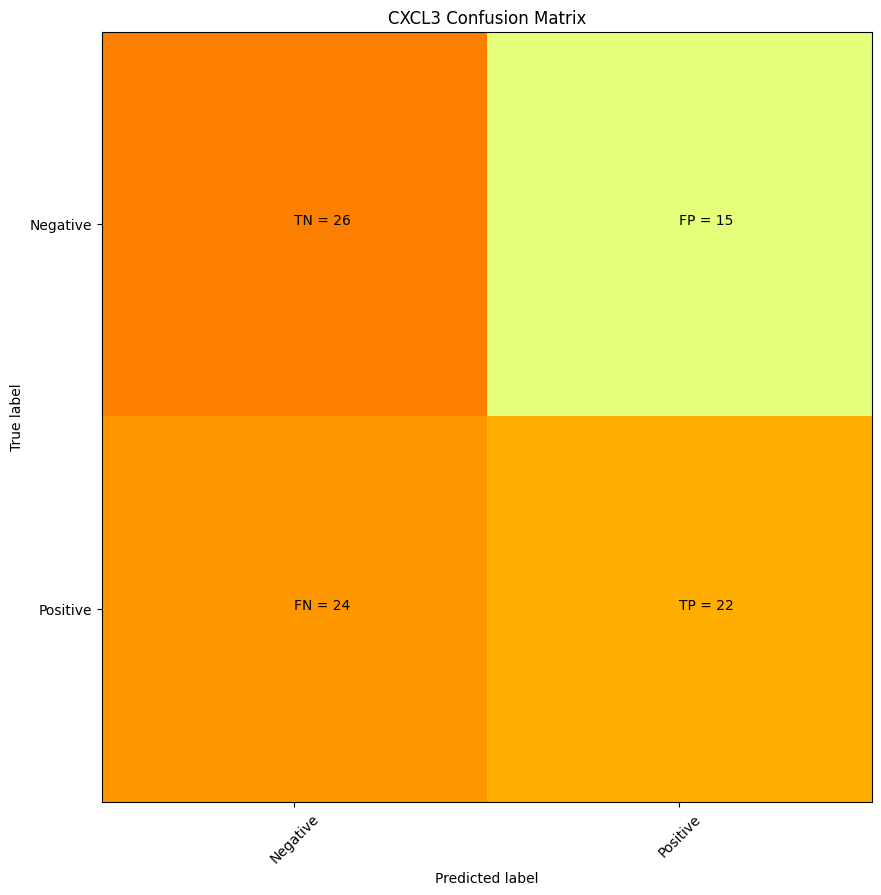

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

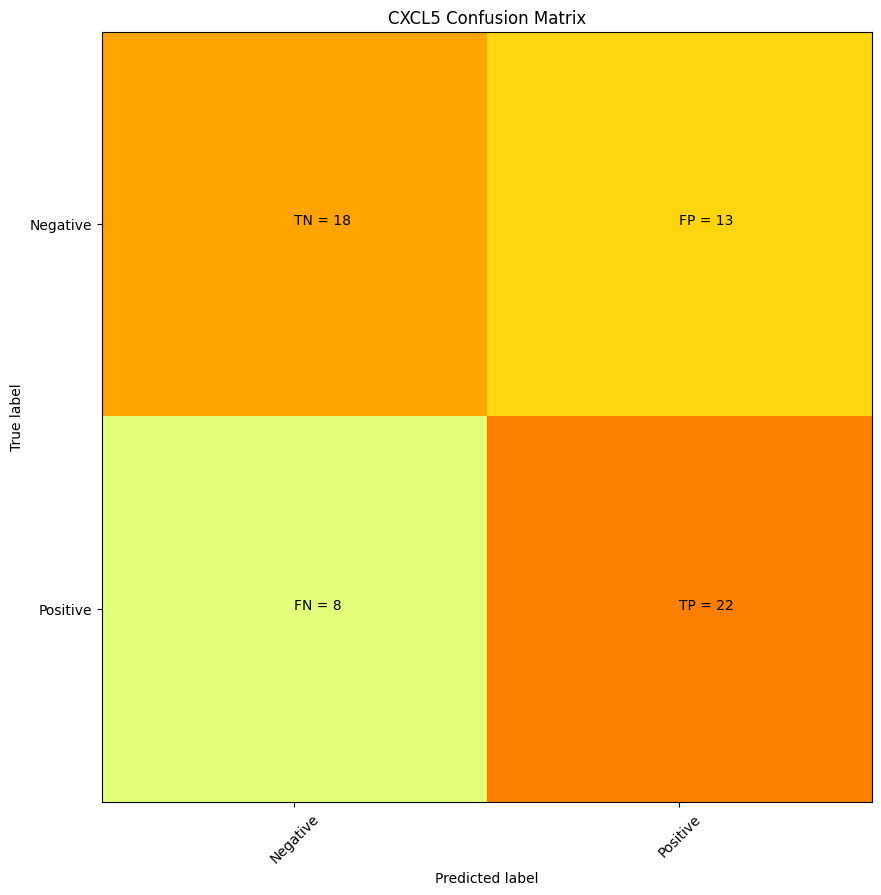

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H17       0
N19       0
D10       0
H10       0
B05       0
J20       0
H09       0
K12       0
N18       0
O06       0
K06       0
K08       0
E14       0
P14       0
K05       0
C21       0
B01       0
J15       0
B06       0
D21       0
C13 

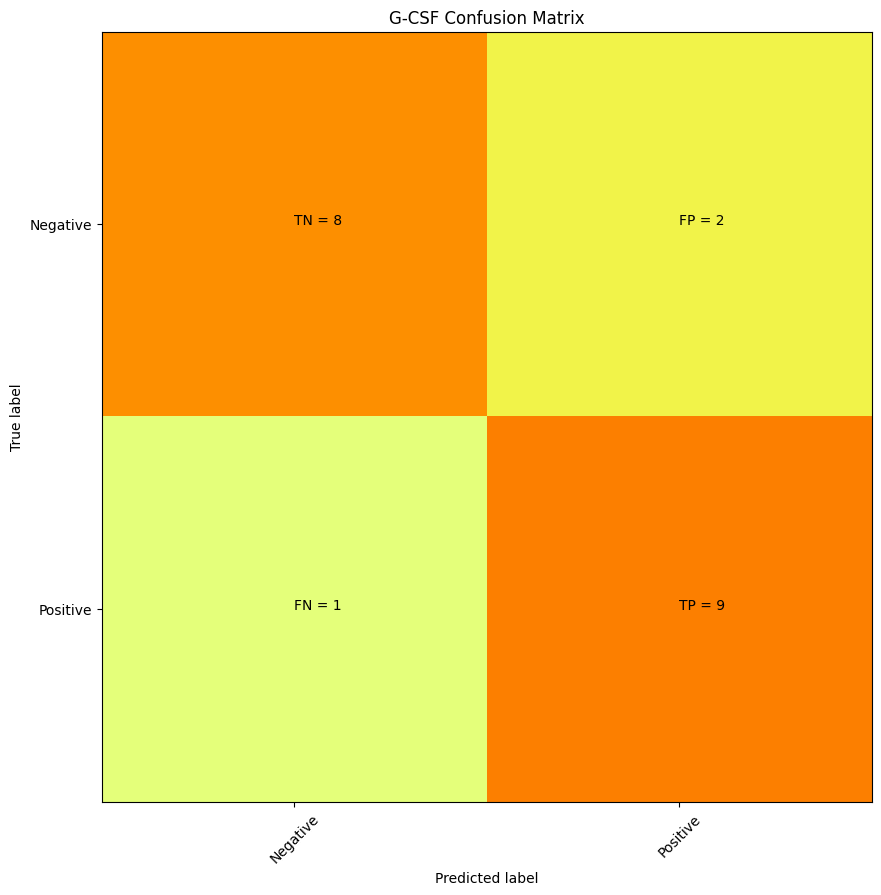

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
N22       0
G23       0
H05       0
L05       0
P14       0
L14       0
J16       0
L22       0
H18       0
N24       0
C03       0
N15       0
A21       0
O06       0
I13       0
P19       0
O21       0
C12       0
G03       0
I15       0 precision = 0.8181818181818182 recall = 0.9


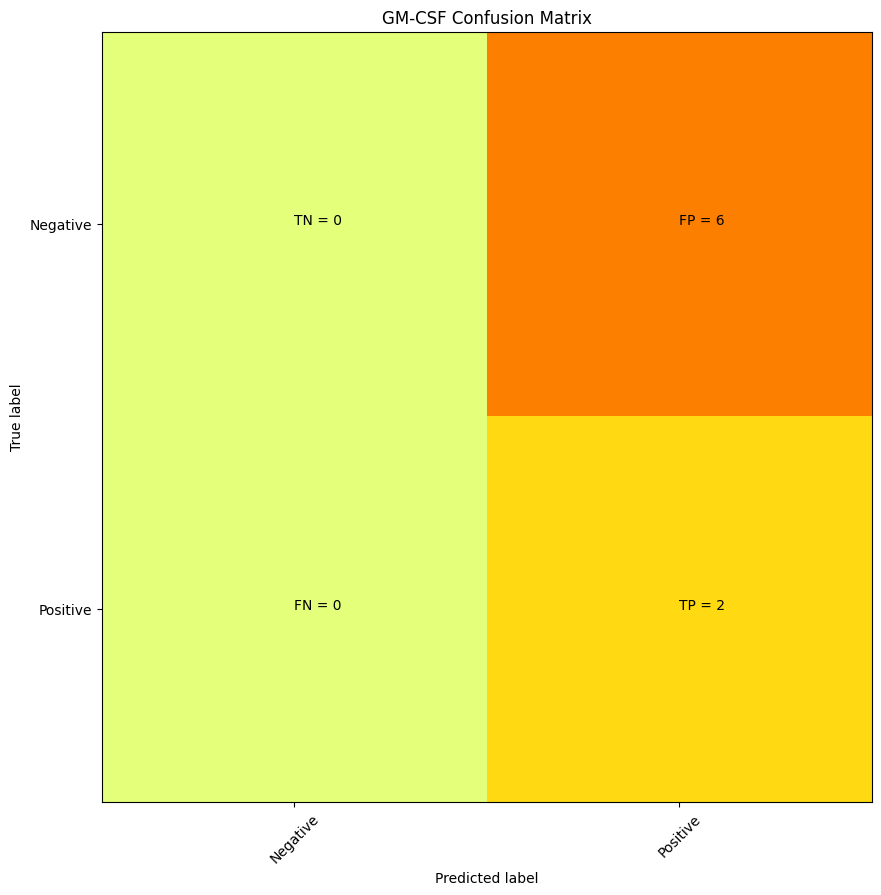

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
F12        0
J03        0
A23        0
O04        0
P17        0
I16        0
B10        0
K16        0 precision = 0.25 recall = 1.0


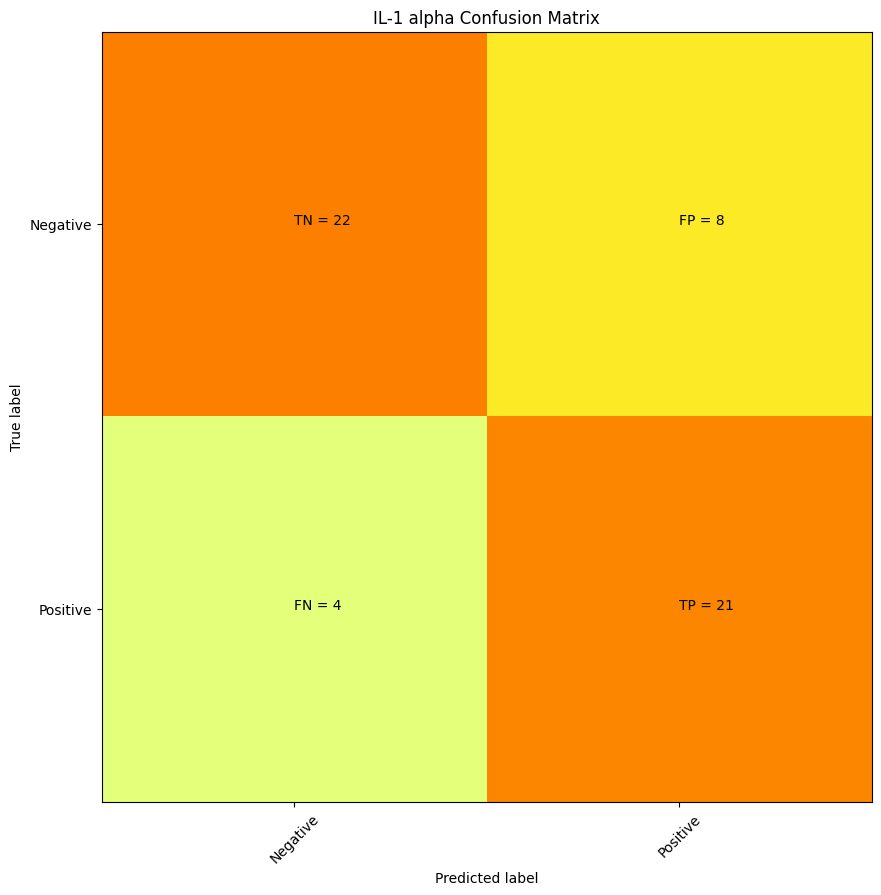

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
I02            0
F09           

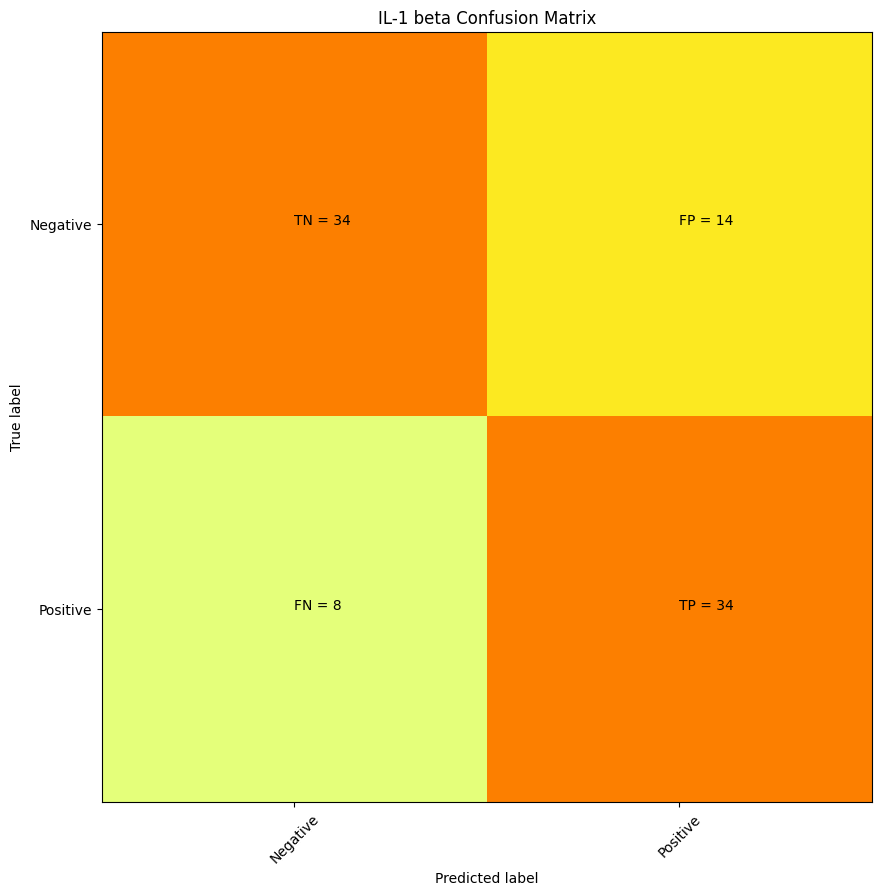

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

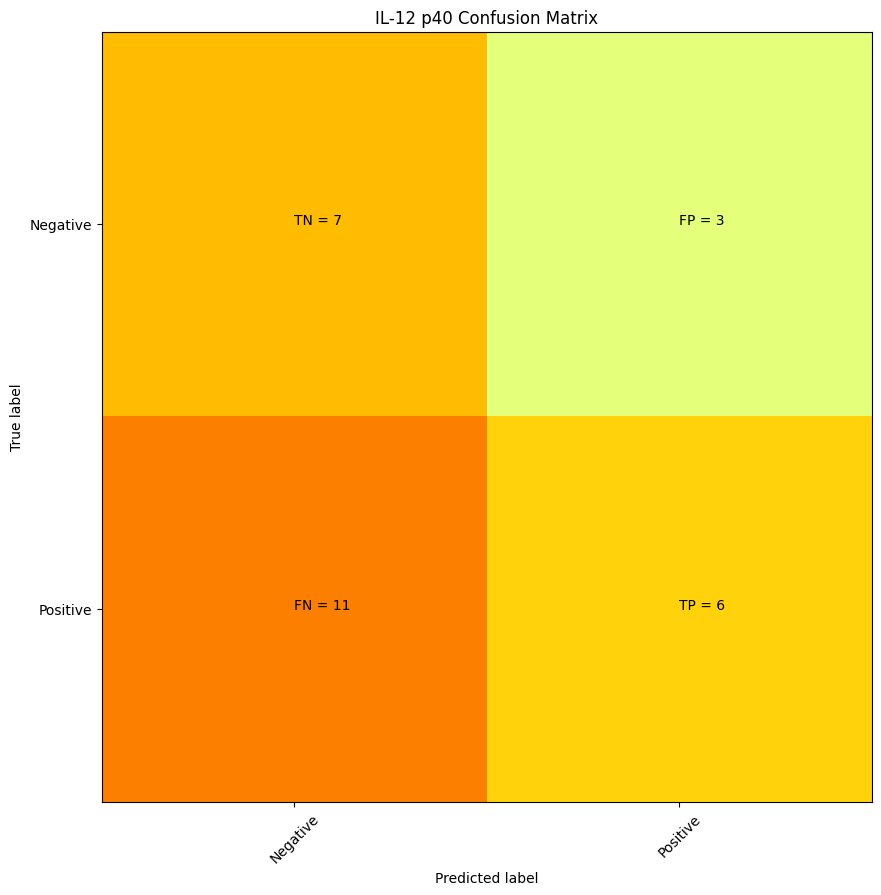

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
D15           0
F05           0
N15           0
D21           0
F03           0
J06           0
K14           0
L04           0
B04           0
J08           0
B09           0
E04           0
A09           0
M11           0
M17           0
H02           0
G24           0
J02           0
B03           0
O01           0
H09           0
J19           0
J16           0
M13           0
H01           0
I21           0
B02           0 precision = 0.6666666666666666 recall = 0.35294117647058826


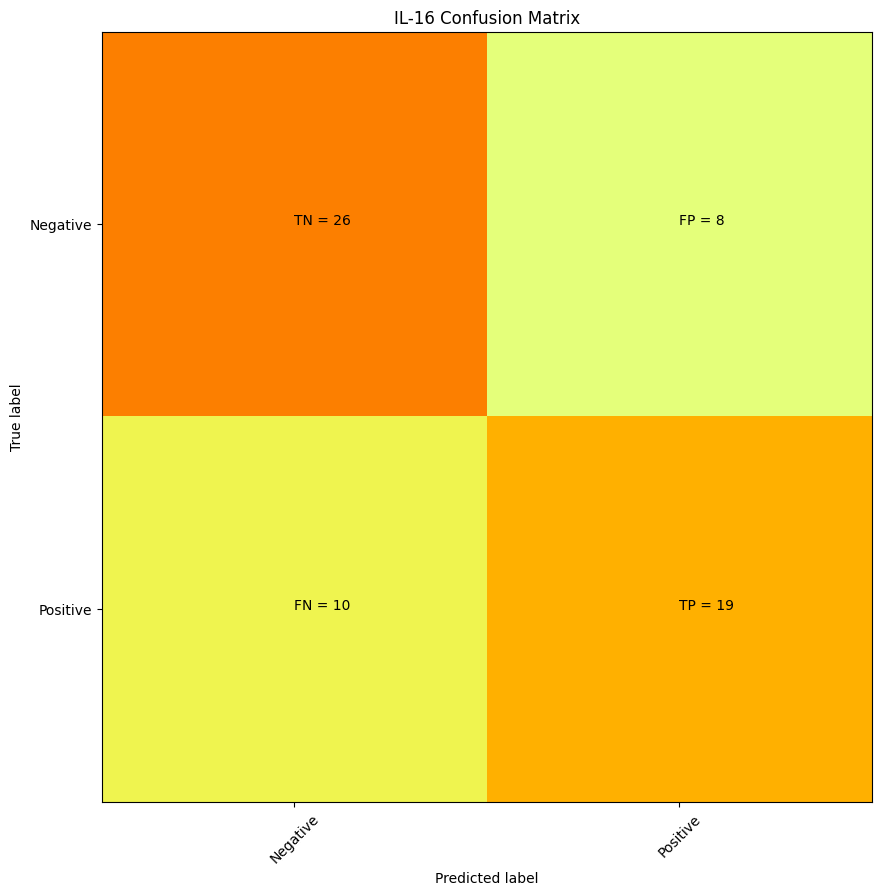

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
P19       0
B15       0
C05       0
B10       0
N01       0
E19       0
E05       0
J17       0
E06       0
K04       0
I03       0
F22       0
P01       0
A07       0
D19       0
N10       0
B05       0
I01       0
H21 

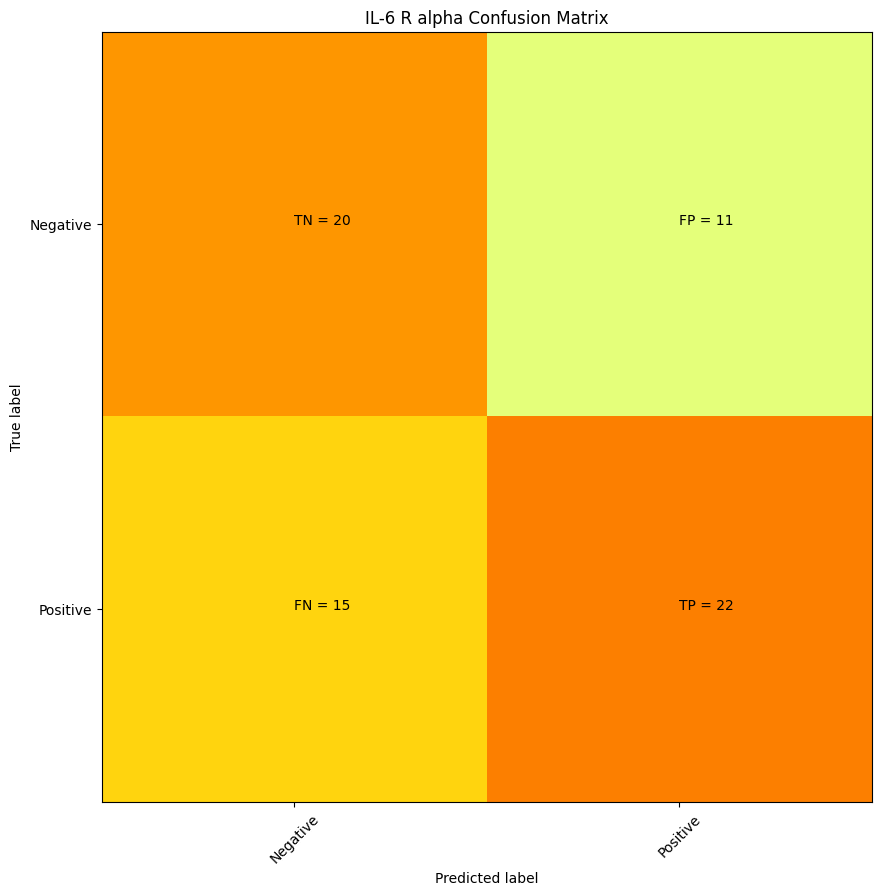

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

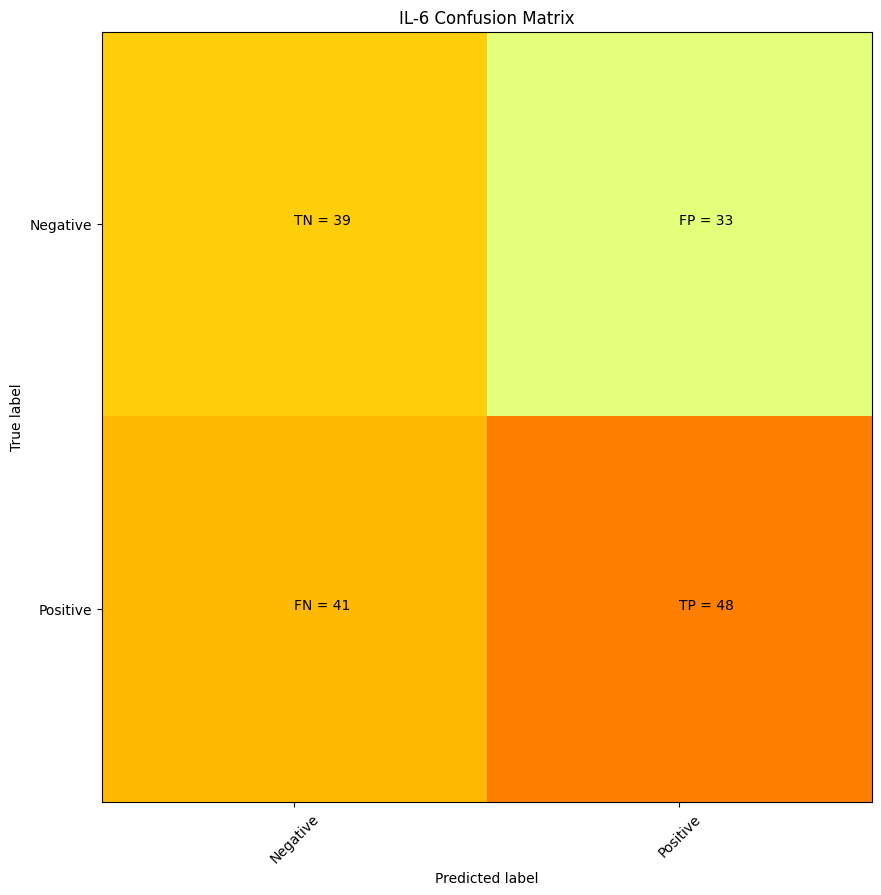

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

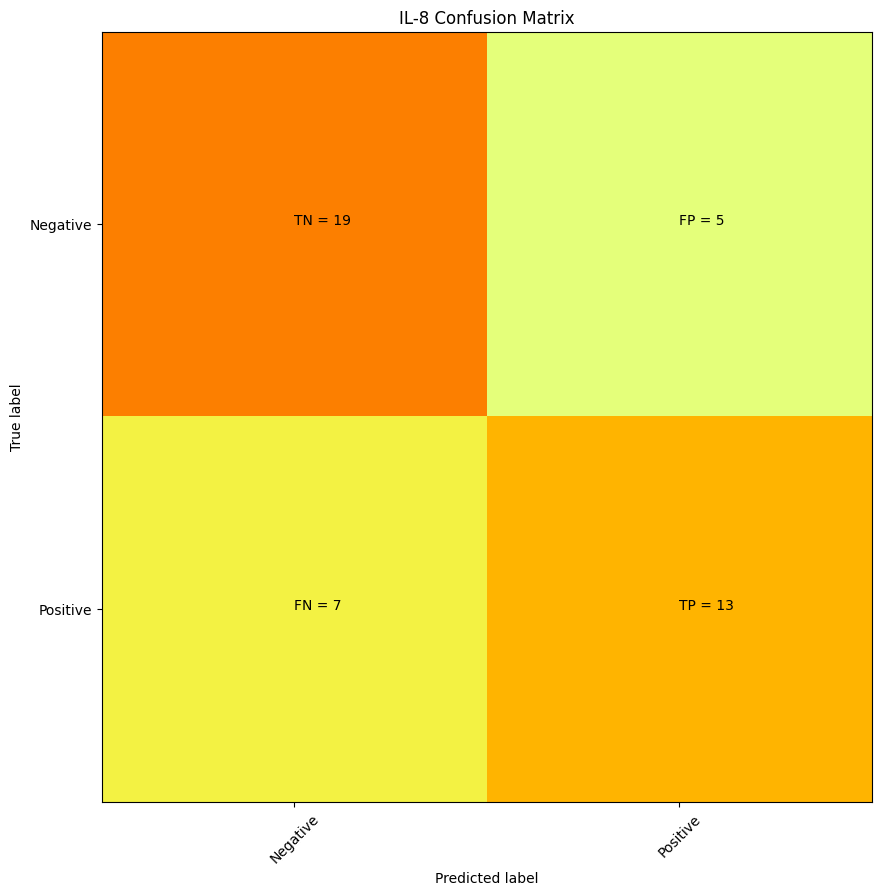

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
N17      0
N16      0
G17      0
A12      0
E09      0
J22      0
N14      0
M14      0
A06      0
D14      0
M07      0
C12      0
O24      0
J20      0
G15      0
L10      0
C02      0
N05      0
C22      0
J15      0
D09      0
I16      0
P10      0
C07      0
F02      0
E08      0
F20      0
D01      0
F09      0
L03      0
F16      0
P09      0
O06      0
B06      0
N09      0
M06      0
P12      0
B04      0
E20      0
J13      0
C20      0
M18      0
I02      0
I12      0 precision 

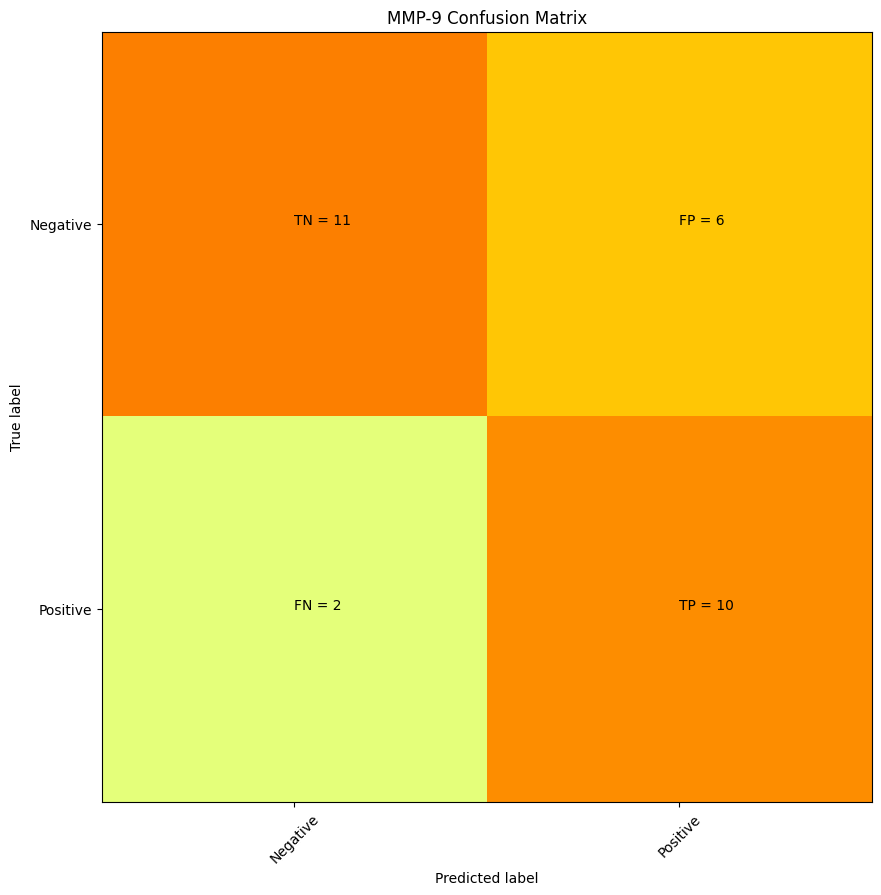

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
C16       0
G21       0
A11       0
G04       0
C15       0
B09       0
J03       0
M22       0
E08       0
O02       0
L05       0
I10       0
B15       0
L16       0
P22       0
H19       0
O03       0
K04       0
C08       0
B13       0
A16       0
C18       0
N23       0
I13       0
P02       0
L15       0
N21       0
K21       0
I17       0 precision = 0.625 recall = 0.8333333333333334


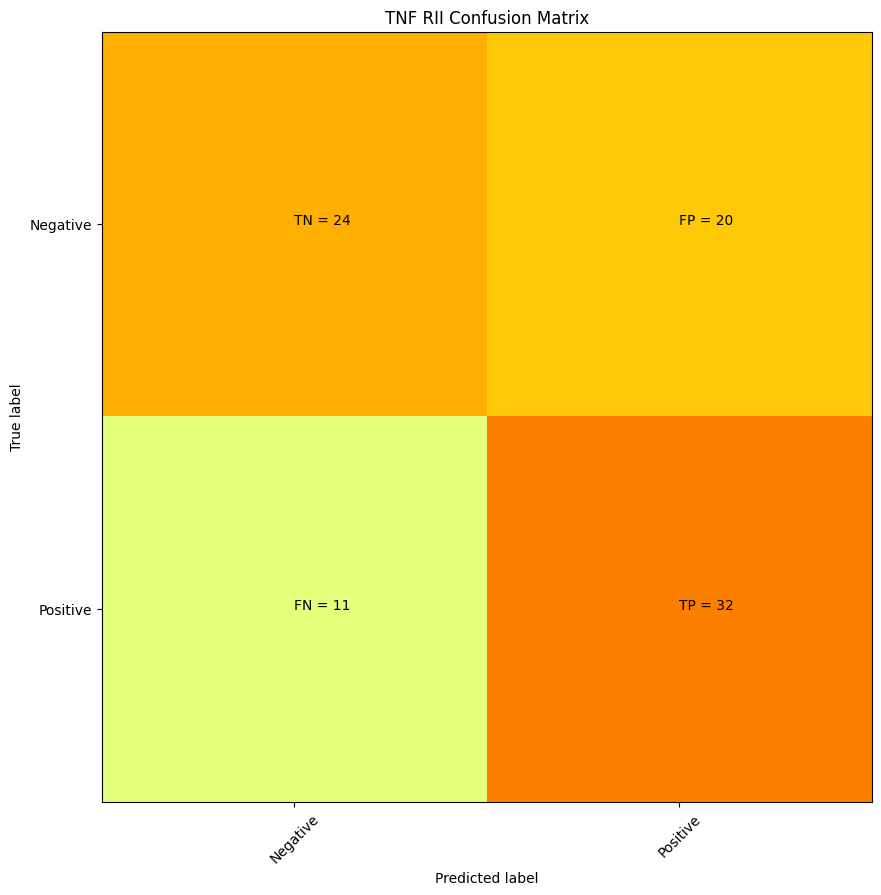

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [54]:
summarizing = []
summarizer_rfefs = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in rfefs_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_rfefs = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_rfefs['Precision'] = summarizer_rfefs['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [55]:
summarizer_rfefs

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.761905,0.666667,10,47
1,CCL1,0.826087,0.655172,10,46
2,CCL19,0.833333,1.000000,10,12
3,CCL2,0.620000,0.756098,10,95
4,CCL20,0.857143,0.666667,10,30
5,CCL22,0.557377,0.523077,10,125
6,CCL4,0.631579,0.444444,10,46
7,CCL5,0.578947,0.485294,10,133
8,CD14,0.657143,0.766667,10,61
9,CRP,0.666667,0.800000,10,86


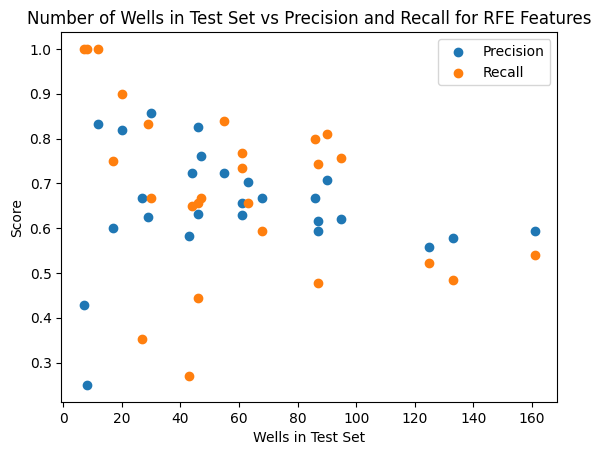

In [56]:
#Observe there is essentially no trend. 
#This supports that we are not simply overfitting for cyotkines with low numbers of responder wells.
#By the way, this looks quite similar to the univariates graph above but careful inspection of the plot and
#code shows they are in fact different
plt.scatter(y=summarizer_rfefs["Precision"], x = summarizer_rfefs["Wells in Set"])
plt.scatter(y=summarizer_rfefs["Recall"], x = summarizer_rfefs["Wells in Set"])
plt.xlabel("Wells in Test Set")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for RFE Features")
plt.show()

## Performance of classifier with features selcted from L1 regularization

In [57]:
l1s_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = l1s[l1s["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        l1s_listing.append(finaldata)
    except:
        continue

l1s_listing[0]






Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_24,Output_35,Output_60,Output_118,Output_120,Output_151,Output_232,Output_278,Output_281,...,Output_903,Output_941,Output_948,Output_959,Output_963,Output_977,Output_1044,Output_1045,Output_1230,Output_1247
well,,,,,,,,,,,,,,,,,,,,,
A09,1,2.533486,2.219132,3.895554,2.909582,2.216412,1.877604,4.213551,2.418978,0.523117,...,5.635931,2.422231,3.610954,5.662089,2.049567,0.732848,2.269222,2.196149,4.791984,9.698508
C03,1,2.408968,2.076954,3.756057,2.605289,2.031238,1.816407,4.311341,2.368094,0.607562,...,5.793055,2.578254,3.756738,5.631644,2.015778,0.874197,2.188010,2.147823,4.845588,9.747023
C09,1,2.259817,2.079149,3.981436,2.293271,1.957480,1.784210,4.312414,2.441464,0.729582,...,5.603607,2.683552,3.753963,5.889314,2.112870,1.041880,2.640250,2.528739,5.055249,9.995271
C17,1,2.366388,2.200598,4.016228,2.166797,2.029021,1.502417,4.007127,2.402105,0.958147,...,5.335701,2.688015,3.593929,5.994071,2.316985,1.450801,2.804684,2.667008,4.497993,9.738996
F03,1,2.261545,1.943133,3.687468,2.531449,1.913512,1.781021,4.429153,2.389866,0.676587,...,5.630318,2.659221,3.810938,5.588492,2.010011,0.911457,2.280377,2.236673,5.049672,9.907647
F04,1,2.407217,2.094342,3.938980,2.561344,2.064217,1.773864,4.162745,2.437336,0.637842,...,5.691682,2.586056,3.713241,5.560206,2.029744,1.052388,2.200986,2.149233,4.868670,9.908044
F05,1,2.348159,1.985789,3.761435,2.505181,2.106782,2.072657,4.496910,2.274891,0.570229,...,5.678301,2.401818,3.820330,5.781368,1.989335,0.967628,2.364583,2.470553,5.080195,10.008046
F08,1,2.511289,2.141867,4.092803,2.645512,2.069644,1.620830,4.300972,2.758318,0.594386,...,5.424012,2.784774,3.607088,5.445361,2.001111,0.902159,2.116183,2.115618,4.890854,9.939694
F09,1,2.520103,2.181630,3.859613,2.819953,2.199971,1.866276,4.269008,2.437487,0.586003,...,5.481540,2.674618,3.705659,5.478346,1.979217,0.874980,2.194291,2.169714,4.824190,9.768630


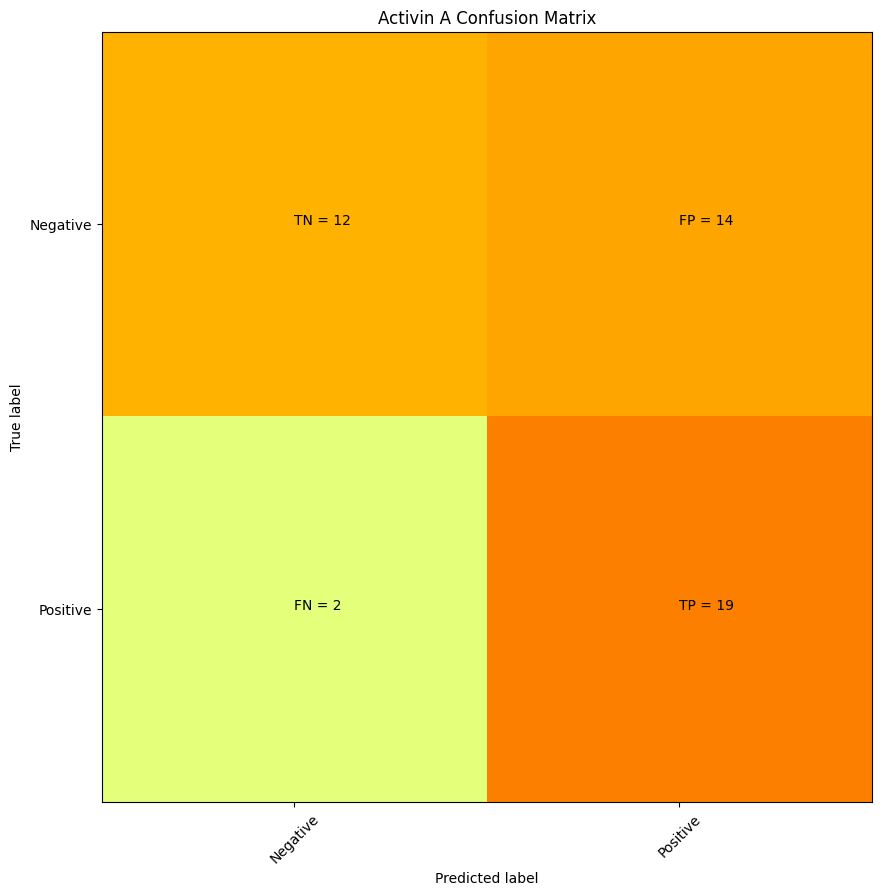

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
M11           0
G23           0
A13           0
D07           0
M10           0
N13           0
N15           0
C01           0
N24           0
I20           0
L19           0
P23           0
L16           0
A16     

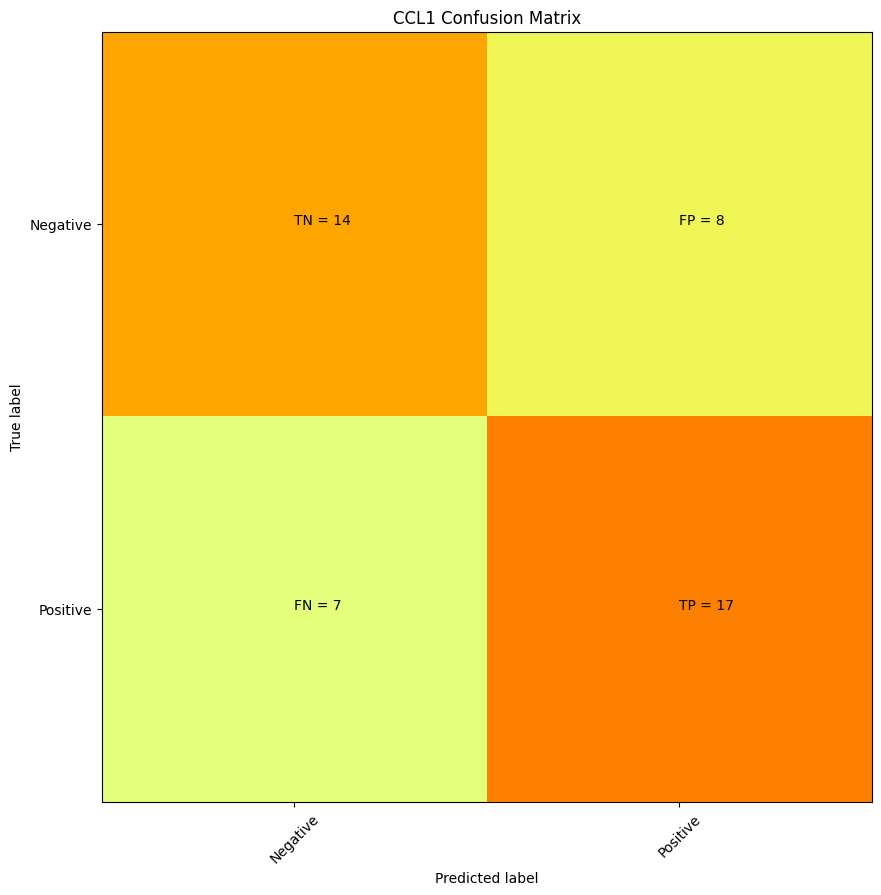

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
L17      0
M21      0
A14      0
G14      0
D11      0
M19      0
E03      0
E17      0
A11      0
G21      0
P16      0
D15      0
M12      0
G06      0
F24      0
N12      0
J15      0
M02      0
K01      0
A22      0
K06      0
G23      0
I13      0
I11      0
N14      0
O16      0
O14      0
B09      0
K11      0
B14      0
K15      0
G08      0
J02      0
O07      0
C23      0
H14      0
C04      0
M04      0
O04      0
K16      0
B05      0
M24      0
I15      0

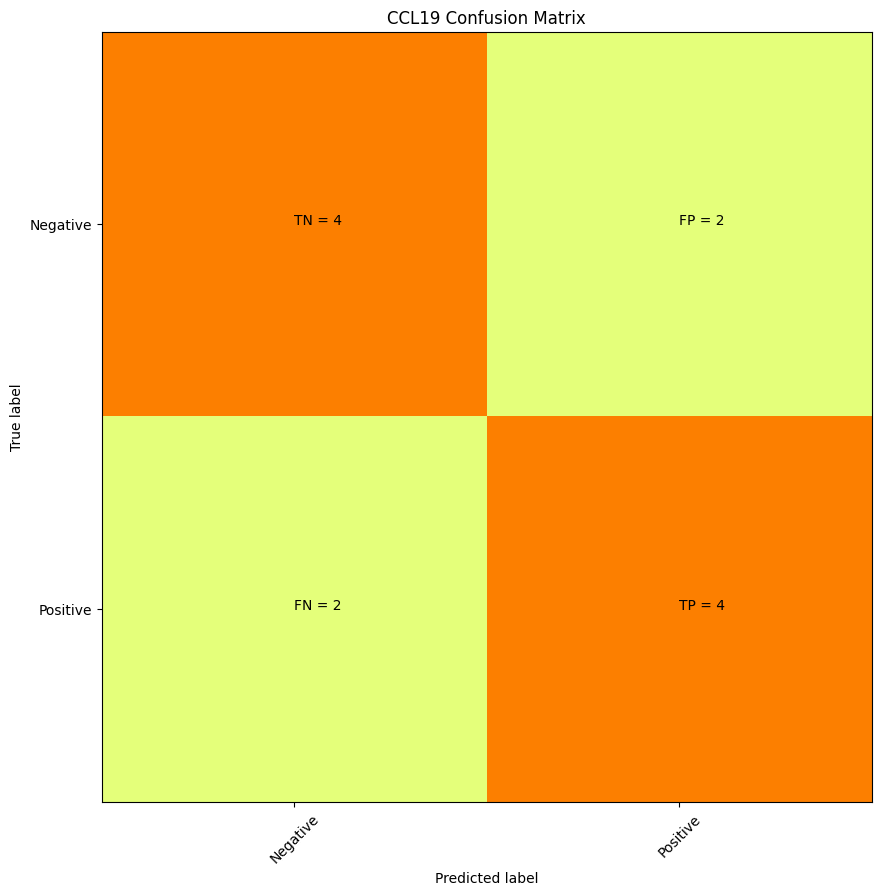

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
F06       0
F23       0
B15       0
B01       0
A09       0
J02       0
P08       0
F19       0
L14       0
F02       0
O19       0
N13       0 precision = 0.6666666666666666 recall = 0.6666666666666666


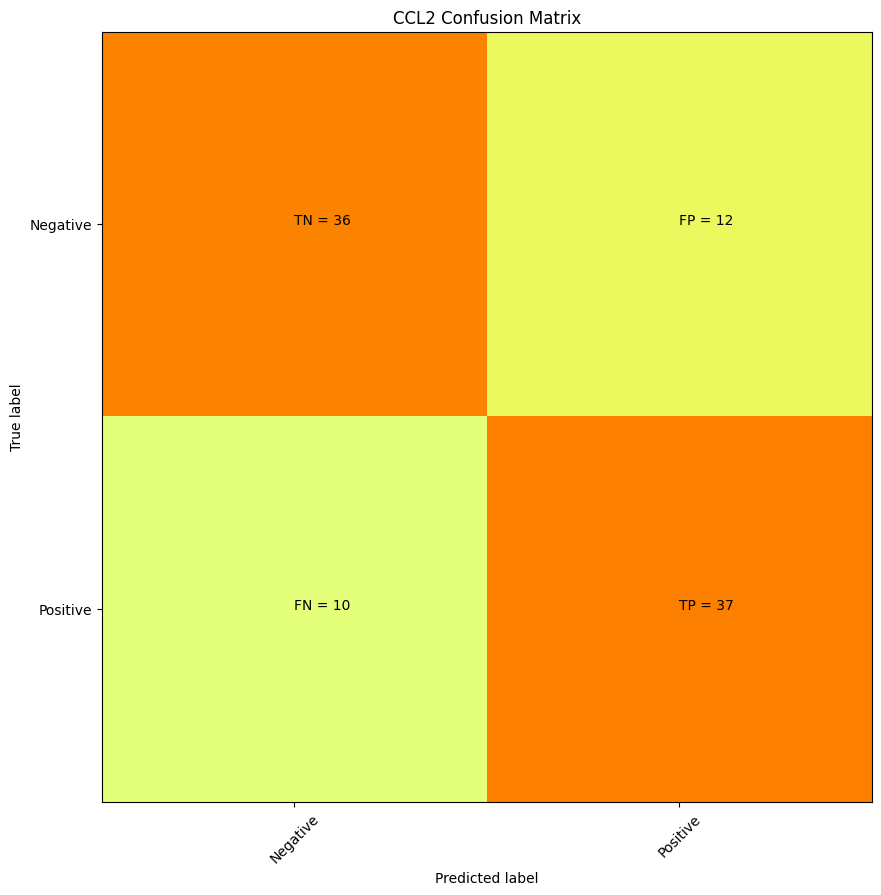

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

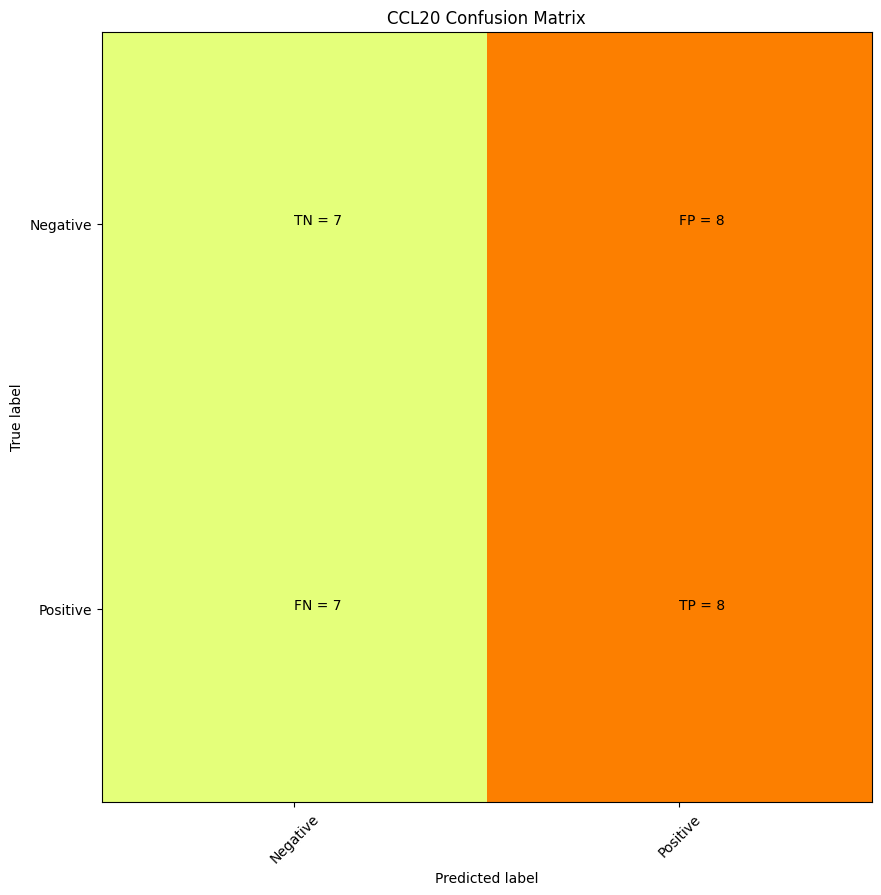

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
I23       0
I17       0
G11       0
J09       0
I19       0
J14       0
E18       0
L05       0
G13       0
L18       0
F22       0
L19       0
J11       0
B12       0
H13       0
J21       0
L17       0
C01       0
N08       0
M04       0
F16       0
I05       0
M07       0
H15       0
P18       0
J06       0
K02       0
H03       0
H01       0
O07       0 precision = 0.5 recall = 0.5333333333333333


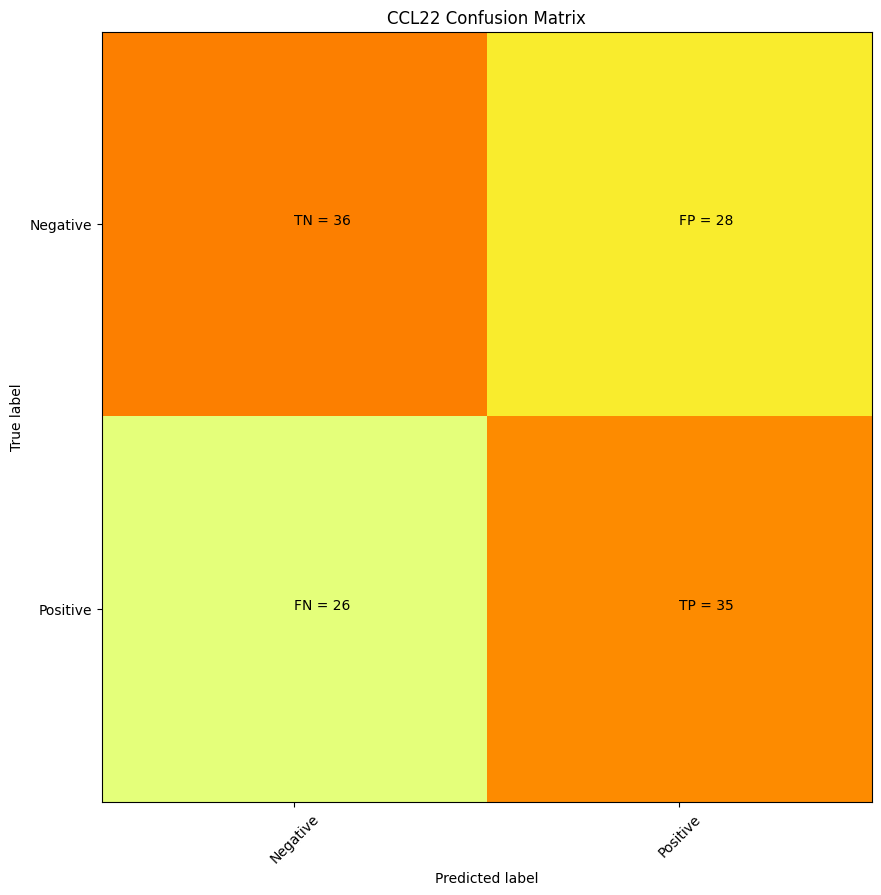

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

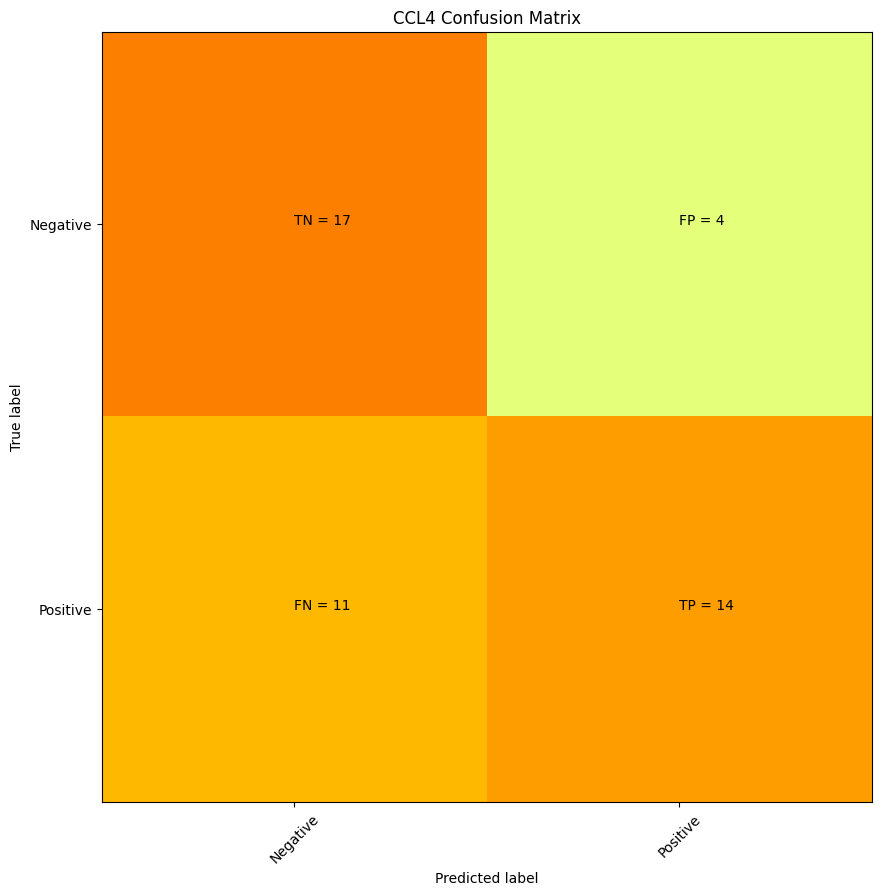

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P12      0
L02      0
K14      0
M20      0
M06      0
P24      0
L03      0
O22      0
F22      0
M08      0
N16      0
H04      0
N15      0
F08      0
M21      0
H10      0
E06      0
D03      0
D09      0
F20      0
C24      0
G01      0
P10      0
H05      0
F03      0
I09      0
N12      0
P16      0
C12      0
M03      0
B15      0
F21      0
B12      0
B14      0
K21      0
G12      0
L15      0
F16      0
C20      0
F17      0
A01      0
D10      0
O23      0

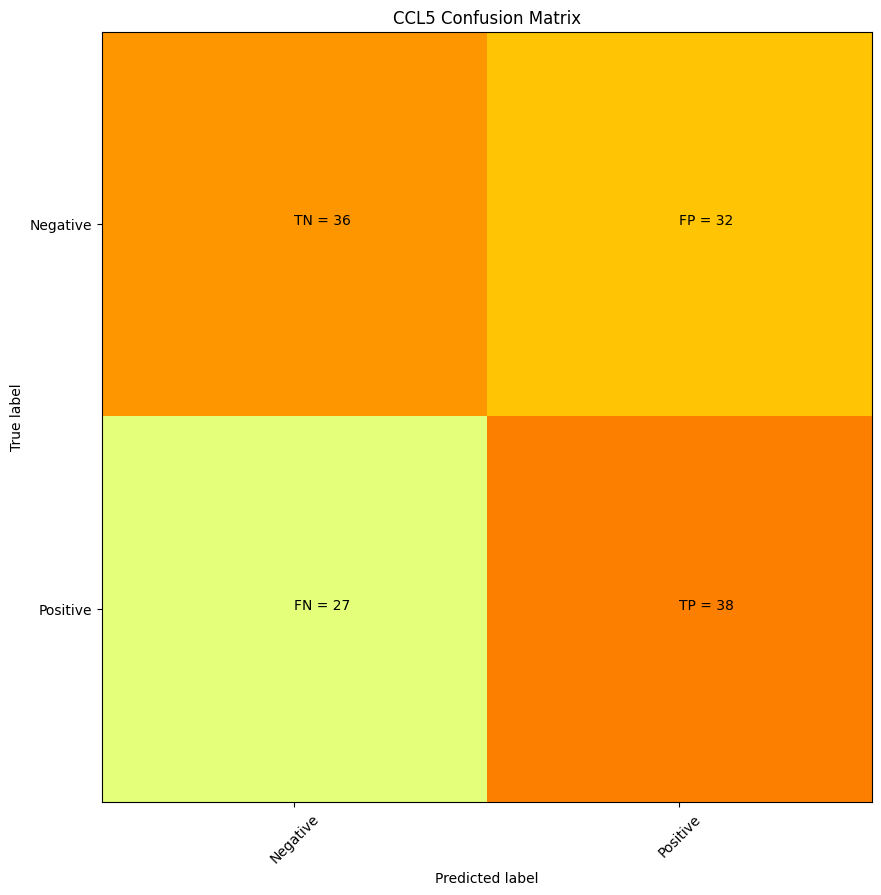

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

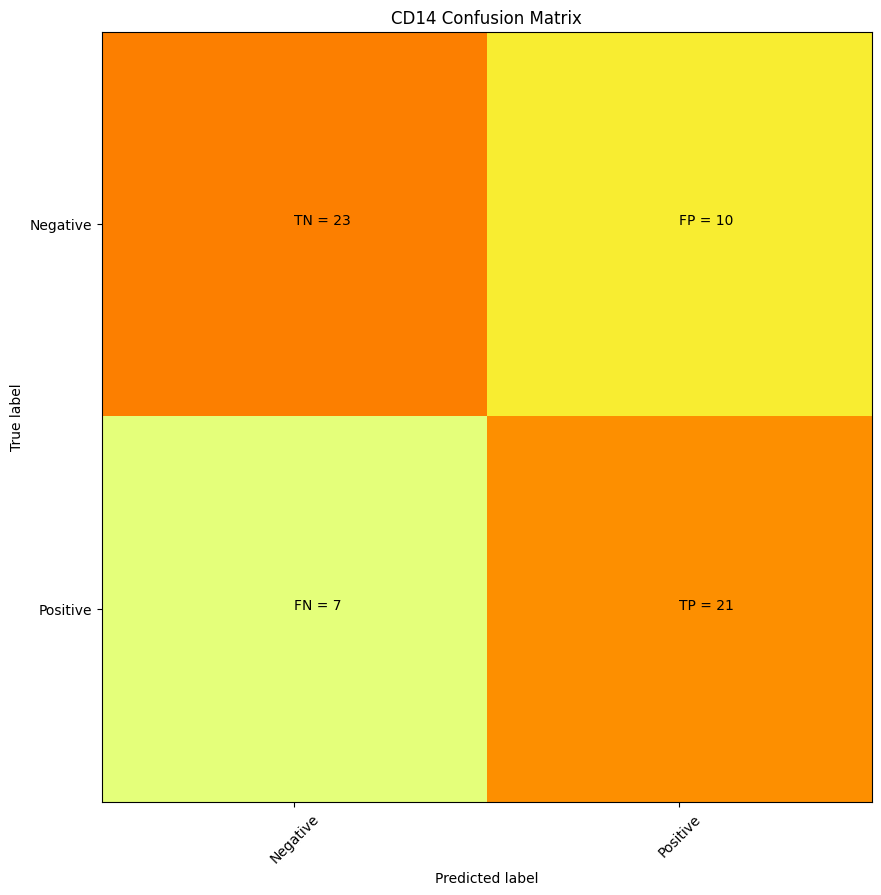

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
D17      0
I18      0
E24      0
N12      0
K03      0
I01      0
J12      0
O02      0
G21      0
H23      0
L17      0
L06      0
N15      0
M12      0
J19      0
J22      0
I15      0
C20      0
P19      0
B17      0
J01      0
C13      0
I02      0
H21      0
I08      0
A18      0
A17      0
H04      0

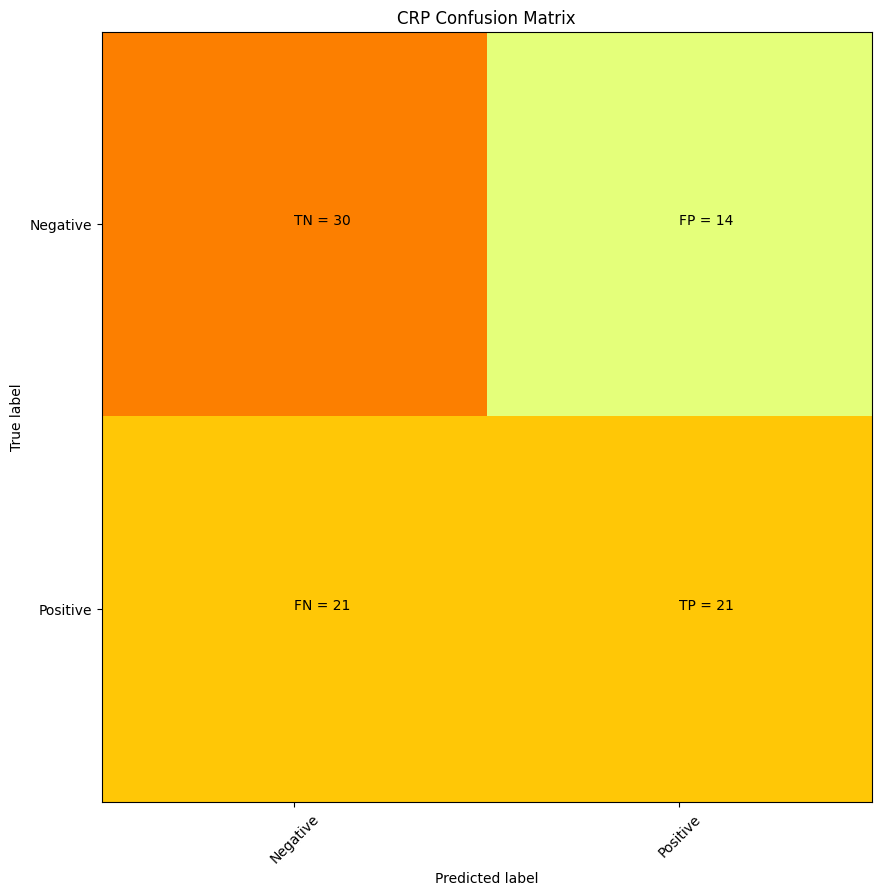

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
H16     0
O20     0
D01     0
N07     0
N21     0
P01     0
A12     0
A06     0
H01     0
M10     0
G22     0
G07     0


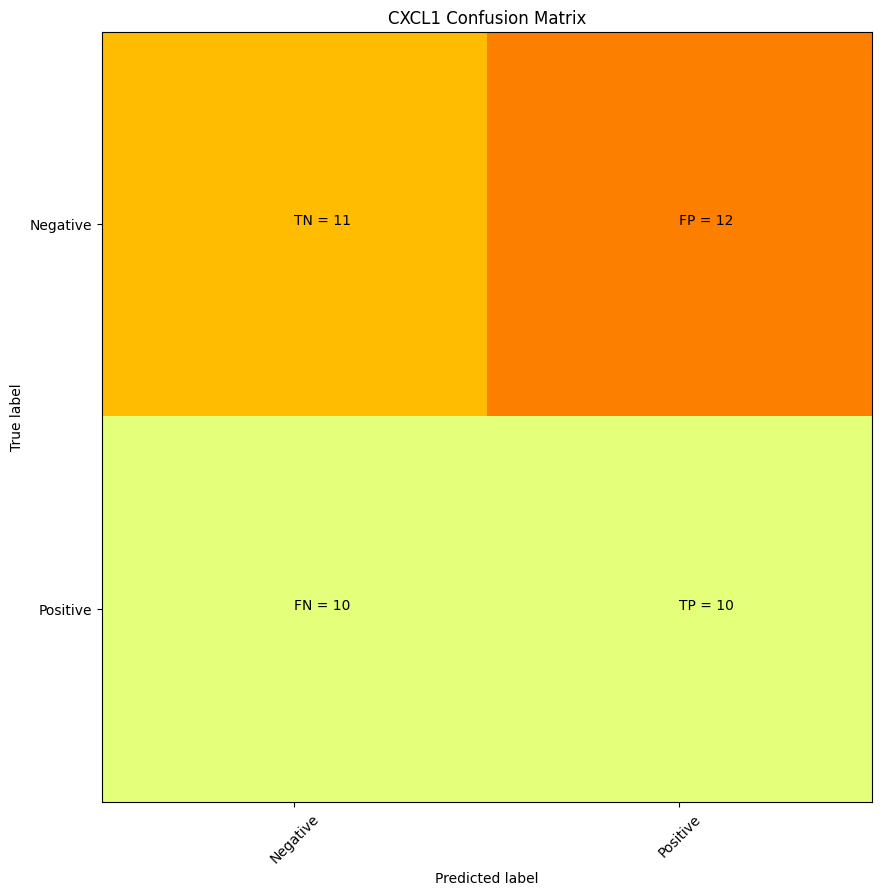

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
L24       0
C24       0
A13       0
D01       0
M16       0
G13       0
L15       0
B08       0
L09       0
A01       0
K23       0
K24       0
A10       0
M21       0
K20       0
K14       0
K21       0
A07       0
D04       0
N06       0
A17       0
M20       0
I22       0
M13       0
O20       0
I12       0
N04       0
G23       0
F21       0
B18       0
D18       0
A08       0
I24       0
C03       0
P14       0
G10       0
E21       0
N24       0
M03 

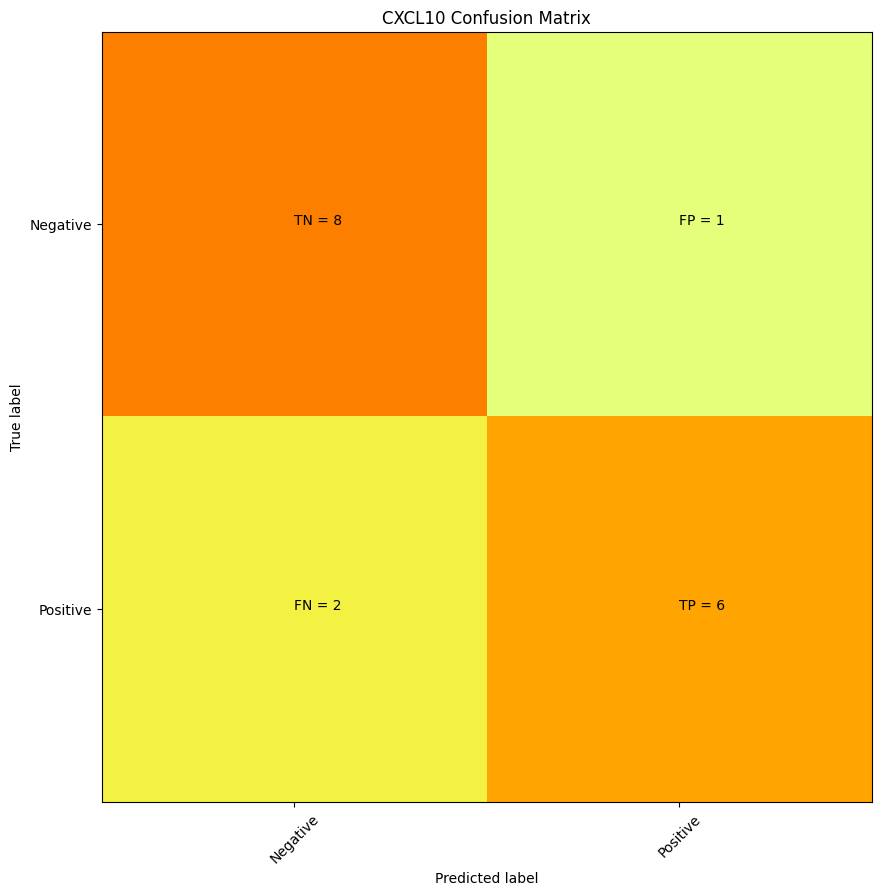

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
N16        0
C22        0
C11        0
J01        0
J07        0
G24        0
P03        0
F03        0
C14        0
E16        0
J04        0
D09        0
F07        0
G10        0
B12        0
A22        0
O20        0 precision = 0.8571428571428571 recall = 0.75


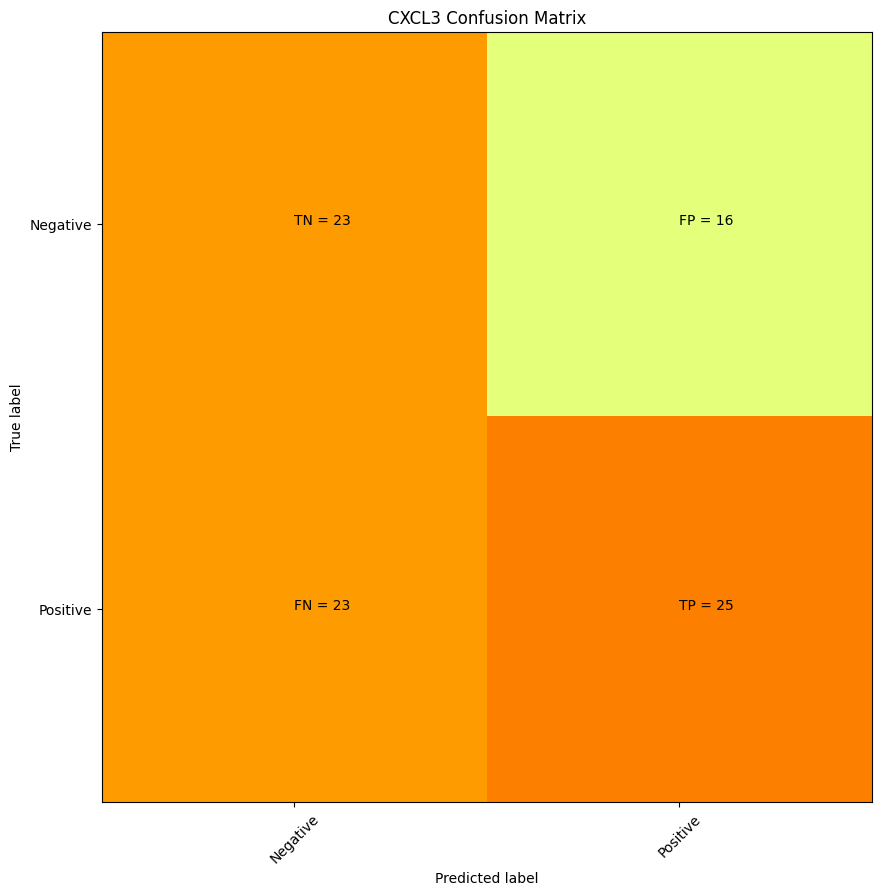

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

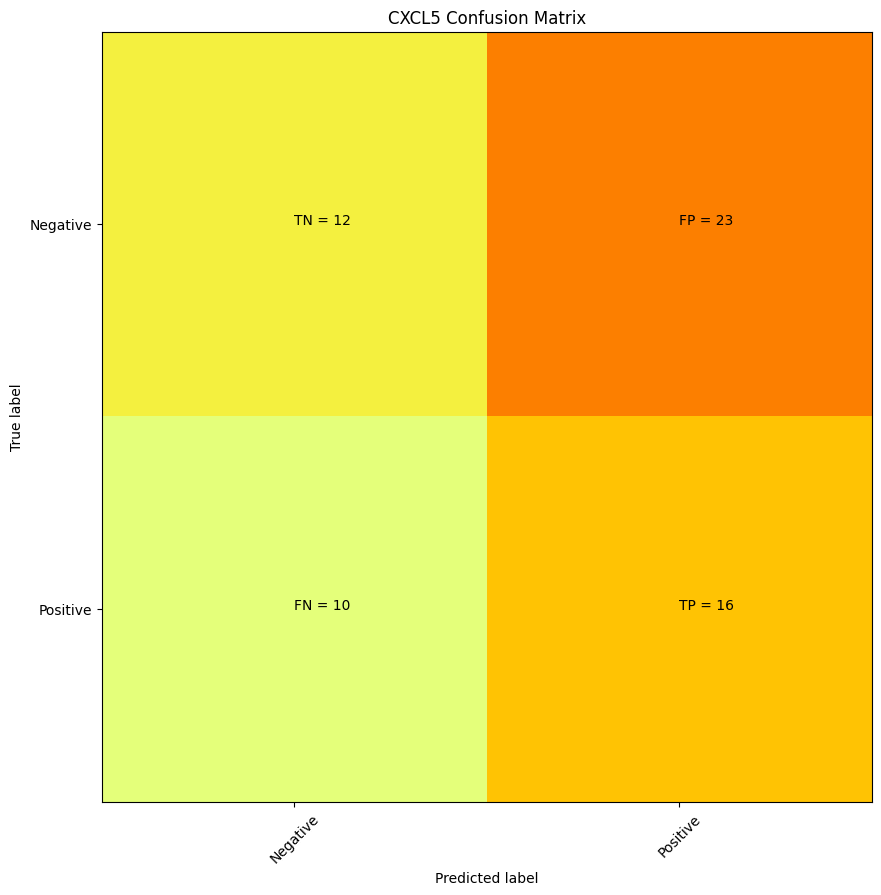

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H17       0
N19       0
D10       0
H10       0
B05       0
J20       0
H09       0
K12       0
N18       0
O06       0
K06       0
K08       0
E14       0
P14       0
K05       0
C21       0
B01       0
J15       0
B06       0
D21       0
C13 

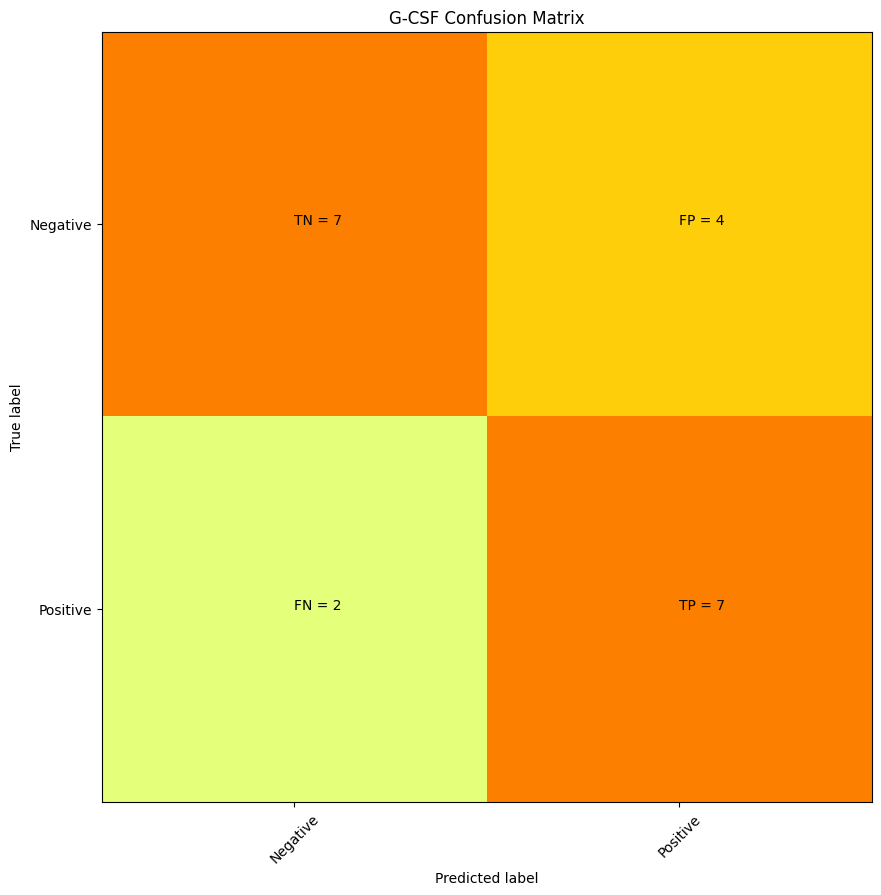

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
N22       0
G23       0
H05       0
L05       0
P14       0
L14       0
J16       0
L22       0
H18       0
N24       0
C03       0
N15       0
A21       0
O06       0
I13       0
P19       0
O21       0
C12       0
G03       0
I15       0 precision = 0.6363636363636364 recall = 0.7777777777777778


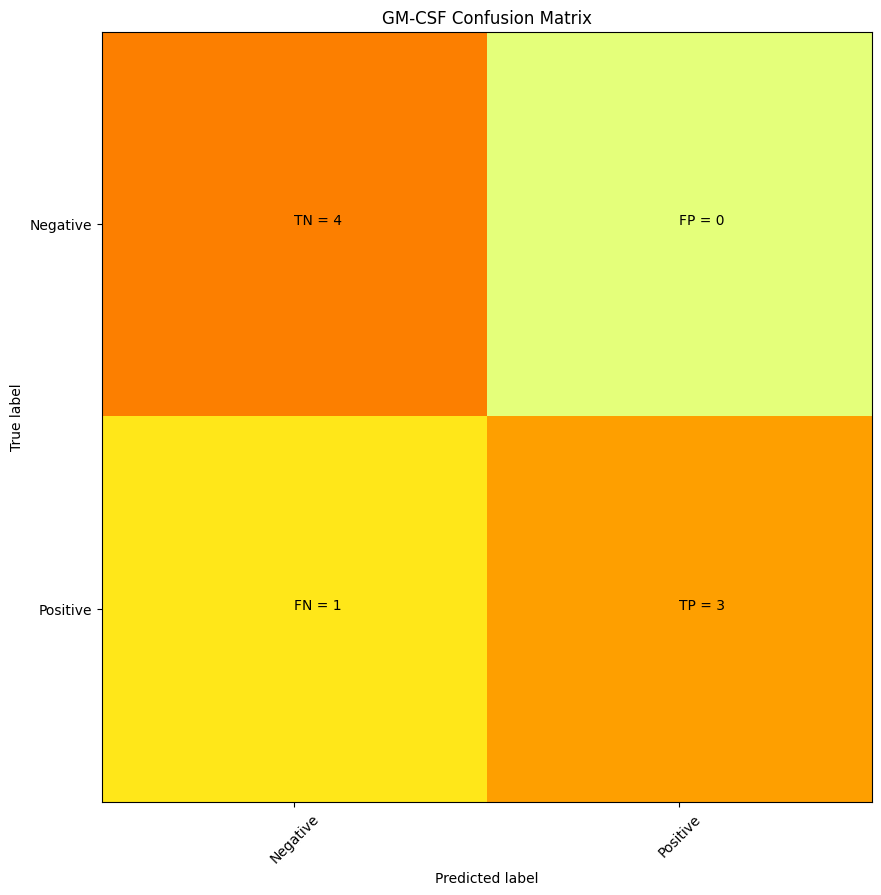

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
F12        0
J03        0
A23        0
O04        0
P17        0
I16        0
B10        0
K16        0 precision = 1.0 recall = 0.75


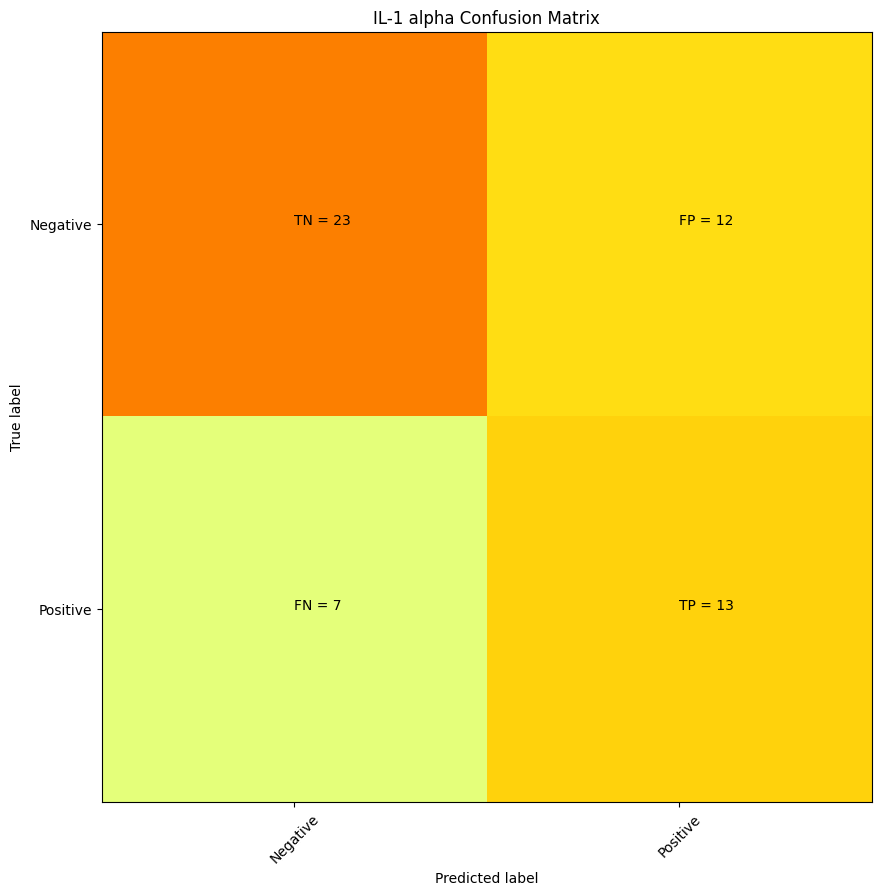

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
I02            0
F09           

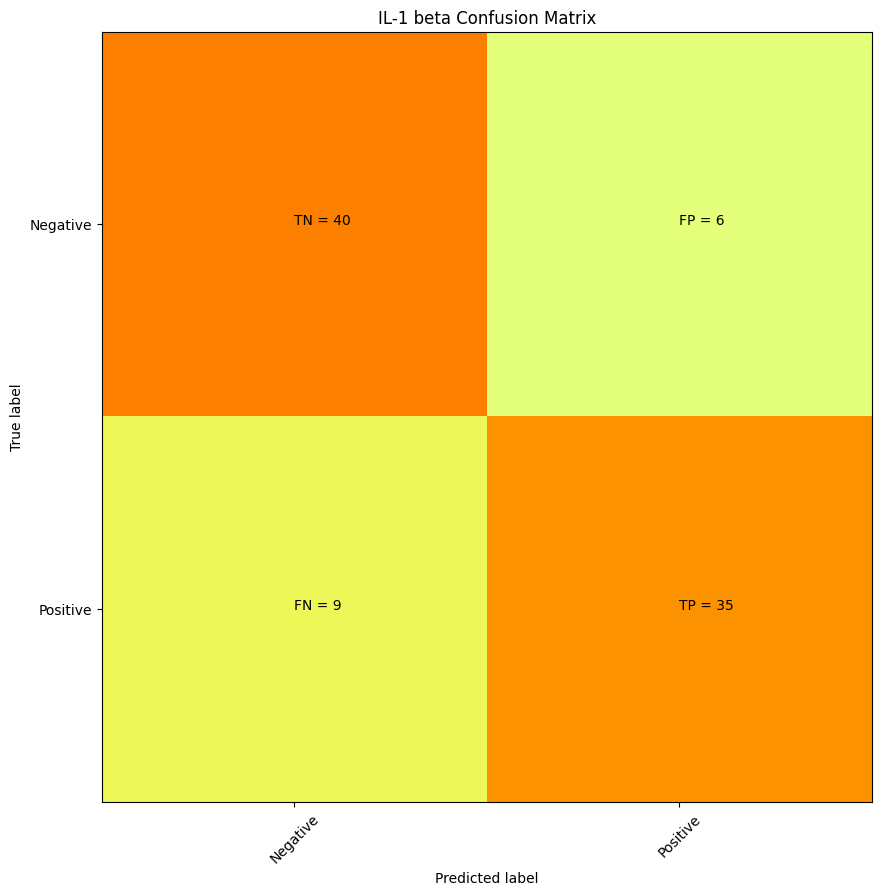

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

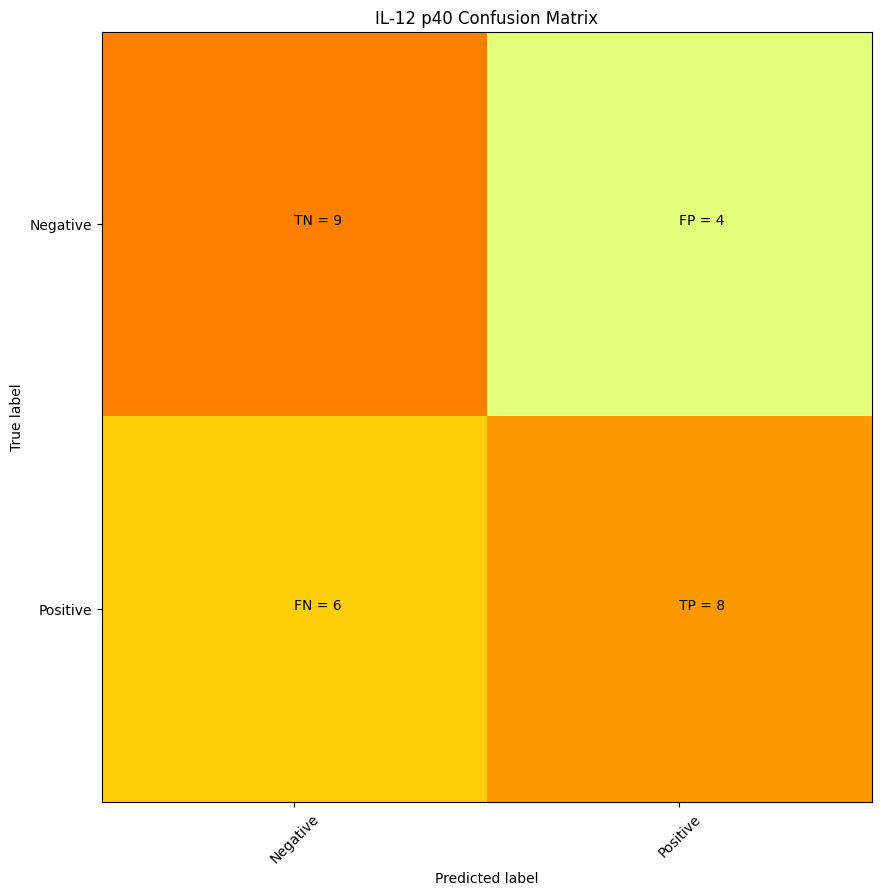

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
D15           0
F05           0
N15           0
D21           0
F03           0
J06           0
K14           0
L04           0
B04           0
J08           0
B09           0
E04           0
A09           0
M11           0
M17           0
H02           0
G24           0
J02           0
B03           0
O01           0
H09           0
J19           0
J16           0
M13           0
H01           0
I21           0
B02           0 precision = 0.6666666666666666 recall = 0.5714285714285714


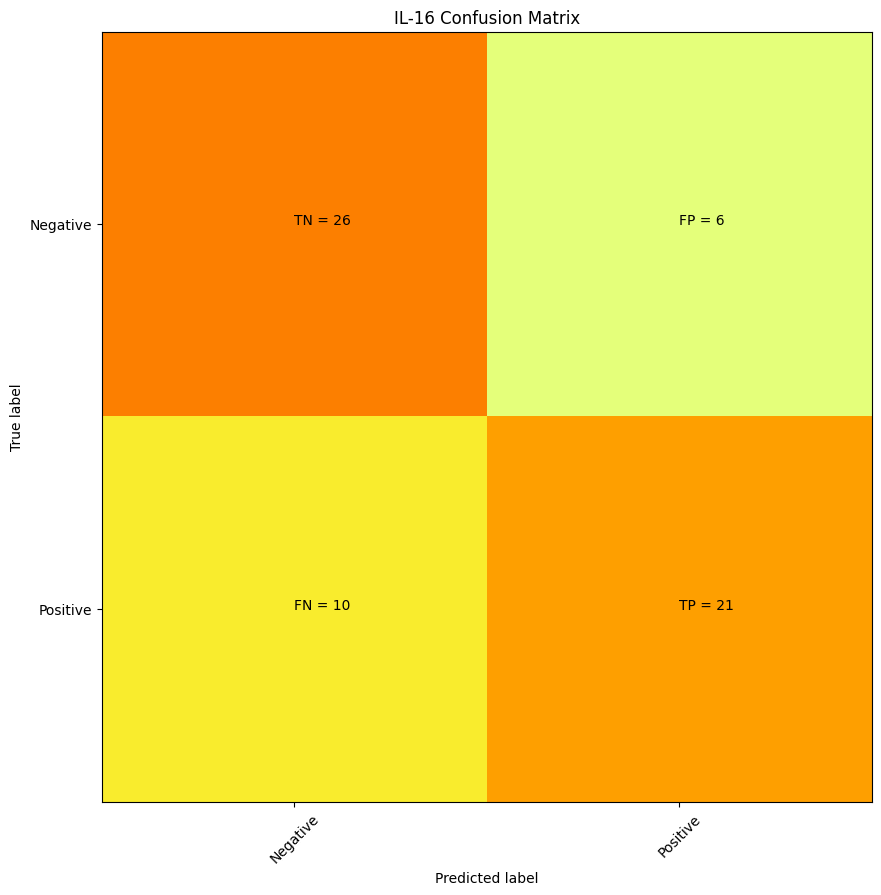

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
P19       0
B15       0
C05       0
B10       0
N01       0
E19       0
E05       0
J17       0
E06       0
K04       0
I03       0
F22       0
P01       0
A07       0
D19       0
N10       0
B05       0
I01       0
H21 

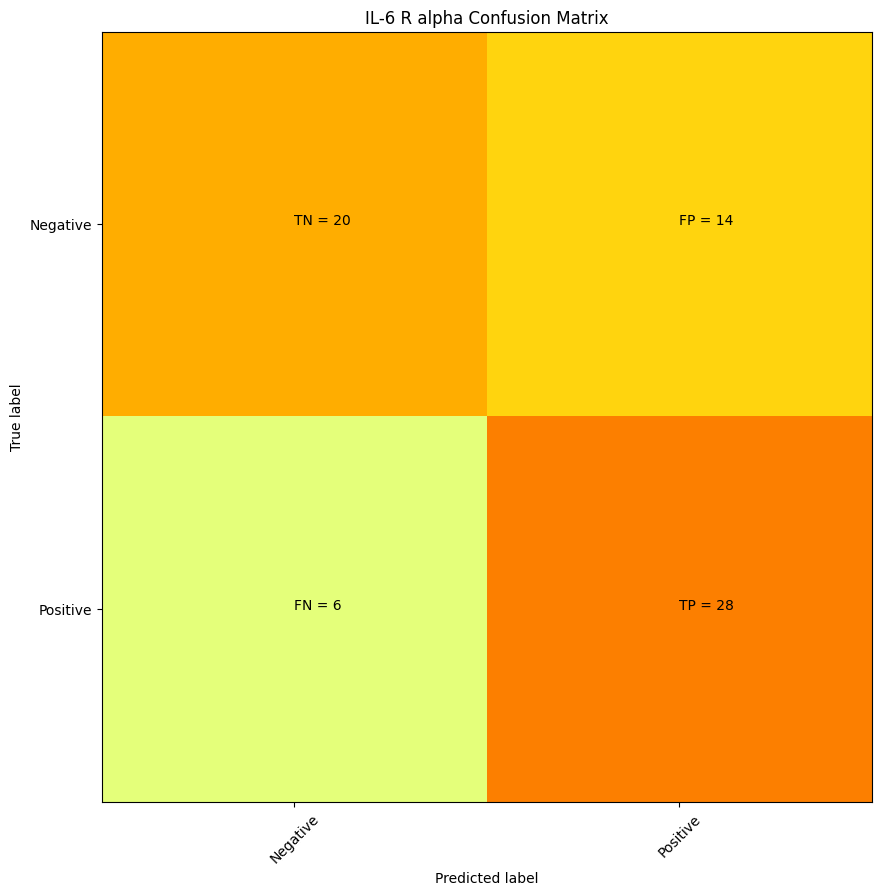

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

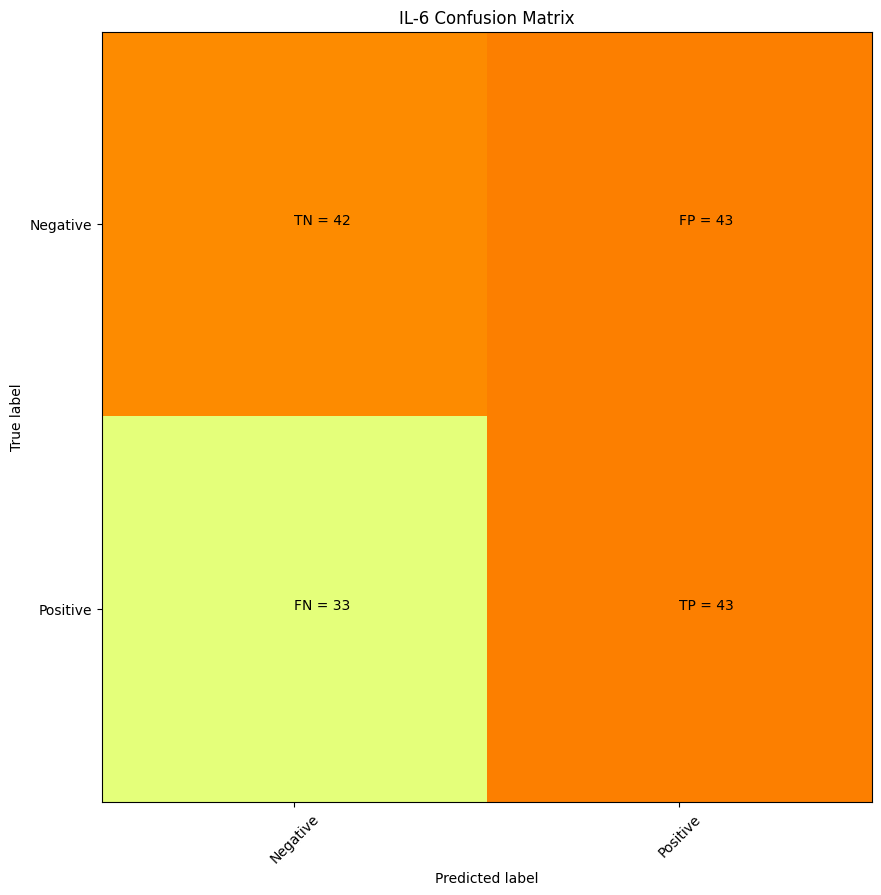

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

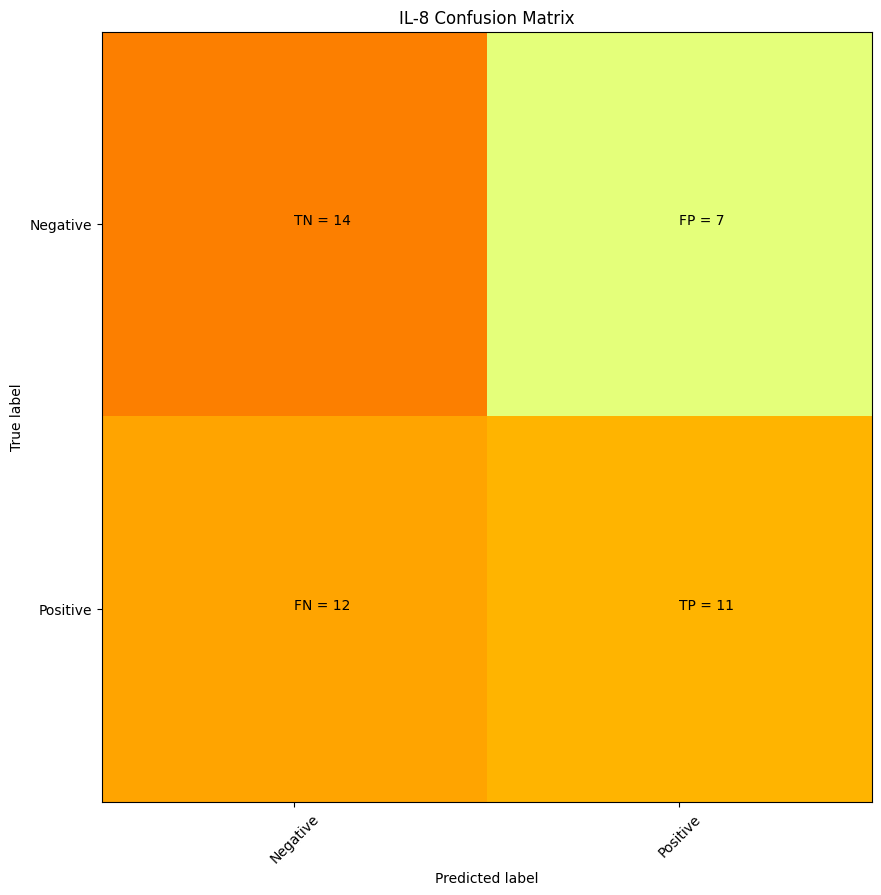

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
N17      0
N16      0
G17      0
A12      0
E09      0
J22      0
N14      0
M14      0
A06      0
D14      0
M07      0
C12      0
O24      0
J20      0
G15      0
L10      0
C02      0
N05      0
C22      0
J15      0
D09      0
I16      0
P10      0
C07      0
F02      0
E08      0
F20      0
D01      0
F09      0
L03      0
F16      0
P09      0
O06      0
B06      0
N09      0
M06      0
P12      0
B04      0
E20      0
J13      0
C20      0
M18      0
I02      0
I12      0 precision 

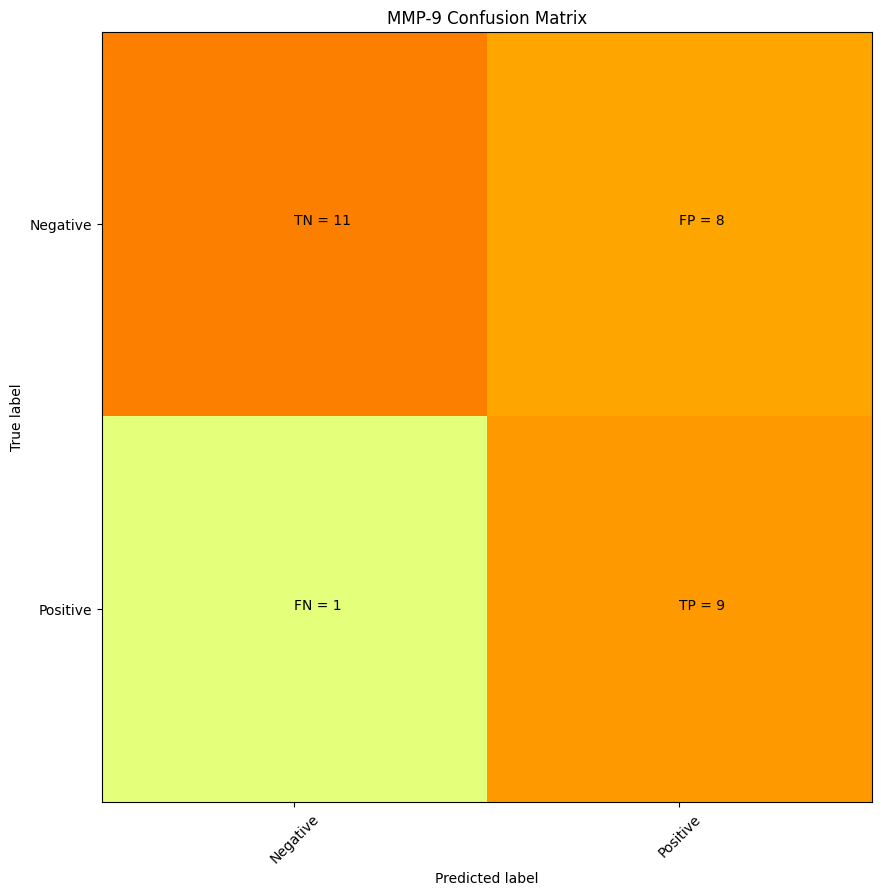

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
C16       0
G21       0
A11       0
G04       0
C15       0
B09       0
J03       0
M22       0
E08       0
O02       0
L05       0
I10       0
B15       0
L16       0
P22       0
H19       0
O03       0
K04       0
C08       0
B13       0
A16       0
C18       0
N23       0
I13       0
P02       0
L15       0
N21       0
K21       0
I17       0 precision = 0.5294117647058824 recall = 0.9


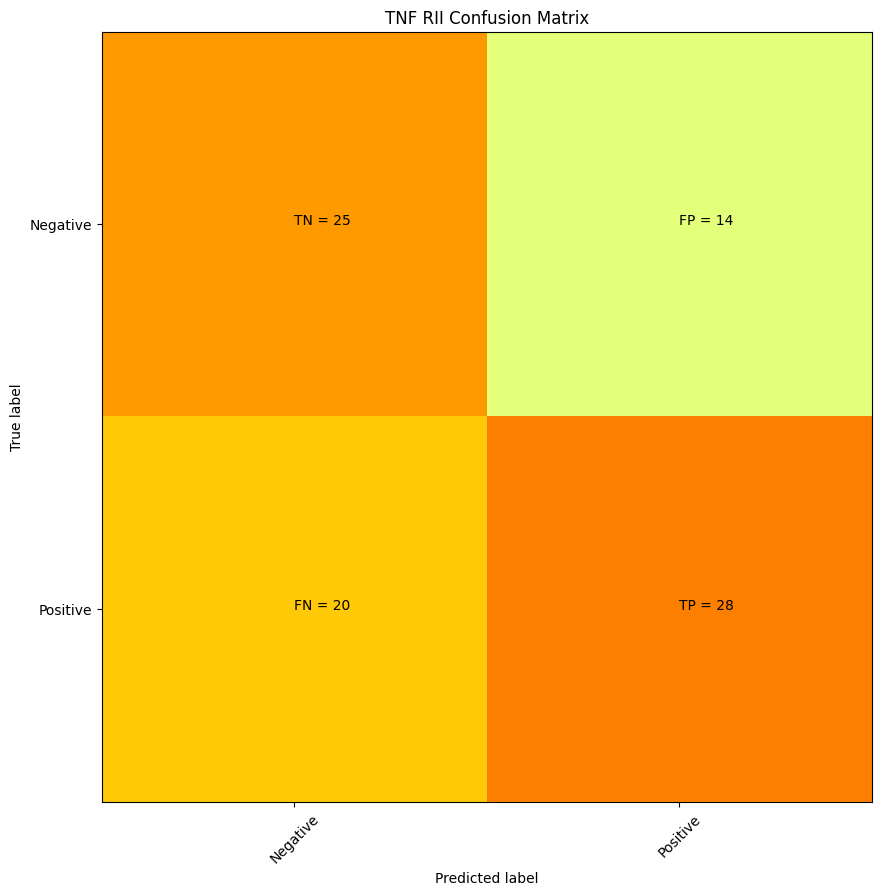

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [58]:
summarizing = []
summarizer_l1s = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in l1s_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_l1s = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_l1s['Precision'] = summarizer_l1s['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [59]:
summarizer_l1s

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.575758,0.904762,30,47
1,CCL1,0.680000,0.708333,17,46
2,CCL19,0.666667,0.666667,7,12
3,CCL2,0.755102,0.787234,49,95
4,CCL20,0.500000,0.533333,22,30
5,CCL22,0.555556,0.573770,28,125
6,CCL4,0.777778,0.560000,9,46
7,CCL5,0.542857,0.584615,34,133
8,CD14,0.677419,0.750000,43,61
9,CRP,0.600000,0.500000,16,86


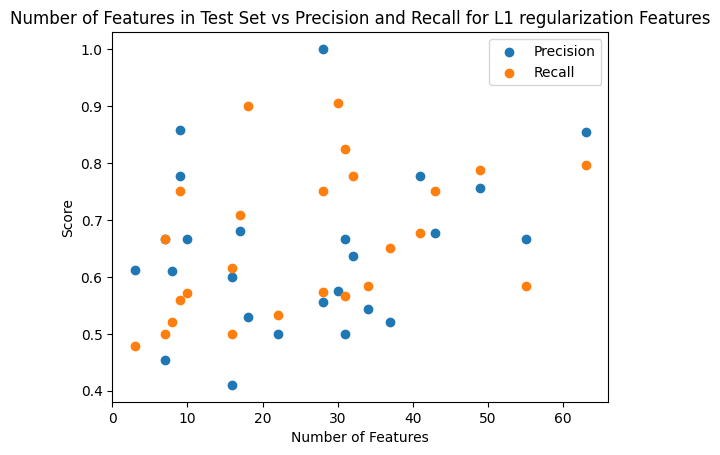

In [60]:
#Slight upward trend - more L1 features being chosen leads to better prediciton performance
plt.scatter(y=summarizer_l1s["Precision"], x = summarizer_l1s["Number of Features"])
plt.scatter(y=summarizer_l1s["Recall"], x = summarizer_l1s["Number of Features"])
plt.xlabel("Number of Features")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Features in Test Set vs Precision and Recall for L1 regularization Features")
plt.show()

## Performance with features selected based on gini purity

In [61]:
treepicks_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = treepicks[treepicks["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        treepicks_listing.append(finaldata)
    except:
        continue

treepicks_listing[0]





Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_2,Output_3,Output_8,Output_9,Output_13,Output_14,Output_18,Output_22,Output_23,...,Output_1261,Output_1265,Output_1266,Output_1268,Output_1272,Output_1274,Output_1275,Output_1276,Output_1277,Output_1278
well,,,,,,,,,,,,,,,,,,,,,
A09,1,-0.028690,-0.095116,0.569711,-0.005882,0.027851,0.612717,0.234076,-0.073379,0.177567,...,0.198943,-0.057001,0.191418,-0.058113,-0.047974,0.788188,0.279319,0.890027,-0.070188,0.556294
C03,1,-0.034746,-0.073513,0.533193,0.012108,0.022114,0.603236,0.228284,-0.074196,0.151898,...,0.099718,-0.039726,0.242078,-0.053488,0.011824,0.744083,0.310808,0.765151,-0.082562,0.600148
C09,1,-0.023539,-0.089756,0.553722,-0.001151,0.020024,0.647343,0.250924,-0.072696,0.135810,...,0.092623,-0.039026,0.171463,-0.064794,0.020868,0.751199,0.270333,0.789363,-0.078205,0.605260
C17,1,-0.034689,-0.079700,0.508080,-0.004266,-0.043911,0.549735,0.163325,-0.074391,0.135366,...,0.099879,-0.036574,0.200645,-0.067190,0.019631,0.895518,0.237147,0.909037,-0.041133,0.613002
F03,1,-0.032818,-0.064708,0.521116,0.017687,-0.006470,0.655671,0.245621,-0.071331,0.156914,...,0.067790,-0.028827,0.210991,-0.058635,0.019695,0.746711,0.351162,0.712209,-0.065472,0.679215
F04,1,-0.032567,-0.082312,0.558320,-0.003618,0.020025,0.681653,0.227171,-0.074640,0.183158,...,0.101209,-0.022967,0.200605,-0.062899,-0.001719,0.772650,0.305995,0.732298,-0.072336,0.614638
F05,1,-0.036938,-0.085439,0.505102,0.001011,0.030121,0.629787,0.208043,-0.073573,0.213197,...,0.111365,-0.044479,0.136941,-0.060093,0.004530,0.772521,0.294070,0.828513,-0.078685,0.535130
F08,1,-0.031914,-0.076217,0.549520,-0.000442,0.052057,0.706387,0.212069,-0.075059,0.164900,...,0.077133,-0.040309,0.222685,-0.080392,0.011302,0.683042,0.377057,0.698982,-0.077814,0.687424
F09,1,-0.034480,-0.079028,0.588114,0.012448,0.068043,0.663344,0.185658,-0.069146,0.187334,...,0.094505,-0.045774,0.243119,-0.066831,-0.029912,0.662606,0.341506,0.762765,-0.074637,0.645507


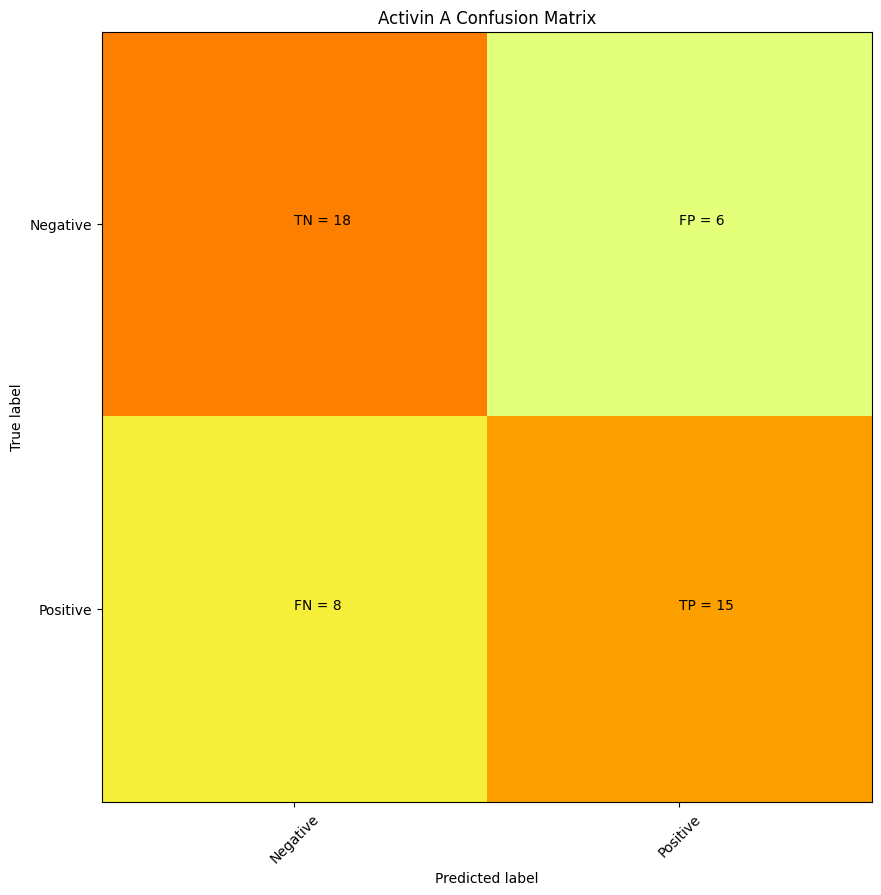

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
M11           0
G23           0
A13           0
D07           0
M10           0
N13           0
N15           0
C01           0
N24           0
I20           0
L19           0
P23           0
L16           0
A16     

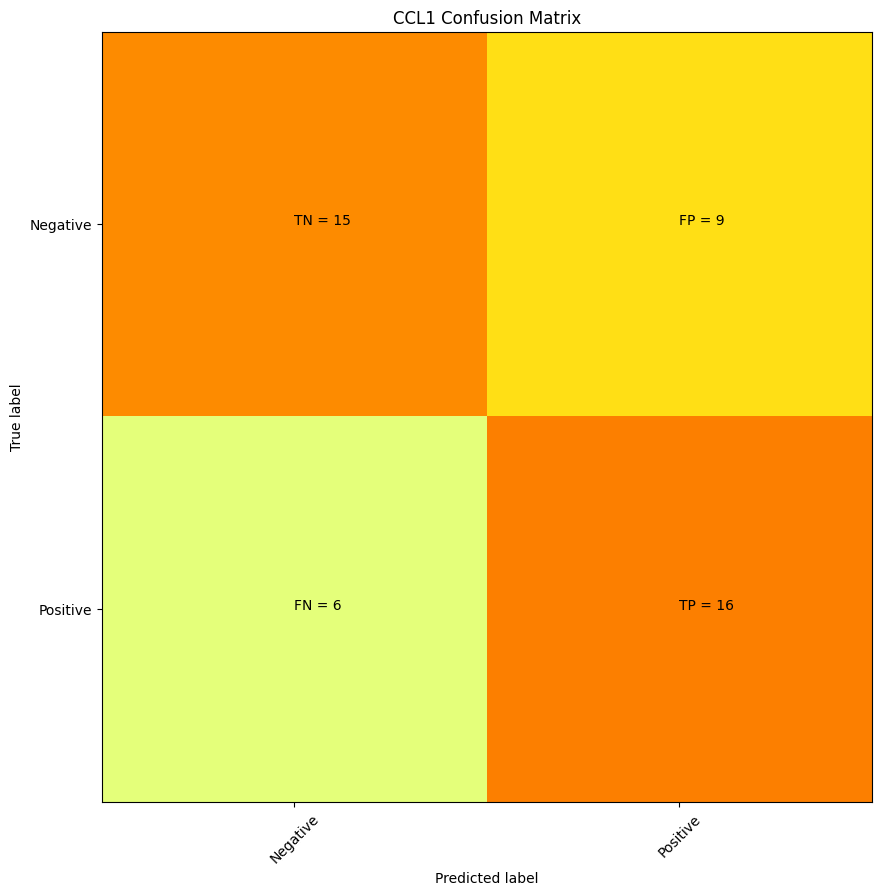

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
L17      0
M21      0
A14      0
G14      0
D11      0
M19      0
E03      0
E17      0
A11      0
G21      0
P16      0
D15      0
M12      0
G06      0
F24      0
N12      0
J15      0
M02      0
K01      0
A22      0
K06      0
G23      0
I13      0
I11      0
N14      0
O16      0
O14      0
B09      0
K11      0
B14      0
K15      0
G08      0
J02      0
O07      0
C23      0
H14      0
C04      0
M04      0
O04      0
K16      0
B05      0
M24      0
I15      0

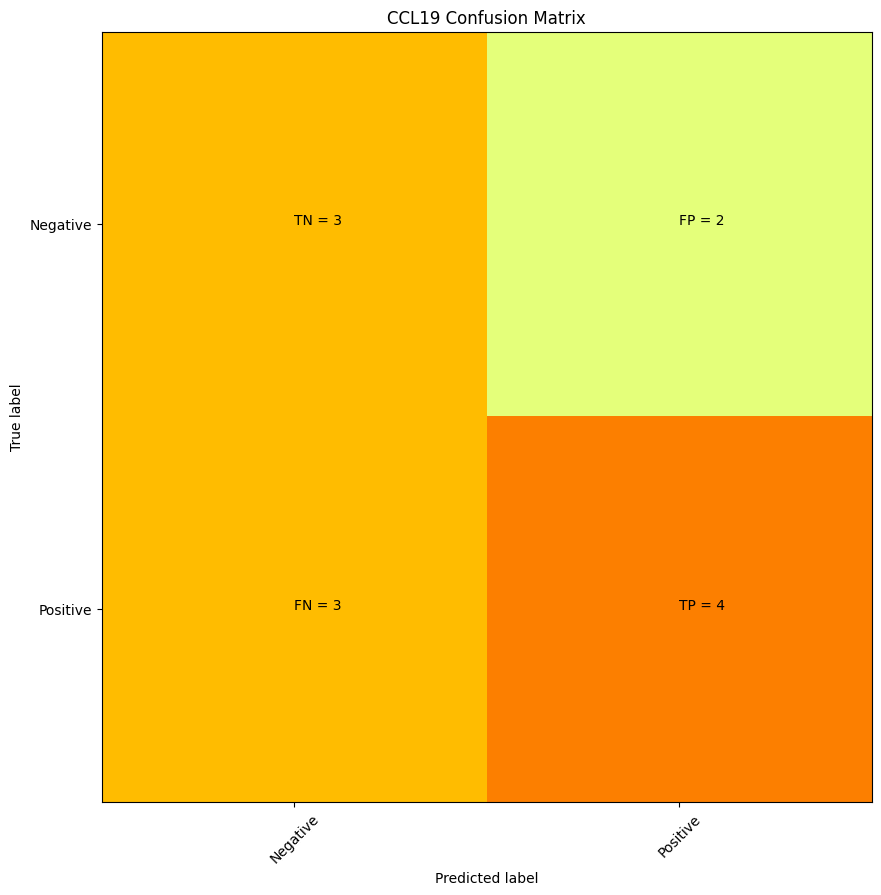

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
F06       0
F23       0
B15       0
B01       0
A09       0
J02       0
P08       0
F19       0
L14       0
F02       0
O19       0
N13       0 precision = 0.6666666666666666 recall = 0.5714285714285714


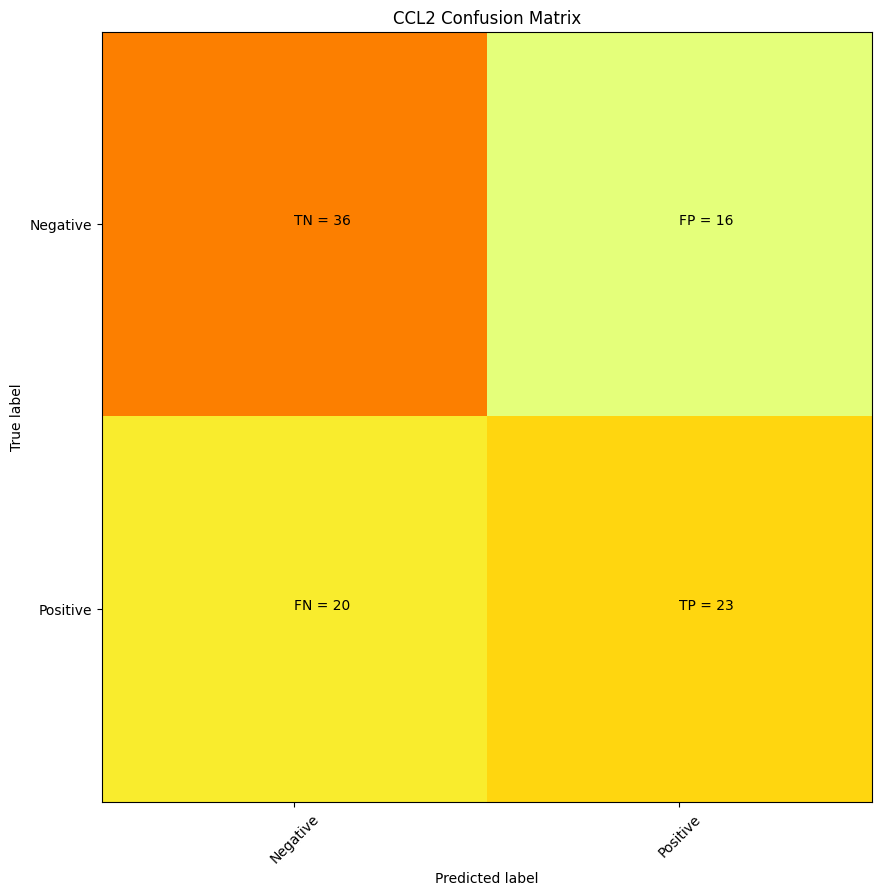

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

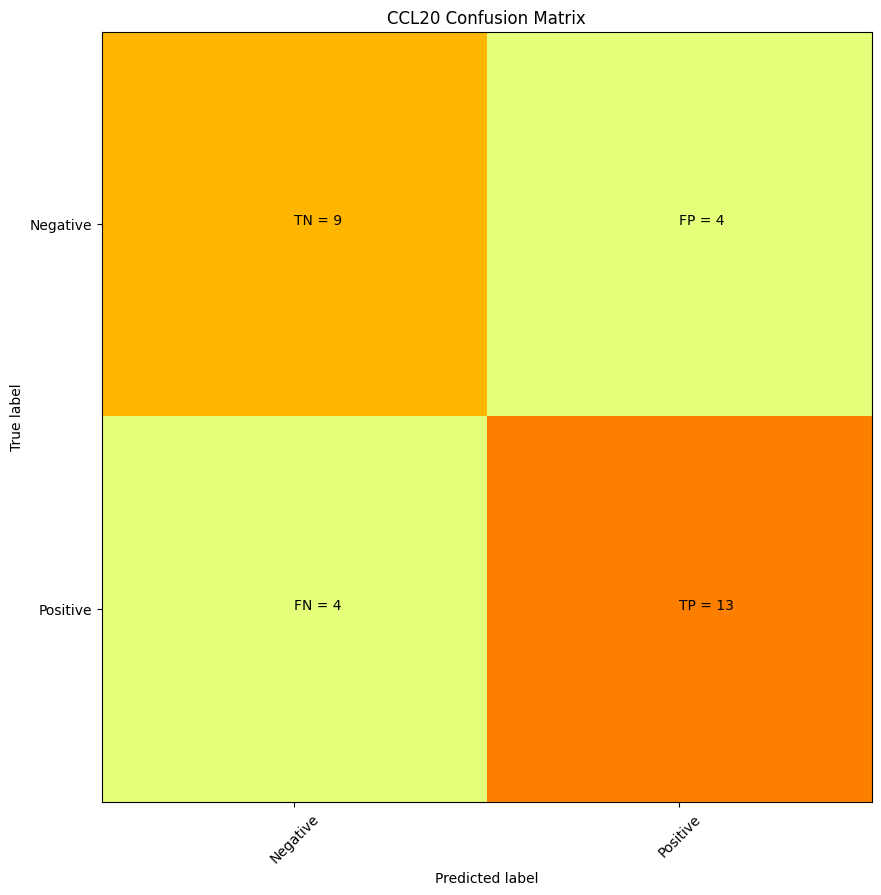

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
I23       0
I17       0
G11       0
J09       0
I19       0
J14       0
E18       0
L05       0
G13       0
L18       0
F22       0
L19       0
J11       0
B12       0
H13       0
J21       0
L17       0
C01       0
N08       0
M04       0
F16       0
I05       0
M07       0
H15       0
P18       0
J06       0
K02       0
H03       0
H01       0
O07       0 precision = 0.7647058823529411 recall = 0.7647058823529411


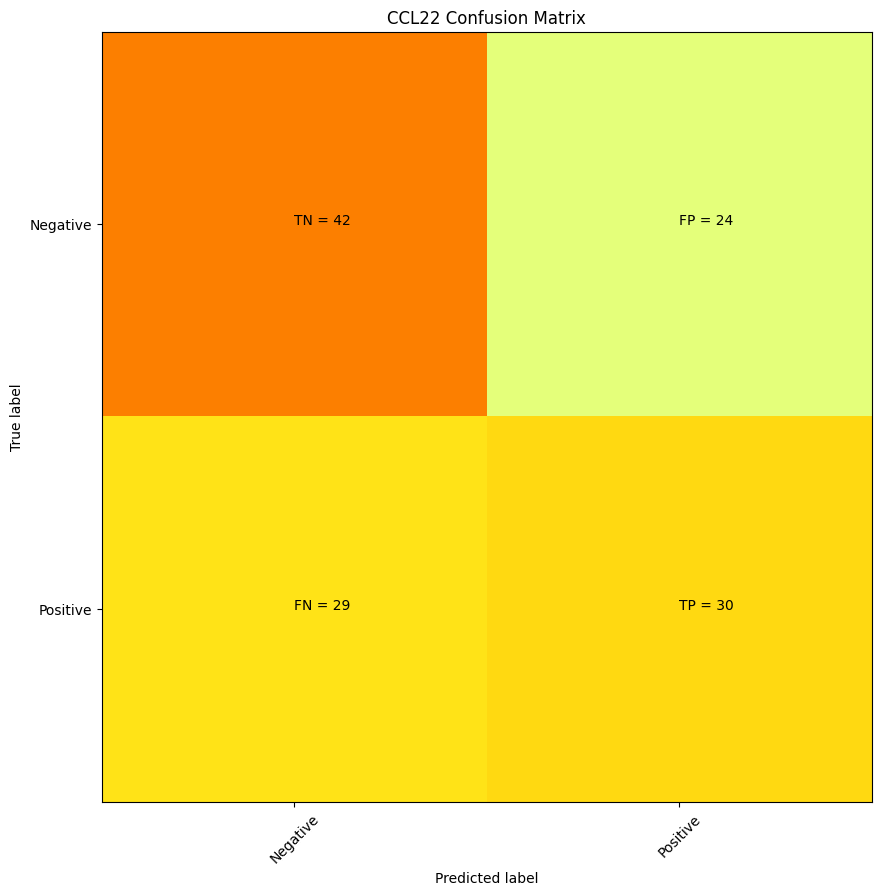

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

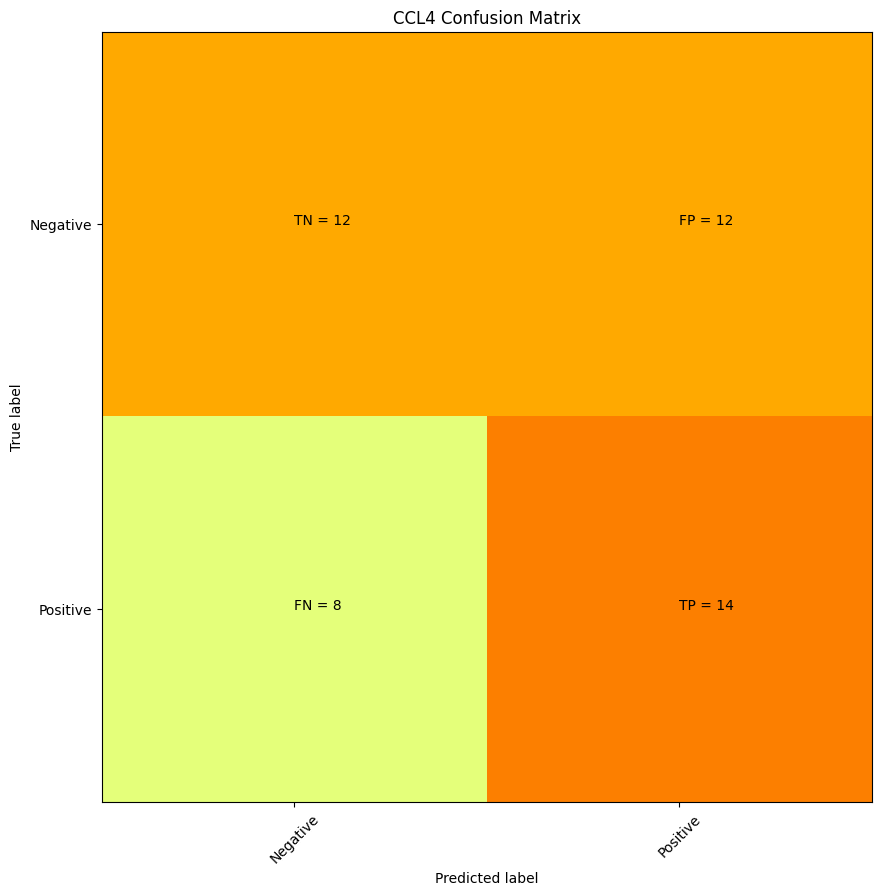

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P12      0
L02      0
K14      0
M20      0
M06      0
P24      0
L03      0
O22      0
F22      0
M08      0
N16      0
H04      0
N15      0
F08      0
M21      0
H10      0
E06      0
D03      0
D09      0
F20      0
C24      0
G01      0
P10      0
H05      0
F03      0
I09      0
N12      0
P16      0
C12      0
M03      0
B15      0
F21      0
B12      0
B14      0
K21      0
G12      0
L15      0
F16      0
C20      0
F17      0
A01      0
D10      0
O23      0

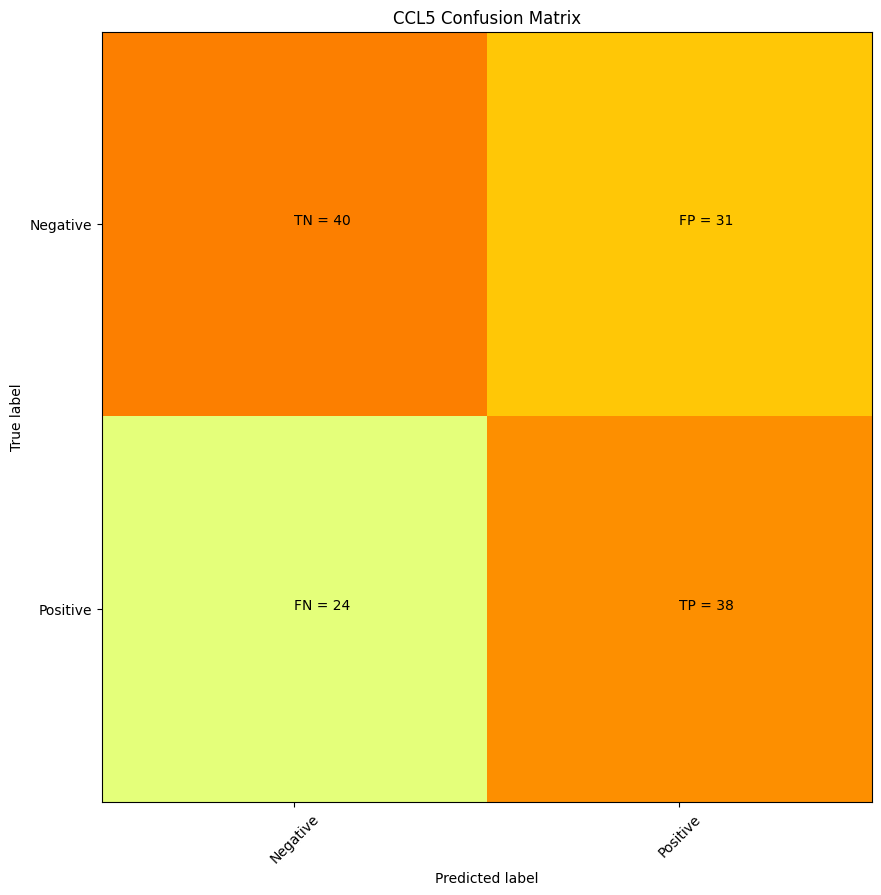

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

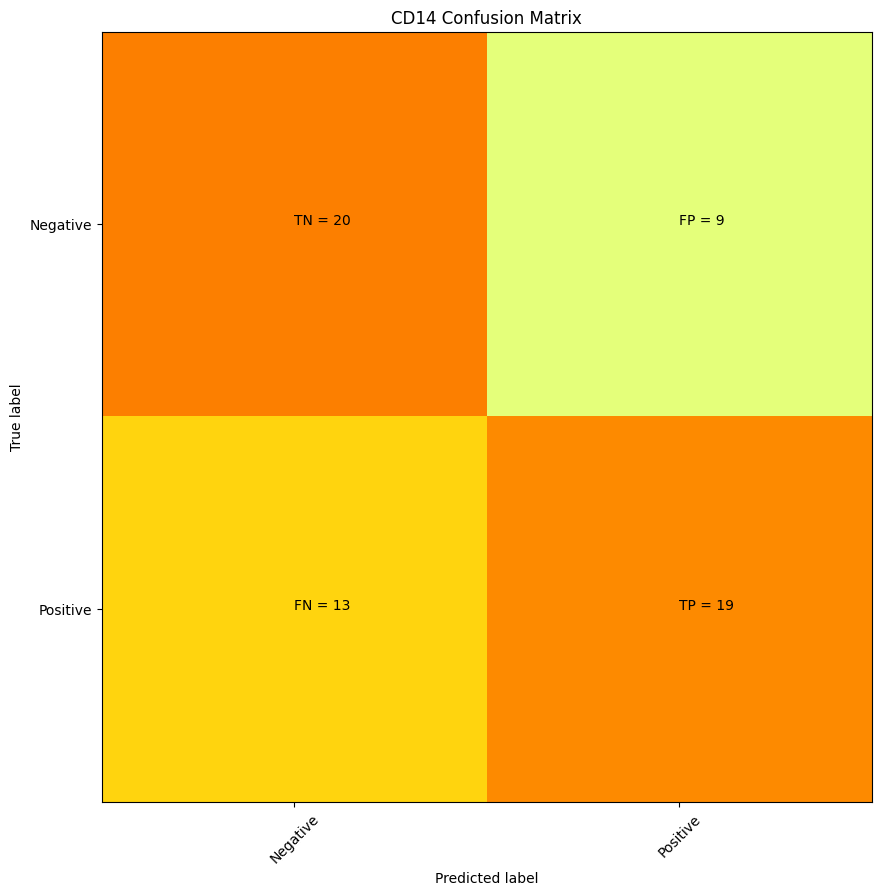

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
D17      0
I18      0
E24      0
N12      0
K03      0
I01      0
J12      0
O02      0
G21      0
H23      0
L17      0
L06      0
N15      0
M12      0
J19      0
J22      0
I15      0
C20      0
P19      0
B17      0
J01      0
C13      0
I02      0
H21      0
I08      0
A18      0
A17      0
H04      0

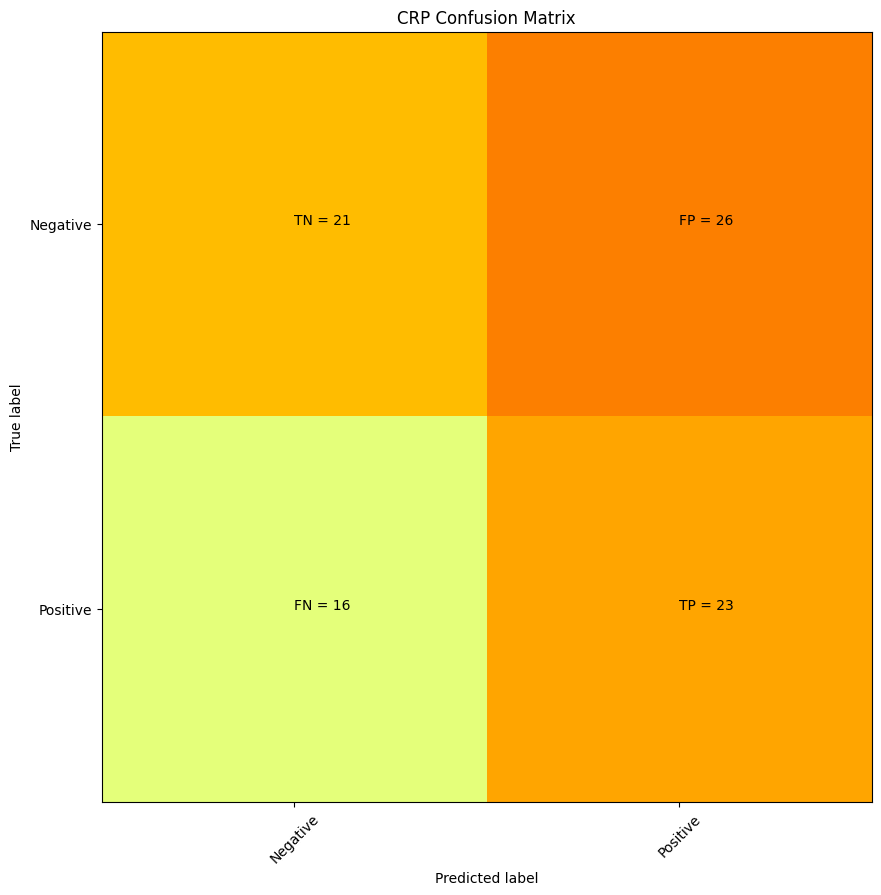

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
H16     0
O20     0
D01     0
N07     0
N21     0
P01     0
A12     0
A06     0
H01     0
M10     0
G22     0
G07     0


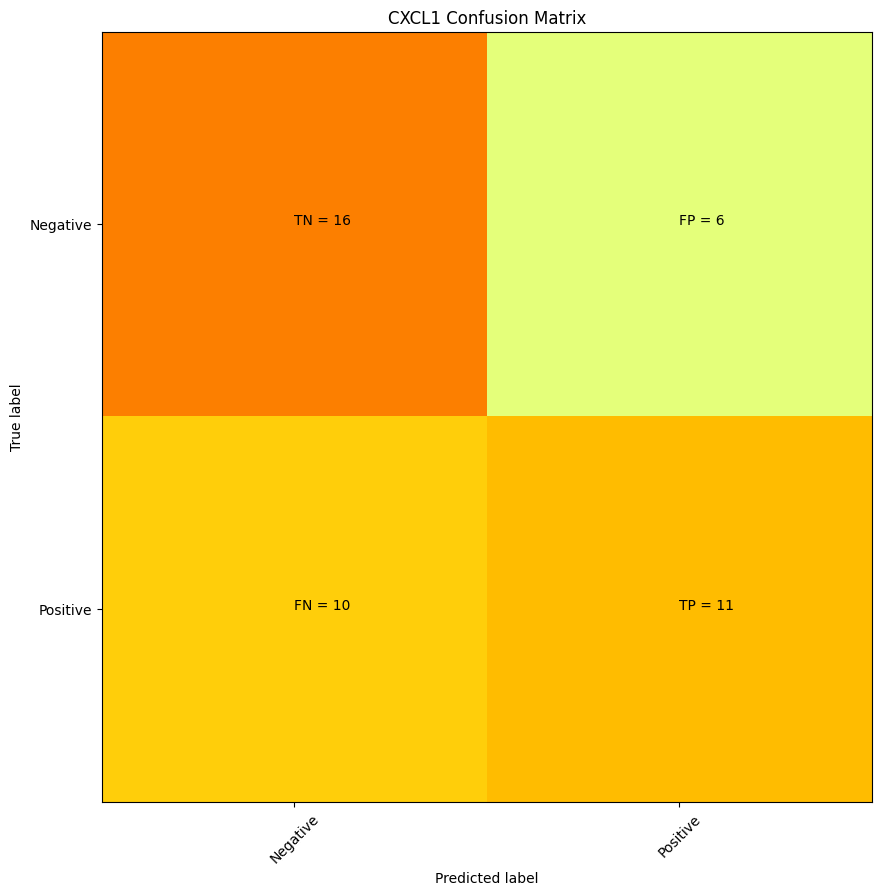

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
L24       0
C24       0
A13       0
D01       0
M16       0
G13       0
L15       0
B08       0
L09       0
A01       0
K23       0
K24       0
A10       0
M21       0
K20       0
K14       0
K21       0
A07       0
D04       0
N06       0
A17       0
M20       0
I22       0
M13       0
O20       0
I12       0
N04       0
G23       0
F21       0
B18       0
D18       0
A08       0
I24       0
C03       0
P14       0
G10       0
E21       0
N24       0
M03 

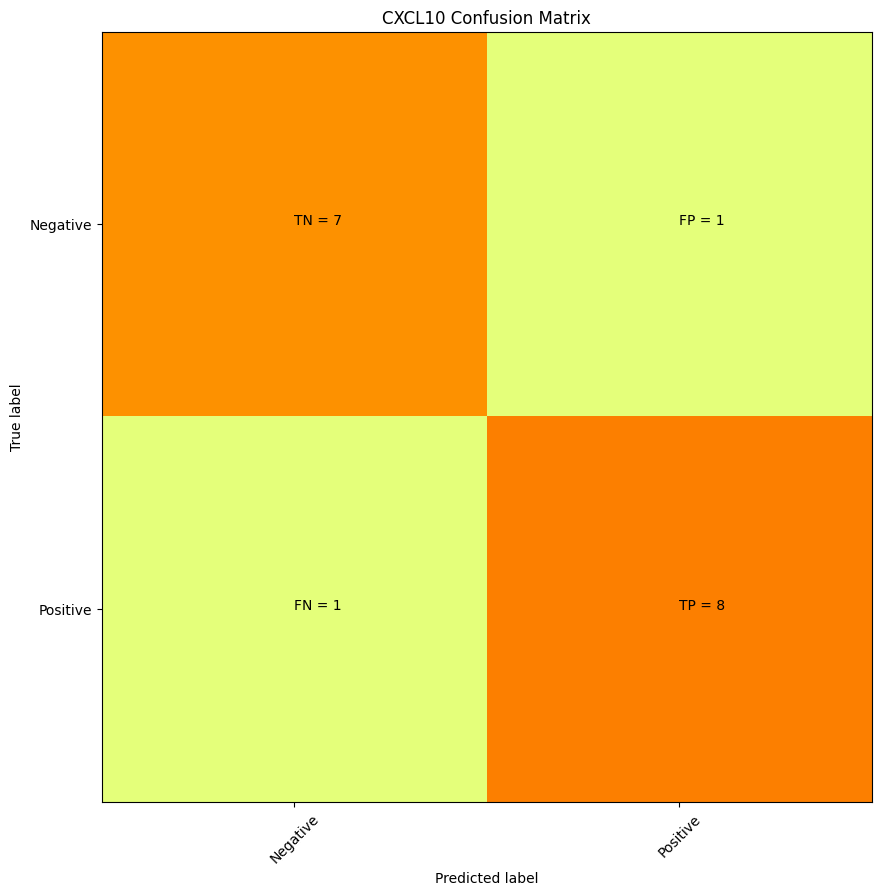

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
N16        0
C22        0
C11        0
J01        0
J07        0
G24        0
P03        0
F03        0
C14        0
E16        0
J04        0
D09        0
F07        0
G10        0
B12        0
A22        0
O20        0 precision = 0.8888888888888888 recall = 0.8888888888888888


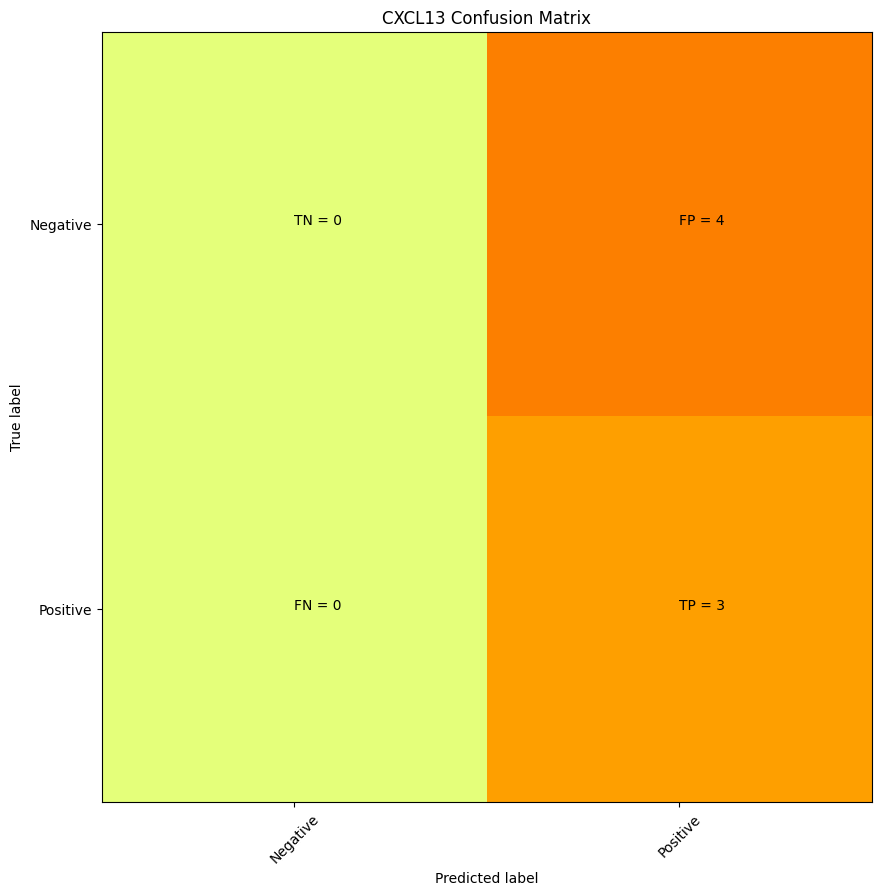

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
H09        0
E20        0
N19        0
N18        0
A01        0
C15        0
J22        0 precision = 0.42857142857142855 recall = 1.0


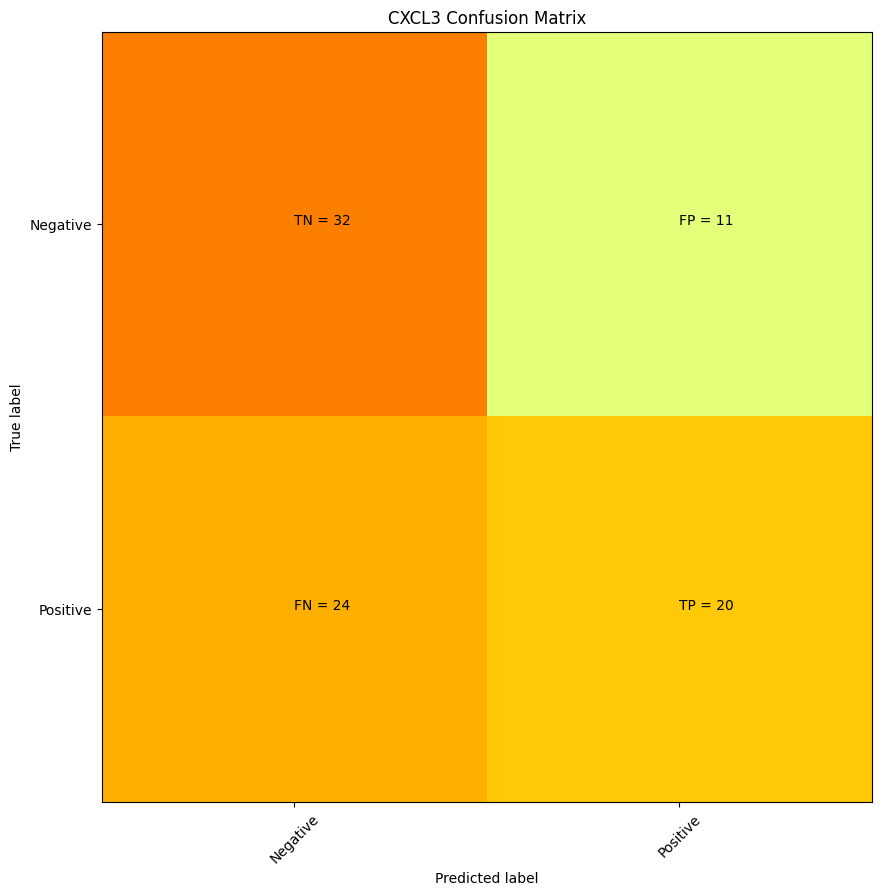

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

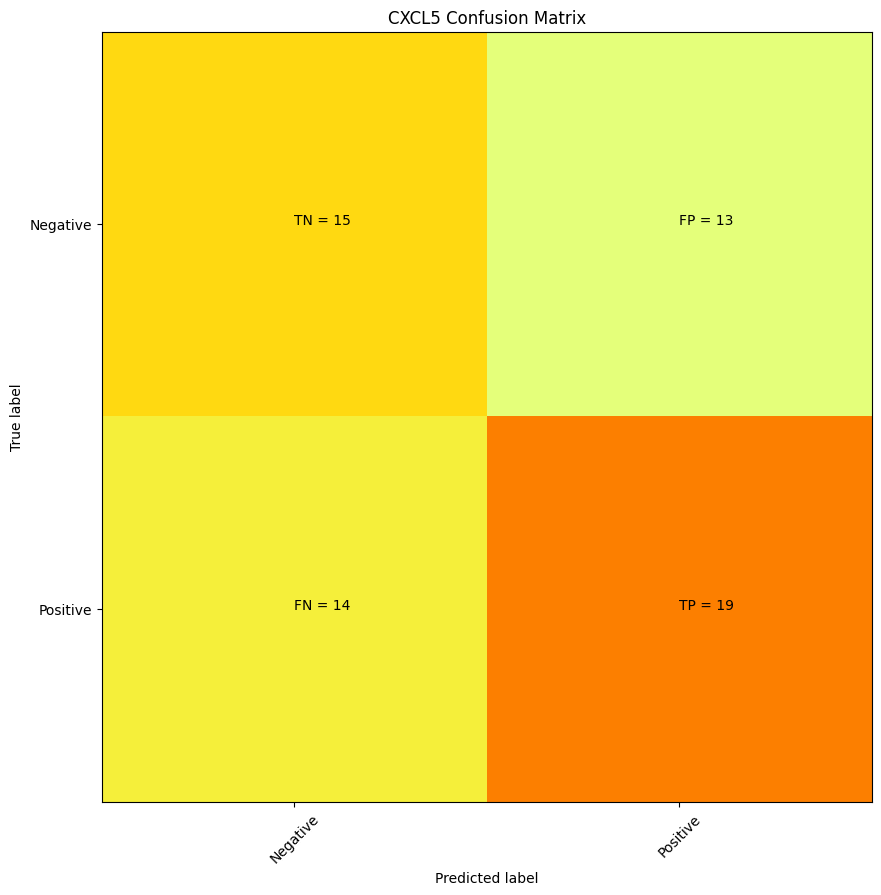

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H17       0
N19       0
D10       0
H10       0
B05       0
J20       0
H09       0
K12       0
N18       0
O06       0
K06       0
K08       0
E14       0
P14       0
K05       0
C21       0
B01       0
J15       0
B06       0
D21       0
C13 

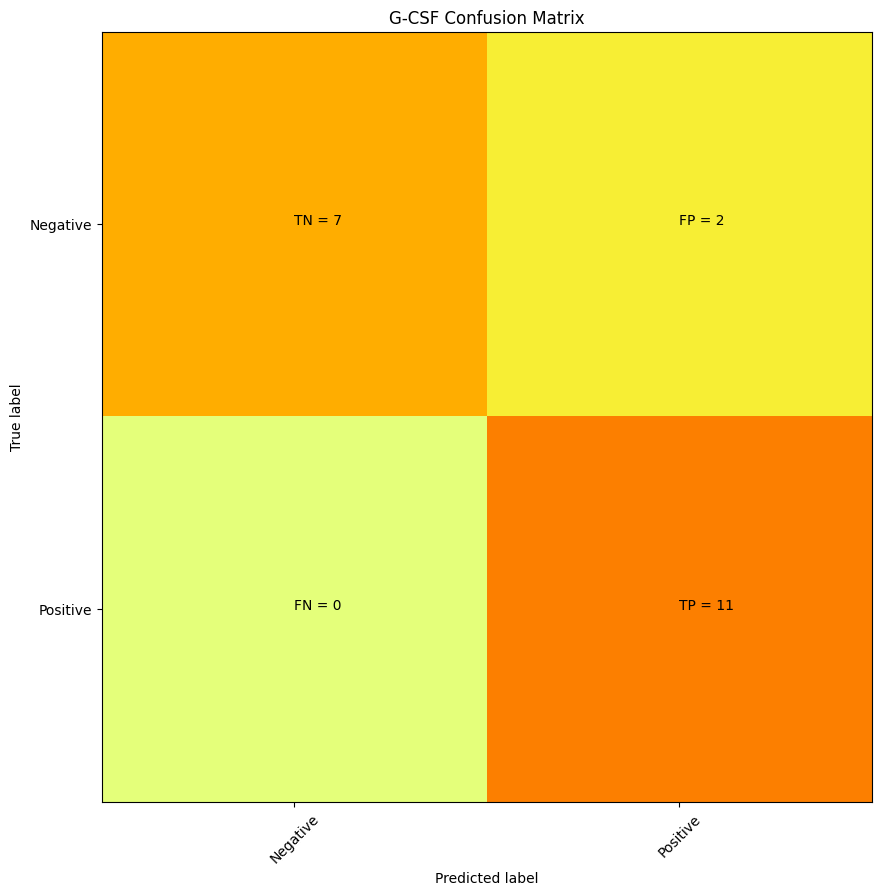

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
N22       0
G23       0
H05       0
L05       0
P14       0
L14       0
J16       0
L22       0
H18       0
N24       0
C03       0
N15       0
A21       0
O06       0
I13       0
P19       0
O21       0
C12       0
G03       0
I15       0 precision = 0.8461538461538461 recall = 1.0


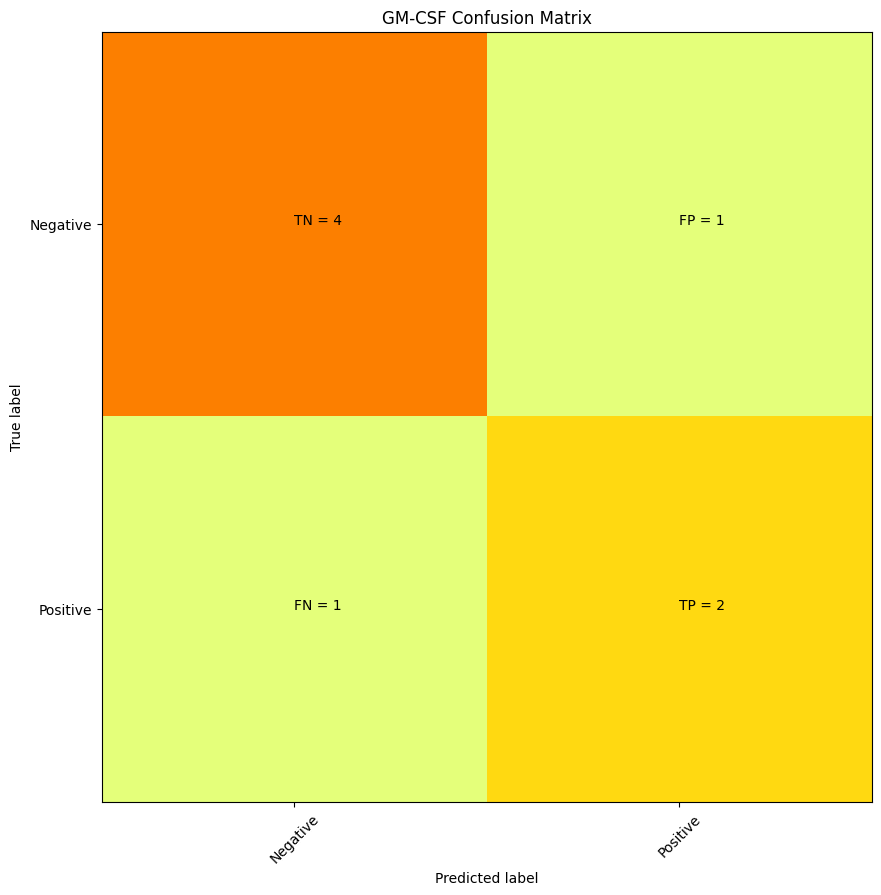

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
F12        0
J03        0
A23        0
O04        0
P17        0
I16        0
B10        0
K16        0 precision = 0.6666666666666666 recall = 0.6666666666666666


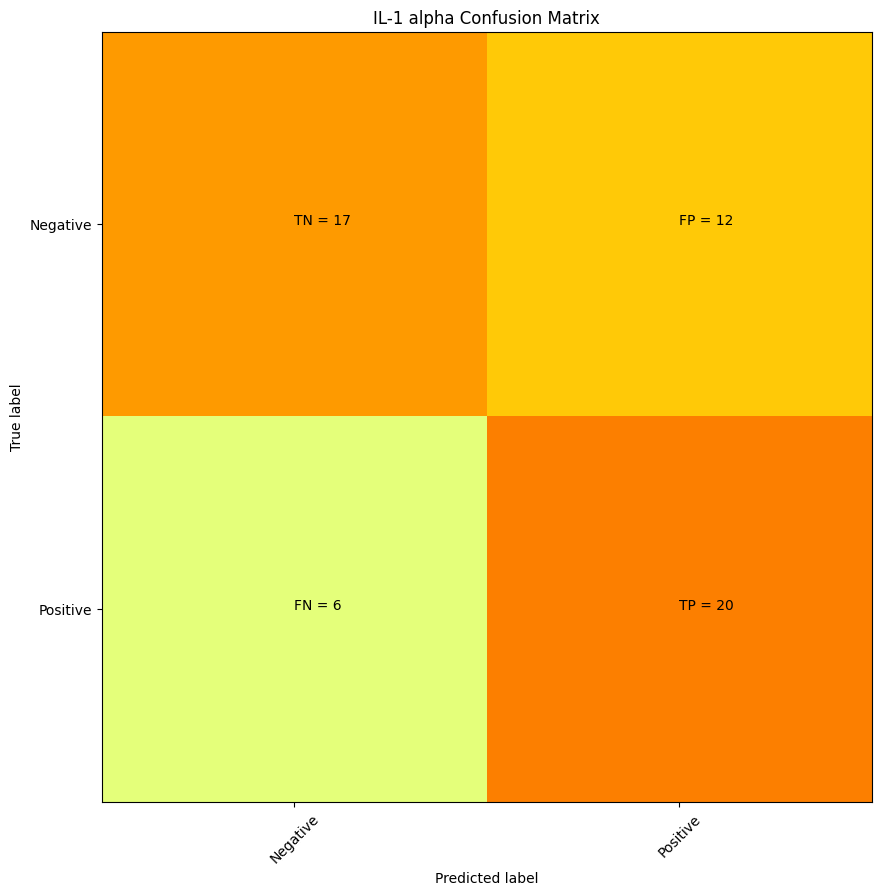

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
I02            0
F09           

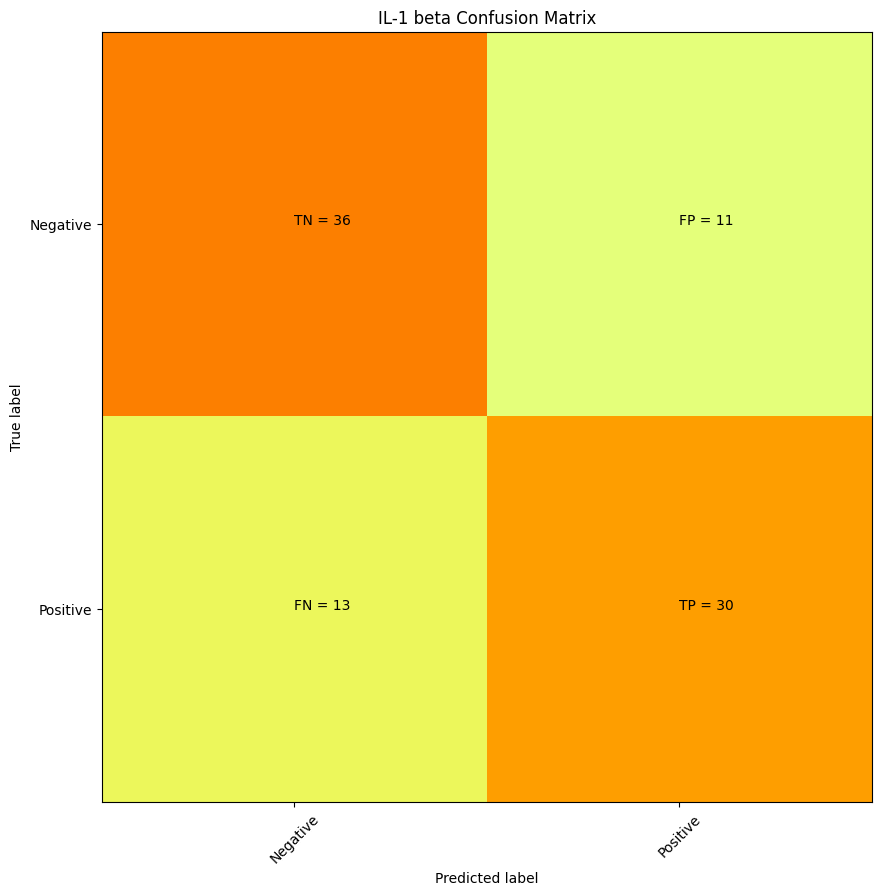

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

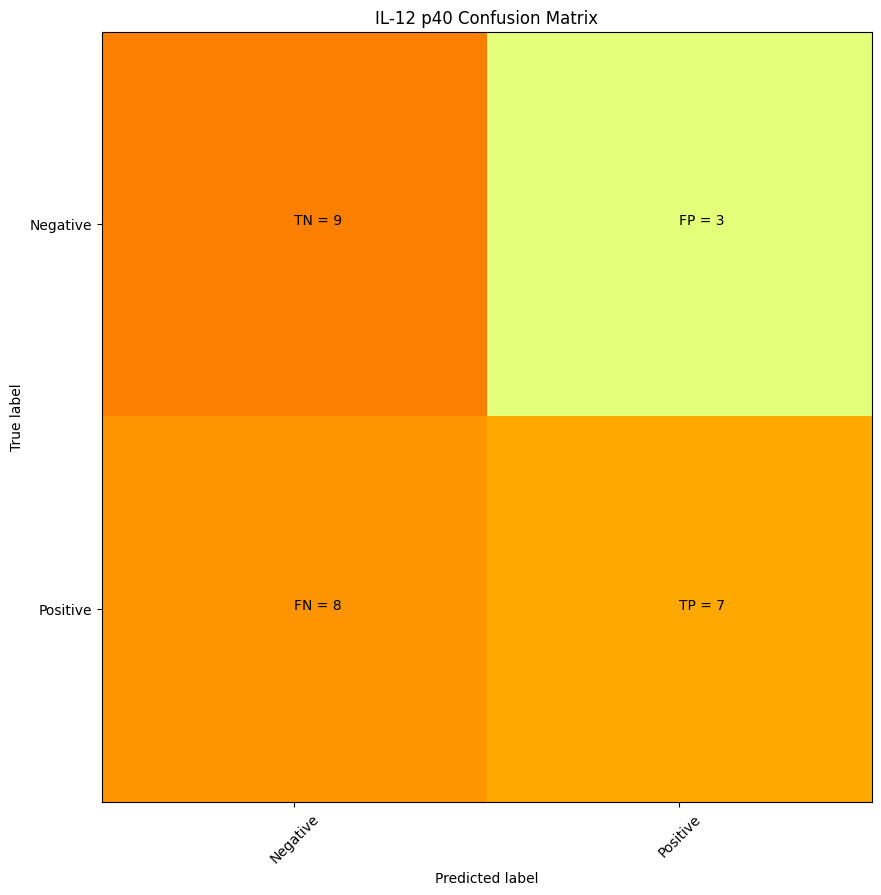

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
D15           0
F05           0
N15           0
D21           0
F03           0
J06           0
K14           0
L04           0
B04           0
J08           0
B09           0
E04           0
A09           0
M11           0
M17           0
H02           0
G24           0
J02           0
B03           0
O01           0
H09           0
J19           0
J16           0
M13           0
H01           0
I21           0
B02           0 precision = 0.7 recall = 0.4666666666666667


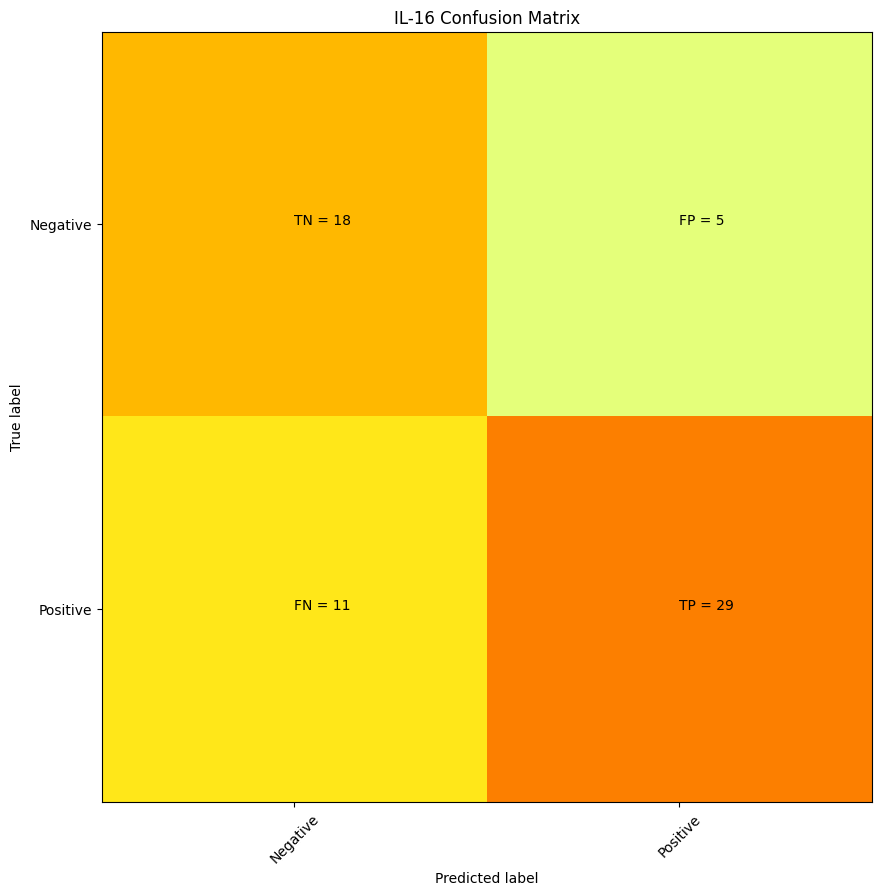

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
P19       0
B15       0
C05       0
B10       0
N01       0
E19       0
E05       0
J17       0
E06       0
K04       0
I03       0
F22       0
P01       0
A07       0
D19       0
N10       0
B05       0
I01       0
H21 

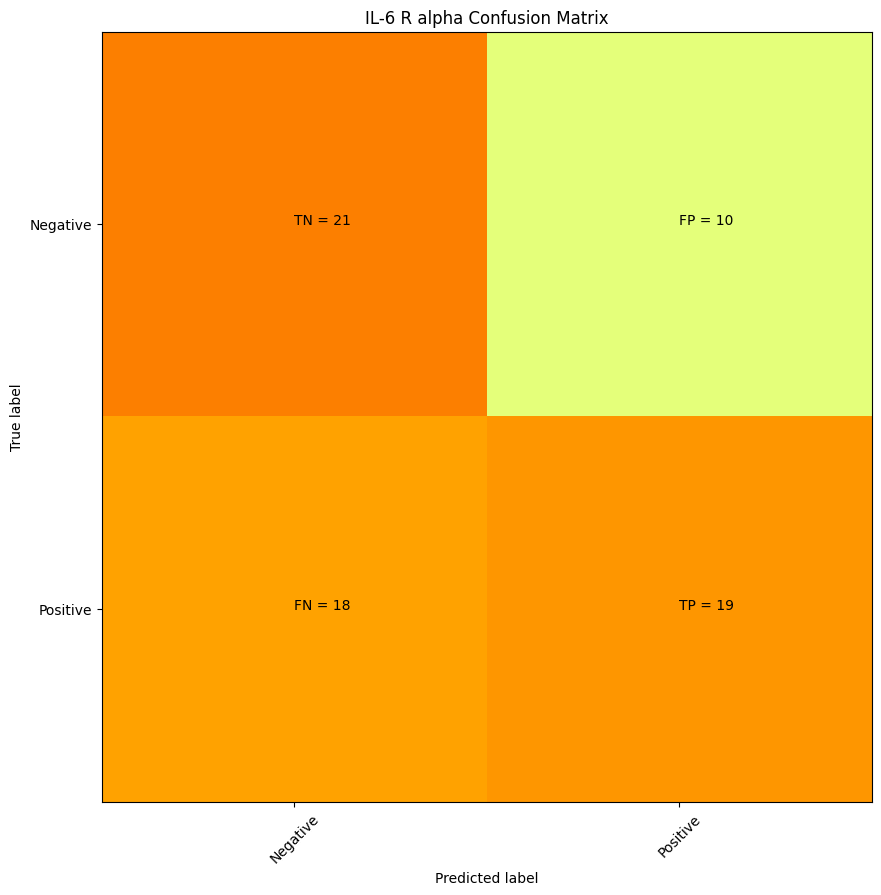

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

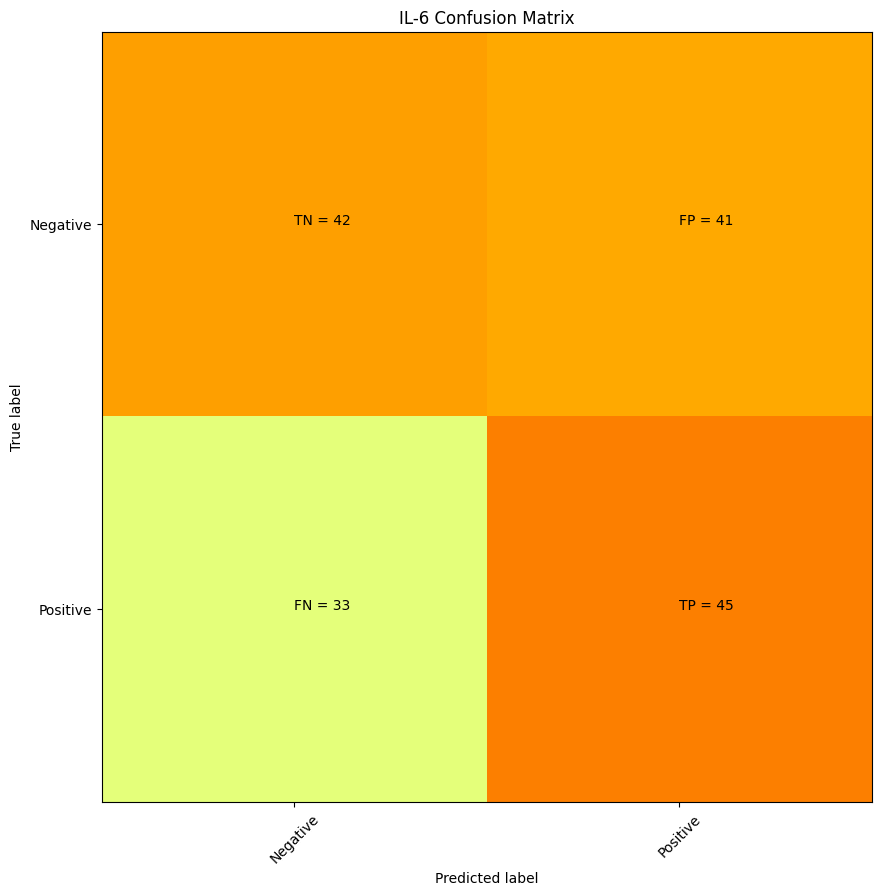

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

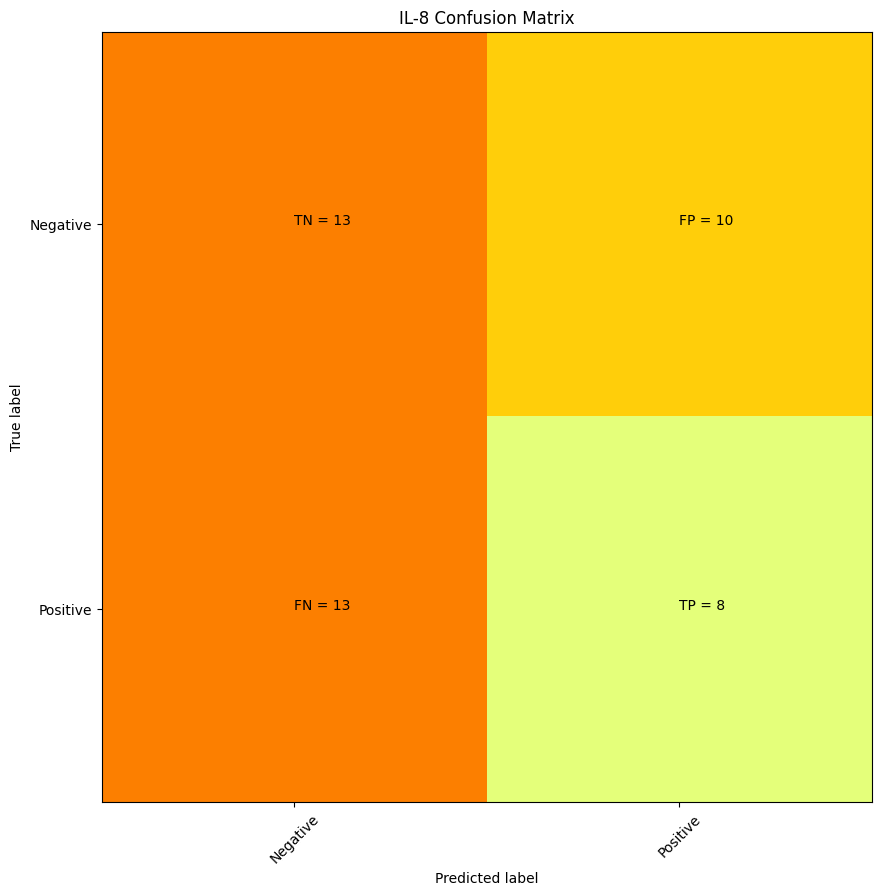

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
N17      0
N16      0
G17      0
A12      0
E09      0
J22      0
N14      0
M14      0
A06      0
D14      0
M07      0
C12      0
O24      0
J20      0
G15      0
L10      0
C02      0
N05      0
C22      0
J15      0
D09      0
I16      0
P10      0
C07      0
F02      0
E08      0
F20      0
D01      0
F09      0
L03      0
F16      0
P09      0
O06      0
B06      0
N09      0
M06      0
P12      0
B04      0
E20      0
J13      0
C20      0
M18      0
I02      0
I12      0 precision 

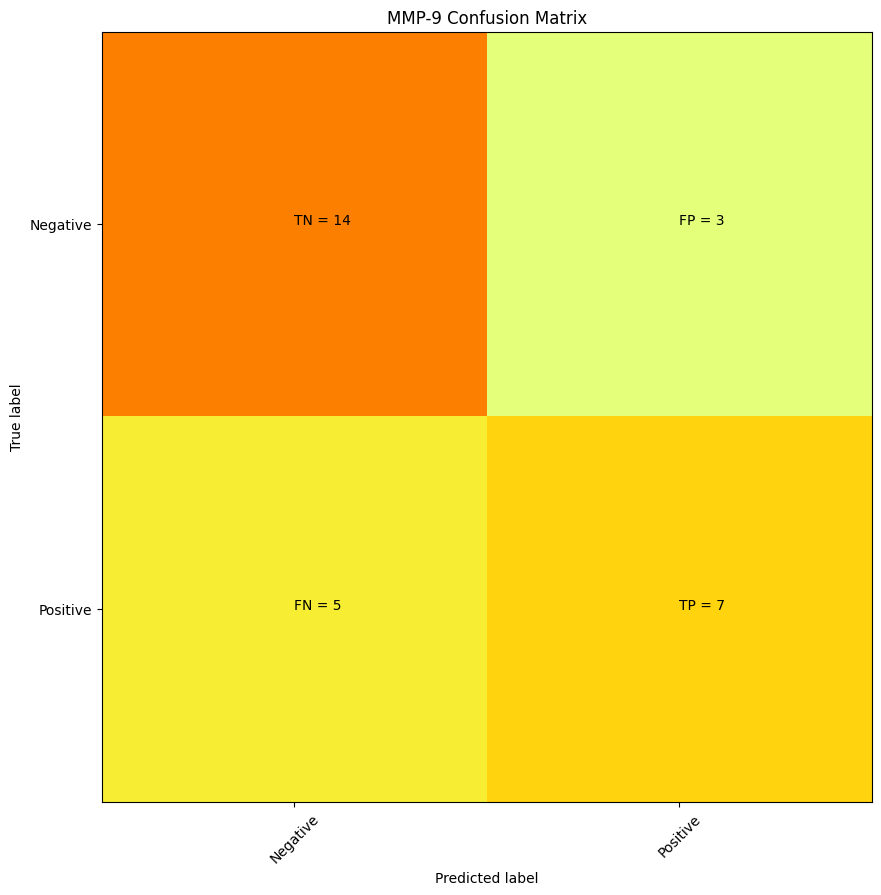

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
C16       0
G21       0
A11       0
G04       0
C15       0
B09       0
J03       0
M22       0
E08       0
O02       0
L05       0
I10       0
B15       0
L16       0
P22       0
H19       0
O03       0
K04       0
C08       0
B13       0
A16       0
C18       0
N23       0
I13       0
P02       0
L15       0
N21       0
K21       0
I17       0 precision = 0.7 recall = 0.5833333333333334


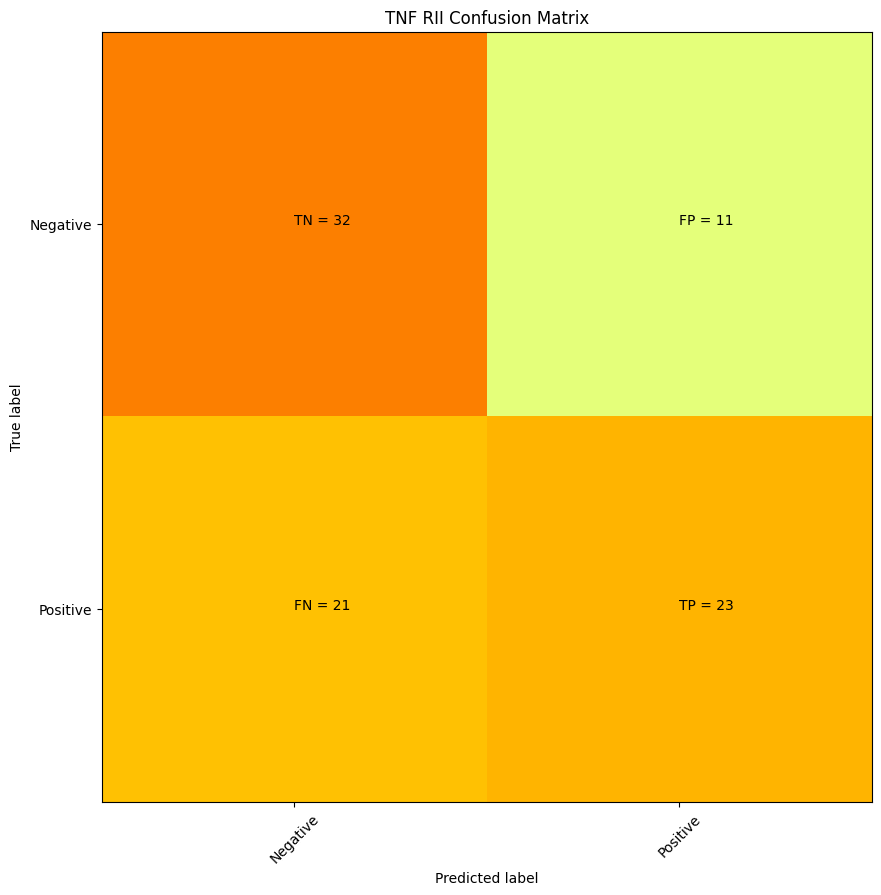

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [62]:
summarizing = []
summarizer_treepicks = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in treepicks_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_treepicks = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_treepicks['Precision'] = summarizer_treepicks['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [63]:
summarizer_treepicks

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.714286,0.652174,429,47
1,CCL1,0.640000,0.727273,467,46
2,CCL19,0.666667,0.571429,227,12
3,CCL2,0.589744,0.534884,490,95
4,CCL20,0.764706,0.764706,494,30
5,CCL22,0.555556,0.508475,546,125
6,CCL4,0.538462,0.636364,482,46
7,CCL5,0.550725,0.612903,565,133
8,CD14,0.678571,0.593750,444,61
9,CRP,0.469388,0.589744,553,86


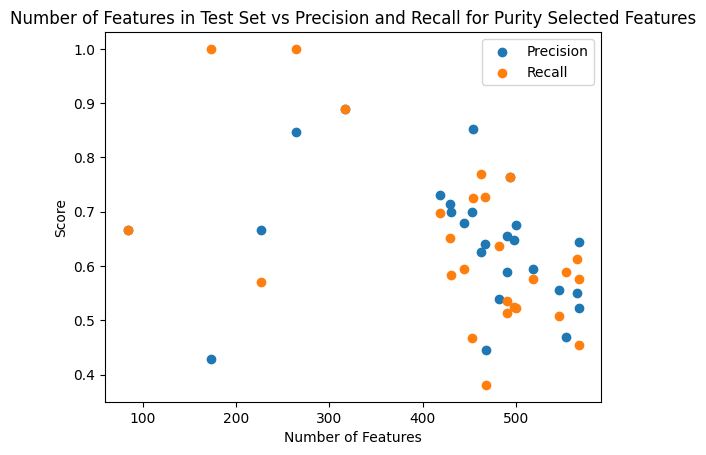

In [64]:
#Basically no trend
plt.scatter(y=summarizer_treepicks["Precision"], x = summarizer_treepicks["Number of Features"])
plt.scatter(y=summarizer_treepicks["Recall"], x = summarizer_treepicks["Number of Features"])
plt.xlabel("Number of Features")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Features in Test Set vs Precision and Recall for Purity Selected Features")
plt.show()

## Performance with sequentially selected features

In [73]:
# DO NOT USE THIS BLOCK IF YOU READ IN FROM CSV

seqtree_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = seqtree[seqtree["Cytokine"]==name]
        print("got sub")
        features = sub.iloc[:, -1:].values
        print("selected features")
        listed_features = features[0][0].tolist()
        print(listed_features)
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        seqtree_listing.append(finaldata)
    except:
        continue

seqtree_listing[0]

Activin A
got sub
selected features
Amphiregulin
got sub
selected features
CCL1
got sub
selected features
CCL19
got sub
selected features
CCL2
got sub
selected features
CCL20
got sub
selected features
CCL22
got sub
selected features
CCL4
got sub
selected features
CCL5
got sub
selected features
CCL8
got sub
selected features
CD14
got sub
selected features
CRP
got sub
selected features
CX3CL1
got sub
selected features
CXCL1
got sub
selected features
CXCL10
got sub
selected features
CXCL11
got sub
selected features
CXCL13
got sub
selected features
CXCL3
got sub
selected features
CXCL5
got sub
selected features
G-CSF
got sub
selected features
GM-CSF
got sub
selected features
IL-1 alpha
got sub
selected features
IL-1 beta
got sub
selected features
IL-10
got sub
selected features
IL-12 p40
got sub
selected features
IL-15
got sub
selected features
IL-16
got sub
selected features
IL-4
got sub
selected features
IL-6 R alpha
got sub
selected features
IL-6
got sub
selected features
IL-8
got sub
s

IndexError: list index out of range

In [90]:
#USE THIS BLOCK IF YOU READ IN FROM CSV


seqtree_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = seqtree[seqtree["Cytokine"]==name]
        print("got sub")
        features = sub.iloc[:, -1:].values
        print("selected features")
        listed_features = features[0][0].replace('[', '').replace(']','').split(",")
        print(listed_features)
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        seqtree_listing.append(finaldata)
    except:
        continue

seqtree_listing[0]

Activin A
got sub
selected features
['Output_2', 'Output_5', 'Output_15', 'Output_21', 'Output_22', 'Output_38', 'Output_102', 'Output_270', 'Output_781', 'Output_999']
got embeddings
got final data
Amphiregulin
got sub
selected features
CCL1
got sub
selected features
['Output_2', 'Output_5', 'Output_9', 'Output_21', 'Output_38', 'Output_778', 'Output_917', 'Output_1141', 'Output_1169', 'Output_1231']
got embeddings
got final data
CCL19
got sub
selected features
['Output_0', 'Output_1', 'Output_2', 'Output_3', 'Output_5', 'Output_6\n', 'Output_9', 'Output_249', 'Output_698', 'Output_1011']
got embeddings
got final data
CCL2
got sub
selected features
['Output_2', 'Output_5', 'Output_81', 'Output_272', 'Output_695', 'Output_719\n', 'Output_797', 'Output_1120', 'Output_1237', 'Output_1265']
got embeddings
got final data
CCL20
got sub
selected features
['Output_0', 'Output_2', 'Output_3', 'Output_5', 'Output_6', 'Output_9\n', 'Output_10', 'Output_11', 'Output_344', 'Output_939']
got embedd

,Activin A,Output_2,Output_5,Output_15,Output_21,Output_22,Output_38,Output_102,Output_270,Output_781,Output_999
well,,,,,,,,,,,
A09,1,-0.028690,-0.094637,-0.097524,-0.056563,-0.073379,-0.029817,0.309485,3.039436,1.224563,1.917640
C03,1,-0.034746,-0.092844,-0.091375,-0.049482,-0.074196,-0.030163,0.255992,2.989576,1.150732,1.905670
C09,1,-0.023539,-0.095040,-0.091294,-0.057644,-0.072696,-0.029539,0.230767,2.982102,1.088674,1.891168
C17,1,-0.034689,-0.093931,-0.087208,-0.054568,-0.074391,-0.032535,0.325112,2.955379,1.112263,1.799793
F03,1,-0.032818,-0.087311,-0.090871,-0.053214,-0.071331,-0.026546,0.266333,2.949657,1.137395,1.919190
F04,1,-0.032567,-0.096229,-0.089053,-0.054684,-0.074640,-0.032225,0.265367,2.945906,1.190715,1.954056
F05,1,-0.036938,-0.096926,-0.088637,-0.059289,-0.073573,-0.033544,0.249309,2.996301,1.202223,1.964989
F08,1,-0.031914,-0.090722,-0.091793,-0.053382,-0.075059,-0.029489,0.254807,2.871526,1.162286,1.918449
F09,1,-0.034480,-0.090843,-0.091245,-0.057431,-0.069146,-0.030369,0.325537,2.906058,1.196501,1.917917


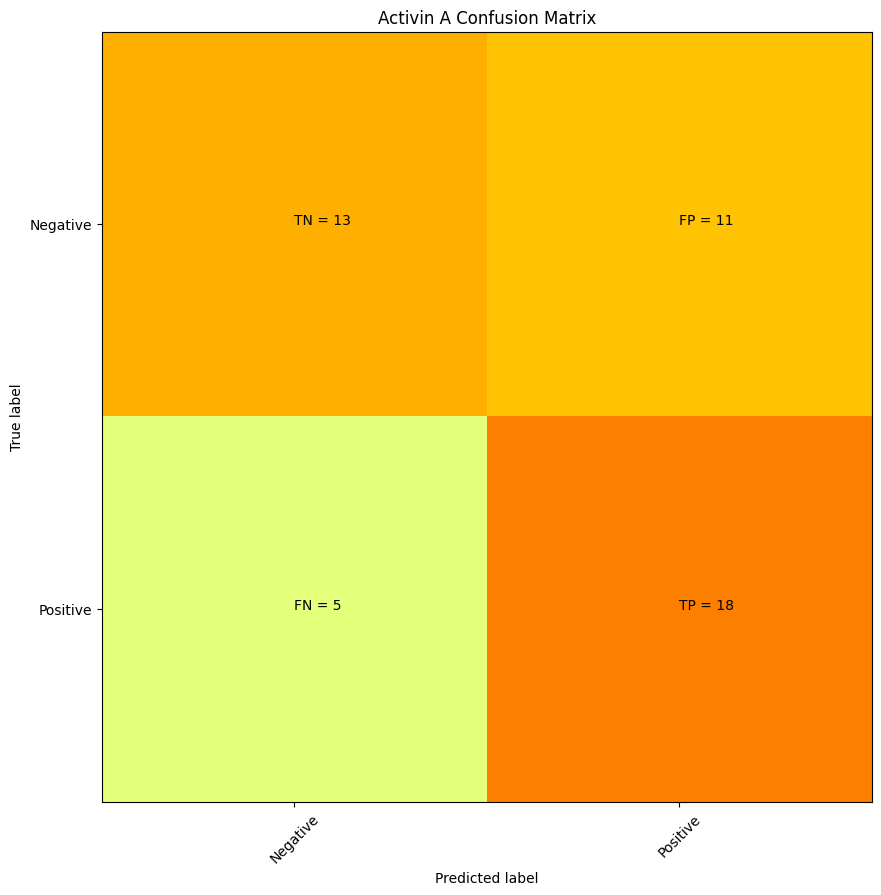

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
M11           0
G23           0
A13           0
D07           0
M10           0
N13           0
N15           0
C01           0
N24           0
I20           0
L19           0
P23           0
L16           0
A16     

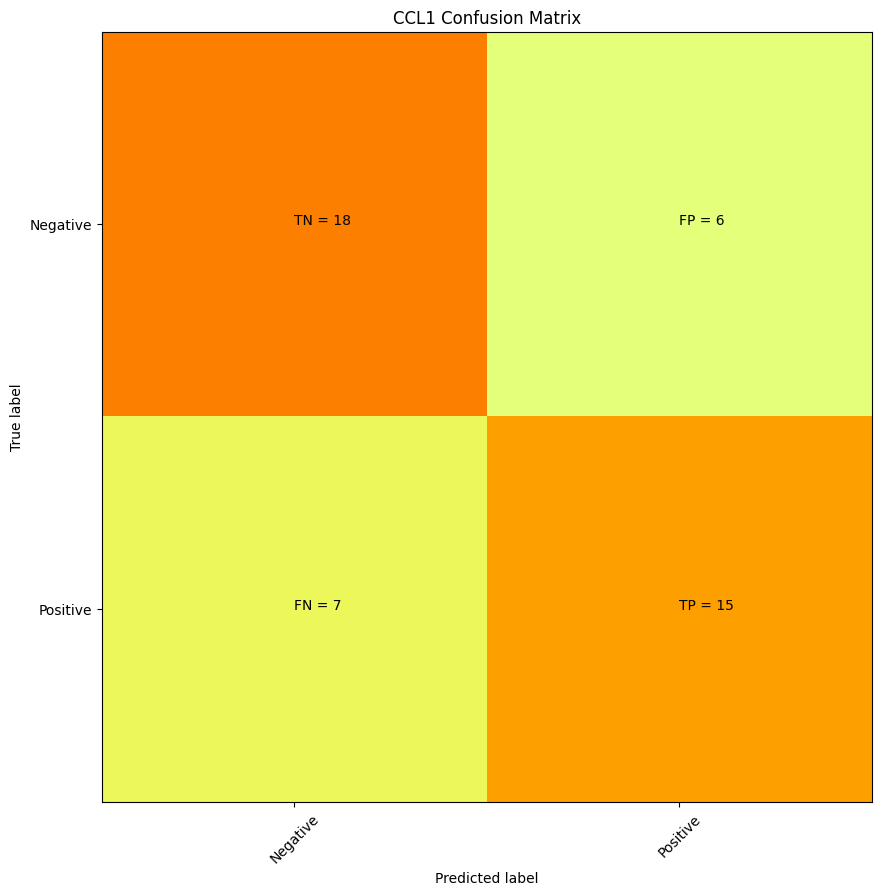

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
L17      0
M21      0
A14      0
G14      0
D11      0
M19      0
E03      0
E17      0
A11      0
G21      0
P16      0
D15      0
M12      0
G06      0
F24      0
N12      0
J15      0
M02      0
K01      0
A22      0
K06      0
G23      0
I13      0
I11      0
N14      0
O16      0
O14      0
B09      0
K11      0
B14      0
K15      0
G08      0
J02      0
O07      0
C23      0
H14      0
C04      0
M04      0
O04      0
K16      0
B05      0
M24      0
I15      0

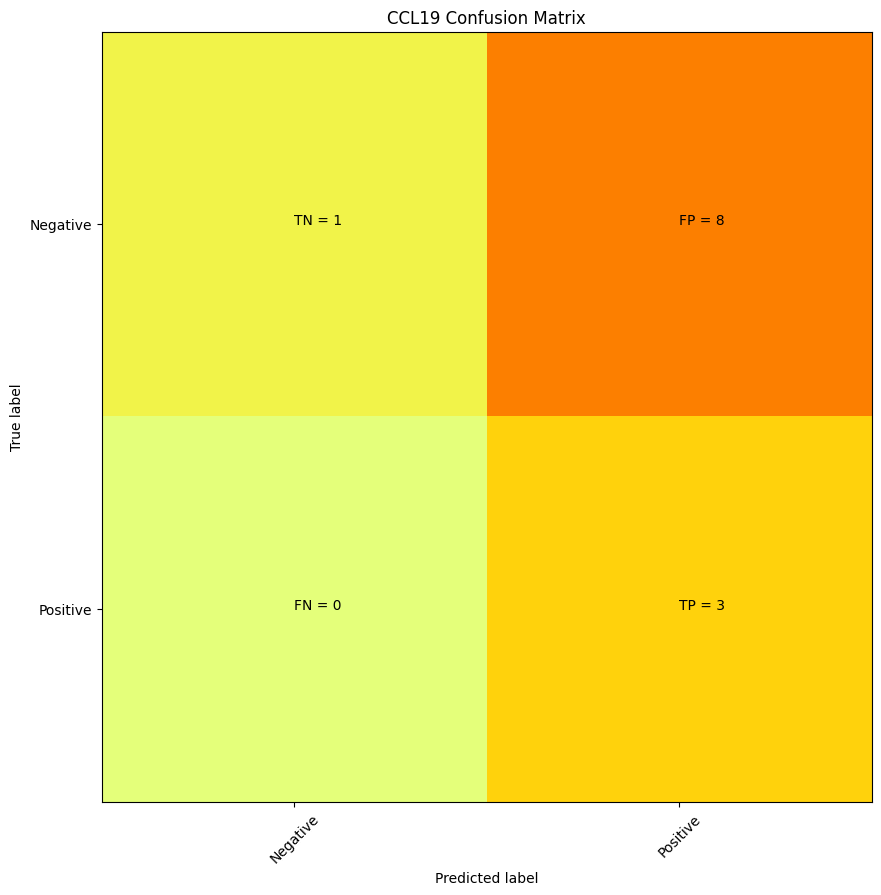

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
F06       0
F23       0
B15       0
B01       0
A09       0
J02       0
P08       0
F19       0
L14       0
F02       0
O19       0
N13       0 precision = 0.2727272727272727 recall = 1.0


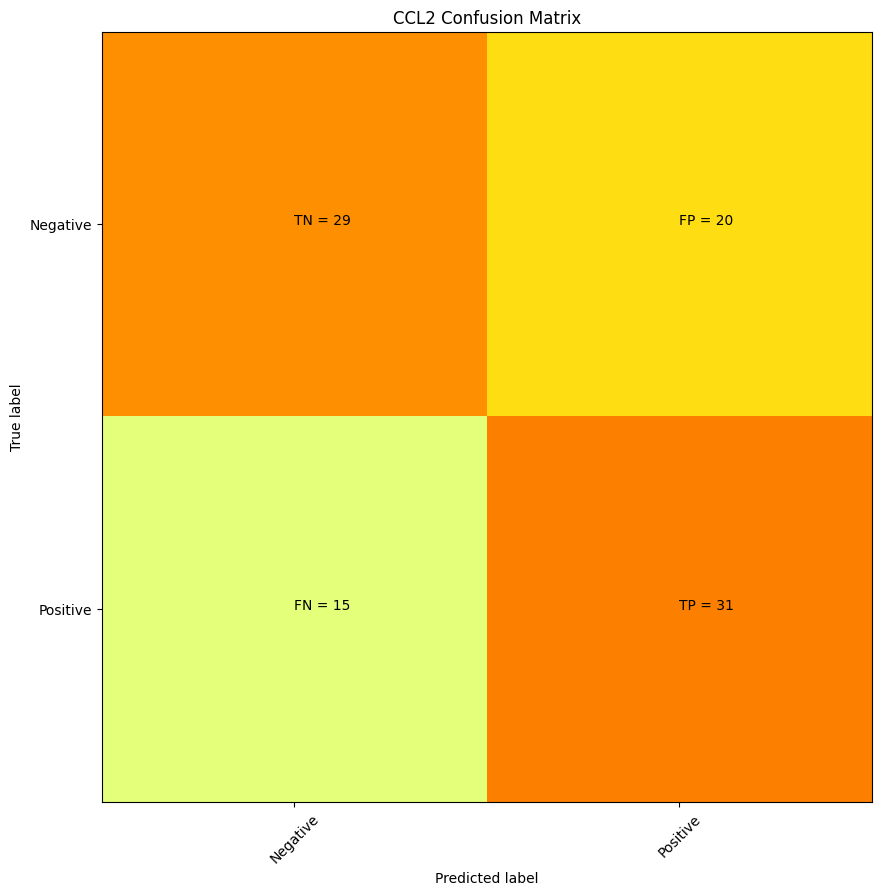

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

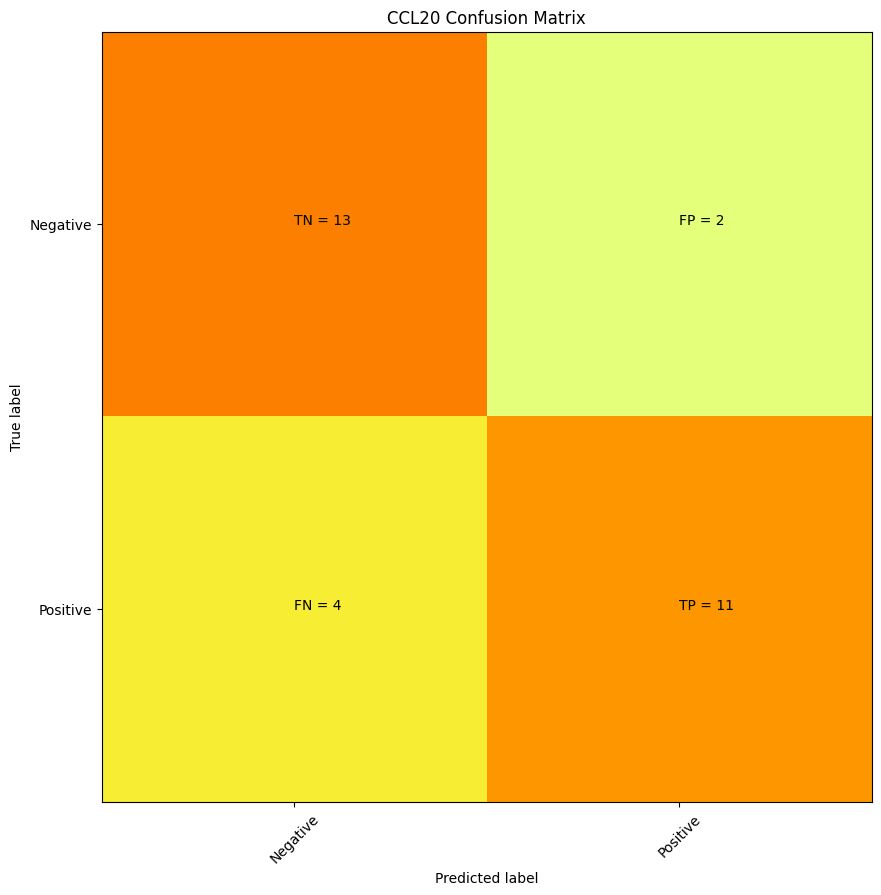

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
I23       0
I17       0
G11       0
J09       0
I19       0
J14       0
E18       0
L05       0
G13       0
L18       0
F22       0
L19       0
J11       0
B12       0
H13       0
J21       0
L17       0
C01       0
N08       0
M04       0
F16       0
I05       0
M07       0
H15       0
P18       0
J06       0
K02       0
H03       0
H01       0
O07       0 precision = 0.8461538461538461 recall = 0.7333333333333333


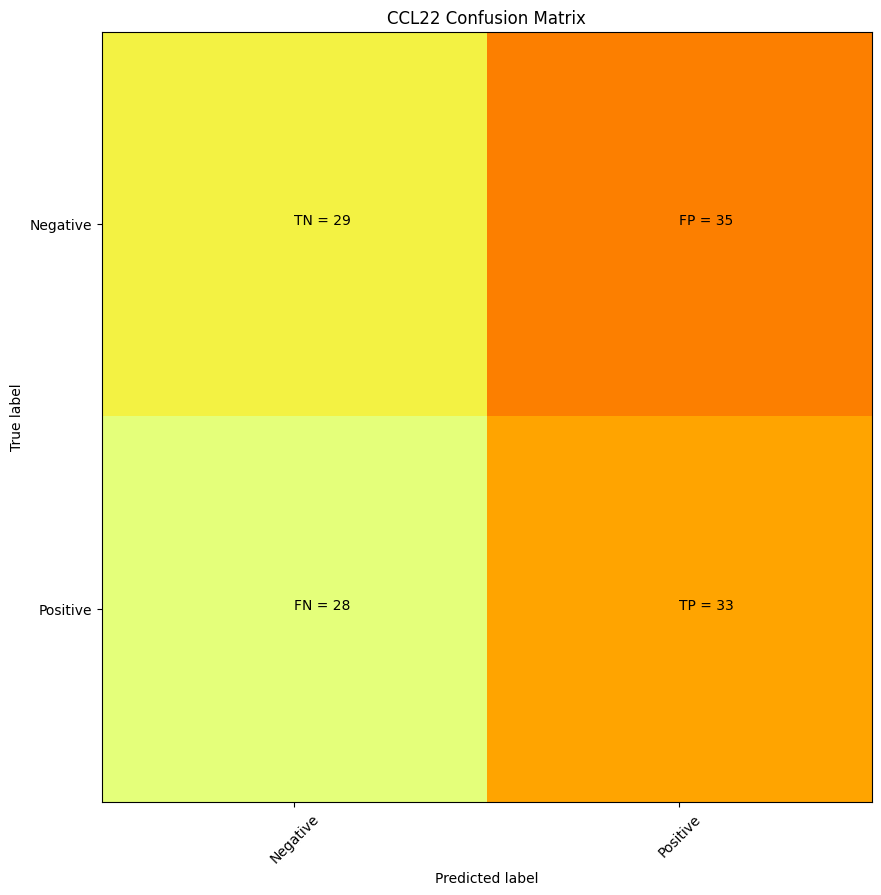

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

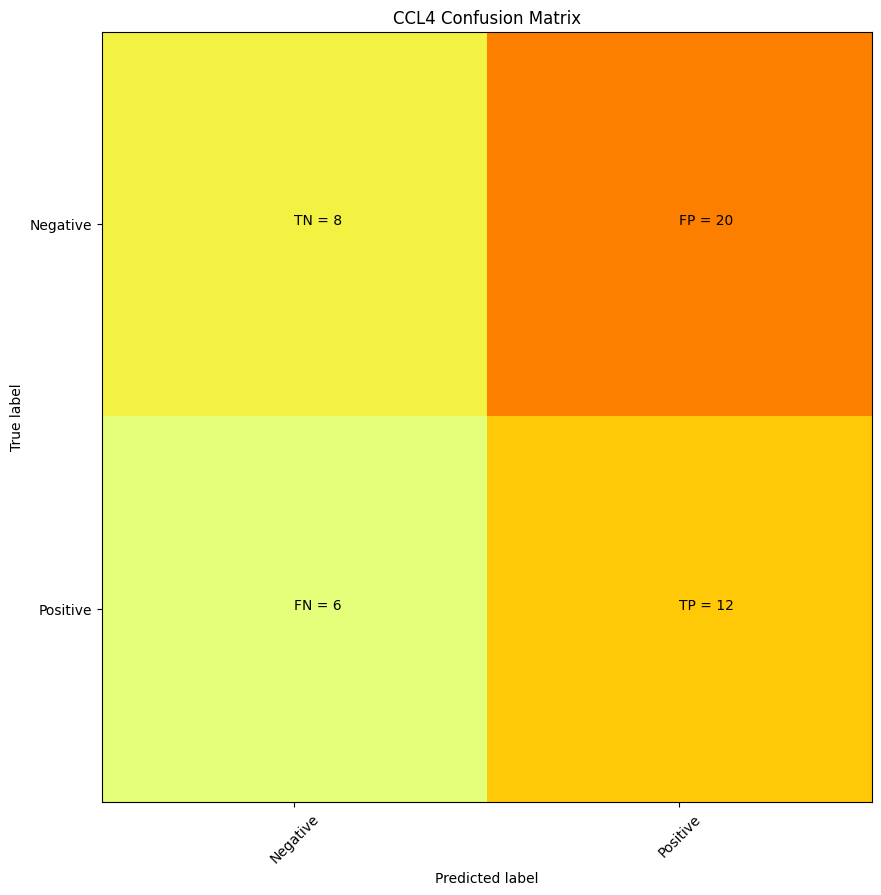

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P12      0
L02      0
K14      0
M20      0
M06      0
P24      0
L03      0
O22      0
F22      0
M08      0
N16      0
H04      0
N15      0
F08      0
M21      0
H10      0
E06      0
D03      0
D09      0
F20      0
C24      0
G01      0
P10      0
H05      0
F03      0
I09      0
N12      0
P16      0
C12      0
M03      0
B15      0
F21      0
B12      0
B14      0
K21      0
G12      0
L15      0
F16      0
C20      0
F17      0
A01      0
D10      0
O23      0

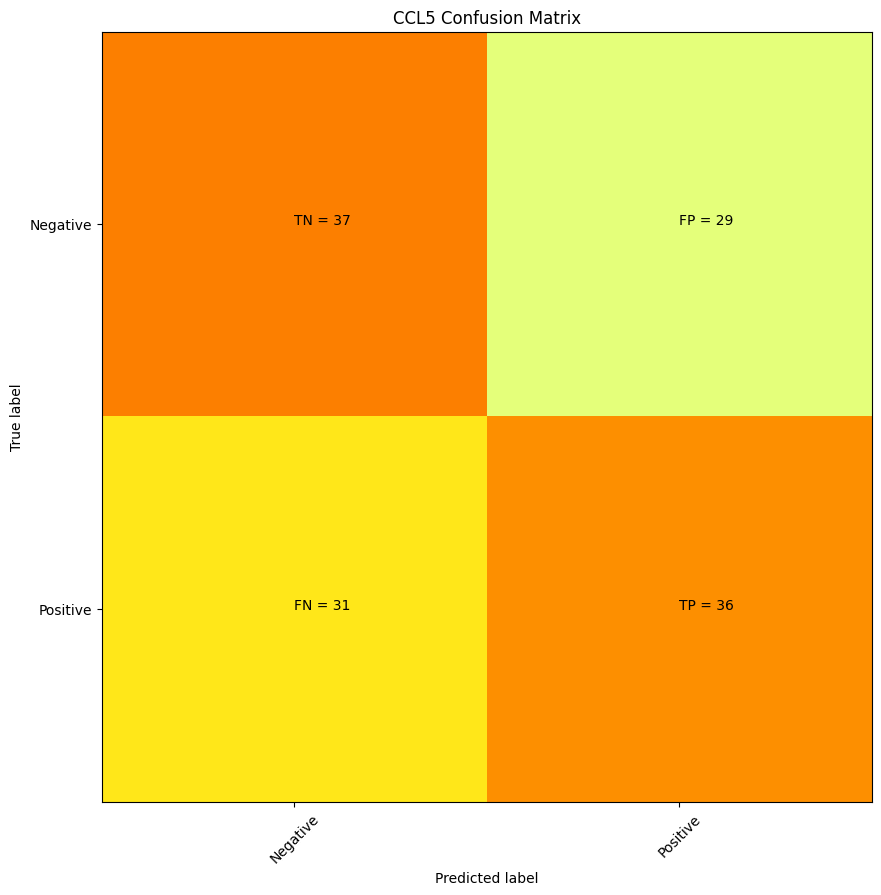

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

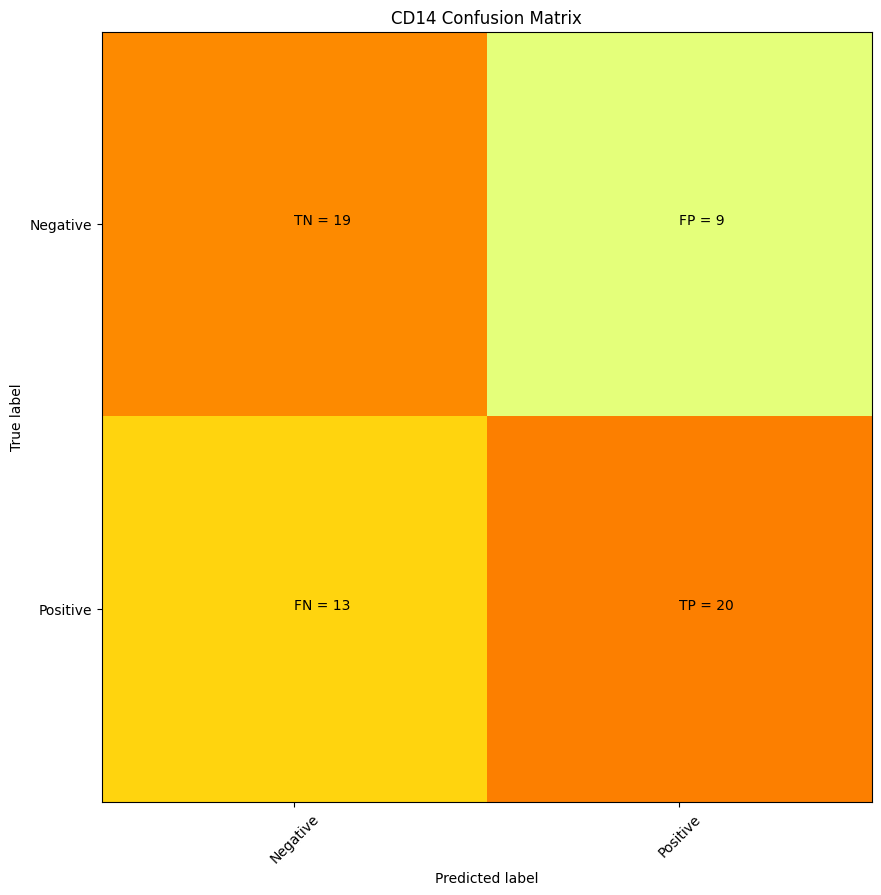

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
D17      0
I18      0
E24      0
N12      0
K03      0
I01      0
J12      0
O02      0
G21      0
H23      0
L17      0
L06      0
N15      0
M12      0
J19      0
J22      0
I15      0
C20      0
P19      0
B17      0
J01      0
C13      0
I02      0
H21      0
I08      0
A18      0
A17      0
H04      0

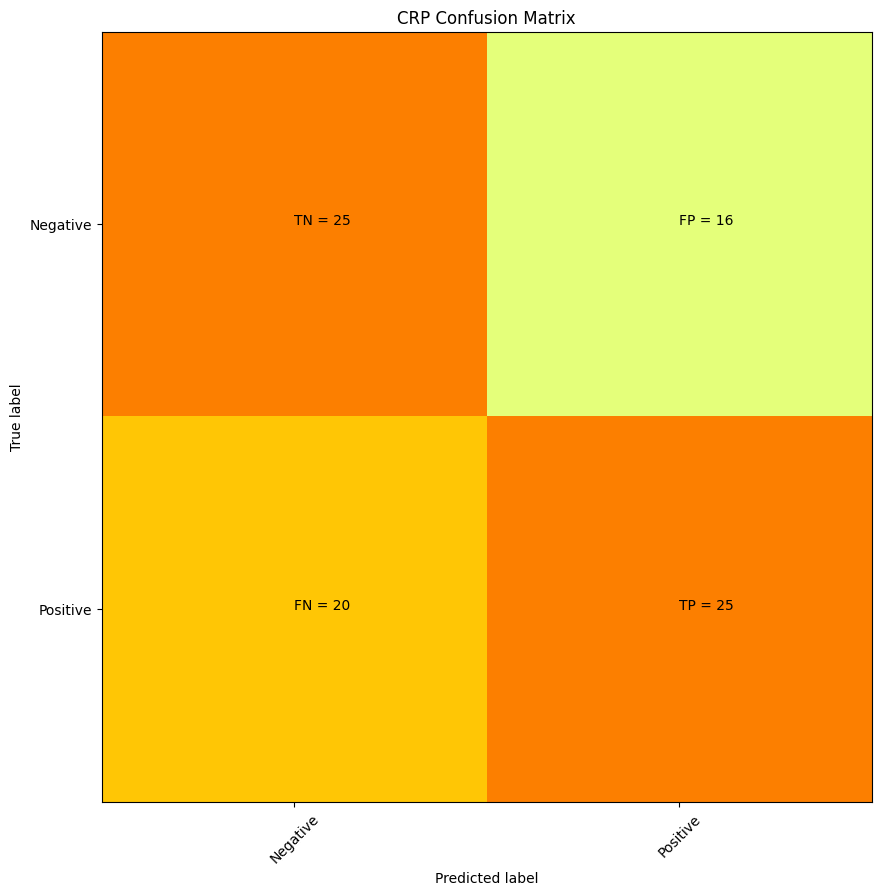

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
H16     0
O20     0
D01     0
N07     0
N21     0
P01     0
A12     0
A06     0
H01     0
M10     0
G22     0
G07     0


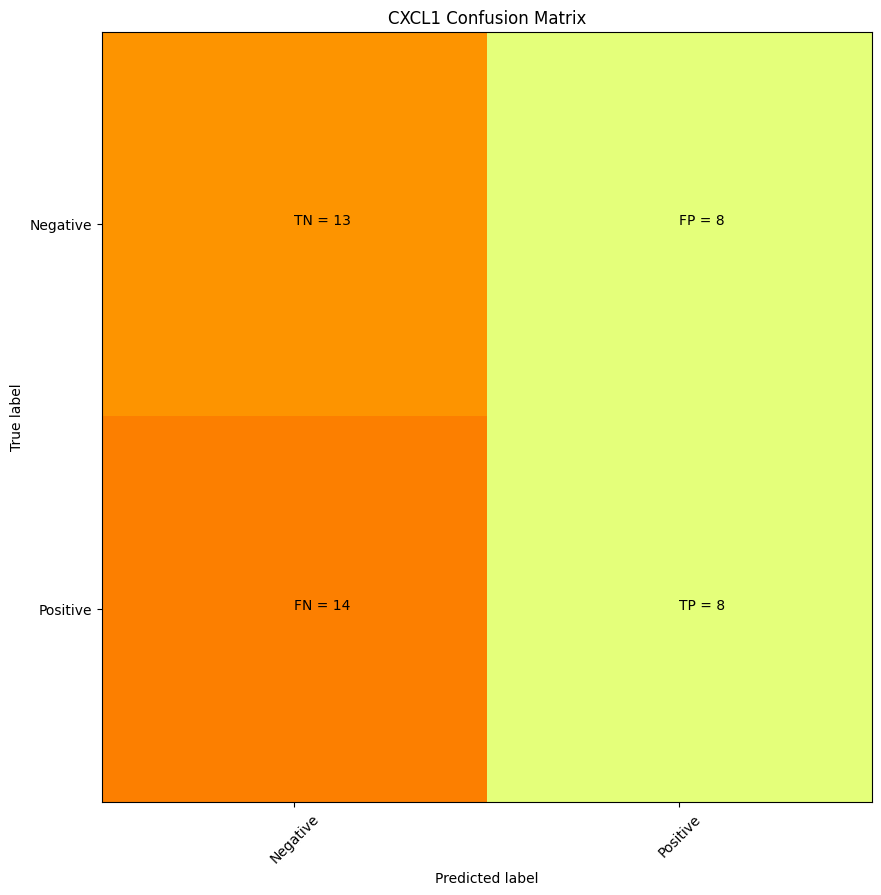

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
L24       0
C24       0
A13       0
D01       0
M16       0
G13       0
L15       0
B08       0
L09       0
A01       0
K23       0
K24       0
A10       0
M21       0
K20       0
K14       0
K21       0
A07       0
D04       0
N06       0
A17       0
M20       0
I22       0
M13       0
O20       0
I12       0
N04       0
G23       0
F21       0
B18       0
D18       0
A08       0
I24       0
C03       0
P14       0
G10       0
E21       0
N24       0
M03 

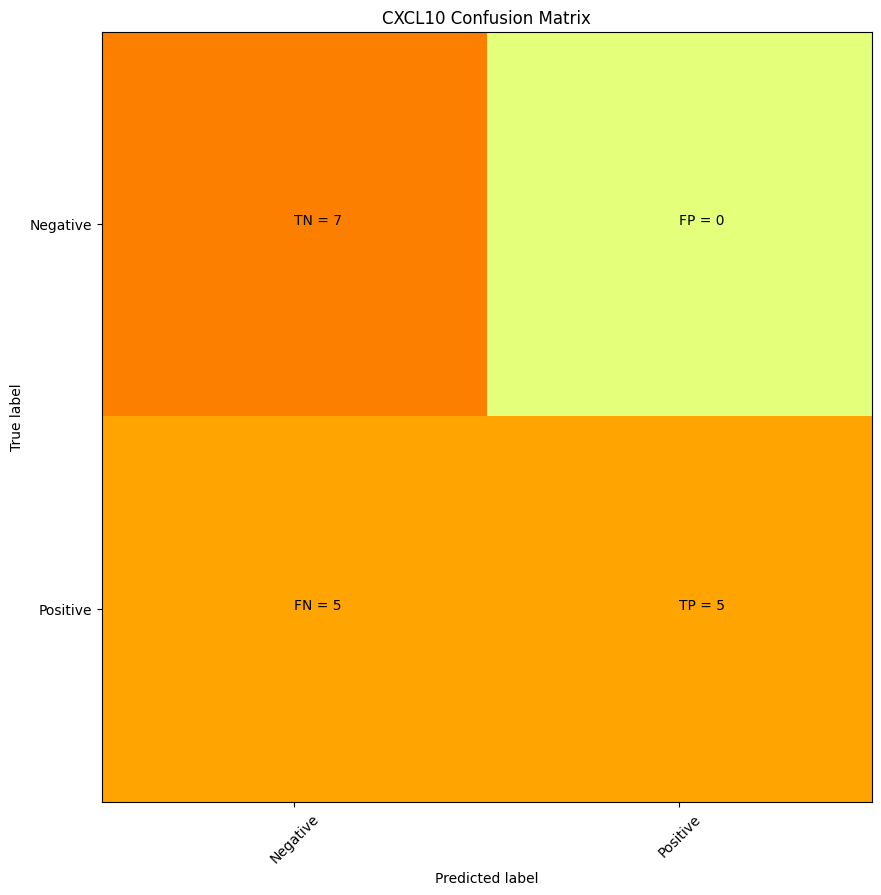

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
N16        0
C22        0
C11        0
J01        0
J07        0
G24        0
P03        0
F03        0
C14        0
E16        0
J04        0
D09        0
F07        0
G10        0
B12        0
A22        0
O20        0 precision = 1.0 recall = 0.5


/var/folders/k1/wc_llb5n4254050g8phxtwnw0000gn/T/ipykernel_19365/3358743061.py:5: RuntimeWarning: invalid value encountered in long_scalars
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos


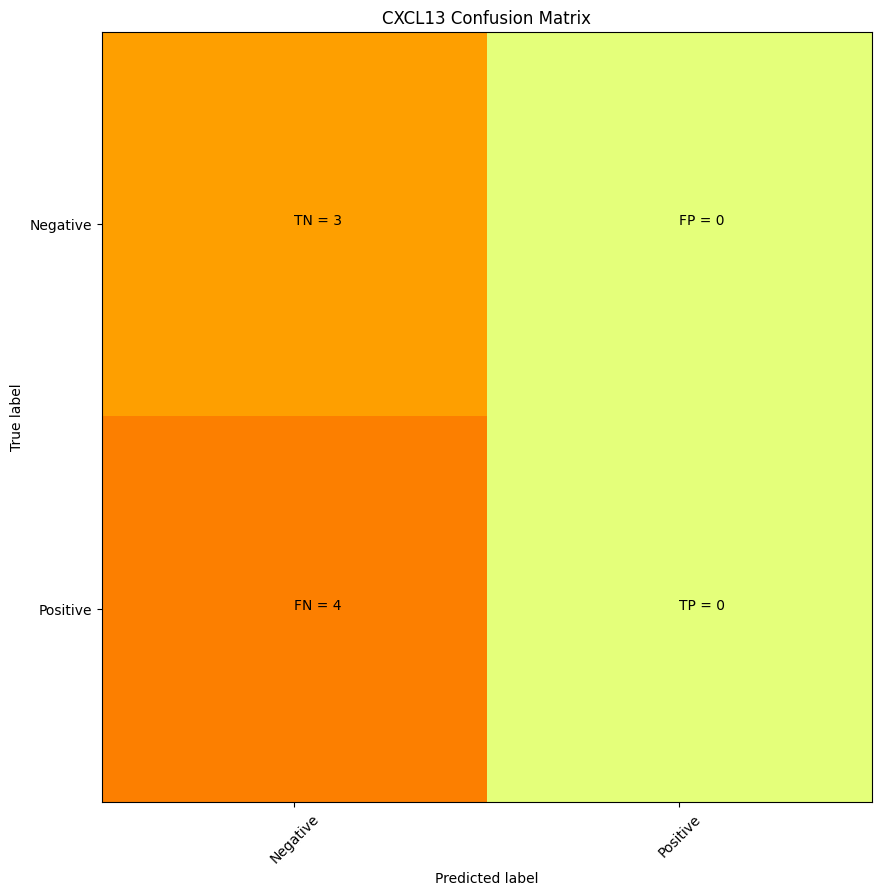

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
H09        0
E20        0
N19        0
N18        0
A01        0
C15        0
J22        0 precision = nan recall = 0.0


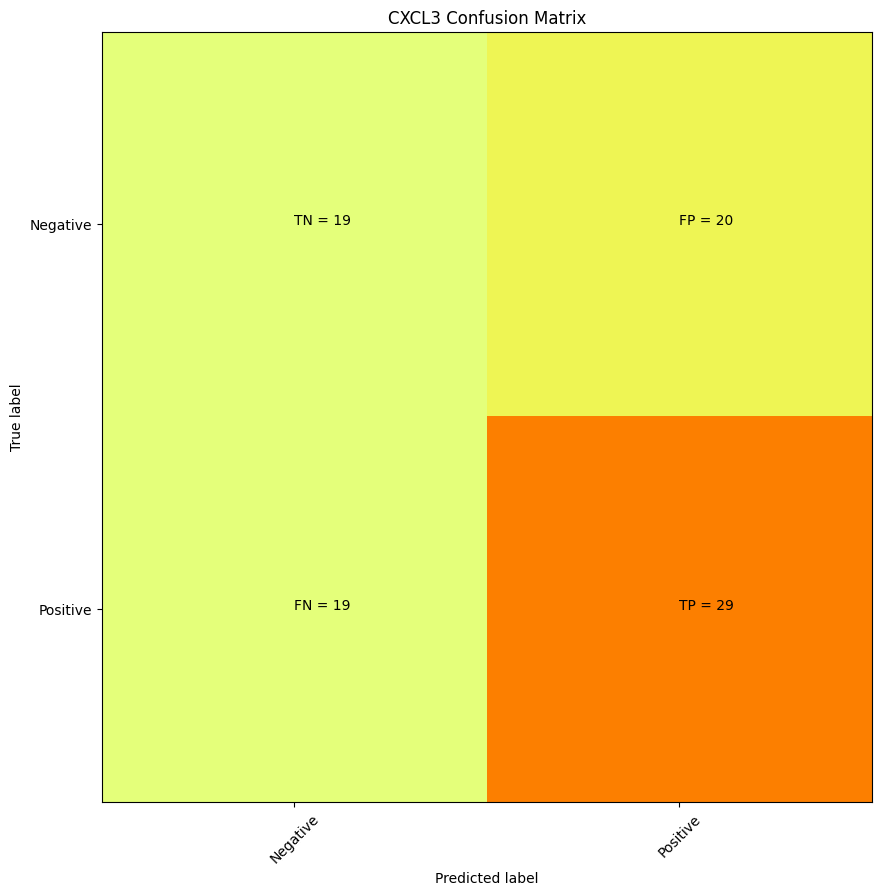

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

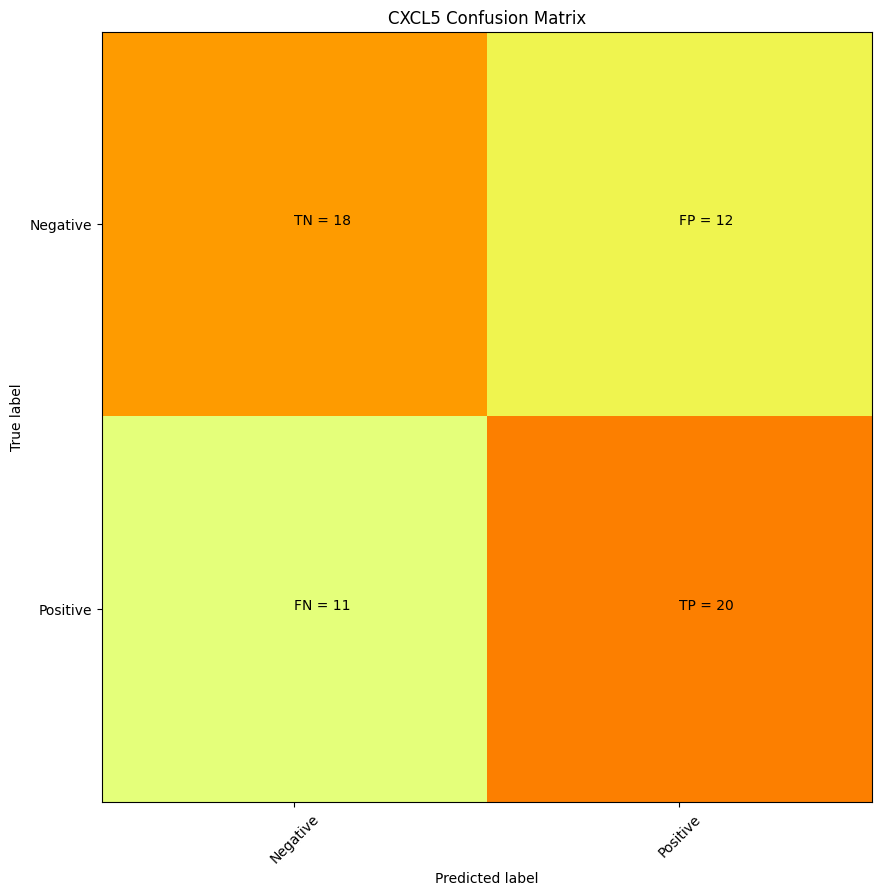

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H17       0
N19       0
D10       0
H10       0
B05       0
J20       0
H09       0
K12       0
N18       0
O06       0
K06       0
K08       0
E14       0
P14       0
K05       0
C21       0
B01       0
J15       0
B06       0
D21       0
C13 

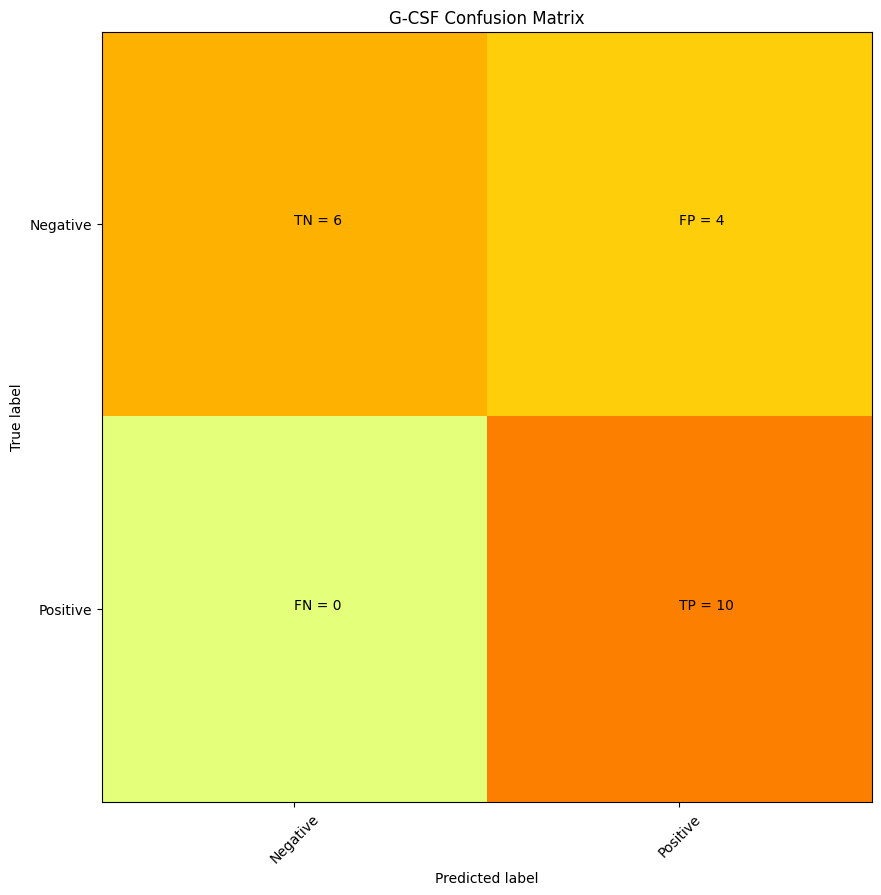

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
N22       0
G23       0
H05       0
L05       0
P14       0
L14       0
J16       0
L22       0
H18       0
N24       0
C03       0
N15       0
A21       0
O06       0
I13       0
P19       0
O21       0
C12       0
G03       0
I15       0 precision = 0.7142857142857143 recall = 1.0


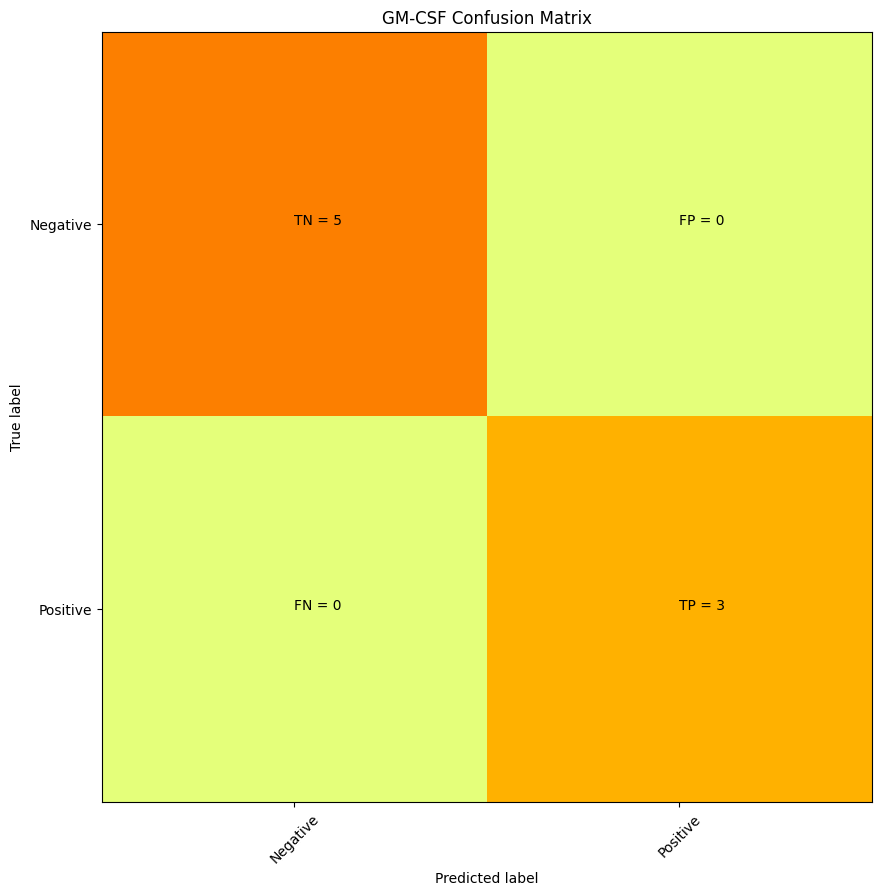

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
F12        0
J03        0
A23        0
O04        0
P17        0
I16        0
B10        0
K16        0 precision = 1.0 recall = 1.0


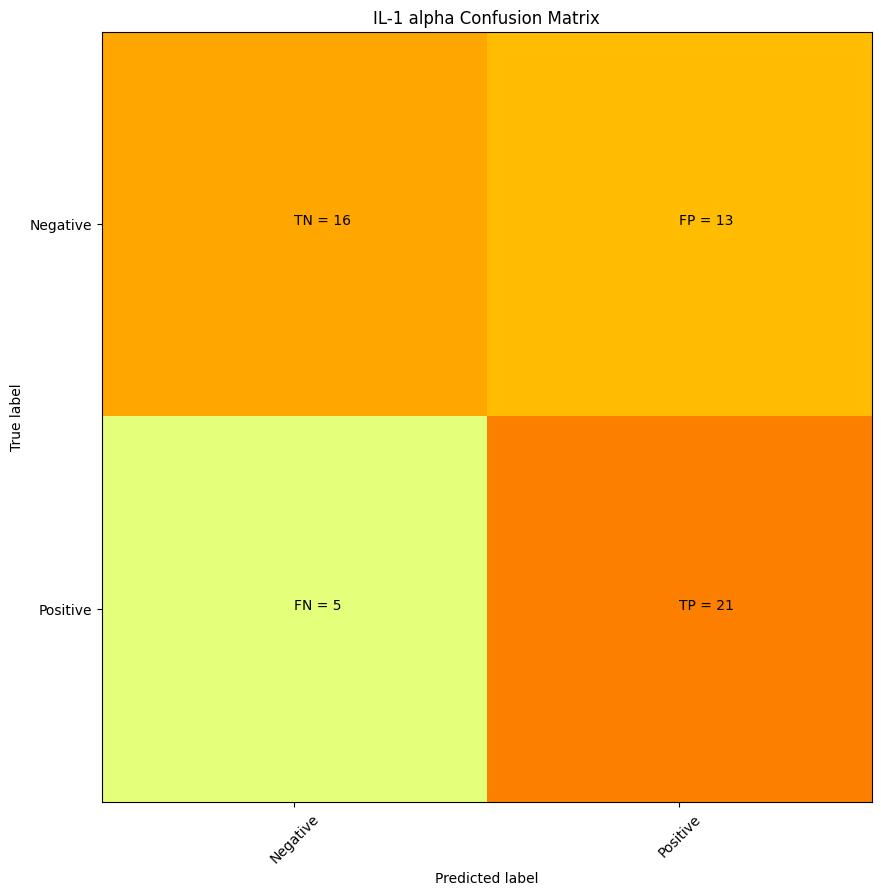

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
I02            0
F09           

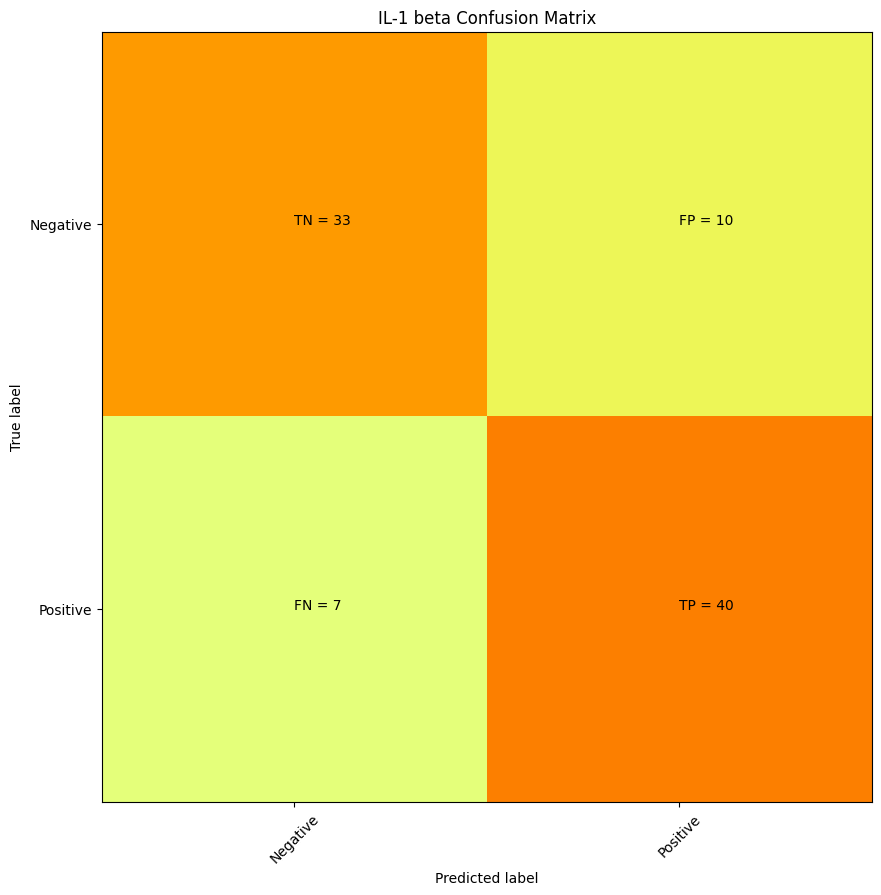

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

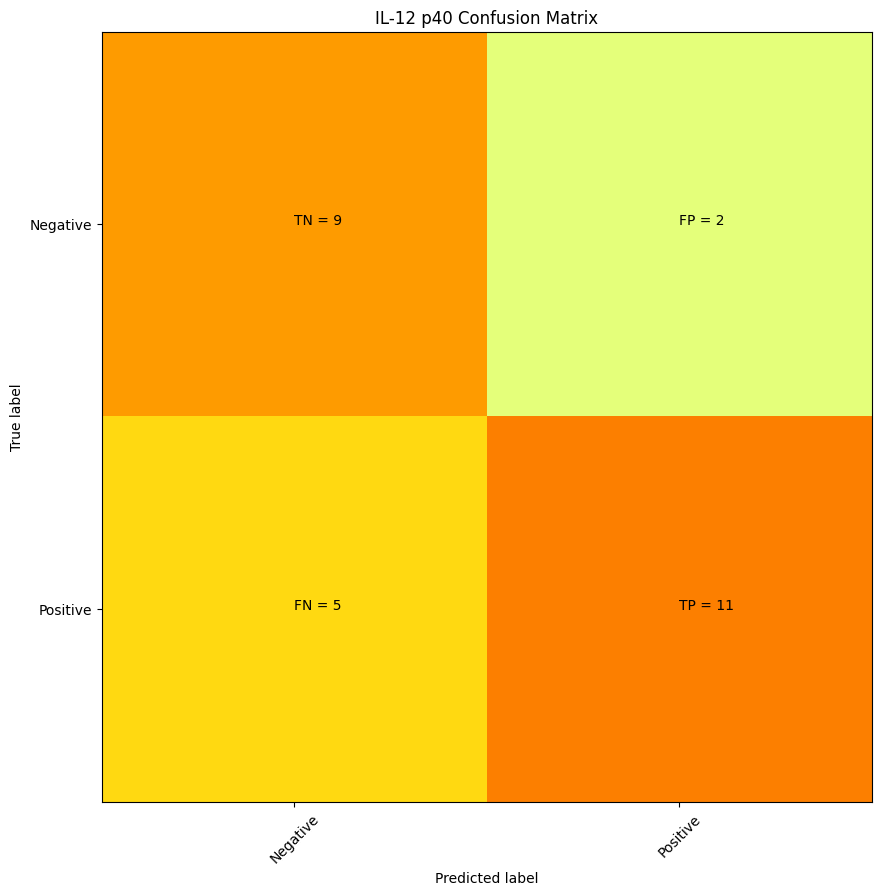

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
D15           0
F05           0
N15           0
D21           0
F03           0
J06           0
K14           0
L04           0
B04           0
J08           0
B09           0
E04           0
A09           0
M11           0
M17           0
H02           0
G24           0
J02           0
B03           0
O01           0
H09           0
J19           0
J16           0
M13           0
H01           0
I21           0
B02           0 precision = 0.8461538461538461 recall = 0.6875


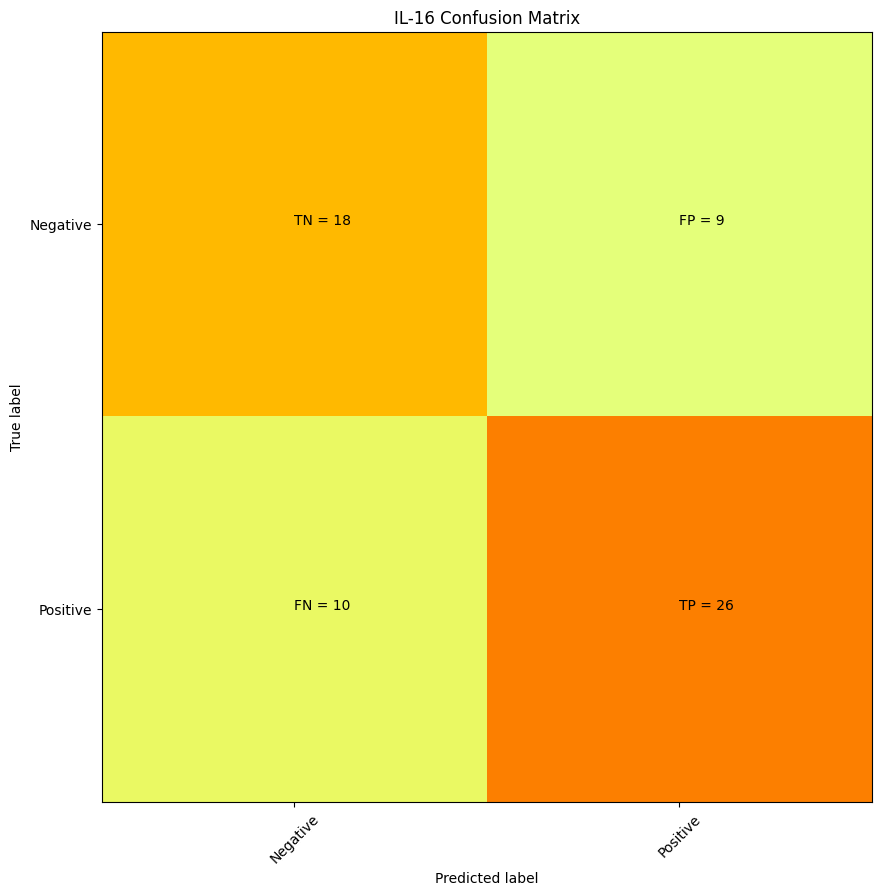

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
P19       0
B15       0
C05       0
B10       0
N01       0
E19       0
E05       0
J17       0
E06       0
K04       0
I03       0
F22       0
P01       0
A07       0
D19       0
N10       0
B05       0
I01       0
H21 

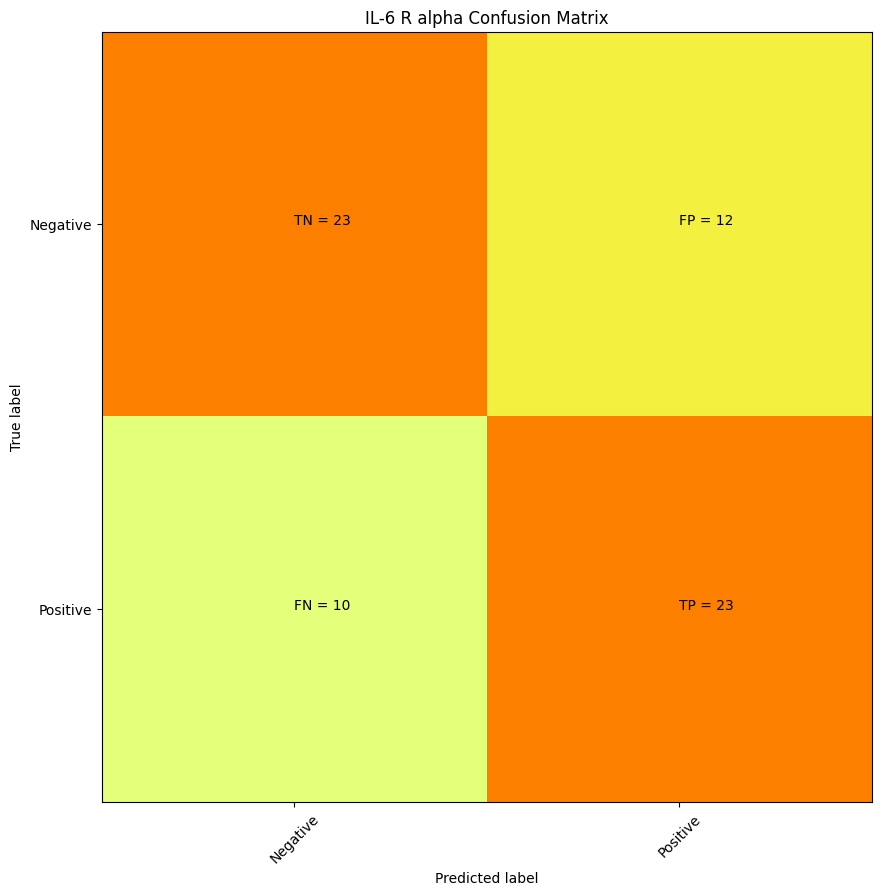

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

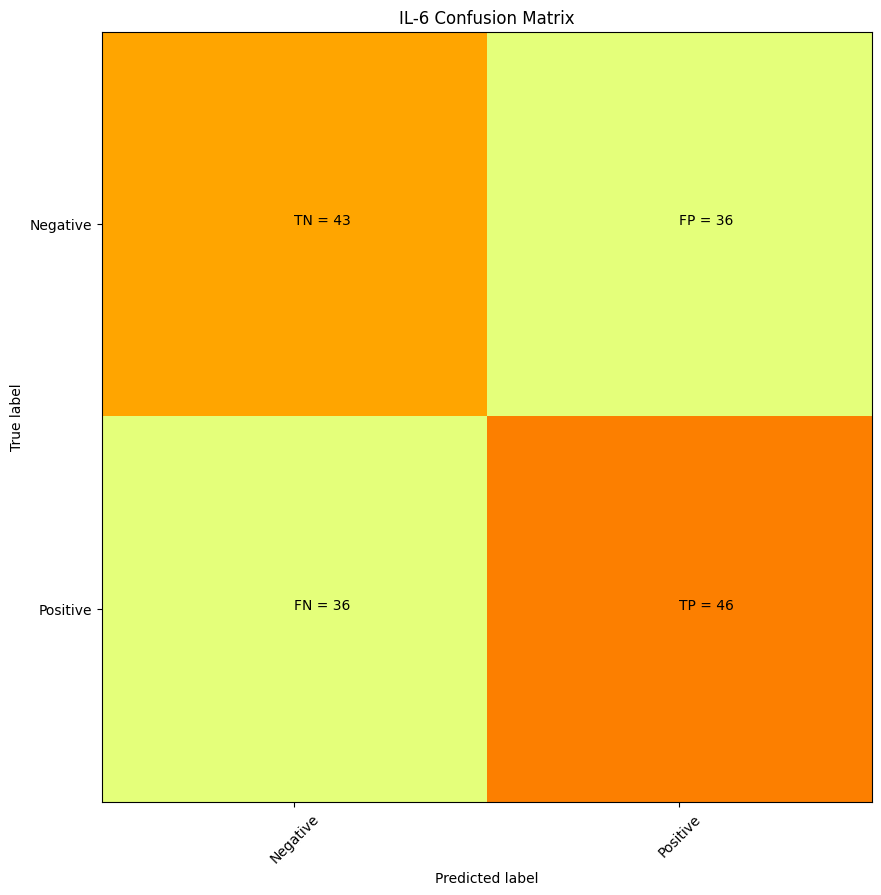

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

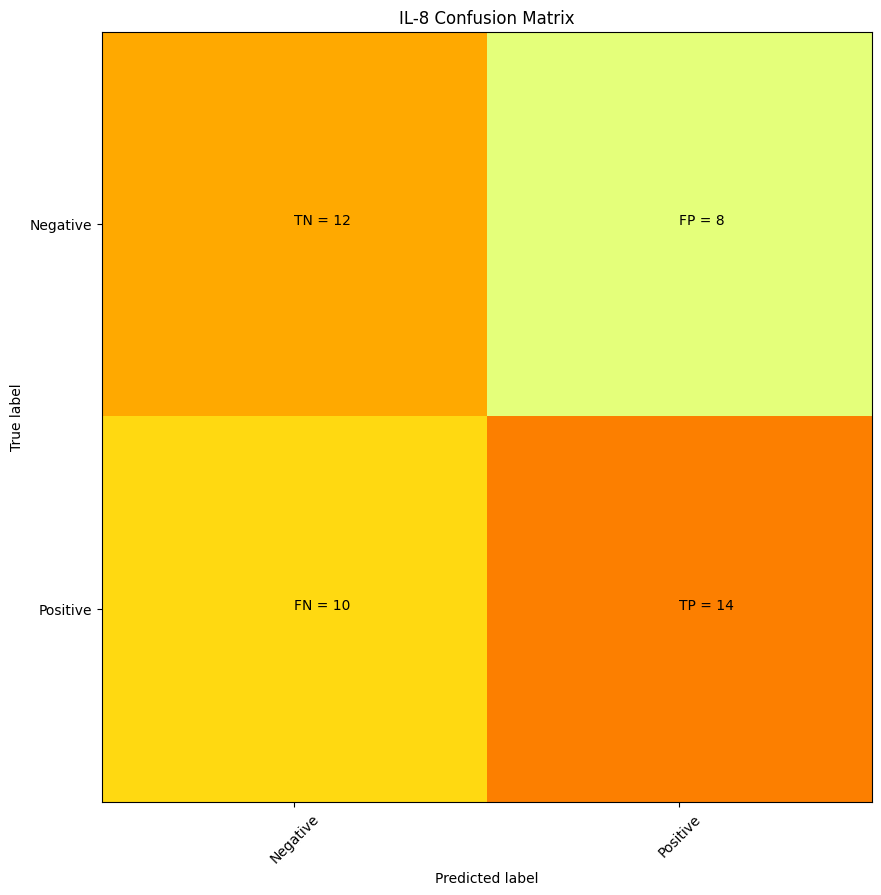

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
N17      0
N16      0
G17      0
A12      0
E09      0
J22      0
N14      0
M14      0
A06      0
D14      0
M07      0
C12      0
O24      0
J20      0
G15      0
L10      0
C02      0
N05      0
C22      0
J15      0
D09      0
I16      0
P10      0
C07      0
F02      0
E08      0
F20      0
D01      0
F09      0
L03      0
F16      0
P09      0
O06      0
B06      0
N09      0
M06      0
P12      0
B04      0
E20      0
J13      0
C20      0
M18      0
I02      0
I12      0 precision 

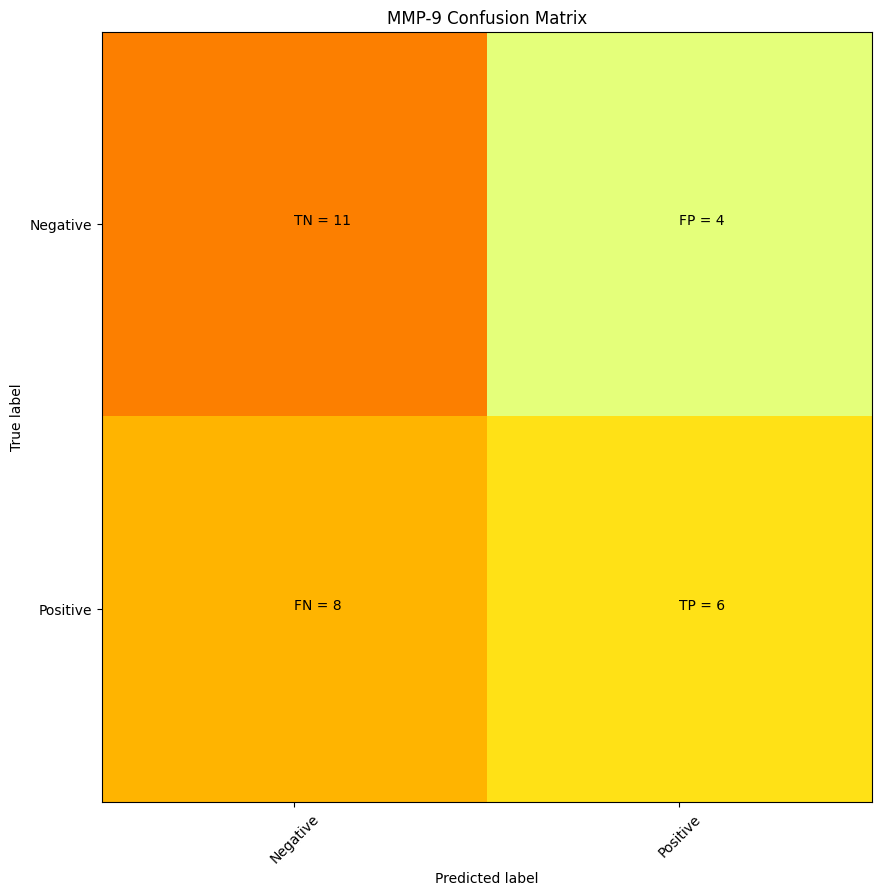

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
C16       0
G21       0
A11       0
G04       0
C15       0
B09       0
J03       0
M22       0
E08       0
O02       0
L05       0
I10       0
B15       0
L16       0
P22       0
H19       0
O03       0
K04       0
C08       0
B13       0
A16       0
C18       0
N23       0
I13       0
P02       0
L15       0
N21       0
K21       0
I17       0 precision = 0.6 recall = 0.42857142857142855


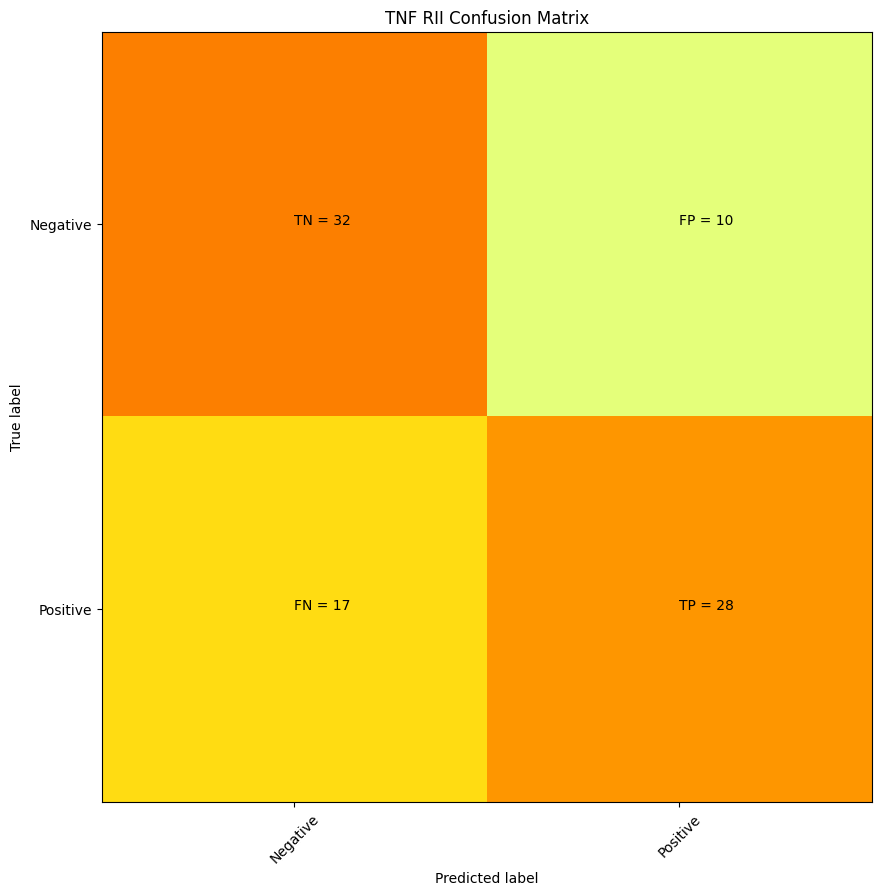

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [92]:
summarizing = []
summarizer_seqtree = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in seqtree_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_seqtree = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_seqtree['Precision'] = summarizer_seqtree['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [93]:
summarizer_seqtree

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.620690,0.782609,10,47
1,CCL1,0.714286,0.681818,10,46
2,CCL19,0.272727,1.000000,9,12
3,CCL2,0.607843,0.673913,9,95
4,CCL20,0.846154,0.733333,9,30
5,CCL22,0.485294,0.540984,9,125
6,CCL4,0.375000,0.666667,9,46
7,CCL5,0.553846,0.537313,9,133
8,CD14,0.689655,0.606061,9,61
9,CRP,0.609756,0.555556,9,86


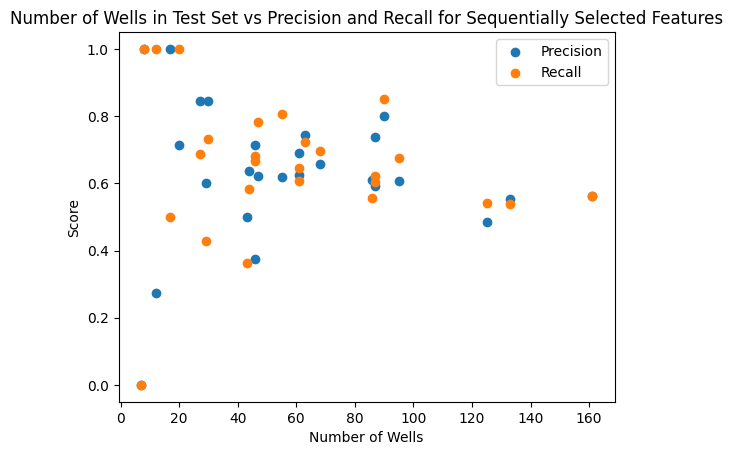

In [94]:
#Basically no trend, good news
plt.scatter(y=summarizer_seqtree["Precision"], x = summarizer_seqtree["Wells in Set"])
plt.scatter(y=summarizer_seqtree["Recall"], x = summarizer_seqtree["Wells in Set"])
plt.xlabel("Number of Wells")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for Sequentially Selected Features")
plt.show()

## And finally, XGBoost performance with PCA features

In [95]:
PCAs

[    Activin A          0         1         2         3         4         5   
 0           1   0.605061 -1.380590 -1.500579 -0.756760  0.643142  1.024379  \
 1           1   0.044070 -0.961719 -0.620042 -0.408497 -0.351668 -0.564320   
 2           1  -0.851165 -0.569248 -0.479116  0.537653  0.005798 -0.929320   
 3           1  -0.892781  1.763444 -0.469450  0.319826 -0.432617 -0.305631   
 4           1  -0.191496 -1.116794 -0.235409 -0.040099 -0.341521 -1.104621   
 5           1   0.385072 -0.886863 -0.282809 -0.392749  0.034100 -0.373949   
 6           1  -0.374612 -1.344822 -1.776357 -0.329505  0.110263 -0.248602   
 7           1   0.707700 -1.561838  1.006731  0.210809  0.516821 -0.609177   
 8           1   0.784080 -1.639567 -0.341590 -0.415925  0.266659  0.164214   
 9           1  -0.321626 -1.136706 -0.544519 -0.040456 -0.237191 -0.687530   
 10          1  -0.564278  1.107382  0.264036 -1.521571 -0.048874  0.635072   
 11          1   0.346253 -1.485686 -1.315548  0.429

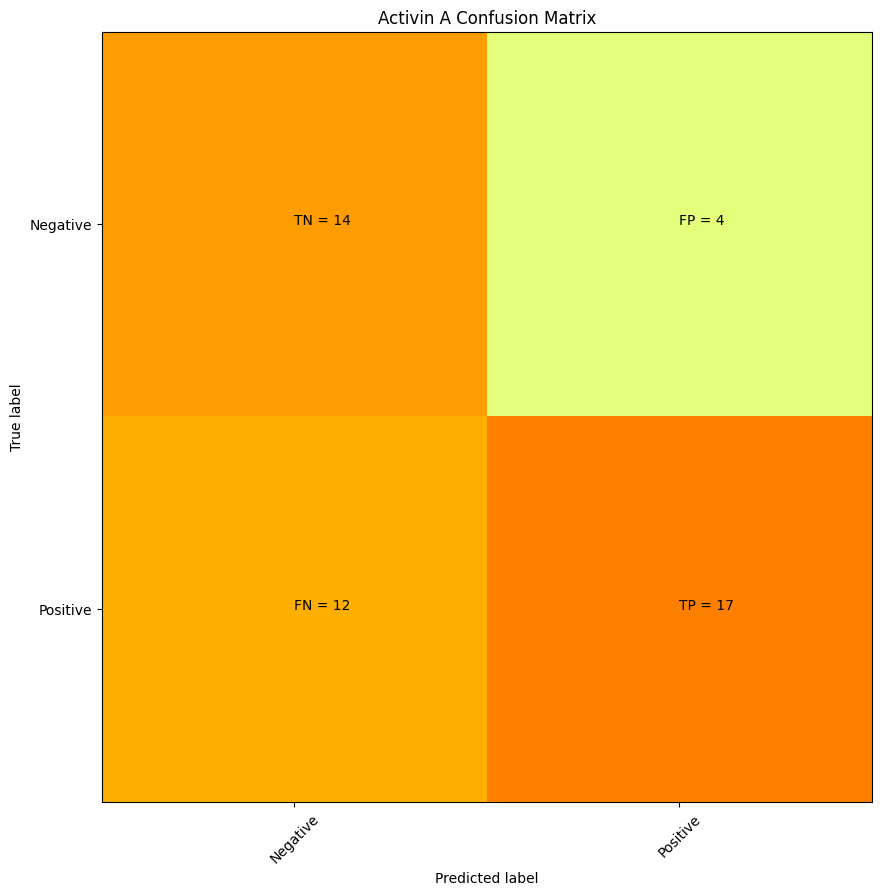

    Activin A
0           1
1           1
2           1
3           1
4           1
5           1
6           1
7           1
8           1
9           1
10          1
11          1
12          1
13          1
14          1
15          1
16          1
17          1
18          1
19          1
20          1
21          1
22          1
23          1
24          1
25          1
26          1
27          1
28          1
29          1
30          1
31          1
32          1
33          1
34          1
35          1
36          1
37          1
38          1
39          1
40          1
41          1
42          1
43          1
44          1
45          1
46          1
47          0
48          0
49          0
50          0
51          0
52          0
53          0
54          0
55          0
56          0
57          0
58          0
59          0
60          0
61          0
62          0
63          0
64          0
65          0
66          0
67          0
68          0
69          0
70    

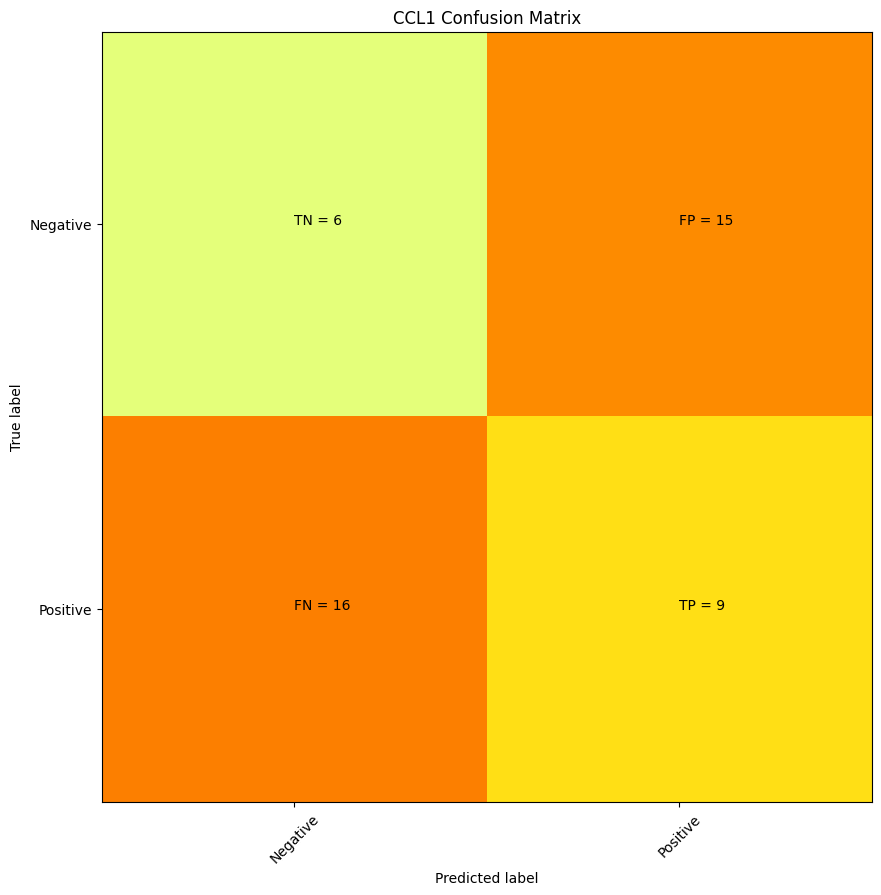

    CCL1
0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     1
38     1
39     1
40     1
41     1
42     1
43     1
44     1
45     1
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0
88     0
89     0
90     0
91     0 precision = 0.375 recall = 0.36


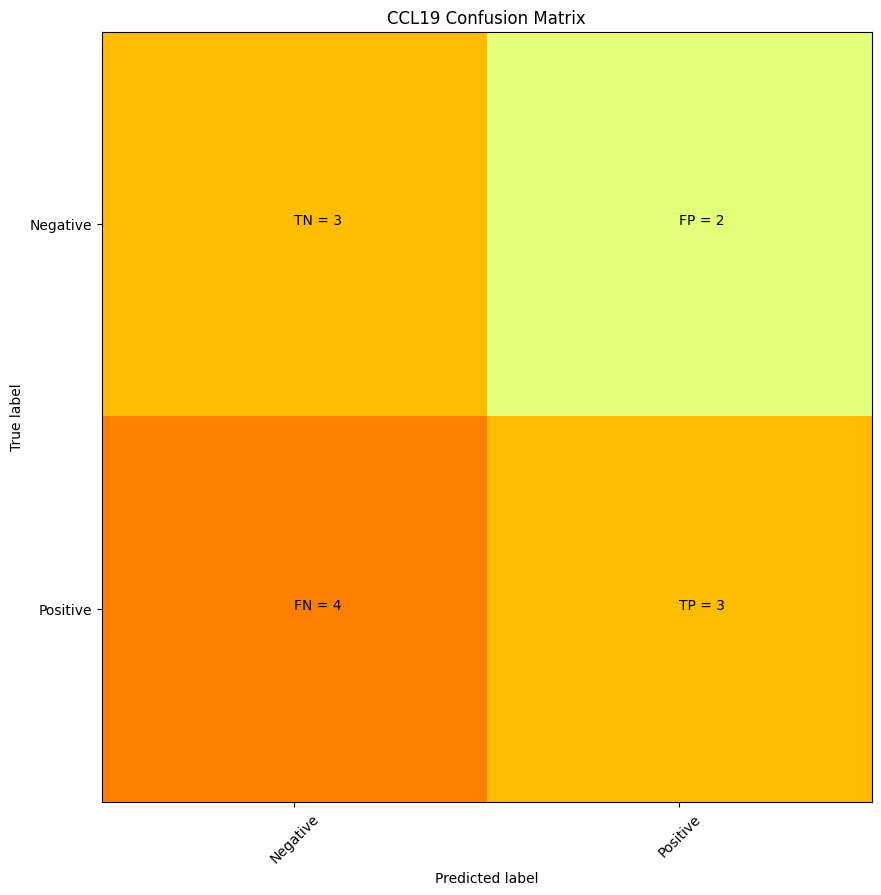

    CCL19
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0 precision = 0.6 recall = 0.42857142857142855


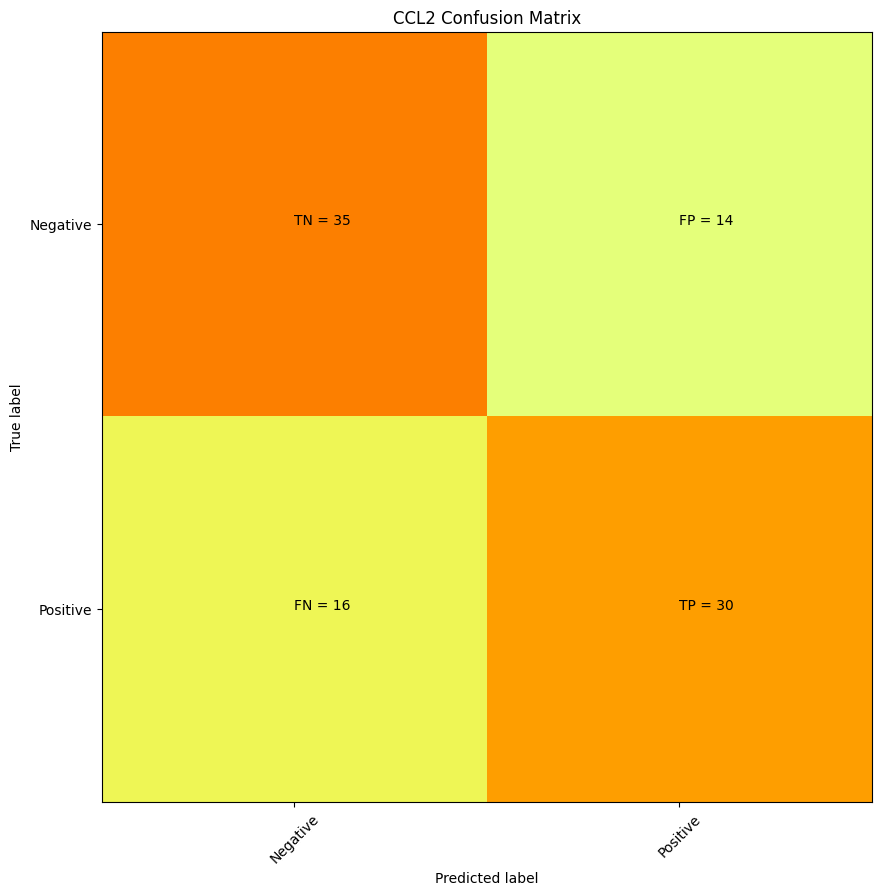

     CCL2
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      1
64      1
65      1
66      1
67      1
68      1
69      1
70      1
71      1
72      1
73      1
74      1
75      1
76      1
77      1
78      1
79      1
80      1
81      1
82      1
83      1
84      1
85      1
86      1
87      1
88      1
89      1
90      1
91      1
92      1
93      1
94      1
95      0
96      0
97      0
98      0


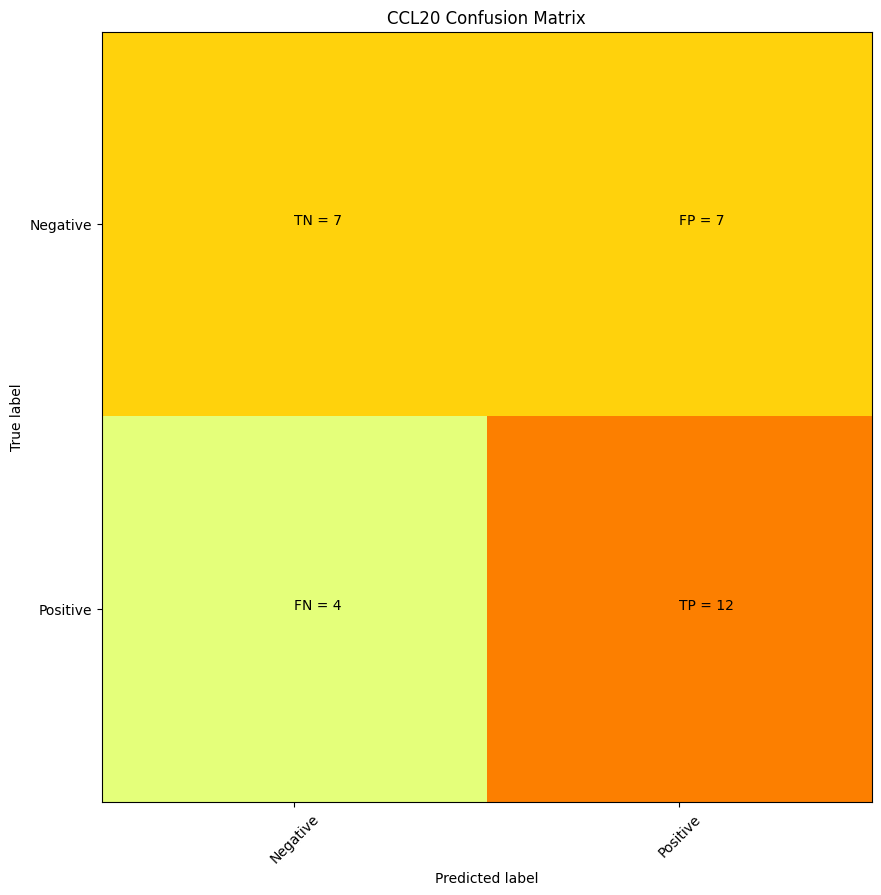

    CCL20
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0 precision = 0.631578947368421 recall = 0.75


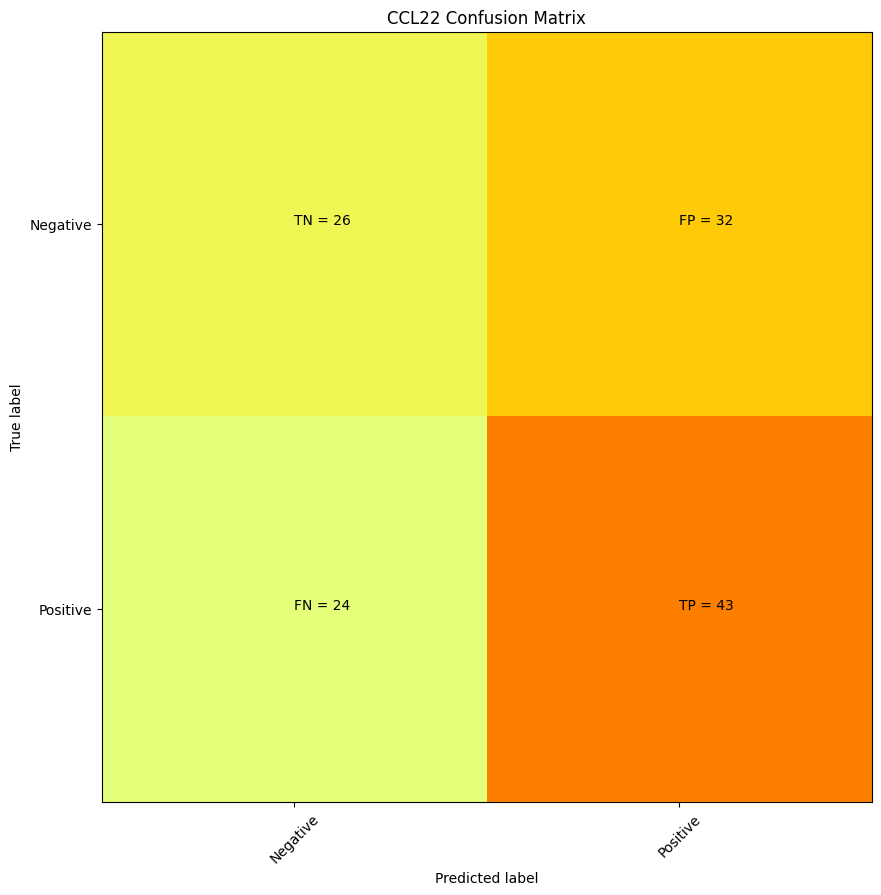

     CCL22
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
26       1
27       1
28       1
29       1
30       1
31       1
32       1
33       1
34       1
35       1
36       1
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       1
45       1
46       1
47       1
48       1
49       1
50       1
51       1
52       1
53       1
54       1
55       1
56       1
57       1
58       1
59       1
60       1
61       1
62       1
63       1
64       1
65       1
66       1
67       1
68       1
69       1
70       1
71       1
72       1
73       1
74       1
75       1
76       1
77       1
78       1
79       1
80       1
81       1
82       1
83       1
84       1
85       1
86       1
87       1
88       1
89       1

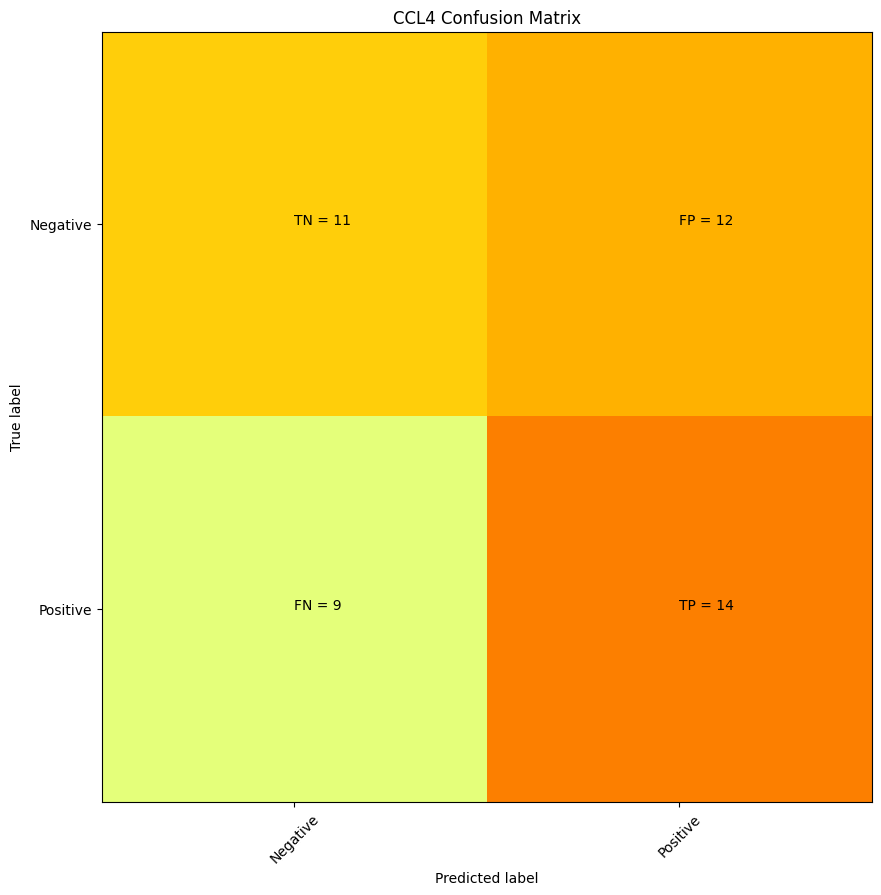

    CCL4
0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     1
38     1
39     1
40     1
41     1
42     1
43     1
44     1
45     1
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0
88     0
89     0
90     0
91     0 precision = 0.5384615384615384 recall = 0.6086956521739131


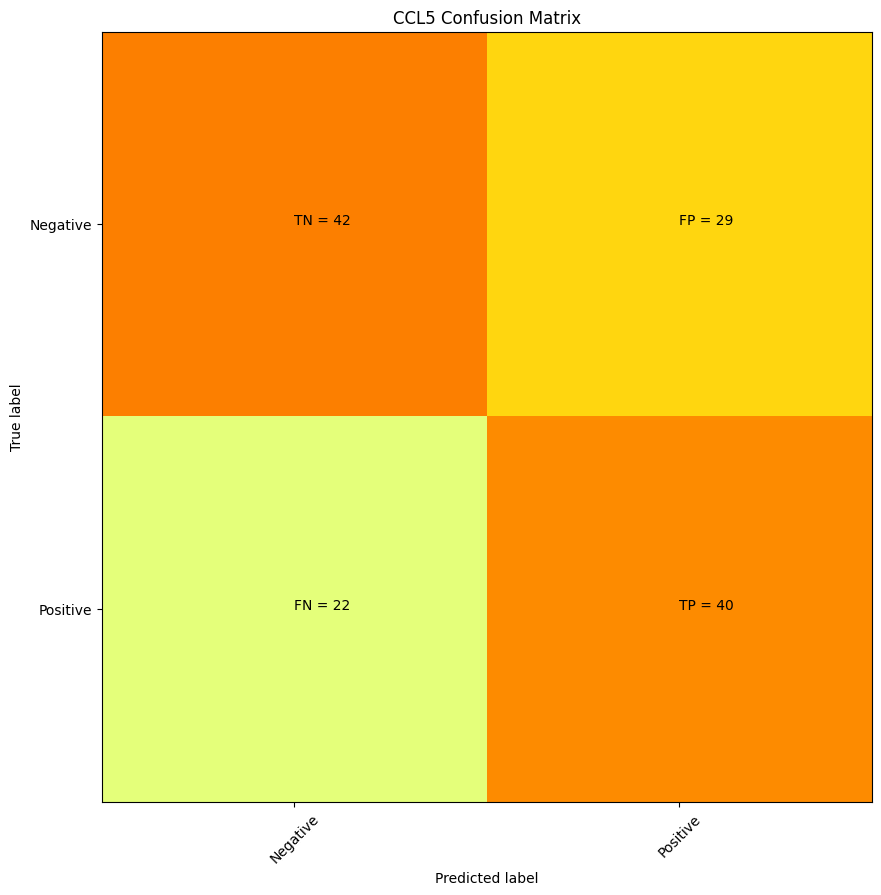

     CCL5
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      1
64      1
65      1
66      1
67      1
68      1
69      1
70      1
71      1
72      1
73      1
74      1
75      1
76      1
77      1
78      1
79      1
80      1
81      1
82      1
83      1
84      1
85      1
86      1
87      1
88      1
89      1
90      1
91      1
92      1
93      1
94      1
95      1
96      1
97      1
98      1


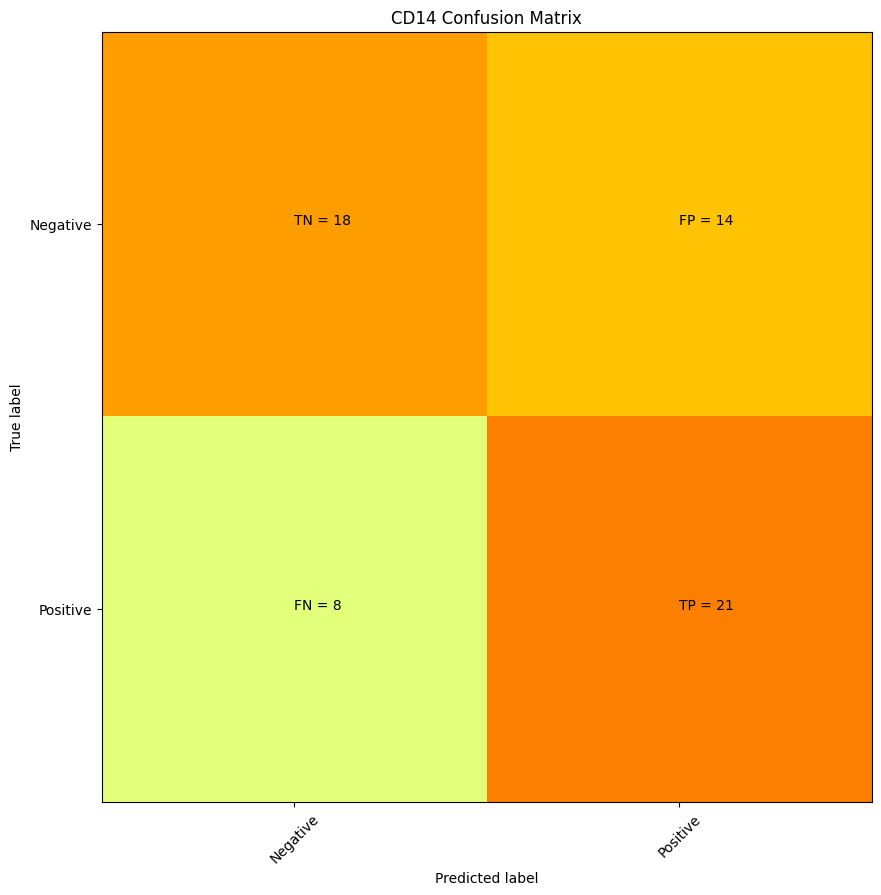

     CD14
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0


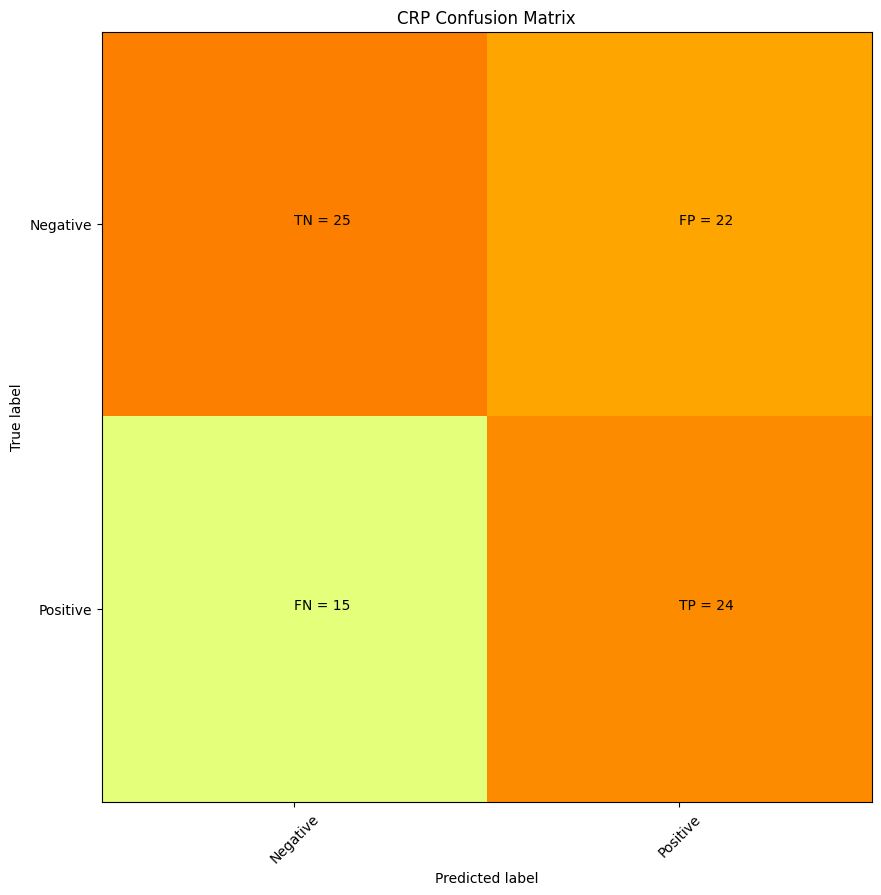

     CRP
0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     1
38     1
39     1
40     1
41     1
42     1
43     1
44     1
45     1
46     1
47     1
48     1
49     1
50     1
51     1
52     1
53     1
54     1
55     1
56     1
57     1
58     1
59     1
60     1
61     1
62     1
63     1
64     1
65     1
66     1
67     1
68     1
69     1
70     1
71     1
72     1
73     1
74     1
75     1
76     1
77     1
78     1
79     1
80     1
81     1
82     1
83     1
84     1
85     1
86     0
87     0
88     0
89     0
90     0
91     0
92     0
93     0
94     0
95     0
96     0
97     0
98     0
99     0
100    0
101    0
102    0
103    0
104    0
105    0
106    0
107    0
108    0
109    0
1

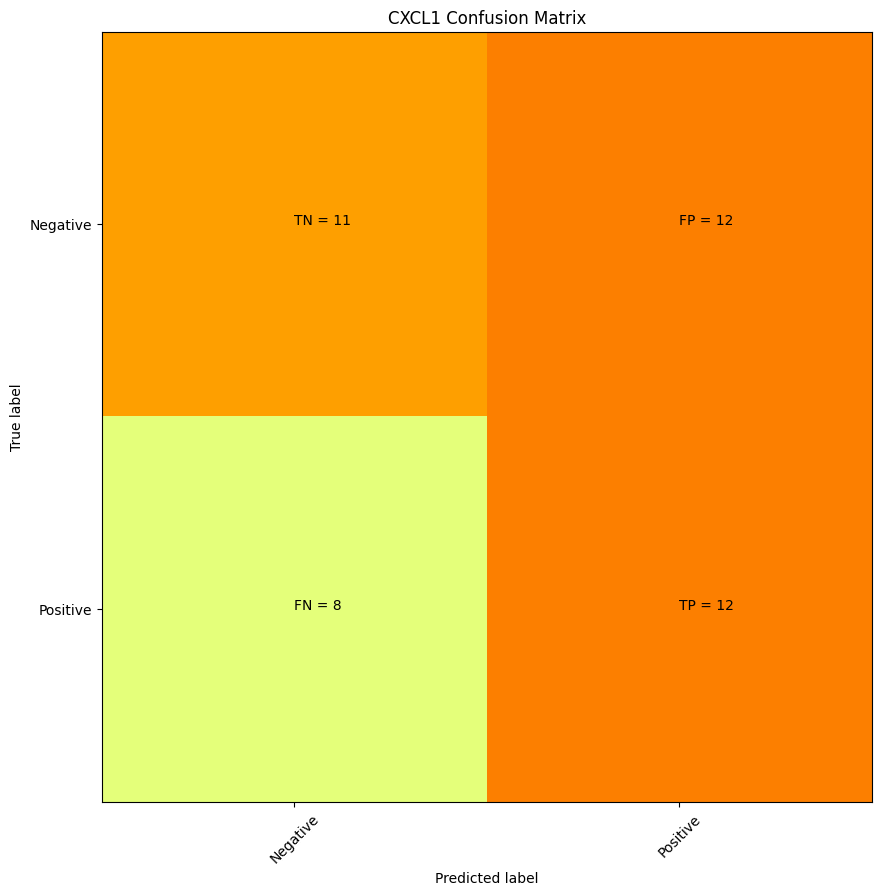

    CXCL1
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0 precision = 0.5 recall = 0.6


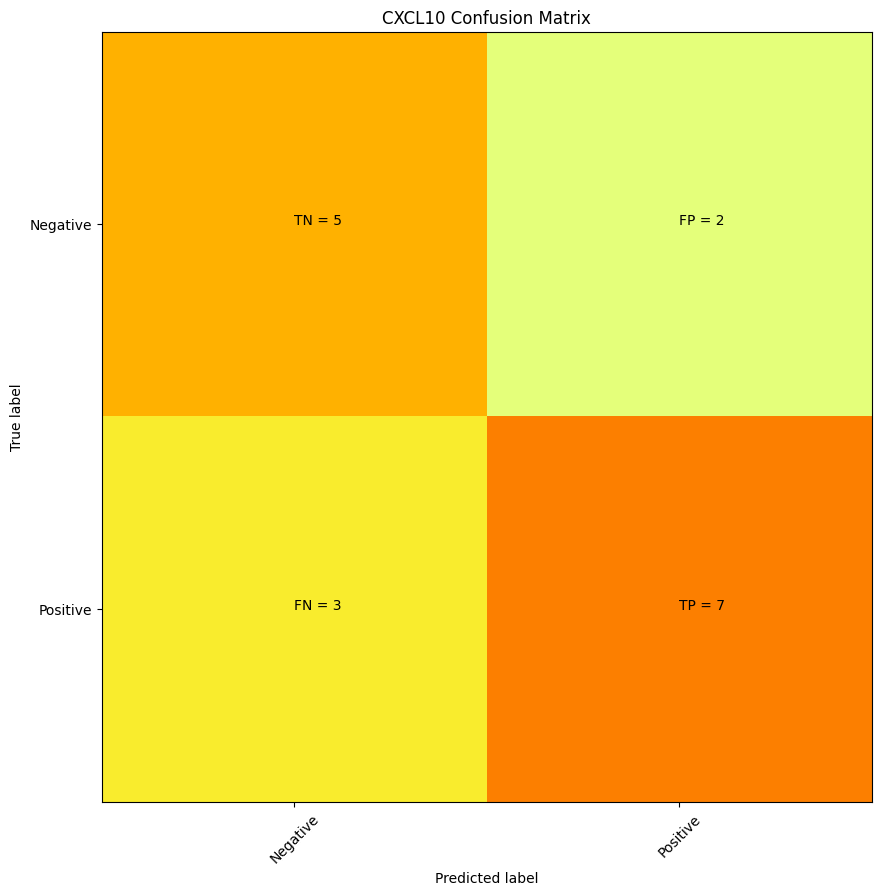

    CXCL10
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       0
29       0
30       0
31       0
32       0
33       0 precision = 0.7777777777777778 recall = 0.7


/var/folders/k1/wc_llb5n4254050g8phxtwnw0000gn/T/ipykernel_19365/3358743061.py:5: RuntimeWarning: invalid value encountered in long_scalars
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos


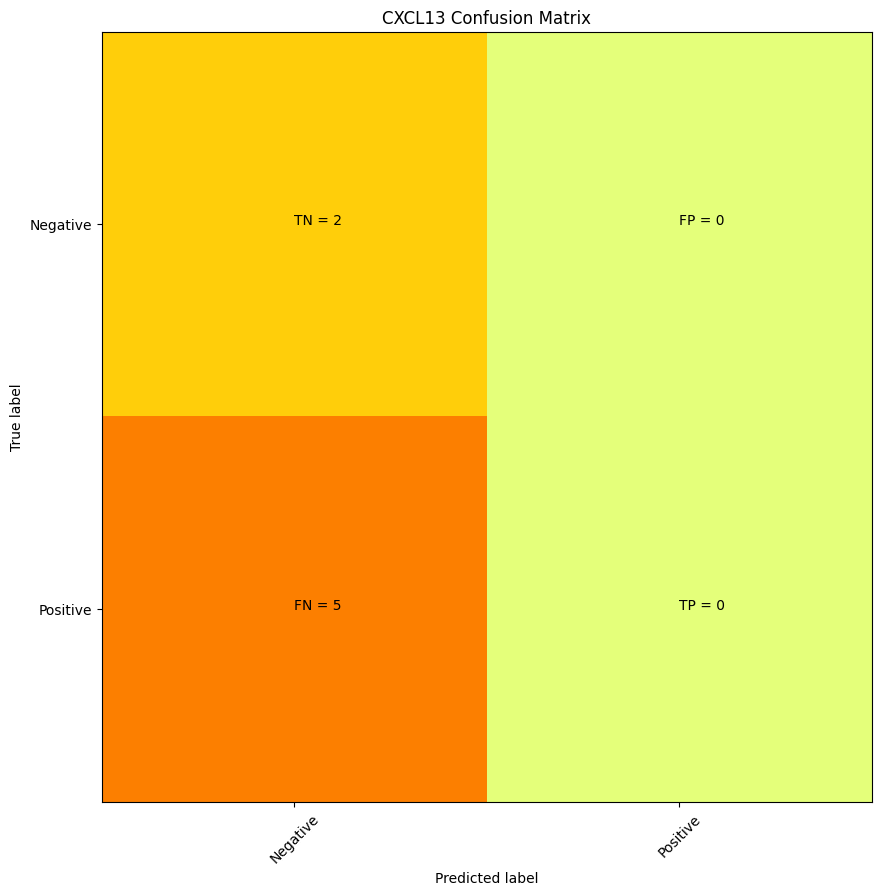

    CXCL13
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        0
8        0
9        0
10       0
11       0
12       0
13       0 precision = nan recall = 0.0


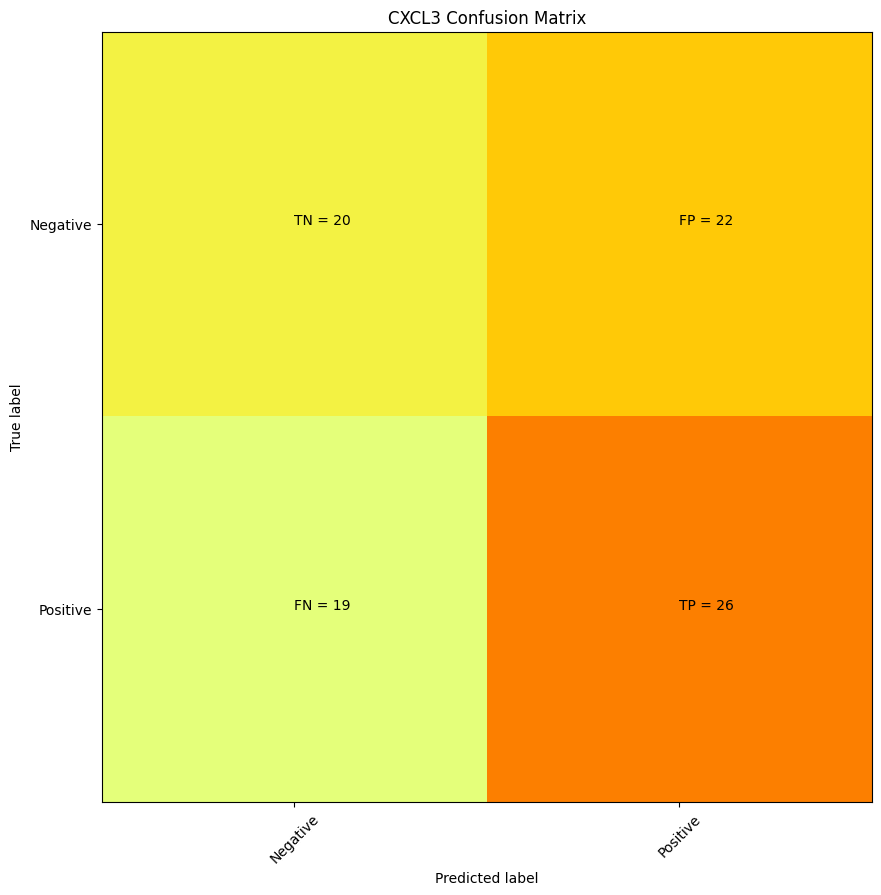

     CXCL3
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
26       1
27       1
28       1
29       1
30       1
31       1
32       1
33       1
34       1
35       1
36       1
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       1
45       1
46       1
47       1
48       1
49       1
50       1
51       1
52       1
53       1
54       1
55       1
56       1
57       1
58       1
59       1
60       1
61       1
62       1
63       1
64       1
65       1
66       1
67       1
68       1
69       1
70       1
71       1
72       1
73       1
74       1
75       1
76       1
77       1
78       1
79       1
80       1
81       1
82       1
83       1
84       1
85       1
86       1
87       0
88       0
89       0

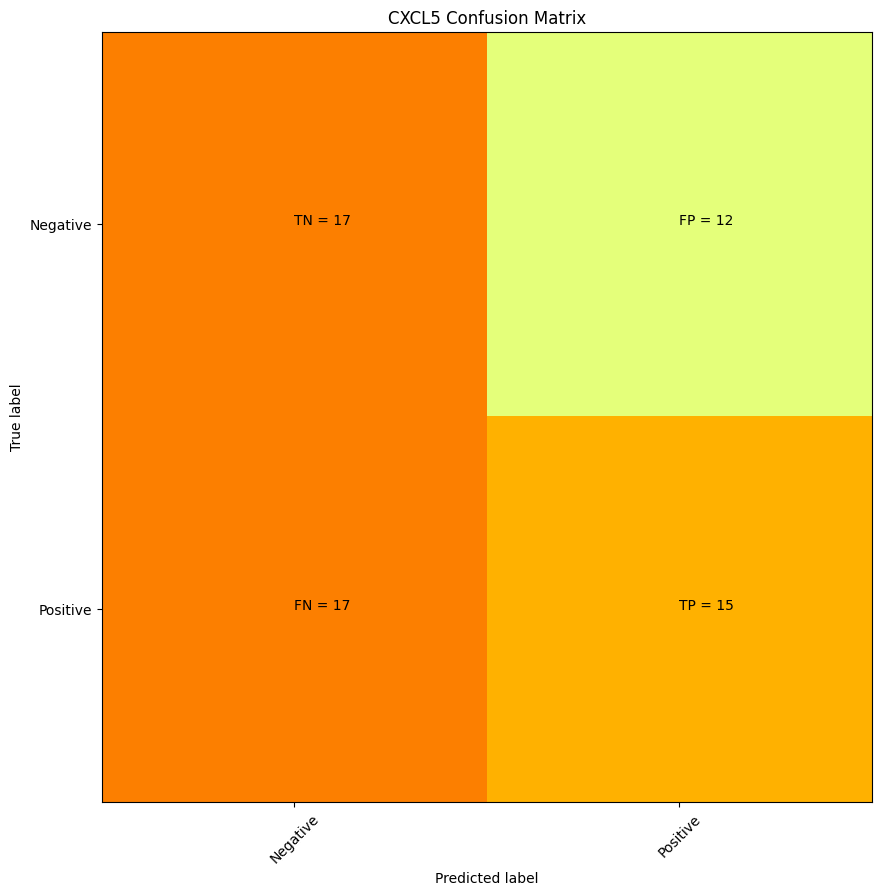

     CXCL5
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
26       1
27       1
28       1
29       1
30       1
31       1
32       1
33       1
34       1
35       1
36       1
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       1
45       1
46       1
47       1
48       1
49       1
50       1
51       1
52       1
53       1
54       1
55       1
56       1
57       1
58       1
59       1
60       1
61       0
62       0
63       0
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0

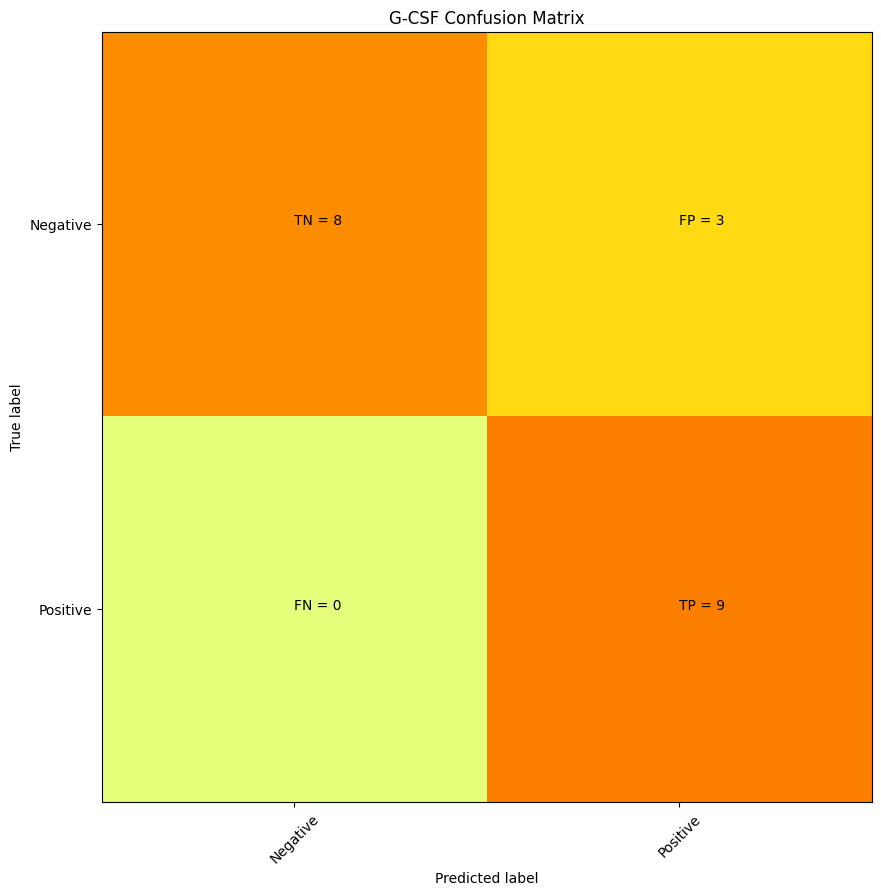

    G-CSF
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0 precision = 0.75 recall = 1.0


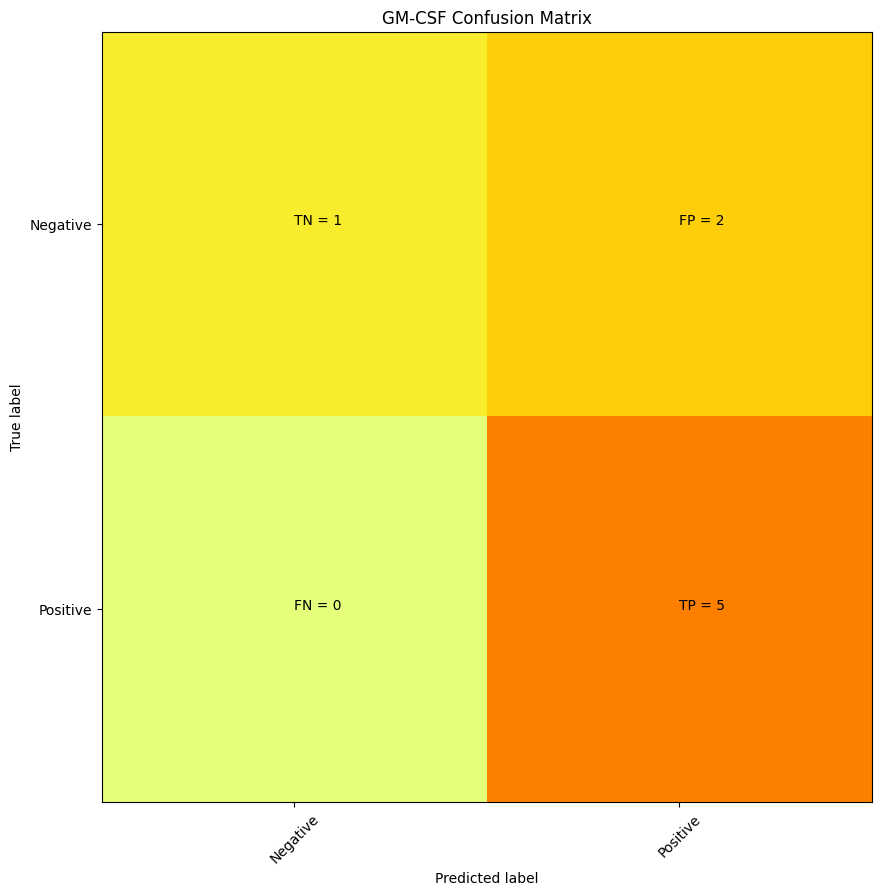

    GM-CSF
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0 precision = 0.7142857142857143 recall = 1.0


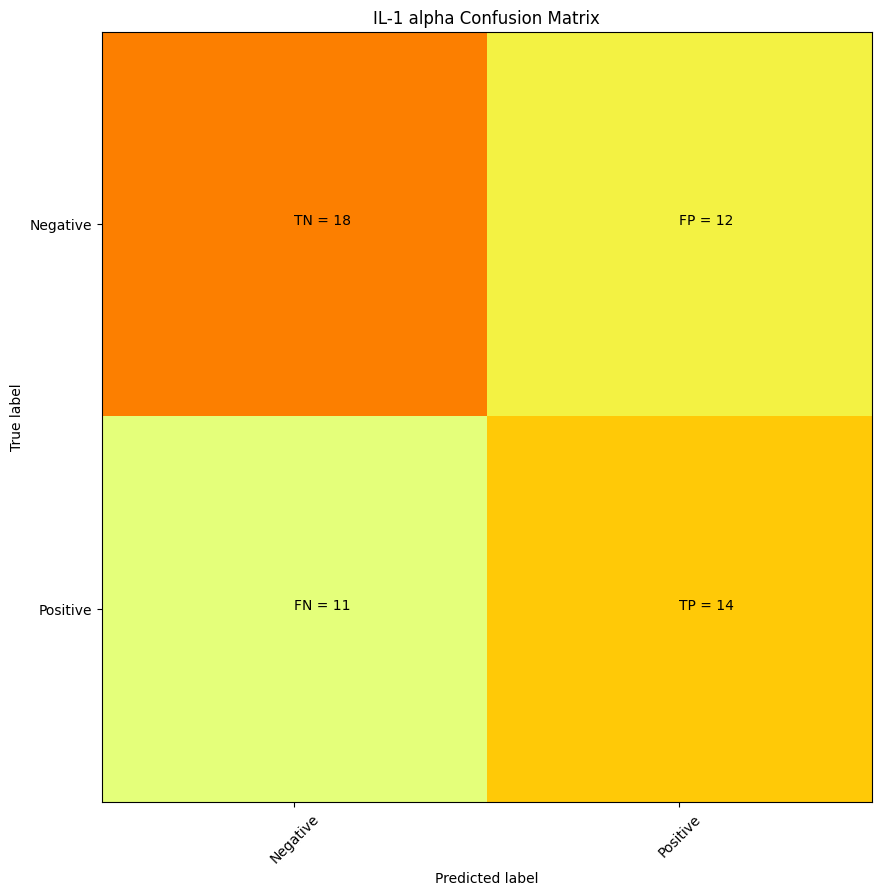

     IL-1 alpha
0             1
1             1
2             1
3             1
4             1
5             1
6             1
7             1
8             1
9             1
10            1
11            1
12            1
13            1
14            1
15            1
16            1
17            1
18            1
19            1
20            1
21            1
22            1
23            1
24            1
25            1
26            1
27            1
28            1
29            1
30            1
31            1
32            1
33            1
34            1
35            1
36            1
37            1
38            1
39            1
40            1
41            1
42            1
43            1
44            1
45            1
46            1
47            1
48            1
49            1
50            1
51            1
52            1
53            1
54            1
55            0
56            0
57            0
58            0
59            0
60            0
61      

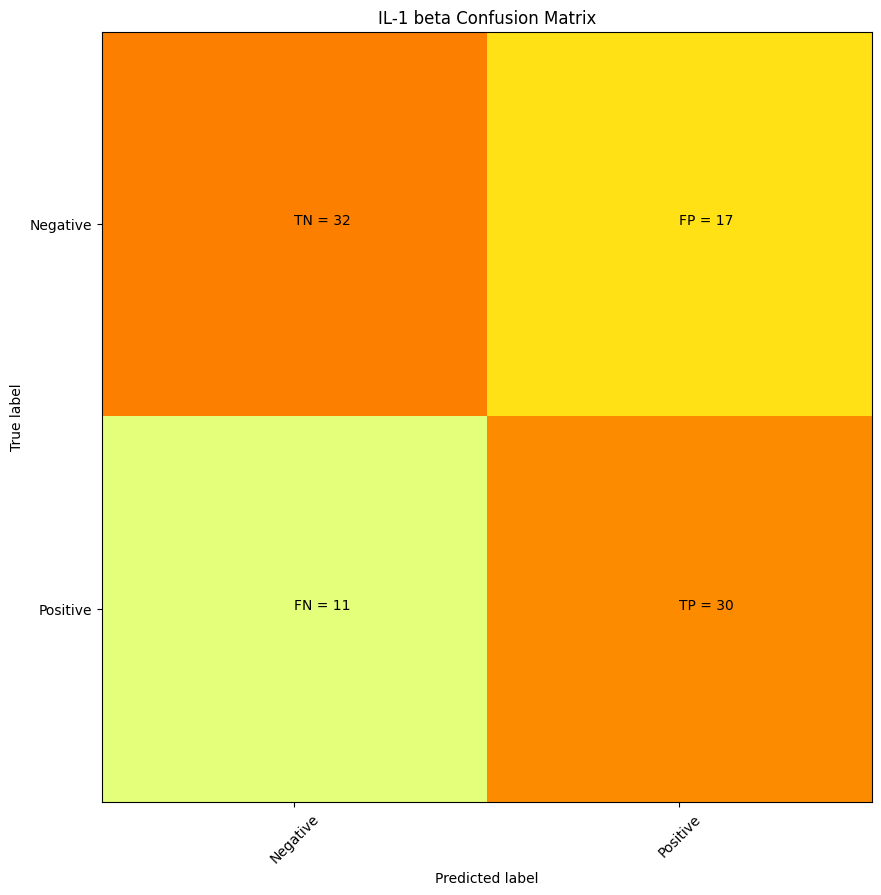

     IL-1 beta
0            1
1            1
2            1
3            1
4            1
5            1
6            1
7            1
8            1
9            1
10           1
11           1
12           1
13           1
14           1
15           1
16           1
17           1
18           1
19           1
20           1
21           1
22           1
23           1
24           1
25           1
26           1
27           1
28           1
29           1
30           1
31           1
32           1
33           1
34           1
35           1
36           1
37           1
38           1
39           1
40           1
41           1
42           1
43           1
44           1
45           1
46           1
47           1
48           1
49           1
50           1
51           1
52           1
53           1
54           1
55           1
56           1
57           1
58           1
59           1
60           1
61           1
62           1
63           1
64           1
65        

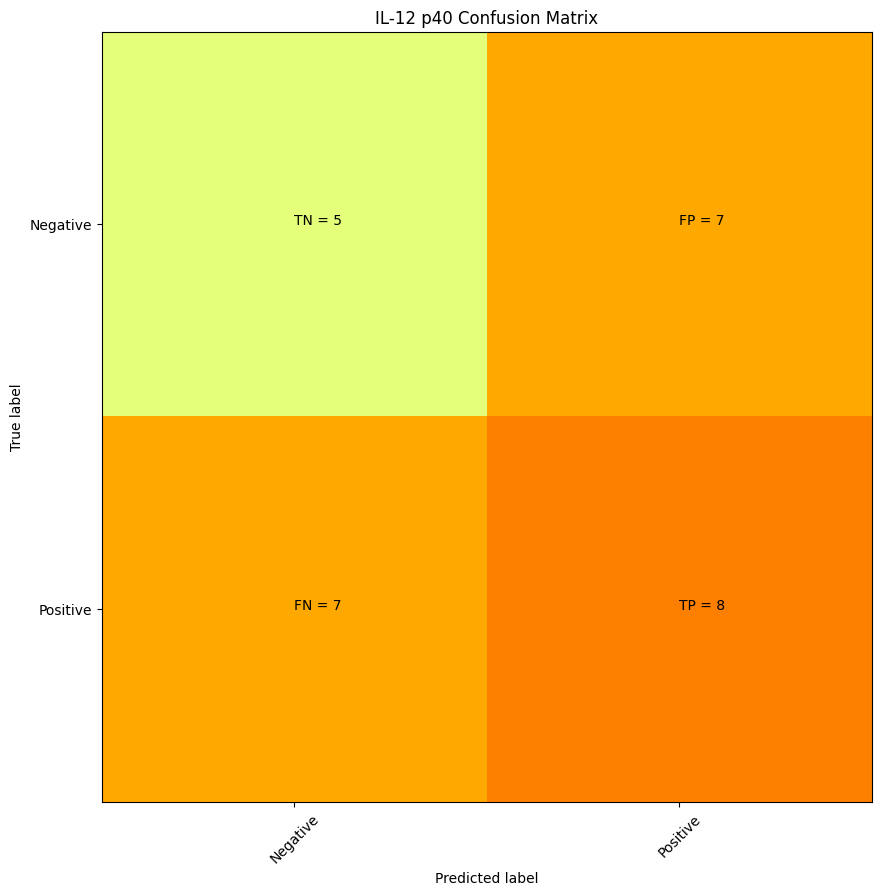

    IL-12 p40
0           1
1           1
2           1
3           1
4           1
5           1
6           1
7           1
8           1
9           1
10          1
11          1
12          1
13          1
14          1
15          1
16          1
17          1
18          1
19          1
20          1
21          1
22          1
23          1
24          1
25          1
26          1
27          0
28          0
29          0
30          0
31          0
32          0
33          0
34          0
35          0
36          0
37          0
38          0
39          0
40          0
41          0
42          0
43          0
44          0
45          0
46          0
47          0
48          0
49          0
50          0
51          0
52          0
53          0 precision = 0.5333333333333333 recall = 0.5333333333333333


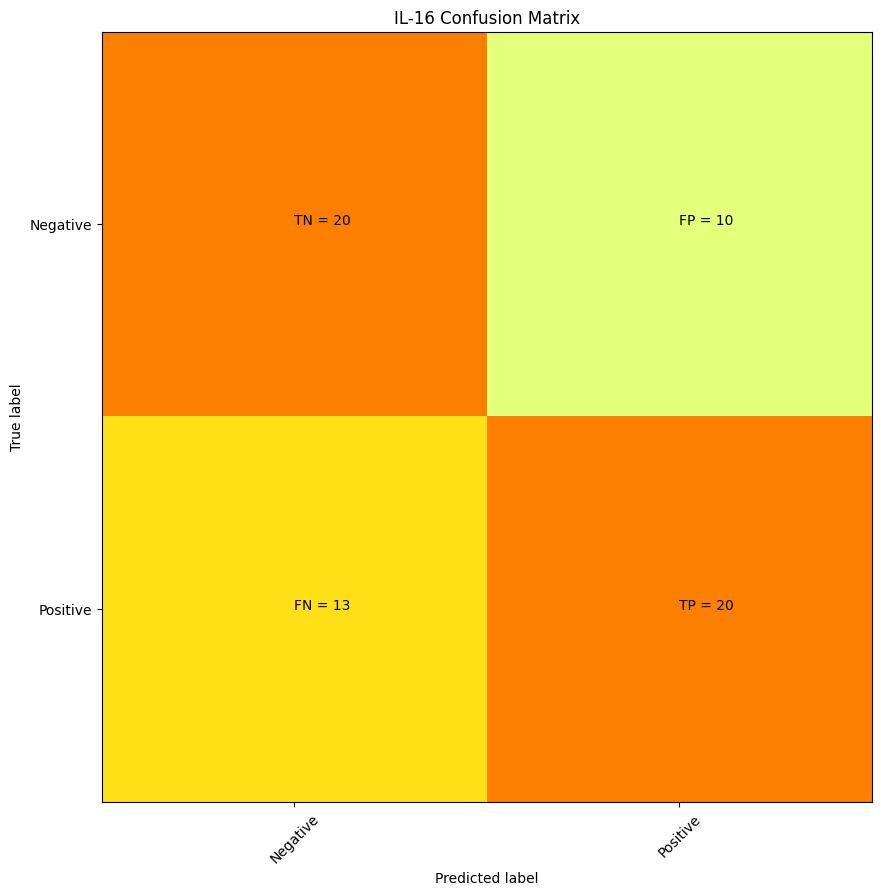

     IL-16
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
26       1
27       1
28       1
29       1
30       1
31       1
32       1
33       1
34       1
35       1
36       1
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       1
45       1
46       1
47       1
48       1
49       1
50       1
51       1
52       1
53       1
54       1
55       1
56       1
57       1
58       1
59       1
60       1
61       1
62       1
63       0
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0

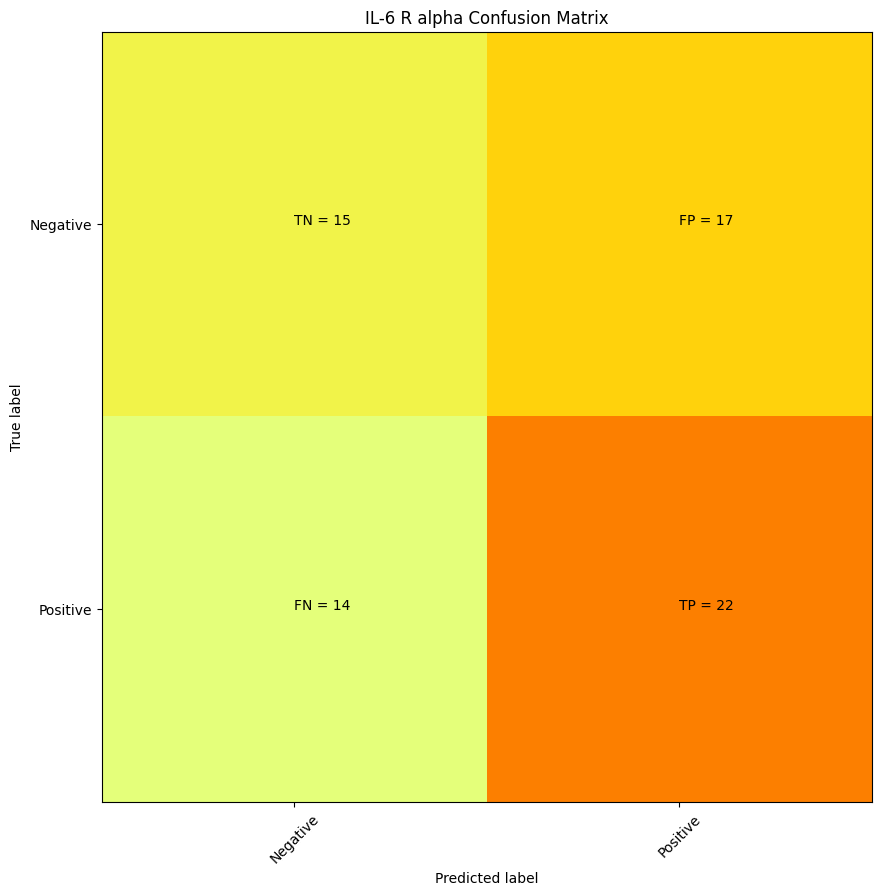

     IL-6 R alpha
0               1
1               1
2               1
3               1
4               1
5               1
6               1
7               1
8               1
9               1
10              1
11              1
12              1
13              1
14              1
15              1
16              1
17              1
18              1
19              1
20              1
21              1
22              1
23              1
24              1
25              1
26              1
27              1
28              1
29              1
30              1
31              1
32              1
33              1
34              1
35              1
36              1
37              1
38              1
39              1
40              1
41              1
42              1
43              1
44              1
45              1
46              1
47              1
48              1
49              1
50              1
51              1
52              1
53              1
54        

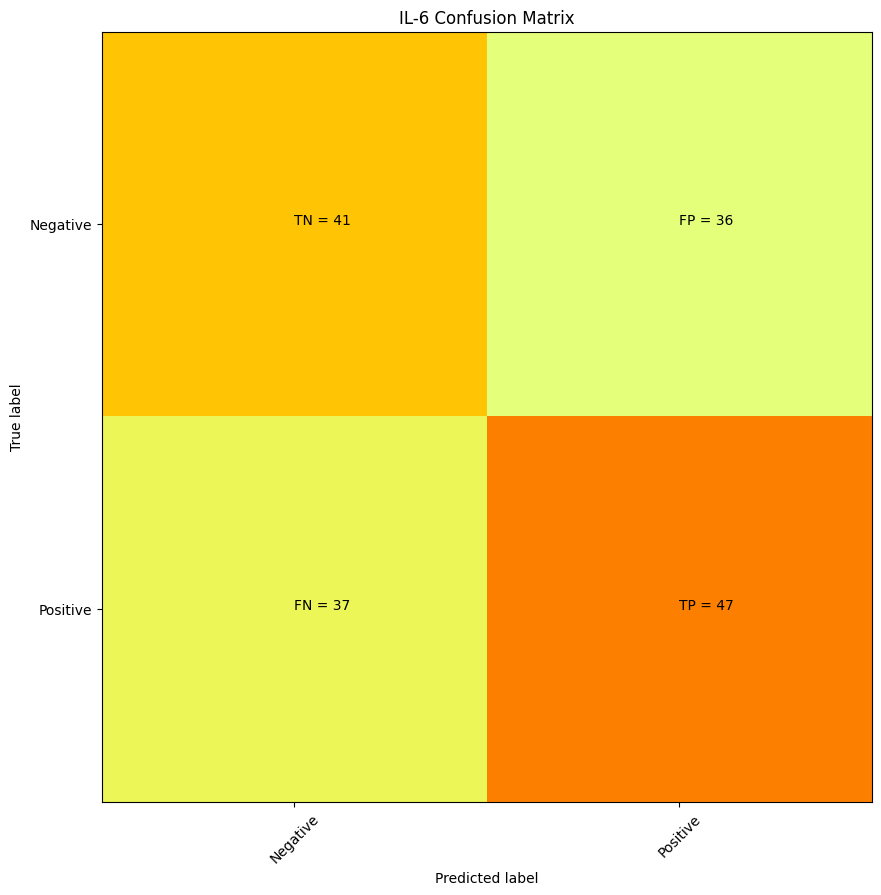

     IL-6
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      1
64      1
65      1
66      1
67      1
68      1
69      1
70      1
71      1
72      1
73      1
74      1
75      1
76      1
77      1
78      1
79      1
80      1
81      1
82      1
83      1
84      1
85      1
86      1
87      1
88      1
89      1
90      1
91      1
92      1
93      1
94      1
95      1
96      1
97      1
98      1


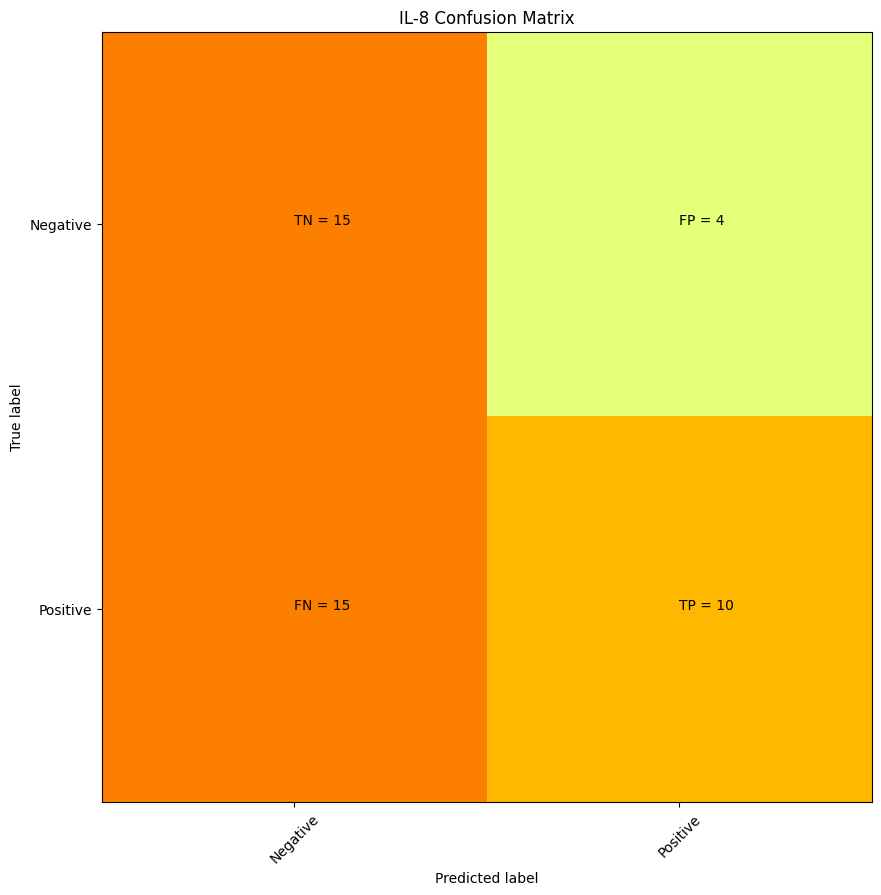

    IL-8
0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     1
38     1
39     1
40     1
41     1
42     1
43     1
44     0
45     0
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0 precision = 0.7142857142857143 recall = 0.4


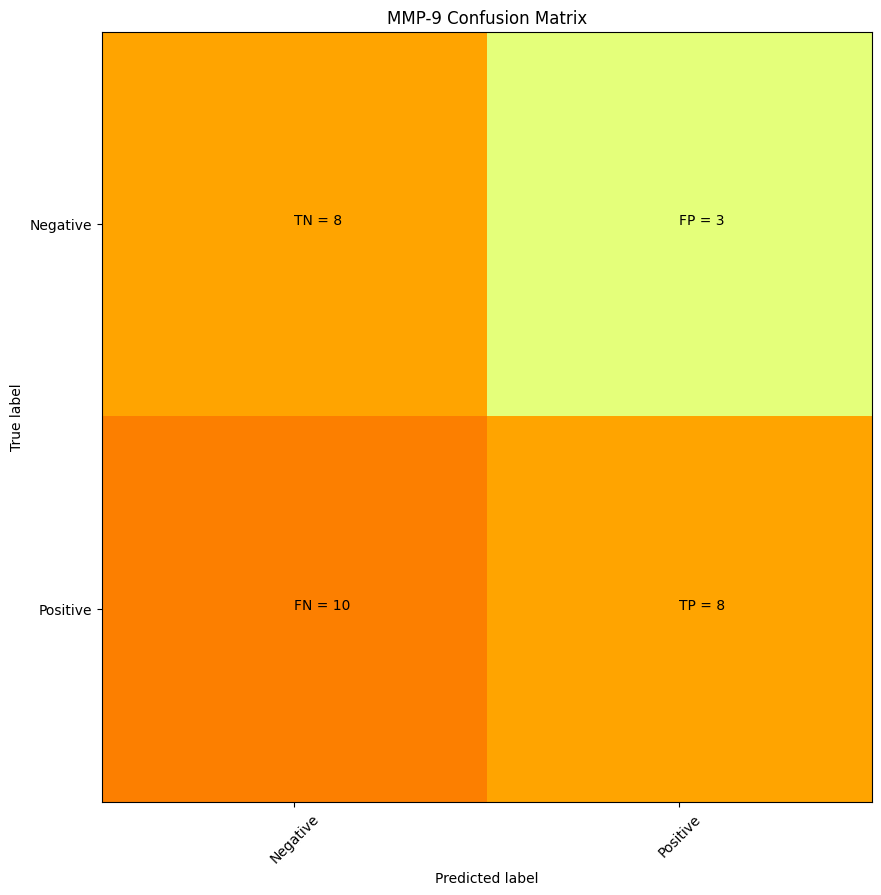

    MMP-9
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0 precision = 0.7272727272727273 recall = 0.4444444444444444


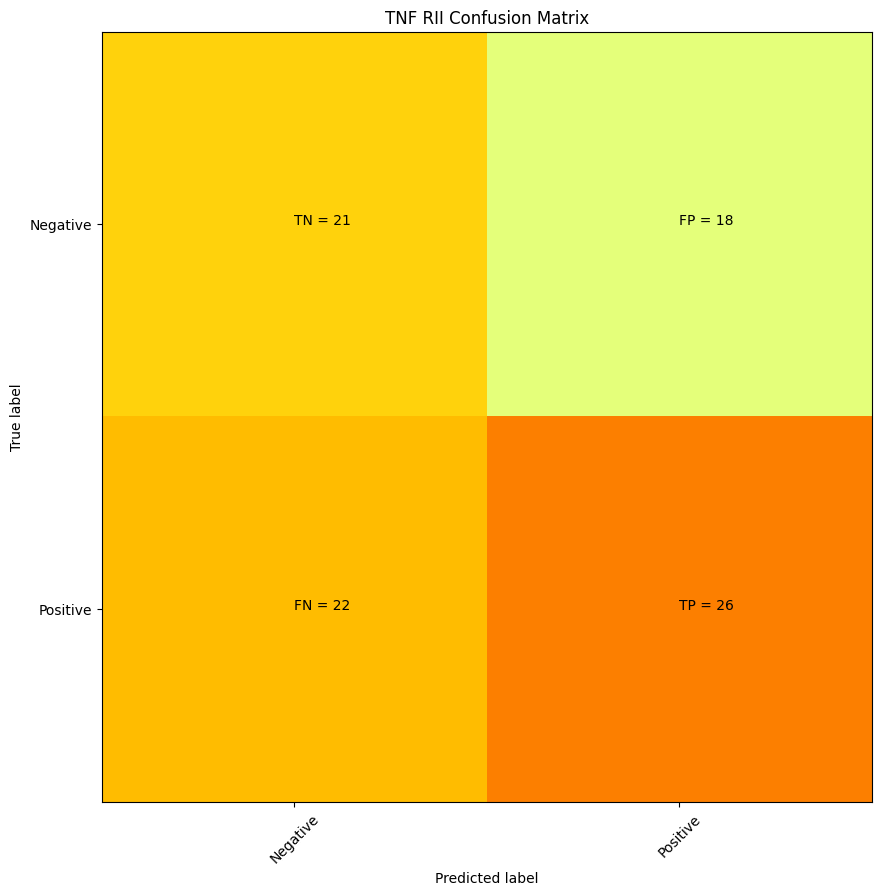

     TNF RII
0          1
1          1
2          1
3          1
4          1
5          1
6          1
7          1
8          1
9          1
10         1
11         1
12         1
13         1
14         1
15         1
16         1
17         1
18         1
19         1
20         1
21         1
22         1
23         1
24         1
25         1
26         1
27         1
28         1
29         1
30         1
31         1
32         1
33         1
34         1
35         1
36         1
37         1
38         1
39         1
40         1
41         1
42         1
43         1
44         1
45         1
46         1
47         1
48         1
49         1
50         1
51         1
52         1
53         1
54         1
55         1
56         1
57         1
58         1
59         1
60         1
61         1
62         1
63         1
64         1
65         1
66         1
67         1
68         1
69         1
70         1
71         1
72         1
73         1
74         1
75         1

In [144]:
summarizing = []
summarizer_PCA = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in PCAs:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(df.index)])
        summarizer_PCA = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_PCA['Precision'] = summarizer_PCA['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])
        


In [145]:
summarizer_PCA

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.809524,0.586207,10,94
1,CCL1,0.375000,0.360000,10,92
2,CCL19,0.600000,0.428571,10,24
3,CCL2,0.681818,0.652174,10,190
4,CCL20,0.631579,0.750000,10,60
5,CCL22,0.573333,0.641791,10,250
6,CCL4,0.538462,0.608696,10,92
7,CCL5,0.579710,0.645161,10,266
8,CD14,0.600000,0.724138,10,122
9,CRP,0.521739,0.615385,10,172


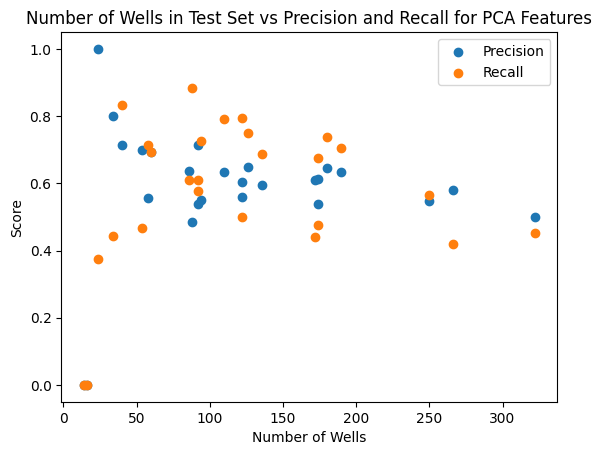

In [98]:
#Basically no trend, good news
plt.scatter(y=summarizer_PCA["Precision"], x = summarizer_PCA["Wells in Set"])
plt.scatter(y=summarizer_PCA["Recall"], x = summarizer_PCA["Wells in Set"])
plt.xlabel("Number of Wells")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for PCA Features")
plt.show()

# Final Results - Overall summary of different feature selection methods

In [105]:
#Let's now compare the final results to make a decision about how many cytokines are predictable and which 
#feature selection methods are most succesful. 
#These lists will be handy.

summarizer_list = [summarizer_PCA,
summarizer_seqtree,
summarizer_treepicks,
summarizer_l1s,
summarizer_rfefs,
summarizer_univariates,
summarizer_variance]


summarizer_list_string = ["summarizer_PCA",
"summarizer_seqtree",
"summarizer_treepicks",
"summarizer_l1s",
"summarizer_rfefs",
"summarizer_univariates",
"summarizer_variance"]

In [146]:
# I will consider performance above 0.65 for precision and recall as "predictable"
review=[]
for item in summarizer_list:
#     for string in summarizer_list_string:
#         print(string)
    item2 = item.sort_values(by=["Precision", "Recall"],ascending=False)
    item2 = item2[item2["Precision"]>0.65]
    item2 = item2[item2["Recall"]>0.65]
    itemsorted=pd.DataFrame(item2)
#     print(itemsorted)
    review.append(["number predictable cytokines", len(itemsorted), itemsorted])


for i in range(len(summarizer_list_string)):
    print(summarizer_list_string[i])
    print(review[i])

summarizer_PCA
['number predictable cytokines', 2,    Cytokine  Precision    Recall  Number of Features  Wells in Set
15    G-CSF   0.714286  0.833333                  10            40
4     CCL20   0.692308  0.692308                  10            60]
summarizer_seqtree
['number predictable cytokines', 8,         Cytokine  Precision    Recall  Number of Features  Wells in Set
16        GM-CSF   1.000000  1.000000                   9             8
4          CCL20   0.846154  0.733333                   9            30
19     IL-12 p40   0.846154  0.687500                   9            27
18     IL-1 beta   0.800000  0.851064                   9            90
20         IL-16   0.742857  0.722222                   9            63
15         G-CSF   0.714286  1.000000                   9            20
1           CCL1   0.714286  0.681818                  10            46
21  IL-6 R alpha   0.657143  0.696970                   9            68]
summarizer_treepicks
['number predictable c

In [129]:
# Count how many feature selection methods work for each cytokine

# Looks like GM-CSF, G-CSF, IL-1 beta, IL-1 alpha, and IL-16 are predictable unde rmanmy feature selection methods



result_list = []

for i in range(len(review)):
    cytos = review[i][2].iloc[:,:1].values
    for j in range(len(cytos)):
#         print(cytos[j][0])
        result_list.append(cytos[j][0])
    

# result_list

pd.Series(result_list).value_counts()

G-CSF           6
IL-1 beta       6
IL-16           5
CCL20           5
GM-CSF          4
CCL1            4
CD14            3
CCL19           3
CXCL10          3
IL-1 alpha      2
Activin A       2
IL-6 R alpha    2
CCL2            1
IL-12 p40       1
CRP             1
MMP-9           1
IL-8            1
CXCL5           1
Name: count, dtype: int64

In [160]:
hello = pd.DataFrame(data = pd.Series(result_list).value_counts())
# hello.transpose()
hello

,count
G-CSF,6
IL-1 beta,6
IL-16,5
CCL20,5
GM-CSF,4
CCL1,4
CD14,3
CCL19,3
CXCL10,3
IL-1 alpha,2


In [152]:
method_list_string = ["PCA",
"seqtree",
"treepicks",
"l1s",
"rfefs",
"univariates",
"variance"]





overall = pd.DataFrame(columns = ["Method","Number of Predictable Cytos","Average Precision", "Average Recall"])
logger = []
for i in range(len(review)):
    average_precision = review[i][2].iloc[:,1:2].values.mean()
    average_recall = review[i][2].iloc[:,2:3].values.mean()
    mean_avg_re = (average_precision+average_recall)/2
    average_F1 = (2*average_precision*average_recall)/(average_precision+average_recall)
    number_of_cytos = len(review[i][2].iloc[:,1:2])
    method = method_list_string[i]
    logger.append([method, number_of_cytos, average_precision, average_recall, average_F1])
    overall = pd.DataFrame(logger, columns = ["Method","Number of Predictable Cytos","Average Precision", "Average Recall", "Average F1"])
overall

,Method,Number of Predictable Cytos,Average Precision,Average Recall,Average F1
0,PCA,2,0.703297,0.762821,0.731850
1,seqtree,8,0.790110,0.796613,0.793348
2,treepicks,7,0.780764,0.770730,0.775715
3,l1s,9,0.770493,0.745404,0.757741
4,rfefs,10,0.755663,0.775987,0.765690
5,univariates,8,0.748141,0.816776,0.780954
6,variance,7,0.793853,0.736710,0.764215


# Effect of Model Complexity with PCA features only

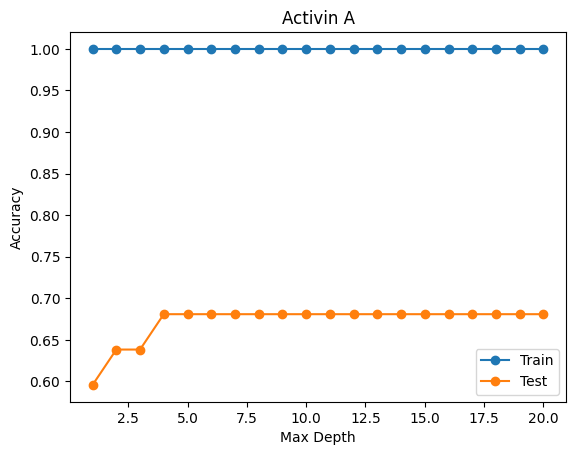

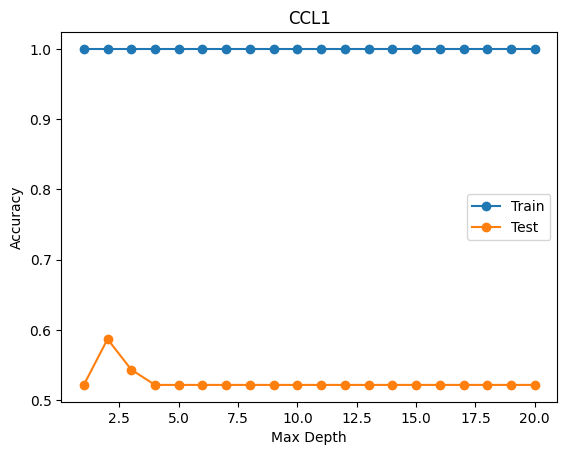

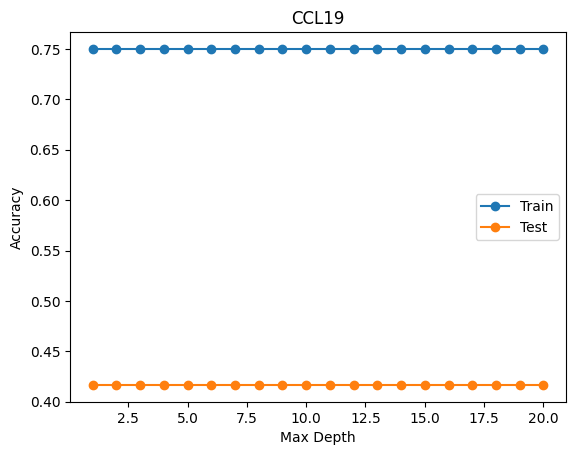

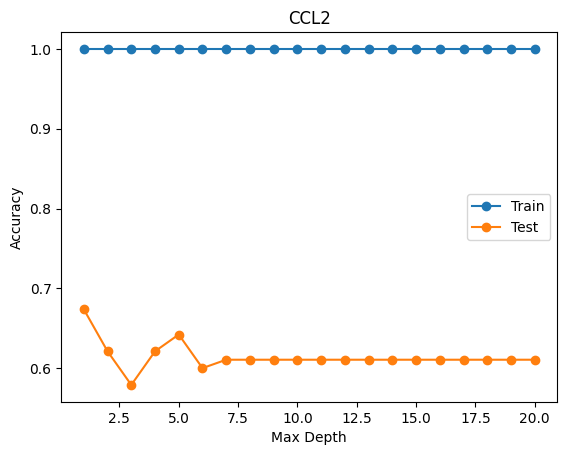

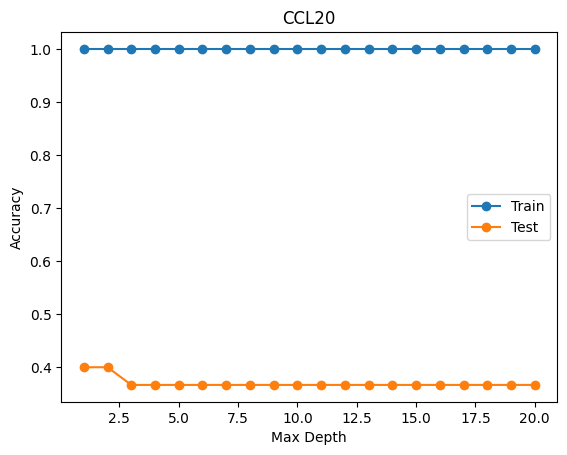

...

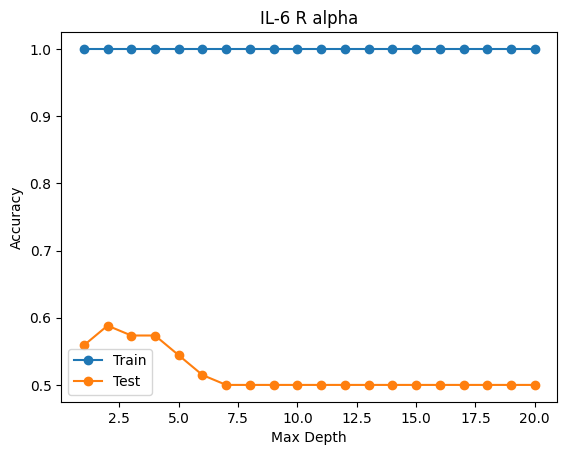

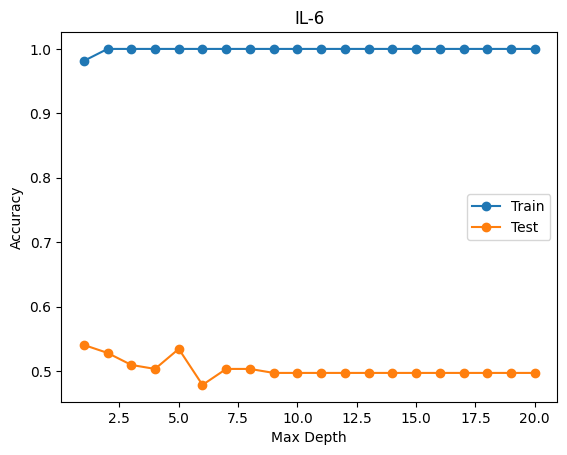

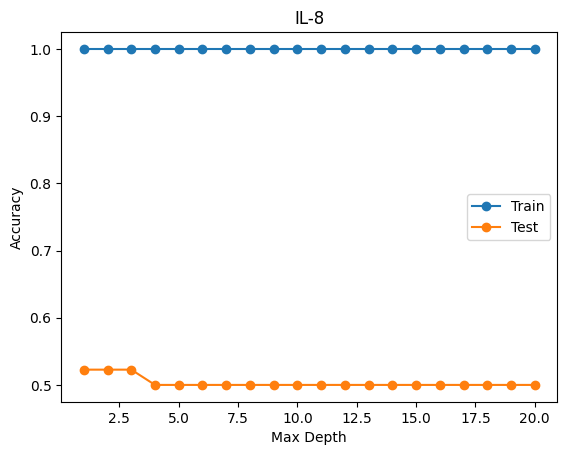

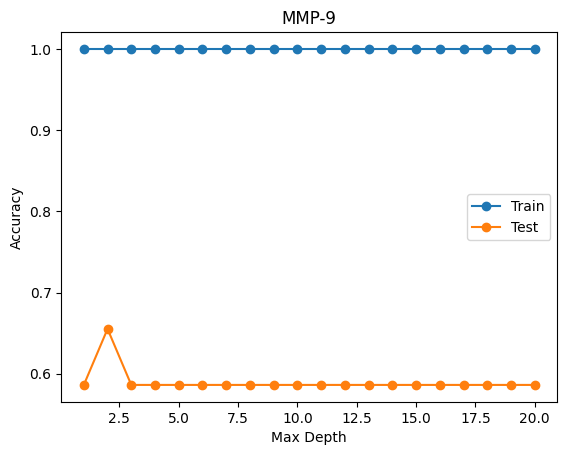

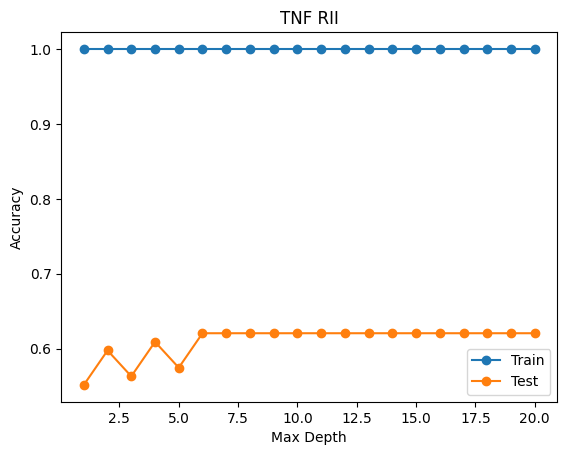

In [82]:
#As the tree becomes deeper, it is more complex. 
#It is likely that a pretty shallow tree will do, since we only have 10 PCA features. 

# We will enumerate each tree depth, fit a tree with a given depth on the training dataset, 
#then evaluate the tree on both the train and test sets.

# I expect that as the depth of the tree increases, 
#performance on train and test will improve to a point, and as the tree gets too deep, 
#it will begin to overfit the training dataset at the expense of worse performance on the holdout test set.



# define the tree depths to evaluate
values = [i for i in range(1, 21)]

for i in range(len(PCAs)):
    df = PCAs[i]
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    train_scores = []
    test_scores = []
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.5)
    for i in values:
         # configure the model
         model = XGBClassifier(n_estimators=100, max_depth=i, learning_rate=1, objective='binary:logistic')
         # fit model on the training dataset
         model.fit(X_train, y_train)
         # evaluate on the train dataset
         train_yhat = model.predict(X_train)
         train_acc = accuracy_score(y_train, train_yhat)
         train_scores.append(train_acc)
         # evaluate on the test dataset
         test_yhat = model.predict(X_test)
         test_acc = accuracy_score(y_test, test_yhat)
         test_scores.append(test_acc)
         # summarize progress
#          print('>%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
    # plot of train and test scores vs tree depth
    plt.plot(values, train_scores, '-o', label='Train')
    plt.plot(values, test_scores, '-o', label='Test')
    plt.legend()
    plt.title(df.columns[0])
    plt.xlabel("Max Depth")
    plt.ylabel("Accuracy")
    plt.show()
        
    
        
           

It is true that we do not need much depth at all.
For the cytokines that aren't completely flat have the best accuracy around depth 3.

# Overfitting examination with PCA features only

In [127]:
#first, just verify some code to make sure we can get metrics per epoch our of our PCA data

#looks good

for i in range(len(PCAs)):
    df = PCAs[i]
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    train_scores = []
    test_scores = []
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.5)
    eval_set = [(X_train, y_train), (X_test, y_test)]
    for i in values:
         # configure the model
         model = XGBClassifier(n_estimators=100, max_depth=i, learning_rate=0.01, objective='binary:logistic')
         # fit model on the training dataset
         model.fit(X_train, y_train,eval_metric="rmse", eval_set = eval_set, verbose = True)
         # evaluate on the train dataset
         train_yhat = model.predict(X_train)
         train_acc = accuracy_score(y_train, train_yhat)
         train_scores.append(train_acc)
         # evaluate on the test dataset
         test_yhat = model.predict(X_test)
         test_acc = accuracy_score(y_test, test_yhat)
         test_scores.append(test_acc)
         # summarize progress

[0]	validation_0-rmse:0.49896	validation_1-rmse:0.49918
[1]	validation_0-rmse:0.49793	validation_1-rmse:0.49837
[2]	validation_0-rmse:0.49692	validation_1-rmse:0.49757
[3]	validation_0-rmse:0.49592	validation_1-rmse:0.49679
[4]	validation_0-rmse:0.49494	validation_1-rmse:0.49603
[5]	validation_0-rmse:0.49398	validation_1-rmse:0.49527
[6]	validation_0-rmse:0.49302	validation_1-rmse:0.49453
[7]	validation_0-rmse:0.49209	validation_1-rmse:0.49381
[8]	validation_0-rmse:0.49116	validation_1-rmse:0.49310
[9]	validation_0-rmse:0.49025	validation_1-rmse:0.49240
[10]	validation_0-rmse:0.48936	validation_1-rmse:0.49171
[11]	validation_0-rmse:0.48848	validation_1-rmse:0.49104
[12]	validation_0-rmse:0.48761	validation_1-rmse:0.49037
[13]	validation_0-rmse:0.48676	validation_1-rmse:0.48972
[14]	validation_0-rmse:0.48591	validation_1-rmse:0.48909
[15]	validation_0-rmse:0.48509	validation_1-rmse:0.48846
[16]	validation_0-rmse:0.48427	validation_1-rmse:0.48785
[17]	validation_0-rmse:0.48347	validation

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



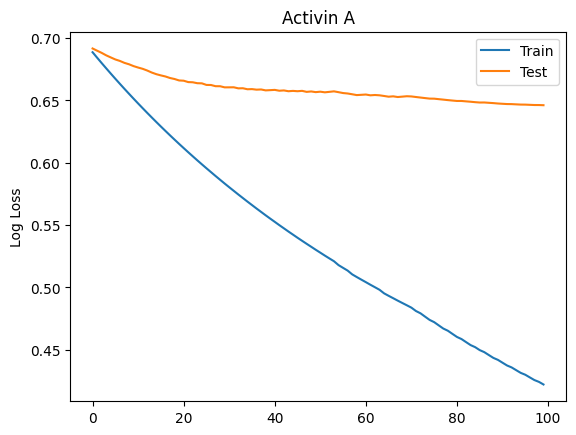

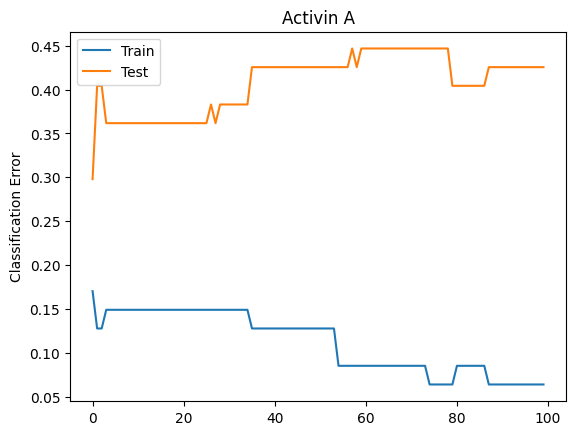

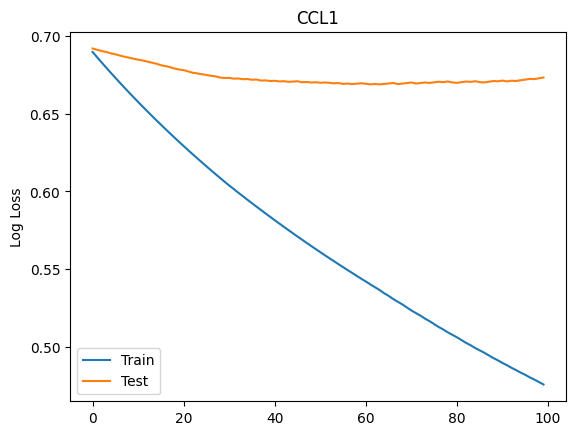

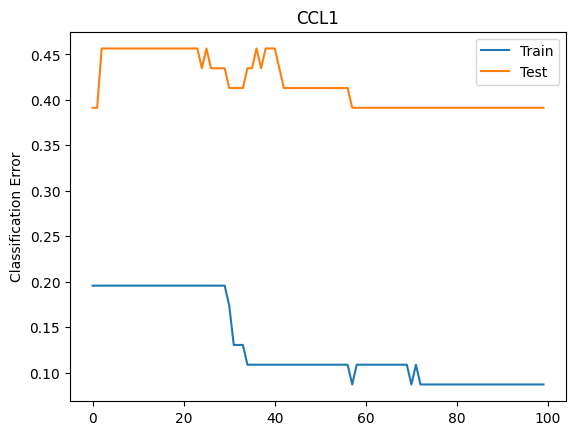

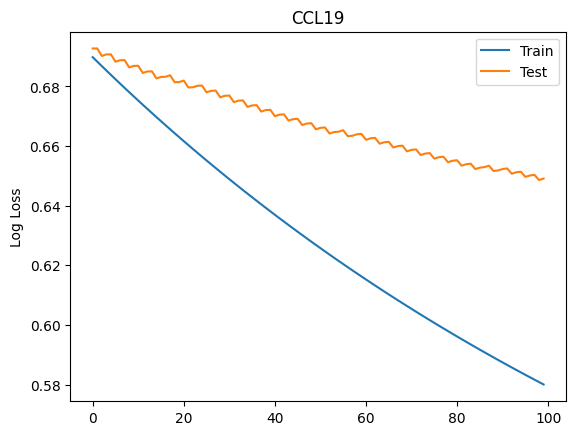

...

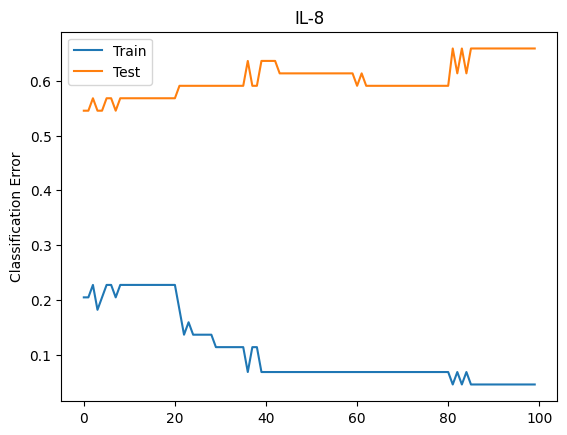

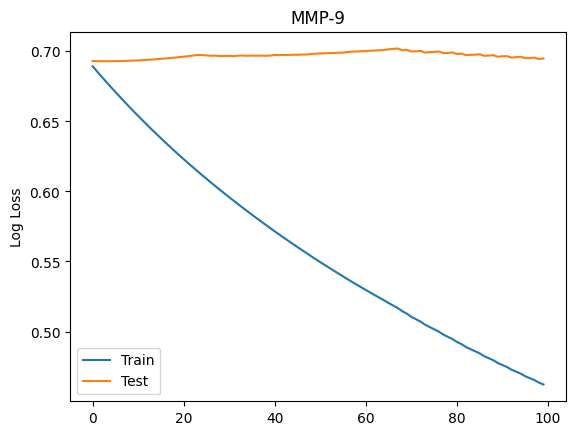

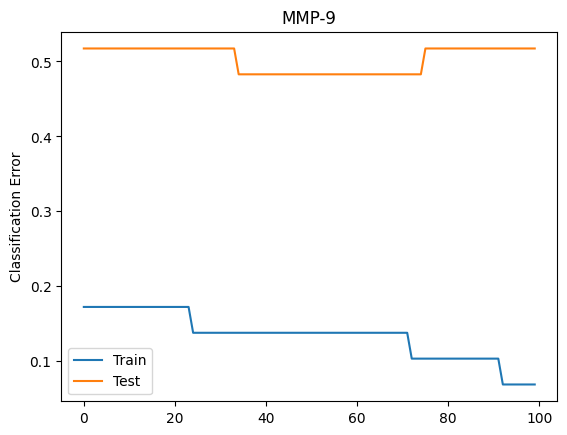

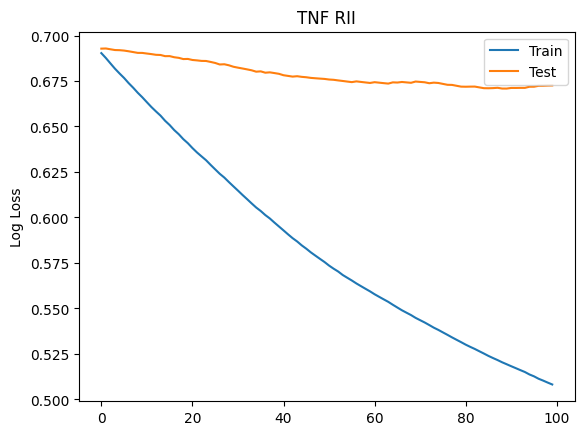

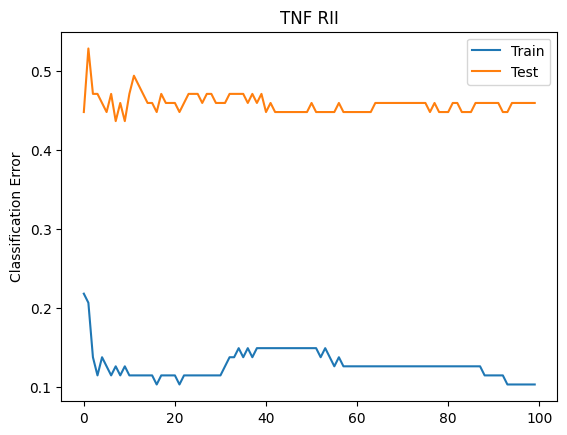

In [100]:
#These graphs show the performance at each epoch so we can figure out where to early stop to avoid overfitting
#Let's take a look at the logloss and error metrics over each epoch and see if we can tell a good place to stop

for i in range(len(PCAs)):
    df = PCAs[i]
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    train_scores = []
    test_scores = []
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.5)
    eval_set = [(X_train, y_train), (X_test, y_test)]
     # configure the model
    model = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.01, objective='binary:logistic')
     # fit model on the training dataset
    model.fit(X_train, y_train, eval_metric=["error", "logloss"], eval_set = eval_set, verbose = False)
#         model.fit(X_train, y_train, eval_metric=["error", "logloss"], eval_set = eval_set, verbose = True)
     # evaluate on the train dataset
    train_yhat = model.predict(X_train)
    train_acc = accuracy_score(y_train, train_yhat)
    train_scores.append(train_acc)
     # evaluate on the test dataset
    test_yhat = model.predict(X_test)
    test_acc = accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
     # summarize progress
     # retrieve performance metrics
    results = model.evals_result()
    epochs = len(results['validation_0']['error'])
    x_axis = range(0, epochs)
    # plot log loss
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
    ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
    ax.legend()
    plt.ylabel('Log Loss')
    plt.title(df.columns[0])
#     plt.title(df.columns[0],'XGBoost Log Loss')
    plt.show()
    # plot classification error
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['error'], label='Train')
    ax.plot(x_axis, results['validation_1']['error'], label='Test')
    ax.legend()
    plt.ylabel('Classification Error')
    plt.title(df.columns[0])
#     plt.title(df.columns[0],'XGBoost Classification Error')
    plt.show()
        

In [ ]:
# The result here is that there will not be a clear early stopping point that would be beneficial for all cytokines.
# Each cytokine model would need to be optimized individually.
#That is enough of a result for this project, since we were just looking for a proof-of-concept that any
#cytokine might be predcitable from embeddings.
#In a follow-up project, each model could be optimized.

# Model complexity with just rfef features

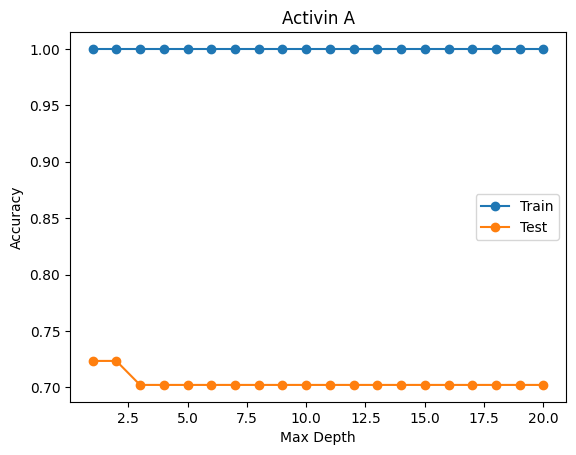

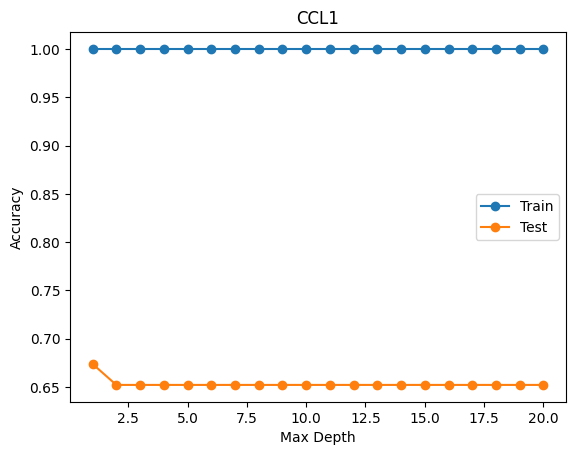

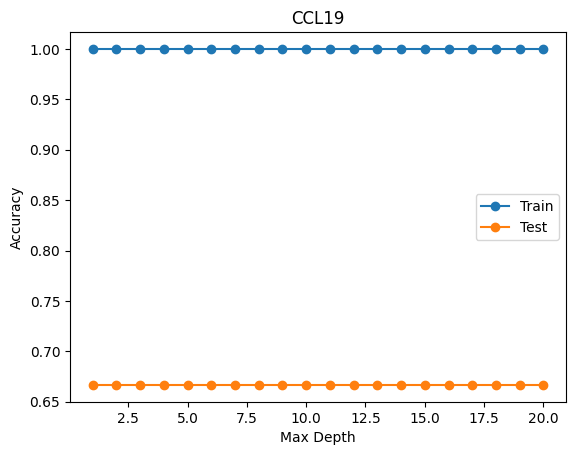

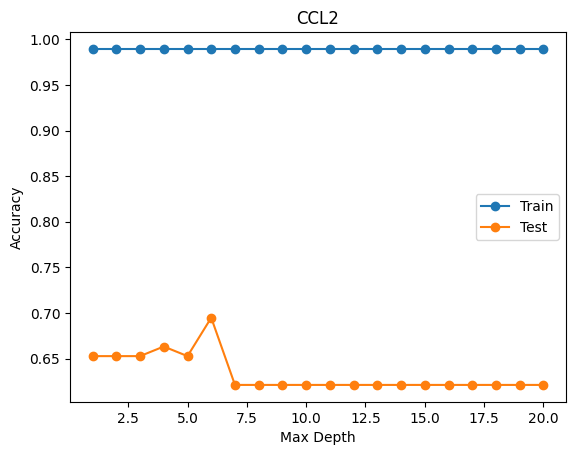

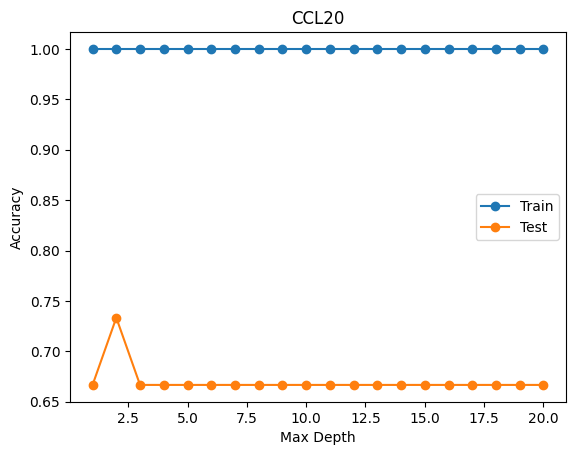

...

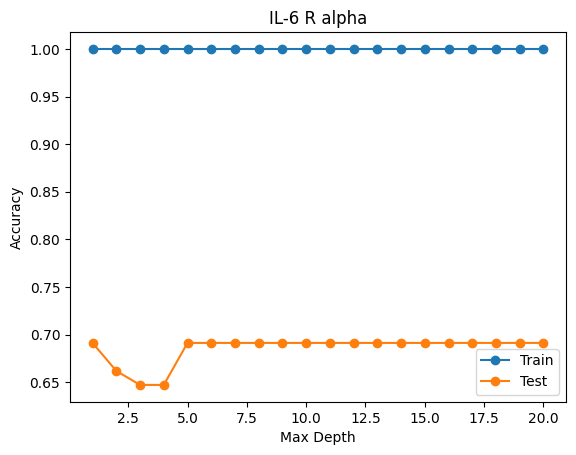

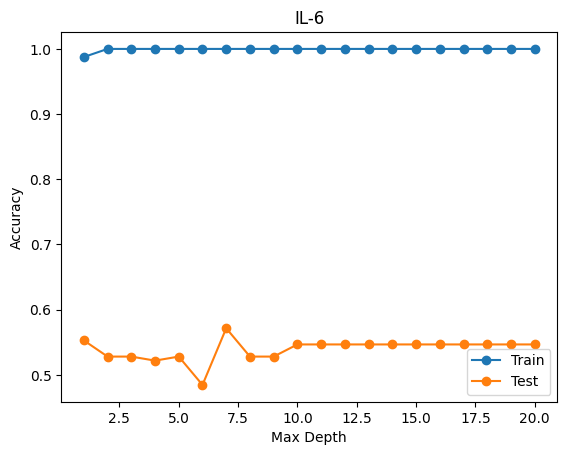

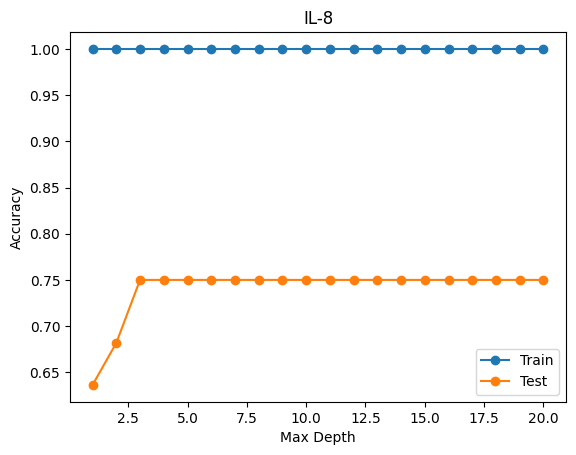

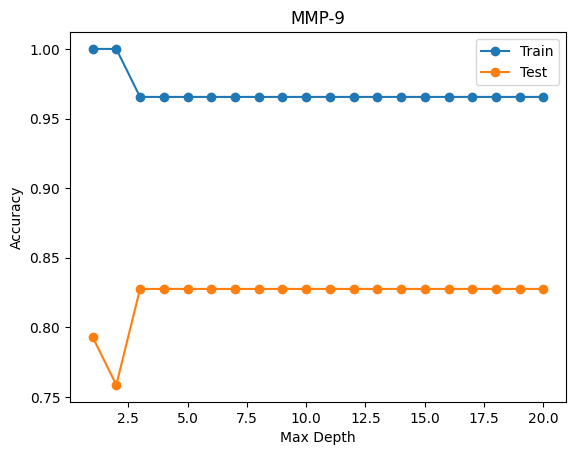

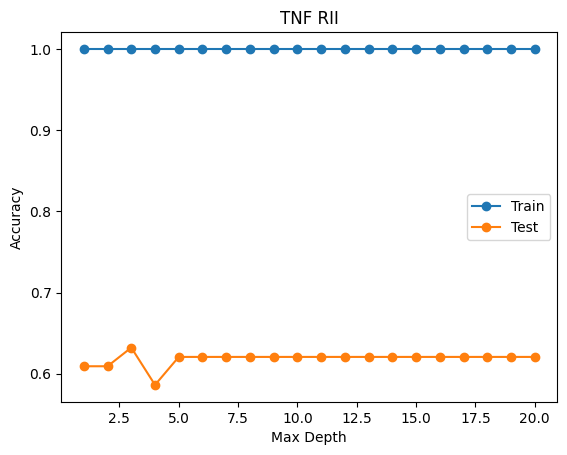

In [158]:
#As the tree becomes deeper, it is more complex. 
#It is likely that a pretty shallow tree will do, since we only have 10 PCA features. 

# We will enumerate each tree depth, fit a tree with a given depth on the training dataset, 
#then evaluate the tree on both the train and test sets.

# I expect that as the depth of the tree increases, 
#performance on train and test will improve to a point, and as the tree gets too deep, 
#it will begin to overfit the training dataset at the expense of worse performance on the holdout test set.



# define the tree depths to evaluate
values = [i for i in range(1, 21)]

for i in range(len(rfefs_listing)):
    df = rfefs_listing[i]
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    train_scores = []
    test_scores = []
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.5)
    for i in values:
         # configure the model
         model = XGBClassifier(n_estimators=100, max_depth=i, learning_rate=1, objective='binary:logistic')
         # fit model on the training dataset
         model.fit(X_train, y_train)
         # evaluate on the train dataset
         train_yhat = model.predict(X_train)
         train_acc = accuracy_score(y_train, train_yhat)
         train_scores.append(train_acc)
         # evaluate on the test dataset
         test_yhat = model.predict(X_test)
         test_acc = accuracy_score(y_test, test_yhat)
         test_scores.append(test_acc)
         # summarize progress
#          print('>%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
    # plot of train and test scores vs tree depth
    plt.plot(values, train_scores, '-o', label='Train')
    plt.plot(values, test_scores, '-o', label='Test')
    plt.legend()
    plt.title(df.columns[0])
    plt.xlabel("Max Depth")
    plt.ylabel("Accuracy")
    plt.show()
        

# overfitting with just rfef features

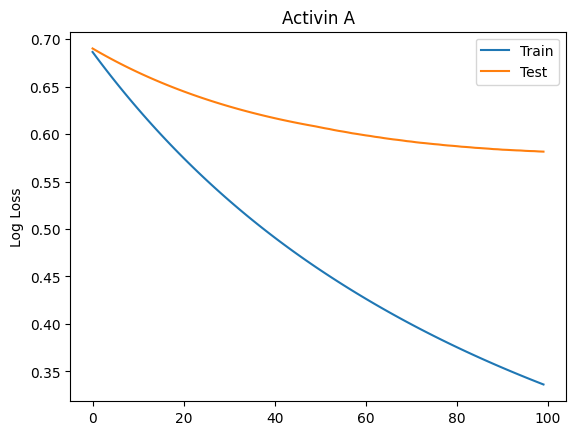

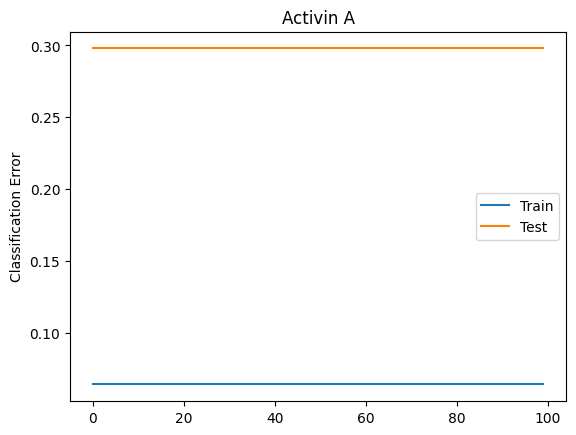

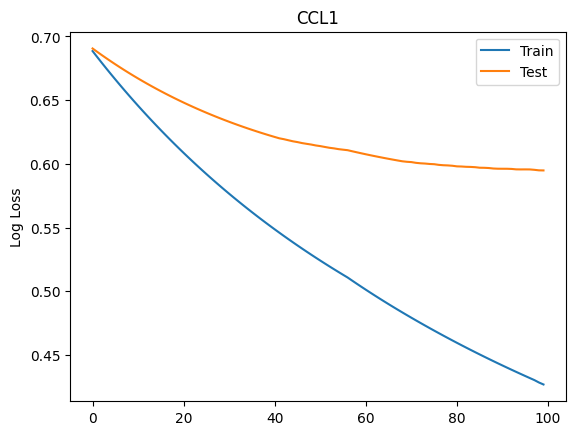

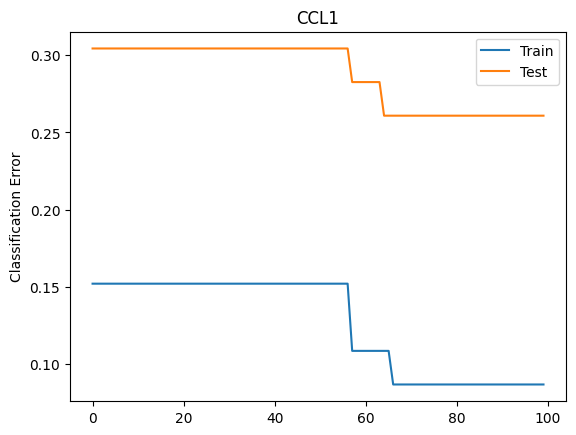

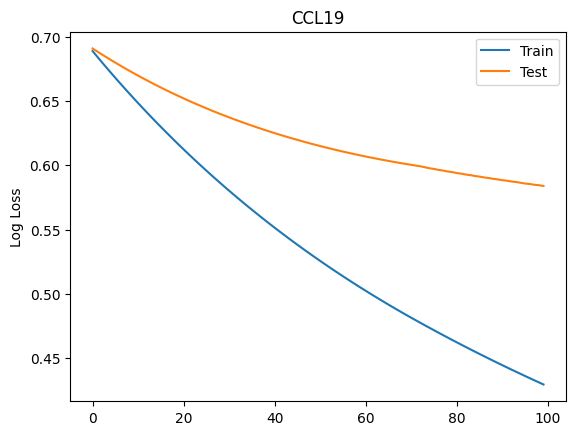

...

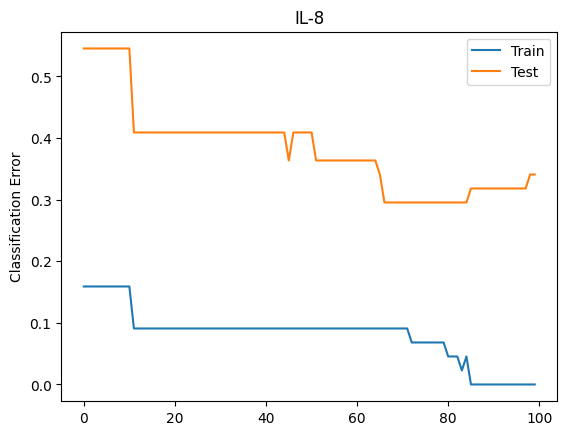

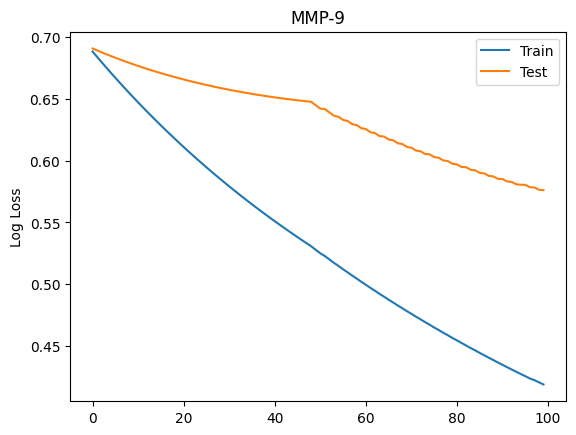

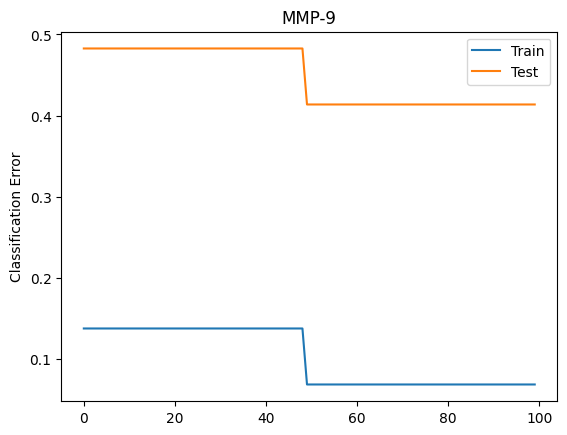

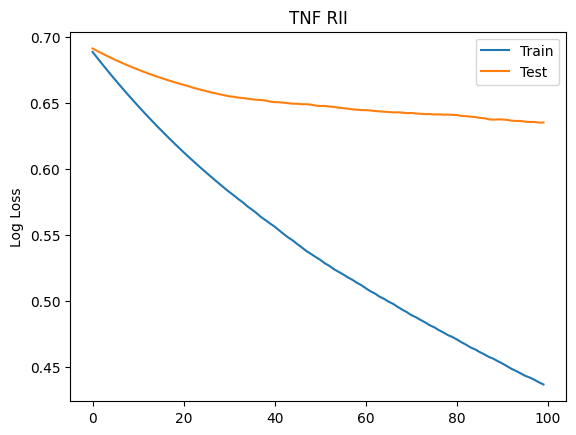

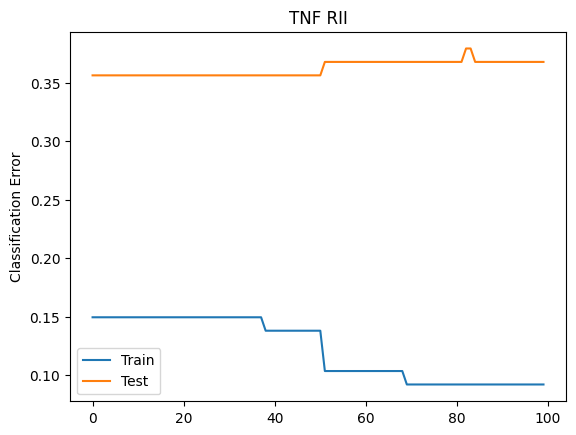

In [159]:
#These graphs show the performance at each epoch so we can figure out where to early stop to avoid overfitting
#Let's take a look at the logloss and error metrics over each epoch and see if we can tell a good place to stop

for i in range(len(rfefs_listing)):
    df = rfefs_listing[i]
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    train_scores = []
    test_scores = []
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.5)
    eval_set = [(X_train, y_train), (X_test, y_test)]
     # configure the model
    model = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.01, objective='binary:logistic')
     # fit model on the training dataset
    model.fit(X_train, y_train, eval_metric=["error", "logloss"], eval_set = eval_set, verbose = False)
#         model.fit(X_train, y_train, eval_metric=["error", "logloss"], eval_set = eval_set, verbose = True)
     # evaluate on the train dataset
    train_yhat = model.predict(X_train)
    train_acc = accuracy_score(y_train, train_yhat)
    train_scores.append(train_acc)
     # evaluate on the test dataset
    test_yhat = model.predict(X_test)
    test_acc = accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
     # summarize progress
     # retrieve performance metrics
    results = model.evals_result()
    epochs = len(results['validation_0']['error'])
    x_axis = range(0, epochs)
    # plot log loss
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
    ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
    ax.legend()
    plt.ylabel('Log Loss')
    plt.title(df.columns[0])
#     plt.title(df.columns[0],'XGBoost Log Loss')
    plt.show()
    # plot classification error
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['error'], label='Train')
    ax.plot(x_axis, results['validation_1']['error'], label='Test')
    ax.legend()
    plt.ylabel('Classification Error')
    plt.title(df.columns[0])
#     plt.title(df.columns[0],'XGBoost Classification Error')
    plt.show()